# Symmetry Detector for Databases

## Libaries

In [9]:
#Importar Librerías
 
from IPython.core.display import display, HTML, clear_output
display(HTML("<style>.container { width:100% !important; } div.cell.selected {border-left-width: 10px !important;}</style>"))
import os
import shutil
import random
import glob
from sympy import *
import os
import datetime
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import itertools as it
from PIL import Image
from IPython.display import clear_output
import random
if not 'notebook_dir' in globals():
    notebook_dir = os.getcwd()
print('Notebook directory: ' + notebook_dir)
os.chdir(notebook_dir)  # If you change the current working dir, this will take you back to the workbook dir.
top_dir = notebook_dir
from fastai.tabular.all import *
from skimage import data
from skimage.filters import threshold_multiotsu
import inspect
from sklearn.manifold import TSNE
from sklearn import decomposition
#from sklearn.preprocessing import scaled
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
import more_itertools
from sklearn.manifold import TSNE
import cv2
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import imutils
#from time import time
from featurewiz import featurewiz
import time
from zipfile import ZipFile
from io import BytesIO
import urllib.request as urllib2
from urllib.error import HTTPError
#init_printing() # Numeros más bonitos
import phik
from phik import resources, report



class SaveModelCallback(TrackerCallback):
    "A `TrackerCallback` that saves the model's best during training and loads it at the end."
    _only_train_loop = True
    def __init__(self, monitor='valid_loss', comp=None, min_delta=0., fname='model', every_epoch=False, at_end=False,
                 with_opt=False, reset_on_fit=True):
        super().__init__(monitor=monitor, comp=comp, min_delta=min_delta, reset_on_fit=reset_on_fit)
        assert not (every_epoch and at_end), "every_epoch and at_end cannot both be set to True"
        # keep track of file path for loggers
        self.last_saved_path = None
        store_attr('fname,every_epoch,at_end,with_opt')

    def _save(self, name): self.last_saved_path = self.learn.save(name, with_opt=self.with_opt)

    def after_epoch(self):
        "Compare the value monitored to its best score and save if best."
        if self.every_epoch: self._save(f'{self.fname}_{self.epoch}')
        else: #every improvement
            super().after_epoch()
            if self.new_best:
                #print(f'Better model found at epoch {self.epoch} with {self.monitor} value: {self.best}.')
                self._save(f'{self.fname}')

    def after_fit(self, **kwargs):
        "Load the best model."
        if self.at_end: self._save(f'{self.fname}')
        elif not self.every_epoch: self.learn.load(f'{self.fname}', with_opt=self.with_opt)


Notebook directory: /home/gabriel/Desktop


## Functions

\textbf{Differen functions for finding out the best two variables}:
1. two_best_rf(df, target) 
2. two_best_nn(df,target, verbose = 1, select_2k = True) 
3. two_best_phi_k(df, target) 
4. two_best_rf_phi_k(df, target = 'bin', n = 30, lim_corr = 0.8) 


In [2]:
def potential_df(symmetry = 'None', with_z = False):

    # Generar un solo potencial, pero le tienes que decir la simetría que 
    # quieres que tenga. por defecto pondrá sin simetría.

    [x_min,x_max]=  [-1,1]
    [y_min,y_max]= [-1,1]
    [z_min,z_max] = [-1,1]
    x_num = 100 # Number of values given to x
    y_num = 100 # Number of values given to y
    z_num = 50 # Number of values given to y
    # inputs es el resultado de emparejar cada x con todas las y
    # Si x = [0,1,2] e y = [a,b], 
    # input = [[0,a],[0,b],[1,a],[1,b],[2,a],[2,b]]


    max_power = 5
    min_power = 1
    count_powers = max_power-min_power+1

    #Una función que te da un array de: [x,x^2,x^3...] entre min_power y max_power
    def powers(var): 
        powers=[]
        for i in range(min_power,max_power+1,1):
            powers.append(var**i)
        return powers

    def V(x,y):
        if symmetry=='continuous_rotation':
            c_i_s = np.random.normal(0,1, size=( count_powers))
            return np.dot(c_i_s,powers(np.sqrt(x**2+y**2)))

        if symmetry=='none':
            c_ij_s =  np.random.normal(0,1, size=(count_powers,count_powers))
            res = np.array([np.dot(np.array(powers(np.array(x[i]))),np.matmul(c_ij_s,powers(y[i]))) for i in range(len(x_s))])
            return res

        if symmetry=='continuous_translation':
            c_i_s = np.random.normal(0,1, size=( count_powers))
            return np.dot(c_i_s,powers(np.random.normal(0,1)*x+np.random.normal(0,1)*y)) 

        if symmetry=='discrete_translation':
            n_s=6
            ni = np.random.choice([-1,1],n_s) * np.random.normal(5,3, n_s)
            return ni[0]*np.sin(ni[1]*(x)+ni[2]*y) +ni[3]*np.cos(ni[4]*x + ni[5]*y)

        if symmetry=='reflection':
            c_ij_s =  np.random.normal(0,1, size=(count_powers,count_powers))
            rn1 = np.random.normal(0,1)
            rn2 = np.random.normal(0,1)
            rn3 = np.random.normal(0,1)
            rn4 = np.random.normal(0,1)
            return np.array([np.dot(powers((rn1*x[i]**2+rn2*y[i]**2)), np.matmul(c_ij_s,powers(rn3*x[i]**2+rn4*y[i]**2))) for i in range(len(x_s))])


    #write a data frame

    if with_z == False:
        inputs = np.array(list(it.product(np.linspace(x_min,x_max,x_num),np.linspace(y_min,y_max,y_num))))
        #Usaremos estas x_s y estas y_s para calcularnos potenciales en cada punto
        x_s , y_s = inputs.T #Separamos las parejas

        gg = V(x_s,y_s)

        data = {
              'x':x_s,        
              'y':y_s,
              'V':V(x_s,y_s)
              }

        df = pd.DataFrame(data,columns=['x','y','V'])    

    else:

        # Hay que cambiar un  poco el procedimiento para acelerar el proceso y no 
        # calcular x_num*y_num*z_num valores del potencial sino solo x_num*y_num

        inputs = np.array(list(it.product(np.linspace(x_min,x_max,x_num),np.linspace(y_min,y_max,y_num))))
        #Usaremos estas x_s y estas y_s para calcularnos potenciales en cada punto
        x_s , y_s = inputs.T #Separamos las parejas

        V_temp = V(x_s,y_s)

        V_vals = []

        for v in V_temp:
            V_vals.append([v]*z_num)

        V_vals = np.array(V_vals).flatten()

        inputs = np.array(list(it.product(np.linspace(x_min,x_max,x_num),np.linspace(y_min,y_max,y_num),np.linspace(z_min,z_max,z_num))))
        #Usaremos estas x_s y estas y_s para calcularnos potenciales en cada punto
        x_s , y_s, z_s = inputs.T #Separamos las parejas


        data = {
              'x':x_s,        
              'y':y_s,
              'z':z_s,
              'V':V_vals
              }

        df = pd.DataFrame(data,columns=['x','y','z','V'])


        # Para evitar divergencias y no dar tanta importancia a puntos donde el potencial es muy alto
        # agrupamos los puntos del potencial en bines. Intentamos que haya un bin por 
        # punto del potencial, pero hay puntos en los que el potencial
        # vale lo mismo. Agrupamos esos puntos en bines.

    n_attempted_bins =  len(x_s)

    binning = pd.qcut(df.V, q=n_attempted_bins,retbins=True,labels=False,duplicates='drop')
    df['bin']=binning[0]
    #n_actual_bins=len(binning[1])-1

    # Es importante normalizar los bines, para que se pueda generalizar a cualquier potencial
    df['bin']=df.bin/np.max(df.bin)

    return df


def my_interactions(df, numo_int, verbose = True):
    columnas = list(np.array(df.columns))

    # Cuadrados
    for a in columnas:
        name = a + '**2'
        df[name] = df[a]**2

    if verbose == True: print('All {} columns were squared'.format(len(columnas)))
    if numo_int > len(columnas):
        num_int = len(columnas)
        if verbose == True: print('--> Number of variables smaller than num_int. Using all {} columns'.format(num_int))
    else:
        num_int = numo_int

    columnas_cuad = list(np.array(df.columns))[len(columnas):]

    # Lineales  ax + by
    k = 0
    #np.random.seed(int(time.time())+i)
    r_sam = random.sample(columnas,num_int)
    for a,i in zip(r_sam,range(num_int)):
        for j in range(num_int-i-1):
            #np.random.seed(int(time.time())+i+j)
            ai = 2*np.random.rand()-1
            #np.random.seed(int(time.time())+i+j+1)
            bi = 2*np.random.rand()-1
            df[str(ai)+a+'+'+str(bi)+r_sam[i+j+1]] = ai*df[a] + bi*df[r_sam[i+j+1]]
            k+= 1
            #print(a,r_sam[i+j+1])

    if verbose == True: print('Total number of columns created by linear combination:',k)

    if num_int > len(columnas_cuad):
        num_int = len(columnas_cuad)
    else:
        num_int = num_int

    # Lineales de cuadrados   ax^2 + by^2
    k = 0
    #np.random.seed(int(time.time())+i)
    r_sam = random.sample(columnas_cuad,num_int)
    for a,i in zip(r_sam,range(num_int)):
        for j in range(num_int-i-1):
            #np.random.seed(int(time.time())+i+j)
            ai = 2*np.random.rand()-1
            #np.random.seed(int(time.time())+i+j+1)
            bi = 2*np.random.rand()-1
            df[str(ai)+a+'+'+str(bi)+r_sam[i+j+1]] = ai*df[a] + bi*df[r_sam[i+j+1]]
            k+= 1
            #print(a,r_sam[i+j+1])

    if verbose == True: print('Total number of columns created by linear combination of squared variables:',k)


    # Productos de variables  axy
    k = 0
    #np.random.seed(int(time.time())+i)
    r_sam = random.sample(columnas,num_int)
    for a,i in zip(r_sam,range(num_int)):
        for j in range(num_int-i-1):
            #np.random.seed(int(time.time())+i+j)
            ai = 2*np.random.rand()-1
            df[str(ai)+a+'*'+r_sam[i+j+1]] = ai*df[a]*df[r_sam[i+j+1]]
            k+= 1
            #print(a,r_sam[i+j+1])

    if verbose == True: print('Total number of columns created by products of variables:',k)


    # Cociente de variables  ax/y
    k = 0
    #np.random.seed(int(time.time())+i)
    r_sam = random.sample(columnas,num_int)
    for a,i in zip(r_sam,range(num_int)):
        for j in range(num_int-i-1):
            #np.random.seed(int(time.time())+i+j)
            ai = 2*np.random.rand()-1
            df[str(ai)+a+'/'+r_sam[i+j+1]] = ai*df[a]/df[r_sam[i+j+1]]
            k+= 1
            #print(a,r_sam[i+j+1])

    if verbose == True: print('Total number of columns created by quotient of variables:',k)

    # Product of Random powers
    k = 0
    #np.random.seed(int(time.time())+i+1)
    r_sam = random.sample(columnas,num_int)
    for a,i in zip(r_sam,range(num_int)):
        for j in range(num_int-i-1):
            #np.random.seed(int(time.time())+i+j)
            ai = 2*np.random.rand()-1
            #np.random.seed(int(time.time())+i+j+1)
            bi = 2*np.random.rand()-1
            df[a+'^'+str(ai)+'*'+r_sam[i+j+1]+'^'+str(bi)] = df[a]**ai*df[r_sam[i+j+1]]**bi
            k+= 1
            #print(a,r_sam[i+j+1])

    if verbose == True: print('Total number of columns created by product of variables with random powers:',k)

    '''
    # Exponenciación
    k = 0
    #np.random.seed(int(time.time())+i+1)
    r_sam = random.sample(columnas+columnas_cuad,num_int*2)
    for a,i in zip(r_sam,range(num_int*2)):
        #np.random.seed(int(time.time())+i+j)
        ai = 2*np.random.rand()-1    
        df['exp('+a+')'] = ai*np.exp(df[a])
        k+= 1

    if verbose == True: print('Total number of columns created by exponentiation of variables and squares:',k)

    # Logaritmos
    k = 0
    #np.random.seed(int(time.time())+i+1)
    r_sam = random.sample(columnas,num_int)
    for a,i in zip(r_sam,range(num_int)):
        #np.random.seed(int(time.time())+i+j)
        ai = 2*np.random.rand()-1    
        df['log(abs('+a+'))'] = ai*np.log(np.abs(df[a]))
        k+= 1
        
    if verbose == True: print('Total number of columns created by taking log of abs. variables:',k)
    '''
    
    # Raices
    k = 0
    #np.random.seed(int(time.time())+i+1)
    r_sam = random.sample(columnas,num_int)
    for a,i in zip(r_sam,range(num_int)):
        #np.random.seed(int(time.time())+i+j)
        ai = 2*np.random.rand()-1    
        df['sqrt(abs('+a+'))'] = ai*np.sqrt(np.abs(df[a]))
        k+= 1
        
        
    if verbose == True: print('Total number of columns created by taking the square root of abs. variables:',k)

    if verbose == True: print('   Regularising...')
    for a in df.columns:
        df[a] = np.nan_to_num(df[a])



    if verbose == True: print('\n Total number of features:',len(list(np.array(df.columns))))
    
    
    return df

def my_interactions_small(df, numo_int, verbose = True):
    columnas = list(np.array(df.columns))

    # Cuadrados
    for a in columnas:
        name = a + '**2'
        df[name] = df[a]**2

    if verbose == True: print('All {} columns were squared'.format(len(columnas)))
    if numo_int > len(columnas):
        num_int = len(columnas)
        if verbose == True: print('--> Number of variables smaller than num_int. Using all {} columns'.format(num_int))
    else:
        num_int = numo_int

    columnas_cuad = list(np.array(df.columns))[len(columnas):]

    '''    # Lineales  ax + by
    k = 0
    #np.random.seed(int(time.time())+i)
    r_sam = random.sample(columnas,num_int)
    for a,i in zip(r_sam,range(num_int)):
        for j in range(num_int-i-1):
            #np.random.seed(int(time.time())+i+j)
            ai = 2*np.random.rand()-1
            #np.random.seed(int(time.time())+i+j+1)
            bi = 2*np.random.rand()-1
            df[str(ai)+a+'+'+str(bi)+r_sam[i+j+1]] = ai*df[a] + bi*df[r_sam[i+j+1]]
            k+= 1
            #print(a,r_sam[i+j+1])

    if verbose == True: print('Total number of columns created by linear combination:',k)

        
    # Lineales de cuadrados   ax^2 + by^2
    k = 0
    #np.random.seed(int(time.time())+i)
    r_sam = random.sample(columnas_cuad,num_int)
    for a,i in zip(r_sam,range(num_int)):
        for j in range(num_int-i-1):
            #np.random.seed(int(time.time())+i+j)
            ai = 2*np.random.rand()-1
            #np.random.seed(int(time.time())+i+j+1)
            bi = 2*np.random.rand()-1
            df[str(ai)+a+'+'+str(bi)+r_sam[i+j+1]] = ai*df[a] + bi*df[r_sam[i+j+1]]
            k+= 1
            #print(a,r_sam[i+j+1])

    if verbose == True: print('Total number of columns created by linear combination of squared variables:',k)'''
        
        
    # Lineales  ax + by
    k = 0
    #np.random.seed(int(time.time())+i)
    r_sam = random.sample(columnas,num_int)
    for a,i in zip(r_sam,range(num_int)):
        for j in range(num_int-i-1):
            #np.random.seed(int(time.time())+i+j)
            ai = 1
            #np.random.seed(int(time.time())+i+j+1)
            bi = 1
            df[str(ai)+a+'+'+str(bi)+r_sam[i+j+1]] = ai*df[a] + bi*df[r_sam[i+j+1]]
            k+= 1
            #print(a,r_sam[i+j+1])

    if verbose == True: print('Total number of columns created by linear combination:',k)

        
    # Lineales de cuadrados   ax^2 + by^2
    k = 0
    #np.random.seed(int(time.time())+i)
    r_sam = random.sample(columnas_cuad,num_int)
    for a,i in zip(r_sam,range(num_int)):
        for j in range(num_int-i-1):
            #np.random.seed(int(time.time())+i+j)
            ai = 1
            #np.random.seed(int(time.time())+i+j+1)
            bi = 1
            df[str(ai)+a+'+'+str(bi)+r_sam[i+j+1]] = ai*df[a] + bi*df[r_sam[i+j+1]]
            k+= 1
            #print(a,r_sam[i+j+1])

    if verbose == True: print('Total number of columns created by linear combination of squared variables:',k)
        
        
    if num_int > len(columnas_cuad):
        num_int = len(columnas_cuad)
    else:
        num_int = num_int

    
    if verbose == True: print('   Regularising...')
    for a in df.columns:
        df[a] = np.nan_to_num(df[a])



    if verbose == True: print('\n Total number of features:',len(list(np.array(df.columns))))
    
    
    return df



def fast_feat_imp_rf(df,target, graph = True):
    
    #Tiens un DataFrame con datos en columnas y un objetivo (target) que quieres predecir.
    #target es un string que tiene que ser el nombre de la columna objetivo
    
    def rf(xs, y, n_estimators=100, max_samples=300,
           max_features=0.8, min_samples_leaf=5, **kwargs):
        return RandomForestRegressor(n_jobs=-1, n_estimators=n_estimators,
            max_samples=max_samples, max_features=max_features,
            min_samples_leaf=min_samples_leaf, oob_score=True).fit(xs, y)

    # ----- Separar en data + targets -------#
    xs = df.drop(target,axis = 1)
    y = df[[target]]

    # ----Modelo Random Forests ----#
    m = rf(xs, y);
    #print('Accuracy trainig = ', accu(m.predict(xs),y))

    # Feature Importance usando Random Forests
    def rf_feat_importance(m, df):
        return pd.DataFrame({'cols':df.columns, 'imp':m.feature_importances_}
                           ).sort_values('imp', ascending=False)

    fi = rf_feat_importance(m, xs)

    if graph == True:
        fi.iloc[np.where(fi.imp > 0.01)].plot('cols', 'imp', 'barh', figsize=(12,7), legend=False)
        plt.title('Feature Importance > 1%. Target = '+target,fontsize = 22)
        plt.show()   
    
    return list(fi.cols), list(fi.imp)


def mock_data(sym = 'reflection',num_bas = 5, plote = False, num_int = 10, verbose = True): 
    # ---------------------------- Opciones -----------------------------------#
    
    #num_bas = 5 # Numero de columnas random
    #plote = False # Mostrar el potencial en gráficas
    #num_int = 10 #Numero de columnas seleccionadas al azar que usamos para interacciones

    #---------------------------------------------------------------------------#
    # Generar Potencial

    df = potential_df(symmetry = sym, with_z = False)
    bins = df.bin # Objetivos: bin
    df = df.drop('V',axis = 1)
    df = df.drop('bin',axis = 1)

    # Añadir columnas de basura
    for i in range(num_bas):
        #np.random.seed(int(time.time())+i)
        name = 'r' + str(i)
        df[name] = 2*np.random.rand(len(df.x))-1

    if verbose == True: print('{} columns with random numbers between [-1,1] were created'.format(i+1))

    if plote == True:
        ax2 = plt.axes(projection='3d')
        ax2.plot_trisurf(df.x, df.y, df.bin, linewidth=0.2, cmap = 'jet')
        plt.title('bin(x,y)')
        plt.show()
        plt.figure()
        plt.scatter(df.x,df.y,c = df.bin,marker = '.', lw = 5)
        
    df_fin = my_interactions(df,num_int, verbose = verbose)
    df_fin['bin'] = bins
    
    return df_fin


def two_best_nn(df,target, verbose = 1, select_2k = True):
    
    from IPython.utils import io
    
    # Hyperparameters: 
    bs_choices = [50000]       # Batch Size
    shape='pipe'               # Shape of the neural network
    layers_choices = [5]       # Number of layers of the net. Default:10 or 5 results with 5
    neurons_choices = [50]    # Number of neurons per layer. Default:200 results with 200
    epoch_choices = [60]      # Number of training epochs. Default:200 results with 60
    lr_choices = [0.01]       # Max learning rate 
    valid_pct=0.2              # Part of the data that goes into validation (0.2 = 20%)
    monitor= 'valid_loss'        # Te model with the least 'monitor' will be saved
    
    df2 = df.copy()
    
    if select_2k == True:
        if len(df[target]) <= 2000:
            print('Too little data to keep 2k points and discard the rest')
        else:
            print('Keeping 2k points of the original DF')
            remove_n = len(df[target]) - 2000
            drop_indices = np.random.choice(df.index, remove_n, replace=False)
            df_temp = df.drop(drop_indices)
            df = df_temp.copy()


    # ------------------- First Feature ----------------------- #

    nrmse = np.inf
    i = 0

    feats = np.array(df.drop(target, axis = 1).columns)

    num_pot = len(feats)

    from time import time
    start_time = time()

    if verbose == 1 or verbose == 2: print('------- Selecting First Feature ------------')

    for feat in feats:
        i+=1
        df2 = df.copy() 

        splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

        to = TabularPandas(df2,
                        procs=[Categorify,FillMissing, Normalize],
                        cont_names = feat,
                        y_names = target,
                        splits=splits)

        train_size = len(splits[0])
        valid_size = len(splits[1])

        # ----------------- Hyperparameters ------------------- #

        # Batch Size (a large one)
        bs=min(random.choice(bs_choices),train_size)  
        if i == 1: 
            if verbose == 1 or verbose == 2: print('{} batch size for training.\n'.format(bs))

        # Neurons per layer
        neurons_per_layer = random.choice(neurons_choices)

        # Number of layers
        n_layers = random.choice(layers_choices)

        #Shape of the net: Pipe or funnel
        if shape == 'pipe':
            layers=[neurons_per_layer for i in range(n_layers)]

        if shape == 'funnel':
            n_eff = n_layers
            layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

        if i == 1: 
            if verbose == 1 or verbose == 2: print('Training FCNN with layers: ',layers)

        #Number of epochs
        n_epoch=random.choice(epoch_choices)
        if i == 1: 
            if verbose == 1 or verbose == 2: print('Training for {} epochs.'.format(n_epoch))

        # Maximum Learning Rate: (a good value can be found using learn.lr_find())
        lr_max=float(random.choice(lr_choices))
        if i == 1: 
            if verbose == 1 or verbose == 2: print('Using lr_max = ',format(lr_max))

        # ----------------------------------------------------- #

        # --------------- Training the FCNN --------------------#

        # Load the data into a DataLoader
        dls = to.dataloaders(bs=bs)

        # Define a Tabular Learner
        learn = tabular_learner(dls, layers=layers
                            #,config=config
                            #,metrics=[mse],
                            #y_range = [min(df[target]),max(df[target])],
                            #,cbs=ShowGraphCallback()
                            #,train_bn=False)
                            )

        # Train the net 
        with io.capture_output() as captured:
            with learn.no_logging():
                learn.fit_one_cycle(n_epoch=n_epoch
                                    ,lr_max=lr_max
                                    ,cbs=[SaveModelCallback(monitor=monitor)]
                                    )


            preds, targs = learn.get_preds()

        #RMSE
        ff = (preds-targs)**2/len(targs)
        ff = sum(ff)
        RMSE = np.sqrt(ff)
        #print('RMSE:',float(RMSE))
        nrmsei = float(RMSE)
        #print('Normalized RMSE:',float(RMSE)/(max(np.array(targs).flatten()-min(np.array(targs).flatten())))*100,'%')

        if nrmsei < nrmse:
            nrmse = nrmsei
            best_f0 = feat
            if verbose == 1 or verbose == 2: print('Better feature found: {}, with RMSE {}'.format(best_f0,nrmsei))

        minutes_until_now = (time() - start_time)/60
        images_done = i
        minutes_per_image = minutes_until_now/(images_done)
        hours_left = minutes_per_image * (num_pot-images_done)/60

        if i%20 == 0:
            if verbose == 2: 
                print("\n{} features studied out of {}.\n".format(images_done,num_pot))
                print("{:.1f} minutes elapsed for {} features.".format(minutes_until_now,images_done))
                print("{:.1f} minutes average per feature.".format(minutes_until_now/images_done))
                print("{:.1f} minutes estimated left for {} features.\n\n\n".format(hours_left*60,num_pot-images_done))
                #print("{:.1f} hours estimated left for {} features.\n\n\n".format(hours_left,num_pot-images_done))

        if i == 10:
            if verbose == 1 or verbose == 2: print('Total time estimated for finding both features: {} minutes'.format(np.round(2*hours_left*60,2)))






    # ------------------- Second Feature ----------------------- #

    nrmse = np.inf
    i = 0

    feats = np.array(df.drop(target, axis = 1).drop(best_f0, axis = 1).columns)

    num_pot = len(feats)

    from time import time
    start_time = time()

    if verbose == 1 or verbose == 2: print('------- Selecting Second Feature ------------')

    for feat in feats:
        i+=1
        df2 = df.copy() 

        splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

        to = TabularPandas(df2,
                        procs=[Categorify,FillMissing, Normalize],
                        cont_names = [feat,best_f0],
                        y_names = target,
                        splits=splits)

        train_size = len(splits[0])
        valid_size = len(splits[1])

        # ----------------- Hyperparameters ------------------- #

        # Batch Size (a large one)
        bs=min(random.choice(bs_choices),train_size)  
        if i == 1: 
            if verbose == 1 or verbose == 2: print('{} batch size for training.\n'.format(bs))

        # Neurons per layer
        neurons_per_layer = random.choice(neurons_choices)

        # Number of layers
        n_layers = random.choice(layers_choices)

        #Shape of the net: Pipe or funnel
        if shape == 'pipe':
            layers=[neurons_per_layer for i in range(n_layers)]

        if shape == 'funnel':
            n_eff = n_layers
            layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

        if i == 1: 
            if verbose == 1 or verbose == 2: print('Training FCNN with layers: ',layers)

        #Number of epochs
        n_epoch=random.choice(epoch_choices)
        if i == 1: 
            if verbose == 1 or verbose == 2: print('Training for {} epochs.'.format(n_epoch))

        # Maximum Learning Rate: (a good value can be found using learn.lr_find())
        lr_max=float(random.choice(lr_choices))
        if i == 1: 
            if verbose == 1 or verbose == 2: print('Using lr_max = ',format(lr_max))

        # ----------------------------------------------------- #

        # --------------- Training the FCNN --------------------#

        # Load the data into a DataLoader
        dls = to.dataloaders(bs=bs)

        # Define a Tabular Learner
        learn = tabular_learner(dls, layers=layers
                            #,config=config
                            #,metrics=[mse],
                            #y_range = [min(df[target]),max(df[target])],
                            #,cbs=ShowGraphCallback()
                            #,train_bn=False)
                            )

        # Train the net 
        with io.capture_output() as captured:
            with learn.no_logging():
                learn.fit_one_cycle(n_epoch=n_epoch
                                    ,lr_max=lr_max
                                    ,cbs=[SaveModelCallback(monitor=monitor)]
                                    )


            preds, targs = learn.get_preds()

        #RMSE
        ff = (preds-targs)**2/len(targs)
        ff = sum(ff)
        RMSE = np.sqrt(ff)
        #print('RMSE:',float(RMSE))
        nrmsei = float(RMSE)
        #print('Normalized RMSE:',float(RMSE)/(max(np.array(targs).flatten()-min(np.array(targs).flatten())))*100,'%')

        if nrmsei < nrmse:
            nrmse = nrmsei
            best_f1 = feat
            if verbose == 1 or verbose == 2: print('Better feature found: {}'.format(best_f1))

        minutes_until_now = (time() - start_time)/60
        images_done = i
        minutes_per_image = minutes_until_now/(images_done)
        hours_left = minutes_per_image * (num_pot-images_done)/60

        if i%20 == 0:
            if verbose == 2: 
                print("\n{} features studied out of {}.\n".format(images_done,num_pot))
                print("{:.1f} minutes elapsed for {} features.".format(minutes_until_now,images_done))
                print("{:.1f} minutes average per feature.".format(minutes_until_now/images_done))
                print("{:.1f} minutes estimated left for {} features.\n\n\n".format(hours_left*60,num_pot-images_done))
                #print("{:.1f} hours estimated left for {} features.\n\n\n".format(hours_left,num_pot-images_done))
            
    
    two_best = [best_f0,best_f1]
    if verbose == 2: print('Two Best features:', two_best)

    return two_best


def two_best_phi_k(df, target):
    from IPython.utils import io
    with io.capture_output() as captured: phik_m = df.phik_matrix().abs()
    corrs_tar = phik_m[target].iloc[:-1]
    best = corrs_tar.sort_values().iloc[-20:].index[-1]
    corrs_f1 = phik_m[best].iloc[:-1]
    # Corr. target - corr. feature 1 (maximize the correlation with the target while minimizing the correlation with the first feature)
    met = corrs_tar*(1 - corrs_f1)
    sec_best = met.sort_values().iloc[-20:-1].index[-1]
    return [best, sec_best]



def two_best_rf(df, target):
    n_f = len(df)
    best_feat, imp = fast_feat_imp_rf(df.astype(np.float32),target = target, graph = False)
    cm_rf = df[best_feat[:n_f]].corr()

    corr_imp = np.exp(np.array(imp[:n_f]))*((1-np.abs(cm_rf.iloc[:,0]))**2)

    two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]
    
    return two_best


def two_best_rf_phi_k(df, target, n = 50, lim_corr = 0.85):
    from IPython.utils import io
    
    df = df.reindex(columns = random.sample(list(df.columns),len(list(df.columns)))) #shuffle the columns

    # Drop some variables that are highly correlated between them
    tares = df[target]
    df.drop(target, axis = 1)
    cor_matrix = df.corr().abs()
    upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]
    df = df.drop(to_drop, axis=1)
    df[target] = tares

    if len(df) > n:
        n_f = n
    else:
        n_f = len(df)

    best_feat, imp = fast_feat_imp_rf(df.astype(np.float32),target = target, graph = False)
    with io.capture_output() as captured: cm_rf = df[best_feat[:n_f] + [target]].phik_matrix()
        
    corrs_tar = cm_rf[target].iloc[:-1]
    corrs_f1 = cm_rf[best_feat[0]].iloc[:-1]

    corr_imp = (((np.abs(corrs_tar)**2)*(1-np.abs(corrs_f1))))#*(np.exp(np.array(imp[:n_f])))

    two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]
    
    return two_best




def n_best_phi_k(df, target, n):
    from IPython.utils import io
    with io.capture_output() as captured: phik_m = df.phik_matrix().abs()
    corrs_tar = phik_m[target].iloc[:-1]
    
    if n > len(corrs_tar):
        n = len(corrs_tar)
        print('Only {} features found'.format(n))
        n = n+1
    
    n = -1*n
    
    
    best = corrs_tar.sort_values().index[n:]
   
    return best


def n_best_rf_phi_k(df, target, n = 10, nf = 'auto', lim_corr = 0.9):
    
    #Devuelve un dataframe con las features más importantes y su puntuación, usando RF y phi_k
    
    # n is the number of features we want to get at the end
    # nf is the number of features, in order of importance, selected to do the phi_k correlation with the target
    # nf = 'auto' -> len(df)/3
    
    df_best_0 = pd.DataFrame(columns = ['f1','f2','score'])
    
    from IPython.utils import io
    
    df = df.reindex(columns = random.sample(list(df.columns),len(list(df.columns)))) #shuffle the columns

    # Drop some variables that are highly correlated between them
    tares = df[target]
    df = df.drop(target, axis = 1)
    cor_matrix = df.corr().abs()
    upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]
    df = df.drop(to_drop, axis=1)
    df[target] = tares
    
    if nf == 'auto':
        n_f = int(len(df)/3)
    else:
        n_f = nf
        
    if n > len(df):
        n = len(df)
        print('Only {} features found'.format(n))
        n = n+1
        if n_f <= n:
            n_f = n-1
    else:
        if n_f < n:
            n_f = n

    best_feat, imp = fast_feat_imp_rf(df.astype(np.float32),target = target, graph = False)
    with io.capture_output() as captured: cm_rf = df[best_feat[:n_f] + [target]].phik_matrix()
        
    
    cm_rf = cm_rf.sort_values(target, ascending = False)
    cm_rf = cm_rf.reindex(columns = cm_rf.index)

    corrs_tar = cm_rf[target].iloc[1:]

    a = cm_rf.columns[1:n+1]
    
    #print(a)
    
    for r in range(len(a)):
        for rr in range(len(a)-r-1):
            
            #print('\n',a[r],a[rr+r+1],'\n')

            feas = [a[r],a[rr+r+1]]      
            
            #correlations with target
            ct1 = corrs_tar[a[r]]
            ct2 = corrs_tar[a[rr+r+1]]

            corrs_f1 = cm_rf[a[r]][a[rr+r+1]]
    
            corr_imp = (((np.abs(ct1*ct2))**2*(1-np.abs(corrs_f1))))#*(np.exp(np.array(imp[:n_f])))

            #df_temp_0['f1'] = [a[r]]
            #df_temp_0['f2'] = [a[rr+r+1]]
            #df_temp_0['score'] = [corr_imp]
            
            df_temp_0 = pd.DataFrame({'f1':a[r],'f2':a[rr+r+1],'score':corr_imp},index = [0])
            
            df_best_0 = pd.concat([df_best_0,df_temp_0] , ignore_index = True)
            
    
    return df_best_0.sort_values('score', ascending = False).reset_index().drop('index', axis = 1)



def pca_sym_finder(path, plote = False):

    # Le das la dirección de una PCA y te dice las simetrías que encuentra    

    ima = path

    nom_carp = 'PCAs_detector_sym_new'

    #import libraries
    %config InlineBackend.figure_format = 'retina'
    import seaborn as sns
    from IPython.core.display import display, HTML, clear_output
    display(HTML("<style>.container { width:100% !important; } div.cell.selected {border-left-width: 0px !important;}</style>"))

    from time import time
    import os
    import glob
    from fastai.vision.all import load_learner, PILImage
    import numpy as np
    from IPython.display import clear_output
    import itertools as it
    import more_itertools
    #import torchvision.models
    import plotly.express as px
    from plotly.subplots import make_subplots
    import plotly.graph_objects as go
    import plotly.io as pio
    pio.templates.default ="none"
    import base64
    from PIL import Image
    from io import BytesIO
    import torch
    import gc
    #import libraries


    learn = load_learner('/home/gabriel/Desktop/models/model_90_accu_resnet18_one_cycle_10+5_no_mixup'+'.pkl', cpu=False)

    sims = pd.DataFrame(columns = learn.dls.vocab)
    errs = sims.copy()

    num_img_cat = [] #guardo el numero de imagenes de cada categoria
    i = 0
    plote = False

    from IPython.utils import io

    with io.capture_output() as captured:

        test_im_dir = ima

        im = PILImage.create(test_im_dir)

        # Orden: ['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']

        cate, num_cat, probs = learn.predict(im)


    m_probs = np.array(probs)
    #print(learn.dls.vocab)
    #print(m_probs)      
    
    return pd.DataFrame({'symmetry':learn.dls.vocab, 'value':m_probs})


## Generar Potencial simétrico con columnas de basura (mock data)

In [3]:
# ---------------------------- Opciones -----------------------------------#
sym = 'reflection'
num_bas = 5 # Numero de columnas random
plote = False # Mostrar el potencial en gráficas
num_int = 10 #Numero de columnas seleccionadas al azar que usamos para interacciones

#---------------------------------------------------------------------------#
# Generar Potencial

df = potential_df(symmetry = sym, with_z = True)
bins = df.bin # Objetivos: bin
df = df.drop('V',axis = 1)
df = df.drop('bin',axis = 1)

# Añadir columnas de basura
for i in range(num_bas):
    #np.random.seed(int(time.time())+i)
    name = 'r' + str(i)
    df[name] = 2*np.random.rand(len(df.x))-1

print('{} columns with random numbers between [-1,1] were created'.format(i+1))

if plote == True:
    ax2 = plt.axes(projection='3d')
    ax2.plot_trisurf(df.x, df.y, df.bin, linewidth=0.2, cmap = 'jet')
    plt.title('bin(x,y)')
    plt.show()
    plt.figure()
    plt.scatter(df.x,df.y,c = df.bin,marker = '.', lw = 5)

    
df = my_interactions(df,num_int)


5 columns with random numbers between [-1,1] were created
All 8 columns were squared
--> Number of variables smaller than num_int. Using all 8 columns
Total number of columns created by linear combination: 28
Total number of columns created by linear combination of squared variables: 28
Total number of columns created by products of variables: 28
Total number of columns created by quotient of variables: 28
Total number of columns created by product of variables with random powers: 28
Total number of columns created by taking the square root of abs. variables: 8
   Regularising...

 Total number of features: 164


## Buscar las n columnas más informativas (feature importance con featurewiz y RF) 

In [5]:
df['bin'] = bins
target = 'bin'

#Select 10k random elements without repetition
inds = random.sample(range(125000), 50000)
inds = np.sort(inds)
small_df = df.iloc[inds,:]

output = featurewiz(small_df, target, corr_limit=0.70,
                    verbose=0, sep=',', header=0, test_data='',
                    feature_engg='', category_encoders='')

"\noutput = featurewiz(small_df, target, corr_limit=0.70,\n                    verbose=0, sep=',', header=0, test_data='',\n                    feature_engg='', category_encoders='')"

In [54]:
#Best two features (FI + Corr) using RF

n_f = 10

best_feat, imp = fast_feat_imp_rf(df,target = 'bin', graph = False)
cm_rf = df[best_feat[:n_f]].corr()

corr_imp = np.exp(np.array(imp[:n_f]))*(1-np.abs(cm_rf.iloc[:,0]))

two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]

two_best

['y**2', 'x**2']

In [57]:
cm_rf.iloc[:,0]

y**2                                                  1.000000e+00
exp(y**2)                                             9.912721e-01
-0.0488411014752983r0**2+0.46406744622852436y**2      9.947234e-01
0.11037013242691596x**2+-0.7140195837248582y**2      -9.882631e-01
x**2                                                  5.599006e-16
-0.34696902184007516x**2+-0.07713029047290276r3**2   -9.373368e-05
exp(x**2)                                             6.306759e-16
-0.6880030321960042x**2+-0.21403975305781753z**2     -1.933119e-16
-0.4345777995777256r1**2+-0.5623014815708225y**2     -7.974270e-01
exp(x)                                                5.334585e-16
Name: y**2, dtype: float64

In [80]:
output[0][:10]

['exp(y)',
 'exp(x)',
 '0.37116356511454485x**2+-0.0900747732237479y**2',
 'y**2',
 '-0.9195945500661726y+-0.9084396406655324x',
 '-0.7224267110829226r1/y',
 '0.3629707214330691x*y',
 '0.9259329609105276r1**2+0.7515774490735323x**2',
 '-0.8769723785089758r1*y',
 '0.1318818814201661y/x']

In [19]:
cm_rf = df[fast_feat_imp_rf(df,target = 'bin', graph = False)[0][:10]].corr()

#cm_fw = df[output[0][:10]].corr()

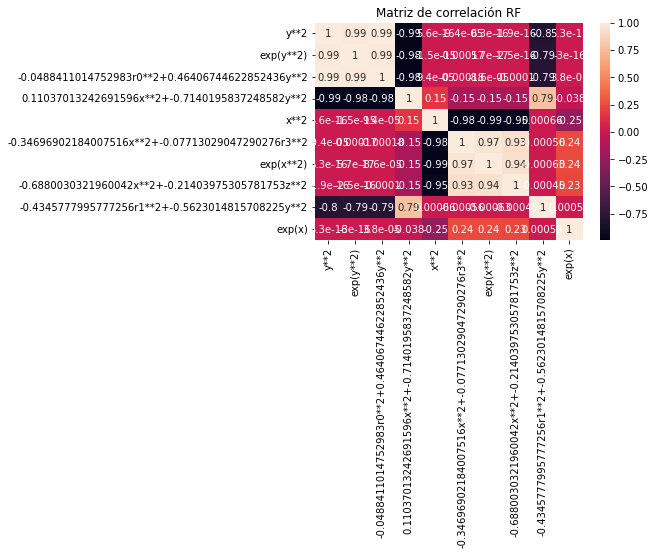

In [58]:
hmp = sns.heatmap(cm_rf, annot=True).set(title='Matriz de correlación RF')

## Feature Analysis con interacciones de las n seleccionadas antes

In [83]:
df[output[0][:10]]

,exp(y),exp(x),0.37116356511454485x**2+-0.0900747732237479y**2,y**2,-0.9195945500661726y+-0.9084396406655324x,-0.7224267110829226r1/y,0.3629707214330691x*y,0.9259329609105276r1**2+0.7515774490735323x**2,-0.8769723785089758r1*y,0.1318818814201661y/x
0,-0.060785,-0.086812,0.281089,1.0,1.828034,-0.165416,0.362971,0.800122,-0.200802,0.131882
1,-0.060785,-0.086812,0.281089,1.0,1.828034,-0.151667,0.362971,0.792388,-0.184113,0.131882
2,-0.060785,-0.086812,0.281089,1.0,1.828034,0.421317,0.362971,1.066504,0.511447,0.131882
3,-0.060785,-0.086812,0.281089,1.0,1.828034,0.308991,0.362971,0.920966,0.375092,0.131882
4,-0.060785,-0.086812,0.281089,1.0,1.828034,0.254304,0.362971,0.866313,0.308706,0.131882
...,...,...,...,...,...,...,...,...,...,...
124995,-0.449147,-0.641456,0.281089,1.0,-1.828034,-0.308008,0.362971,0.919889,-0.373898,0.131882
124996,-0.449147,-0.641456,0.281089,1.0,-1.828034,-0.223467,0.362971,0.840174,-0.271272,0.131882
124997,-0.449147,-0.641456,0.281089,1.0,-1.828034,0.184975,0.362971,0.812281,0.224545,0.131882
124998,-0.449147,-0.641456,0.281089,1.0,-1.828034,0.104496,0.362971,0.770950,0.126851,0.131882


All 10 columns were squared
Total number of columns created by linear combination: 36
Total number of columns created by linear combination of squared variables: 36
Total number of columns created by products of variables: 36
Total number of columns created by quotient of variables: 36
Total number of columns created by product of variables with random powers: 36
Total number of columns created by exponentiation of variables and squares: 18
   Regularising...

 Total number of features: 218
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
Loading train data...
Shape of your Data Set loaded: (50000, 219)
Loading test data...
    Filename is an empty string or file not able to be loaded
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    218 Predictors classified...
        15 variable(s) will be ignored since they are ID or low-informa

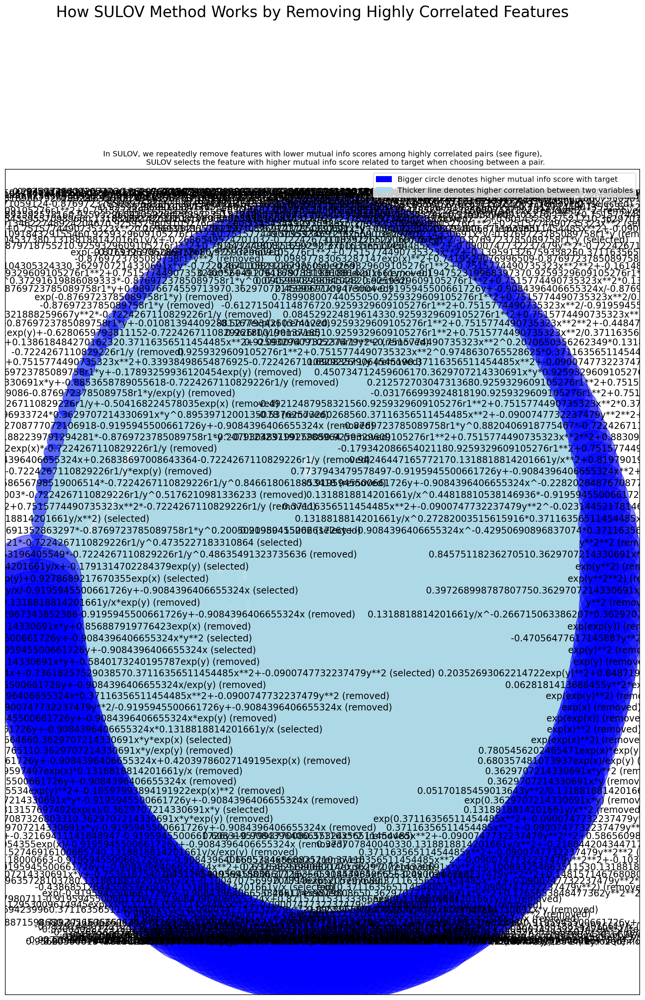

    Adding 0 categorical variables to reduced numeric variables  of 35
############## F E A T U R E   S E L E C T I O N  ####################
Current number of predictors = 35 
    Finding Important Features using Boosted Trees algorithm...
        using 35 variables...
        using 28 variables...
        using 21 variables...
        using 14 variables...
        using 7 variables...
Selected 31 important features from your dataset
    Time taken (in seconds) = 59
Returning list of 31 important features and dataframe.


In [84]:
# Interacciones personalizadas de las features seleccionadas como mejores
# No es necesario tirar la columna bin porque ya tenemos los nombres de las variables que vamos a tocar
df_new = my_interactions(df[output[0][:10]],9)
df_new['bin'] = df.bin
target = 'bin'

#Select 100k random elements without repetition
inds = random.sample(range(125000), 50000)
inds = np.sort(inds)
small_df = df_new.iloc[inds,:]

output = featurewiz(small_df, target, corr_limit=0.50,
                    verbose=0, sep=',', header=0, test_data='',
                    feature_engg='', category_encoders='')



In [85]:
output[0][:3]

['0.9841719120606327exp(x)/y**2',
 '0.3514345311297098exp(x)/0.9259329609105276r1**2+0.7515774490735323x**2',
 '-0.33877309659978416exp(y)+0.9278689217670355exp(x)']

## Predecir el potencial con las dos mejores variables de menor correlación

In [86]:
potenciales = [df_new]
tags = ['reflection']
num_pot = len(potenciales)

In [87]:
from fastai.vision.all import *
from time import time

folder = 'PCAs_detector'

dd = top_dir + '/' + folder
if not os.path.isdir(dd):
    print('Creating directory:\n',dd)
    os.mkdir(dd)

dir = os.path.join(top_dir,folder)

'''#------------------------------ Generar Potenciales ---------------------------#

#Tipos de simetría que quiero generar
#syms = ['continuous_rotation', 'discrete_translation', 'reflection', 'none', 'continuous_translation']
symmetries = ['continuous_rotation', 'discrete_translation', 'reflection', 'none', 'continuous_translation']

num_pot_cada = 400 # Numero de potenciales de cada tipo

potenciales = []
potenciales_tags = []

for symmetry in symmetries:
    print('Generating Potentials for',symmetry,'symmetry')
    funs_temp = [potential_df(symmetry = symmetry) for i in range(num_pot_cada)]
    funs_tags_temp = [symmetry for i in range(num_pot_cada)]
    potenciales = potenciales + funs_temp 
    potenciales_tags = potenciales_tags + funs_tags_temp

# Vamos a ordenar los potenciales de forma aleatoria, aunque en realidad
# este paso no es relevante, puesto que para cada potencial entrenaremos una 
# red. Si fuéramos a entrenar una red con todos los potenciales, entonces sí
# que sería relevante.

num_pot = len(potenciales) # Numero de Potenciales que quiero (por si no quiero todos)

c = list(zip(potenciales,potenciales_tags))

# Barajamos los potenciales, para pasarseslos en orden aleatorio
#random.shuffle(c)

potenciales_aux, tags = zip(*c)

potenciales = [potenciales_aux[i] for i in range(num_pot)]

'''

class SaveModelCallback(TrackerCallback):
    "A `TrackerCallback` that saves the model's best during training and loads it at the end."
    _only_train_loop = True
    def __init__(self, monitor='valid_loss', comp=None, min_delta=0., fname='model', every_epoch=False, at_end=False,
                 with_opt=False, reset_on_fit=True):
        super().__init__(monitor=monitor, comp=comp, min_delta=min_delta, reset_on_fit=reset_on_fit)
        assert not (every_epoch and at_end), "every_epoch and at_end cannot both be set to True"
        # keep track of file path for loggers
        self.last_saved_path = None
        store_attr('fname,every_epoch,at_end,with_opt')

    def _save(self, name): self.last_saved_path = self.learn.save(name, with_opt=self.with_opt)

    def after_epoch(self):
        "Compare the value monitored to its best score and save if best."
        if self.every_epoch: self._save(f'{self.fname}_{self.epoch}')
        else: #every improvement
            super().after_epoch()
            if self.new_best:
                #print(f'Better model found at epoch {self.epoch} with {self.monitor} value: {self.best}.')
                self._save(f'{self.fname}')

    def after_fit(self, **kwargs):
        "Load the best model."
        if self.at_end: self._save(f'{self.fname}')
        elif not self.every_epoch: self.learn.load(f'{self.fname}', with_opt=self.with_opt)

# ---------------- Definiciones previas e hiperparámetros ----------------- #

#Guardo los modelos para analizarlos luego
models = [] 
to_s = []

#Guardaremos los resultados de la PCA en un array 
PCA_s = []
PCA_s_tag = []

# Hyperparameters: De momento los pondré aquí, pero luego serán un input entero
bs_choices = [50000]       # Batch Size
shape='pipe'               # Shape of the neural network
layers_choices = [5]       # Number of layers of the net. Default:10 or 5
neurons_choices = [100]    # Number of neurons per layer. Default:200
epoch_choices = [100]      # Number of training epochs. Default:200
lr_choices = [0.01]       # Max learning rate 
valid_pct=0.2              # Part of the data that goes into validation (0.2 = 20%)
monitor= 'valid_loss'        # Te model with the least 'monitor' will be saved

# Tiempo en el que empezamos a procesar
start_time = time()

# ---------------------- Entrenar Red Y PCA -----------------------------------#

j = 1 # Usaremos esto para saber cuantos potenciales hemos procesado, y como indice en general

for df in potenciales:

    # Debemos marcar cada potencial para tener claro a qué tipo de simetria corresponde cada PCA
    PCA_s_tag.append(tags[j-1])

    #In order to work with smaller df's, we drop the value of the the potential V, as we won't be using it
    df2 = df.copy() 

    splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

    to = TabularPandas(df2,
                    procs=[Categorify,FillMissing, Normalize],
                    cont_names = output[0][:10],
                    y_names = 'bin',
                    splits=splits)

    train_size = len(splits[0])
    valid_size = len(splits[1])

    # ----------------- Hyperparameters ------------------- #

    # Batch Size (a large one)
    bs=min(random.choice(bs_choices),train_size)  
    print('{} batch size for training.\n'.format(bs))

    # Neurons per layer
    neurons_per_layer = random.choice(neurons_choices)

    # Number of layers
    n_layers = random.choice(layers_choices)

    #Shape of the net: Pipe or funnel
    if shape == 'pipe':
        layers=[neurons_per_layer for i in range(n_layers)]

    if shape == 'funnel':
        n_eff = n_layers
        layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

    print('Training FCNN with layers: ',layers)

    #Number of epochs
    n_epoch=random.choice(epoch_choices)
    print('Training for {} epochs.'.format(n_epoch))

    # Maximum Learning Rate: (a good value can be found using learn.lr_find())
    lr_max=float(random.choice(lr_choices))
    print('Using lr_max = ',format(lr_max))

    # ----------------------------------------------------- #

    # --------------- Training the FCNN --------------------#

    # Load the data into a DataLoader
    dls = to.dataloaders(bs=bs)

    # Define a Tabular Learner
    learn = tabular_learner(dls, layers=layers
                        #,config=config
                        ,metrics=[mse],
                        #y_range = [min(df.bin),max(df.bin)],
                        #,cbs=ShowGraphCallback()
                        #,train_bn=False)
                        )

    # Train the net 
    with learn.no_logging():
        learn.fit_one_cycle(n_epoch=n_epoch
                            ,lr_max=lr_max
                            ,cbs=[SaveModelCallback(monitor=monitor)]
                            )

    # Guardamos modelos y tabular objects para el posterior analisis
    models.append(learn)
    to_s.append(to)

    # ------------------------------------------------------#


    # ------------------------- PCA ------------------------#

    test_df = df2.copy()
    dl = learn.dls.test_dl(test_df,bs=test_df.shape[0]) 

    # Tenemos que hacer un Hook, una especie de gancho que enganchamos en la última capa interna,
    # para guardar, de cada modelo, los valores de los parámetro de dicha capa. 
    with Hooks(learn.model.layers, lambda m,i,o: o) as h:
        preds = learn.get_preds(dl=dl,with_input=True,with_decoded=True,with_loss=True)

    targets=preds[2].numpy().flatten()

    # Cogemos la información de la penúltima capa
    # OJO: Si añadimos y_range, se añade automaticamente una sigmoid
    # al final, por lo que tendríamos que coger la capa -3 en vez de la -2
    act = h.stored[-2] 
    multi_dim=Tensor.cpu(act).numpy()
    standardized=StandardScaler().fit_transform(multi_dim)

    viz = PCA(2).fit_transform(standardized)
    #plt.figure()
    #plt.scatter(viz[:, 0], viz[:, 1],c=targets[:multi_dim.shape[0]],alpha=.1, marker = 'o')

    PCA_s.append(viz)

    # ------------------------------------------------------ #

    # ------------------ Saving the PCA's ------------------ #

    # ---- Dar formato a PCA para guardar como imagen con color

    viz = pd.DataFrame(viz) #Transformamos la PCA en un dataframe
    viz.columns = ['x','y'] #Nombres de las columnas

    # Insertamos una columna con los colores de los puntos. El valor del potencial
    # objetivo (targets) es el color, y hay un color por cada punto 
    viz.insert(2,'class',targets[:multi_dim.shape[0]]) 

    # ---- Personalizar mapa de color 

    n_classes=1000

    colors = 'rainbow'

    if colors == 'rainbow':
        my_cmap = plt.cm.get_cmap('rainbow', n_classes)
        classes_in_rgb = my_cmap(range(n_classes))
    if colors == 'purple':
        my_cmap = plt.cm.get_cmap('rainbow', n_classes)
        classes_in_rgb = np.vstack((np.array([0,0,0,0]),my_cmap([0 for i in range(n_classes)])))

    # ---- Hacer que la intensidad del pixel represente la cantidad de puntos 
    #      acumuldos en un pixel

    n_pixels = 224

    binning_3d=np.histogramdd([viz['x'],viz['y'],viz['class']],range=(None,None,(0,1)), bins=(n_pixels,n_pixels,n_classes))

    #if we want the pixel intensity to reprensent the number of points at that location
    array = np.dot(binning_3d[0],classes_in_rgb)
    array = array/np.amax(array)

    # ---- Guardar la PCA

    #Directorio donde guardaremos las imagenes
    dir_sym = os.path.join(dir,tags[j-1])
    if not os.path.isdir(dir_sym):
        print('Creating directory:\n',dir_sym)
        os.mkdir(dir_sym)


    # Nombre de la imagen. Pongo el tiempo para que todas se llamen distinto cada vez.
    img_file = str(tags[j-1])+'_'+str(j)+str(round(time()))+'-'+str(n_classes)+'_'+'color_classes--'+'_PCA.png' 
    output_dir = os.path.join(dir_sym,img_file) # Directorio donde guardamos la imagen
    plt.imsave(output_dir,array) # Guardar
    print('\nPCA saved to:\n{}\n'.format(dir_sym+'/'+img_file))

    # ------------------------ Time -------------------------#

    minutes_until_now = (time() - start_time)/60
    images_done = j
    minutes_per_image = minutes_until_now/(images_done)
    hours_left = minutes_per_image * (num_pot-images_done)/60
    print("\n{} PCA's made out of {}.\n".format(images_done,num_pot))
    print("{:.1f} minutes elapsed for {} images.".format(minutes_until_now,images_done))
    print("{:.1f} minutes average per image.".format(minutes_until_now/images_done))
    print("{:.1f} minutes estimated left for {} images.\n\n\n".format(hours_left*60,num_pot-images_done))
    print("{:.1f} hours estimated left for {} images.\n\n\n".format(hours_left,num_pot-images_done))
    j+=1

  # ------------------------------------------------------#

50000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 100 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector/reflection

PCA saved to:
/home/gabriel/Desktop/PCAs_detector/reflection/reflection_11636463584-1000_color_classes--_PCA.png


1 PCA's made out of 1.

0.7 minutes elapsed for 1 images.
0.7 minutes average per image.
0.0 minutes estimated left for 0 images.



0.0 hours estimated left for 0 images.





Notebook directory: /home/gabriel/Desktop
Numero Imagenes: 1
['reflection']
['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']
[2.47539894e-04 8.44725290e-10 1.54531081e-05 1.92155216e-08
 9.99736965e-01]


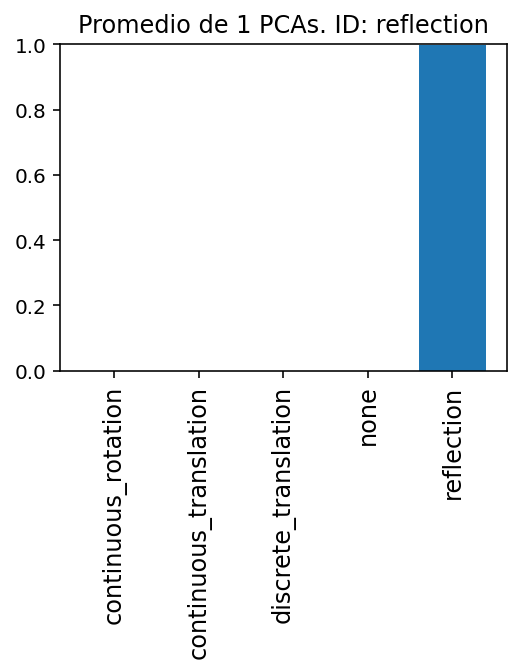

In [88]:
nom_carp = 'PCAs_detector'

#import libraries
%config InlineBackend.figure_format = 'retina'
import seaborn as sns
from IPython.core.display import display, HTML, clear_output
display(HTML("<style>.container { width:100% !important; } div.cell.selected {border-left-width: 0px !important;}</style>"))

from time import time
import os
import glob
from fastai.vision.all import *
import numpy as np
from IPython.display import clear_output
import itertools as it
import more_itertools
#import torchvision.models
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default ="none"
import base64
from PIL import Image
from io import BytesIO
import torch
import gc
#import libraries

if not 'notebook_dir' in globals():
    notebook_dir = os.getcwd()
print('Notebook directory: ' + notebook_dir)
os.chdir(notebook_dir)  # If you changed the current working dir, this will take you back to the workbook dir.
top_dir = notebook_dir



modelo = 'G' 

if modelo == 'G':
    learn = load_learner('/home/gabriel/Desktop/models/model_90_accu_resnet18_one_cycle_10+5_no_mixup'+'.pkl', cpu=False)
     


        
#Reset Registro

registro = pd.DataFrame({
    'Col_Quit':[0], 'Run':[0],
    'continuous_rotation':[0], 'continuous_translation':[0], 'discrete_translation':[0], 'none':[0], 'reflection':[0]
})
registro = registro.drop(0)
#registro

sims = pd.DataFrame(columns = learn.dls.vocab)
errs = sims.copy()

num_img_cat = [] #guardo el numero de imagenes de cada categoria
i = 0
plote = False

from IPython.utils import io



for dires in np.sort(Path('/home/gabriel/Desktop/' + nom_carp).ls()):
    #path = Path('/home/gabriel/Desktop/PCA_INE_sexo/INE/'+quitadas)
    quitadas = str(dires).split('/')[-1]
    with io.capture_output() as captured:
        for ima in dires.ls():

            test_im_dir = ima

            im = PILImage.create(test_im_dir)

            # Orden: ['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']

            cate, num_cat, probs = learn.predict(im)


            '''
            if plote == True:
                plt.figure
                plt.figure(figsize=(4, 3))
                plt.title(ima)
                plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],probs)
                plt.xticks(rotation='vertical',fontsize = 12)
                plt.show()
            '''

            new_row = np.array([quitadas, i] + list(np.array(probs).astype(float))).reshape([1,-1])
            aden = pd.DataFrame(new_row,columns=registro.columns)

            registro = registro.append(aden, ignore_index=True)

            i+=1

    registro = registro.astype({
        'Col_Quit':str, 'Run':int,
        'continuous_rotation':float, 'continuous_translation':float, 'discrete_translation':float, 'none':float, 'reflection':float
    })  

    print('Numero Imagenes:',i)
    num_img_cat.append(i)



#registro.to_csv(r'/home/gabriel/Desktop/PCA_INE_salarios/registro_'+modelo+'.csv', index = False)
print(registro['Col_Quit'].unique())

#registro = pd.read_csv('/home/gabriel/Desktop/PCA_INE_sexo/registro.csv')

nombres_carps = registro['Col_Quit'].unique() #Nombres de las carpetas donde estan guyardadas las pcas de un tipo
num_carps = len(nombres_carps)
i = 0

for nom in nombres_carps:
    if i == 0:
        m_probs = np.array(registro.iloc[:num_img_cat[0],2:].mean())
        err_probs = np.array(registro.iloc[:num_img_cat[0],2:].std())
        nume = str(len(registro.iloc[:num_img_cat[0],2:]))
        print(learn.dls.vocab)
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)
    else:
        m_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].mean())
        err_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].std())
        nume = str(len(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:]))
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)

    if nom == '-ninguna-':
        tit = 'Promedio de '+nume+' PCAs sin quitar ninguna columna'
    else:
        tit = 'Promedio de '+nume+' PCAs. ID: '+ nom        

    
    plt.figure(figsize=(4, 3))
    plt.title(tit)
    #plt.title('Promedio de '+str(40)+' PCAs sin quitar ninguna columna')
    plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],
            m_probs,yerr = 2*err_probs/np.sqrt(float(nume)), capsize = 5)
    plt.xticks(rotation='vertical',fontsize = 12)
    plt.ylim([0, 1])
    plt.show()
    
    i+=1

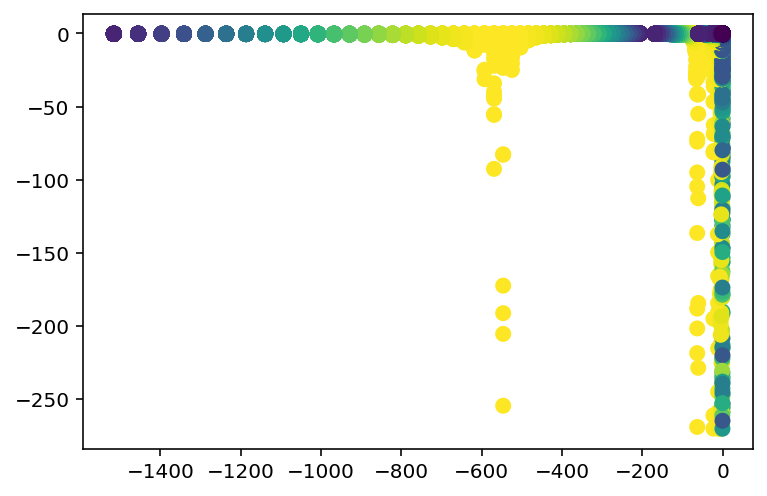

In [89]:
#ax2 = plt.axes(projection='3d')
#ax2.plot_trisurf(df_new[output[0][0]], df_new[output[0][1]], df_new.bin, linewidth=0.2, cmap = 'jet')
#plt.title('bin(x,y)')
plt.show()
plt.figure()
plt.scatter(df_new[output[0][0]],df_new[output[0][1]],c = df_new.bin,marker = '.', lw = 5)

<AxesSubplot:>

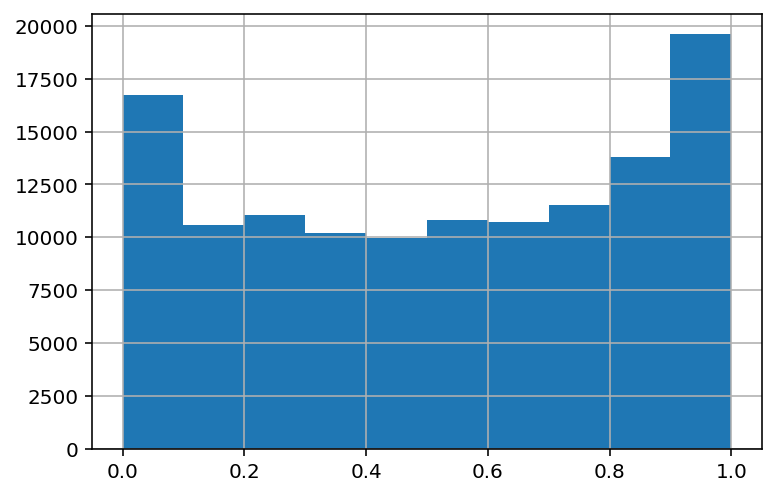

In [66]:
df_new.bin.hist()

In [90]:
output[0][:10]

['0.9841719120606327exp(x)/y**2',
 '0.3514345311297098exp(x)/0.9259329609105276r1**2+0.7515774490735323x**2',
 '-0.33877309659978416exp(y)+0.9278689217670355exp(x)',
 '0.06810756062882684-0.9195945500661726y+-0.9084396406655324x+-0.73618257529038570.37116356511454485x**2+-0.0900747732237479y**2',
 '0.9862831547532827exp(x)*y**2',
 '0.8549235222081035-0.9195945500661726y+-0.9084396406655324x*y**2',
 'exp(0.1318818814201661y/x**2)',
 '-0.03560313157697492exp(x)/0.3629707214330691x*y',
 '-0.8300308877916012exp(x)/0.37116356511454485x**2+-0.0900747732237479y**2',
 '-0.73292445762292120.1318818814201661y/x**2+0.1332137640461606exp(x)**2']

# Automatic Test

In [25]:
rep_todo = 10

# Tiempo en el que empezamos a procesar
from time import time
start_time = time()

for rtd in range(rep_todo):
    from fastai.vision.all import *
    from time import time
    from IPython.utils import io

    model_fi = 'RF' # RF or FW (random forests or featurewiz)
    #Tipos de simetría que quiero generar
    #syms = ['continuous_rotation', 'discrete_translation', 'reflection', 'none', 'continuous_translation']
    symmetries = ['continuous_rotation', 'discrete_translation', 'reflection', 'none', 'continuous_translation']

    num_pot_cada = 4 # Numero de potenciales de cada tipo

    int_1 = False #Interactions in Feature Importance 1 (RF)
    int_2 = False
    select_10k = True #Keep only 10000 elements of the original potential DF

    # ------------------- Folder PCA ------------------- #

    folder = 'PCAs_detector_big'

    dd = top_dir + '/' + folder
    if not os.path.isdir(dd):
        print('Creating directory:\n',dd)
        os.mkdir(dd)

    dir = os.path.join(top_dir,folder)

    #------------------------------ Generar Potenciales ---------------------------#


    potenciales = []
    potenciales_tags = []

    for symmetry in symmetries:
        print('Generating Potentials for',symmetry,'symmetry')
        funs_temp = [mock_data(sym = symmetry, verbose = False) for i in range(num_pot_cada)]
        funs_tags_temp = [symmetry for i in range(num_pot_cada)]
        potenciales = potenciales + funs_temp 
        potenciales_tags = potenciales_tags + funs_tags_temp

    # Vamos a ordenar los potenciales de forma aleatoria, aunque en realidad
    # este paso no es relevante, puesto que para cada potencial entrenaremos una 
    # red. Si fuéramos a entrenar una red con todos los potenciales, entonces sí
    # que sería relevante.

    num_pot = len(potenciales) # Numero de Potenciales que quiero (por si no quiero todos)

    c = list(zip(potenciales,potenciales_tags))

    # Barajamos los potenciales, para pasarseslos en orden aleatorio
    #random.shuffle(c)

    potenciales_aux, tags = zip(*c)

    potenciales = [potenciales_aux[i] for i in range(num_pot)]




    class SaveModelCallback(TrackerCallback):
        "A `TrackerCallback` that saves the model's best during training and loads it at the end."
        _only_train_loop = True
        def __init__(self, monitor='valid_loss', comp=None, min_delta=0., fname='model', every_epoch=False, at_end=False,
                     with_opt=False, reset_on_fit=True):
            super().__init__(monitor=monitor, comp=comp, min_delta=min_delta, reset_on_fit=reset_on_fit)
            assert not (every_epoch and at_end), "every_epoch and at_end cannot both be set to True"
            # keep track of file path for loggers
            self.last_saved_path = None
            store_attr('fname,every_epoch,at_end,with_opt')

        def _save(self, name): self.last_saved_path = self.learn.save(name, with_opt=self.with_opt)

        def after_epoch(self):
            "Compare the value monitored to its best score and save if best."
            if self.every_epoch: self._save(f'{self.fname}_{self.epoch}')
            else: #every improvement
                super().after_epoch()
                if self.new_best:
                    #print(f'Better model found at epoch {self.epoch} with {self.monitor} value: {self.best}.')
                    self._save(f'{self.fname}')

        def after_fit(self, **kwargs):
            "Load the best model."
            if self.at_end: self._save(f'{self.fname}')
            elif not self.every_epoch: self.learn.load(f'{self.fname}', with_opt=self.with_opt)

    # ---------------- Definiciones previas e hiperparámetros ----------------- #

    #Guardo los modelos para analizarlos luego
    models = [] 
    to_s = []

    #Guardaremos los resultados de la PCA en un array 
    PCA_s = []
    PCA_s_tag = []

    # Hyperparameters: De momento los pondré aquí, pero luego serán un input entero
    bs_choices = [50000]       # Batch Size
    shape='pipe'               # Shape of the neural network
    layers_choices = [5]       # Number of layers of the net. Default:10 or 5 results with 5
    neurons_choices = [100]    # Number of neurons per layer. Default:200 results with 200
    epoch_choices = [150]      # Number of training epochs. Default:200 results with 60
    lr_choices = [0.01]       # Max learning rate 
    valid_pct=0.2              # Part of the data that goes into validation (0.2 = 20%)
    monitor= 'valid_loss'        # Te model with the least 'monitor' will be saved



    # ---------------------- Entrenar Red Y PCA -----------------------------------#

    j = 1 # Usaremos esto para saber cuantos potenciales hemos procesado, y como indice en general

    for df in potenciales:
        
        #------------------------------ Feature Importance inicial ---------------------------#

        if select_10k == True:
            if len(df.bin) <= 100*100:
                print('Too little data to keep 10k points')
            else:
                print('Keeping 10k points of the original DF')
                remove_n = len(df.bin) - 10000
                drop_indices = np.random.choice(df.index, remove_n, replace=False)
                df_temp = df.drop(drop_indices)
                df = df_temp.copy()


        print('First Feature importance')

        if model_fi == 'FW':

            #Select 10k random elements without repetition
            inds = random.sample(range(len(df)), len(df))
            inds = np.sort(inds)
            small_df = df.iloc[inds,:]

            with io.capture_output() as captured1: output = featurewiz(small_df, 'bin', corr_limit=0.1,
                                                                        verbose=0, sep=',', header=0, test_data='',
                                                                        feature_engg='', category_encoders='')

            two_best = output[0][:2]

        elif model_fi == 'RF':

            small_df = df.copy()

            if int_1 == True:

                n_f = len(small_df)

                small_df.drop('bin', axis = 1)
                small_df = my_interactions_small(small_df.astype(np.float32), numo_int = int(len(small_df.columns)/2 + 1), verbose = True)

                small_df['bin'] = df.bin

            else:
                n_f = 10

            best_feat, imp = fast_feat_imp_rf(small_df.astype(np.float32),target = 'bin', graph = False)
            cm_rf = small_df[best_feat[:n_f]].corr()

            corr_imp = np.exp(np.array(imp[:n_f]))*((1-np.abs(cm_rf.iloc[:,0])))

            two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]
            
            #two_best = [(corr_imp.iloc[:].sort_values()).index[-1],(corr_imp.iloc[:].sort_values()).index[-2]]

       
        small_df = small_df[two_best]




        print('Second Feature importance')

        if model_fi == 'FW':

            small_df['bin'] = df.bin

            with io.capture_output() as captured2: output = featurewiz(small_df, 'bin', corr_limit=0.10,
                                                        verbose=0, sep=',', header=0, test_data='',
                                                        category_encoders='',feature_engg='interactions')   

            small_df = output[1].copy()
            two_best_2 = output[0][:2]

        elif model_fi == 'RF':

            n_f = 10

            if int_2 == True:
                small_df = my_interactions(small_df.astype(np.float32), numo_int = len(small_df.columns), verbose = False)

            small_df['bin'] = df.bin

            best_feat, imp = fast_feat_imp_rf(small_df.astype(np.float32),target = 'bin', graph = False)
            cm_rf = small_df[best_feat[:n_f]].corr()

            corr_imp = np.exp(np.array(imp[:n_f]))*((1-np.abs(cm_rf.iloc[:,0])))

            two_best_2 = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]
            #two_best_2 = [(corr_imp.iloc[:].sort_values()).index[-1],(corr_imp.iloc[:].sort_values()).index[-2]]


       


        # Debemos marcar cada potencial para tener claro a qué tipo de simetria corresponde cada PCA
        PCA_s_tag.append(tags[j-1])

        df2 = small_df.copy() 

        splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

        to = TabularPandas(df2,
                        procs=[Categorify,FillMissing, Normalize],
                        cont_names = two_best_2,
                        y_names = 'bin',
                        splits=splits)

        train_size = len(splits[0])
        valid_size = len(splits[1])

        # ----------------- Hyperparameters ------------------- #

        # Batch Size (a large one)
        bs=min(random.choice(bs_choices),train_size)  
        print('{} batch size for training.\n'.format(bs))

        # Neurons per layer
        neurons_per_layer = random.choice(neurons_choices)

        # Number of layers
        n_layers = random.choice(layers_choices)

        #Shape of the net: Pipe or funnel
        if shape == 'pipe':
            layers=[neurons_per_layer for i in range(n_layers)]

        if shape == 'funnel':
            n_eff = n_layers
            layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

        print('Training FCNN with layers: ',layers)

        #Number of epochs
        n_epoch=random.choice(epoch_choices)
        print('Training for {} epochs.'.format(n_epoch))

        # Maximum Learning Rate: (a good value can be found using learn.lr_find())
        lr_max=float(random.choice(lr_choices))
        print('Using lr_max = ',format(lr_max))

        # ----------------------------------------------------- #

        # --------------- Training the FCNN --------------------#

        # Load the data into a DataLoader
        dls = to.dataloaders(bs=bs)

        # Define a Tabular Learner
        learn = tabular_learner(dls, layers=layers
                            #,config=config
                            #,metrics=[mse],
                            #y_range = [min(df.bin),max(df.bin)],
                            #,cbs=ShowGraphCallback()
                            #,train_bn=False)
                            )

        # Train the net 
        with learn.no_logging():
            learn.fit_one_cycle(n_epoch=n_epoch
                                ,lr_max=lr_max
                                ,cbs=[SaveModelCallback(monitor=monitor)]
                                )

        # Guardamos modelos y tabular objects para el posterior analisis
        models.append(learn)
        to_s.append(to)

        # ------------------------------------------------------#


        # ------------------------- PCA ------------------------#

        test_df = df2.copy()
        dl = learn.dls.test_dl(test_df,bs=int(test_df.shape[0])) 

        # Tenemos que hacer un Hook, una especie de gancho que enganchamos en la última capa interna,
        # para guardar, de cada modelo, los valores de los parámetro de dicha capa. 
        with Hooks(learn.model.layers, lambda m,i,o: o) as h:
            preds = learn.get_preds(dl=dl,with_input=True,with_decoded=True,with_loss=True)

        targets=preds[2].numpy().flatten()

        # Cogemos la información de la penúltima capa
        # OJO: Si añadimos y_range, se añade automaticamente una sigmoid
        # al final, por lo que tendríamos que coger la capa -3 en vez de la -2
        act = h.stored[-2] 
        multi_dim=Tensor.cpu(act).numpy()
        standardized=StandardScaler().fit_transform(multi_dim)

        viz = PCA(2).fit_transform(np.nan_to_num(standardized))
        #plt.figure()
        #plt.scatter(viz[:, 0], viz[:, 1],c=targets[:multi_dim.shape[0]],alpha=.1, marker = 'o')

        PCA_s.append(viz)

        # ------------------------------------------------------ #

        # ------------------ Saving the PCA's ------------------ #

        # ---- Dar formato a PCA para guardar como imagen con color

        viz = pd.DataFrame(viz) #Transformamos la PCA en un dataframe
        viz.columns = ['x','y'] #Nombres de las columnas

        # Insertamos una columna con los colores de los puntos. El valor del potencial
        # objetivo (targets) es el color, y hay un color por cada punto 
        viz.insert(2,'class',targets[:multi_dim.shape[0]]) 

        # ---- Personalizar mapa de color 

        n_classes=1000

        colors = 'rainbow'

        if colors == 'rainbow':
            my_cmap = plt.cm.get_cmap('rainbow', n_classes)
            classes_in_rgb = my_cmap(range(n_classes))
        if colors == 'purple':
            my_cmap = plt.cm.get_cmap('rainbow', n_classes)
            classes_in_rgb = np.vstack((np.array([0,0,0,0]),my_cmap([0 for i in range(n_classes)])))

        # ---- Hacer que la intensidad del pixel represente la cantidad de puntos 
        #      acumuldos en un pixel

        n_pixels = 224

        binning_3d=np.histogramdd([viz['x'],viz['y'],viz['class']],range=(None,None,(0,1)), bins=(n_pixels,n_pixels,n_classes))

        #if we want the pixel intensity to reprensent the number of points at that location
        array = np.dot(binning_3d[0],classes_in_rgb)
        array = array/np.amax(array)

        # ---- Guardar la PCA

        #Directorio donde guardaremos las imagenes
        dir_sym = os.path.join(dir,tags[j-1])
        if not os.path.isdir(dir_sym):
            print('Creating directory:\n',dir_sym)
            os.mkdir(dir_sym)


        # Nombre de la imagen. Pongo el tiempo para que todas se llamen distinto cada vez.
        img_file = str(tags[j-1])+'_'+str(j)+str(round(time()))+'-'+str(n_classes)+'_'+'color_classes--'+'_PCA.png' 
        output_dir = os.path.join(dir_sym,img_file) # Directorio donde guardamos la imagen
        plt.imsave(output_dir,array) # Guardar
        print('\nPCA saved to:\n{}\n'.format(dir_sym+'/'+img_file))

        # ------------------------ Time -------------------------#

        minutes_until_now = (time() - start_time)/60
        images_done = j+num_pot*rtd
        minutes_per_image = minutes_until_now/(images_done)
        hours_left = minutes_per_image * (num_pot*rep_todo-images_done)/60
        print("\n{} PCA's made out of {}.\n".format(images_done,num_pot*rep_todo))
        print("{:.1f} minutes elapsed for {} images.".format(minutes_until_now,images_done))
        print("{:.1f} minutes average per image.".format(minutes_until_now/images_done))
        print("{:.1f} minutes estimated left for {} images.\n\n\n".format(hours_left*60,num_pot*rep_todo-images_done))
        print("{:.1f} hours estimated left for {} images.\n\n\n".format(hours_left,num_pot*rep_todo-images_done))
        j+=1


      # ------------------------------------------------------#

Creating directory:
 /home/gabriel/Desktop/PCAs_detector_big
Generating Potentials for continuous_rotation symmetry
Generating Potentials for discrete_translation symmetry
Generating Potentials for reflection symmetry
Generating Potentials for none symmetry
Generating Potentials for continuous_translation symmetry
Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_big/continuous_rotation

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_rotation/continuous_rotation_11637236928-1000_color_classes--_PCA.png


1 PCA's made out of 200.

0.3 minutes elapsed for 1 images.
0.3 minutes average per image.
58.8 minutes estimated left for 199 images.



1.0 hours estimated left for 199 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_rotation/continuous_rotation_21637236934-1000_color_classes--_PCA.png


2 PCA's made out of 200.

0.4 minutes elapsed for 2 images.
0.2 minutes average per image.
39.1 minutes estimated left for 198 images.



0.7 hours estimated left for 198 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_rotation/continuous_rotation_31637236940-1000_color_classes--_PCA.png


3 PCA's made out of 200.

0.5 minutes elapsed for 3 images.
0.2 minutes average per image.
32.4 minutes estimated left for 197 images.



0.5 hours estimated left for 197 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_rotation/continuous_rotation_41637236946-1000_color_classes--_PCA.png


4 PCA's made out of 200.

0.6 minutes elapsed for 4 images.
0.1 minutes average per image.
29.2 minutes estimated left for 196 images.



0.5 hours estimated left for 196 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_big/discrete_translation

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/discrete_translation/discrete_translation_51637236952-1000_color_classes--_PCA.png


5 PCA's made out of 200.

0.7 minutes elapsed for 5 images.
0.1 minutes average per image.
27.0 minutes estimated left for 195 images.



0.5 hours estimated left for 195 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/discrete_translation/discrete_translation_61637236958-1000_color_classes--_PCA.png


6 PCA's made out of 200.

0.8 minutes elapsed for 6 images.
0.1 minutes average per image.
25.6 minutes estimated left for 194 images.



0.4 hours estimated left for 194 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/discrete_translation/discrete_translation_71637236964-1000_color_classes--_PCA.png


7 PCA's made out of 200.

0.9 minutes elapsed for 7 images.
0.1 minutes average per image.
24.5 minutes estimated left for 193 images.



0.4 hours estimated left for 193 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/discrete_translation/discrete_translation_81637236970-1000_color_classes--_PCA.png


8 PCA's made out of 200.

1.0 minutes elapsed for 8 images.
0.1 minutes average per image.
23.7 minutes estimated left for 192 images.



0.4 hours estimated left for 192 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_big/reflection

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/reflection/reflection_91637236976-1000_color_classes--_PCA.png


9 PCA's made out of 200.

1.1 minutes elapsed for 9 images.
0.1 minutes average per image.
23.1 minutes estimated left for 191 images.



0.4 hours estimated left for 191 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/reflection/reflection_101637236982-1000_color_classes--_PCA.png


10 PCA's made out of 200.

1.2 minutes elapsed for 10 images.
0.1 minutes average per image.
22.6 minutes estimated left for 190 images.



0.4 hours estimated left for 190 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/reflection/reflection_111637236989-1000_color_classes--_PCA.png


11 PCA's made out of 200.

1.3 minutes elapsed for 11 images.
0.1 minutes average per image.
22.3 minutes estimated left for 189 images.



0.4 hours estimated left for 189 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/reflection/reflection_121637236995-1000_color_classes--_PCA.png


12 PCA's made out of 200.

1.4 minutes elapsed for 12 images.
0.1 minutes average per image.
21.9 minutes estimated left for 188 images.



0.4 hours estimated left for 188 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_big/none

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/none/none_131637237001-1000_color_classes--_PCA.png


13 PCA's made out of 200.

1.5 minutes elapsed for 13 images.
0.1 minutes average per image.
21.5 minutes estimated left for 187 images.



0.4 hours estimated left for 187 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/none/none_141637237007-1000_color_classes--_PCA.png


14 PCA's made out of 200.

1.6 minutes elapsed for 14 images.
0.1 minutes average per image.
21.3 minutes estimated left for 186 images.



0.4 hours estimated left for 186 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/none/none_151637237013-1000_color_classes--_PCA.png


15 PCA's made out of 200.

1.7 minutes elapsed for 15 images.
0.1 minutes average per image.
21.0 minutes estimated left for 185 images.



0.3 hours estimated left for 185 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/none/none_161637237019-1000_color_classes--_PCA.png


16 PCA's made out of 200.

1.8 minutes elapsed for 16 images.
0.1 minutes average per image.
20.7 minutes estimated left for 184 images.



0.3 hours estimated left for 184 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_big/continuous_translation

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_translation/continuous_translation_171637237025-1000_color_classes--_PCA.png


17 PCA's made out of 200.

1.9 minutes elapsed for 17 images.
0.1 minutes average per image.
20.5 minutes estimated left for 183 images.



0.3 hours estimated left for 183 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_translation/continuous_translation_181637237031-1000_color_classes--_PCA.png


18 PCA's made out of 200.

2.0 minutes elapsed for 18 images.
0.1 minutes average per image.
20.2 minutes estimated left for 182 images.



0.3 hours estimated left for 182 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_translation/continuous_translation_191637237037-1000_color_classes--_PCA.png


19 PCA's made out of 200.

2.1 minutes elapsed for 19 images.
0.1 minutes average per image.
20.0 minutes estimated left for 181 images.



0.3 hours estimated left for 181 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_translation/continuous_translation_201637237043-1000_color_classes--_PCA.png


20 PCA's made out of 200.

2.2 minutes elapsed for 20 images.
0.1 minutes average per image.
19.8 minutes estimated left for 180 images.



0.3 hours estimated left for 180 images.



Generating Potentials for continuous_rotation symmetry
Generating Potentials for discrete_translation symmetry
Generating Potentials for reflection symmetry
Generating Potentials for none symmetry
Generating Potentials for continuous_translation symmetry
Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_rotation/continuous_rotation_11637237061-1000_color_classes--_PCA.png


21 PCA's made out of 200.

2.5 minutes elapsed for 21 images.
0.1 minutes average per image.
21.3 minutes estimated left for 179 images.



0.4 hours estimated left for 179 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_rotation/continuous_rotation_21637237067-1000_color_classes--_PCA.png


22 PCA's made out of 200.

2.6 minutes elapsed for 22 images.
0.1 minutes average per image.
21.0 minutes estimated left for 178 images.



0.4 hours estimated left for 178 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_rotation/continuous_rotation_31637237073-1000_color_classes--_PCA.png


23 PCA's made out of 200.

2.7 minutes elapsed for 23 images.
0.1 minutes average per image.
20.8 minutes estimated left for 177 images.



0.3 hours estimated left for 177 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_rotation/continuous_rotation_41637237079-1000_color_classes--_PCA.png


24 PCA's made out of 200.

2.8 minutes elapsed for 24 images.
0.1 minutes average per image.
20.5 minutes estimated left for 176 images.



0.3 hours estimated left for 176 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/discrete_translation/discrete_translation_51637237085-1000_color_classes--_PCA.png


25 PCA's made out of 200.

2.9 minutes elapsed for 25 images.
0.1 minutes average per image.
20.3 minutes estimated left for 175 images.



0.3 hours estimated left for 175 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/discrete_translation/discrete_translation_61637237091-1000_color_classes--_PCA.png


26 PCA's made out of 200.

3.0 minutes elapsed for 26 images.
0.1 minutes average per image.
20.1 minutes estimated left for 174 images.



0.3 hours estimated left for 174 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/discrete_translation/discrete_translation_71637237097-1000_color_classes--_PCA.png


27 PCA's made out of 200.

3.1 minutes elapsed for 27 images.
0.1 minutes average per image.
19.8 minutes estimated left for 173 images.



0.3 hours estimated left for 173 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/discrete_translation/discrete_translation_81637237103-1000_color_classes--_PCA.png


28 PCA's made out of 200.

3.2 minutes elapsed for 28 images.
0.1 minutes average per image.
19.6 minutes estimated left for 172 images.



0.3 hours estimated left for 172 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/reflection/reflection_91637237109-1000_color_classes--_PCA.png


29 PCA's made out of 200.

3.3 minutes elapsed for 29 images.
0.1 minutes average per image.
19.5 minutes estimated left for 171 images.



0.3 hours estimated left for 171 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/reflection/reflection_101637237115-1000_color_classes--_PCA.png


30 PCA's made out of 200.

3.4 minutes elapsed for 30 images.
0.1 minutes average per image.
19.3 minutes estimated left for 170 images.



0.3 hours estimated left for 170 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/reflection/reflection_111637237121-1000_color_classes--_PCA.png


31 PCA's made out of 200.

3.5 minutes elapsed for 31 images.
0.1 minutes average per image.
19.1 minutes estimated left for 169 images.



0.3 hours estimated left for 169 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/reflection/reflection_121637237127-1000_color_classes--_PCA.png


32 PCA's made out of 200.

3.6 minutes elapsed for 32 images.
0.1 minutes average per image.
18.9 minutes estimated left for 168 images.



0.3 hours estimated left for 168 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/none/none_131637237133-1000_color_classes--_PCA.png


33 PCA's made out of 200.

3.7 minutes elapsed for 33 images.
0.1 minutes average per image.
18.8 minutes estimated left for 167 images.



0.3 hours estimated left for 167 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/none/none_141637237139-1000_color_classes--_PCA.png


34 PCA's made out of 200.

3.8 minutes elapsed for 34 images.
0.1 minutes average per image.
18.6 minutes estimated left for 166 images.



0.3 hours estimated left for 166 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/none/none_151637237145-1000_color_classes--_PCA.png


35 PCA's made out of 200.

3.9 minutes elapsed for 35 images.
0.1 minutes average per image.
18.4 minutes estimated left for 165 images.



0.3 hours estimated left for 165 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/none/none_161637237151-1000_color_classes--_PCA.png


36 PCA's made out of 200.

4.0 minutes elapsed for 36 images.
0.1 minutes average per image.
18.3 minutes estimated left for 164 images.



0.3 hours estimated left for 164 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_translation/continuous_translation_171637237157-1000_color_classes--_PCA.png


37 PCA's made out of 200.

4.1 minutes elapsed for 37 images.
0.1 minutes average per image.
18.1 minutes estimated left for 163 images.



0.3 hours estimated left for 163 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_translation/continuous_translation_181637237163-1000_color_classes--_PCA.png


38 PCA's made out of 200.

4.2 minutes elapsed for 38 images.
0.1 minutes average per image.
17.9 minutes estimated left for 162 images.



0.3 hours estimated left for 162 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_translation/continuous_translation_191637237170-1000_color_classes--_PCA.png


39 PCA's made out of 200.

4.3 minutes elapsed for 39 images.
0.1 minutes average per image.
17.8 minutes estimated left for 161 images.



0.3 hours estimated left for 161 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_translation/continuous_translation_201637237176-1000_color_classes--_PCA.png


40 PCA's made out of 200.

4.4 minutes elapsed for 40 images.
0.1 minutes average per image.
17.7 minutes estimated left for 160 images.



0.3 hours estimated left for 160 images.



Generating Potentials for continuous_rotation symmetry
Generating Potentials for discrete_translation symmetry
Generating Potentials for reflection symmetry
Generating Potentials for none symmetry
Generating Potentials for continuous_translation symmetry
Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_rotation/continuous_rotation_11637237194-1000_color_classes--_PCA.png


41 PCA's made out of 200.

4.7 minutes elapsed for 41 images.
0.1 minutes average per image.
18.3 minutes estimated left for 159 images.



0.3 hours estimated left for 159 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_rotation/continuous_rotation_21637237200-1000_color_classes--_PCA.png


42 PCA's made out of 200.

4.8 minutes elapsed for 42 images.
0.1 minutes average per image.
18.1 minutes estimated left for 158 images.



0.3 hours estimated left for 158 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_rotation/continuous_rotation_31637237206-1000_color_classes--_PCA.png


43 PCA's made out of 200.

4.9 minutes elapsed for 43 images.
0.1 minutes average per image.
18.0 minutes estimated left for 157 images.



0.3 hours estimated left for 157 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/continuous_rotation/continuous_rotation_41637237212-1000_color_classes--_PCA.png


44 PCA's made out of 200.

5.0 minutes elapsed for 44 images.
0.1 minutes average per image.
17.8 minutes estimated left for 156 images.



0.3 hours estimated left for 156 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_big/discrete_translation/discrete_translation_51637237218-1000_color_classes--_PCA.png


45 PCA's made out of 200.

5.1 minutes elapsed for 45 images.
0.1 minutes average per image.
17.6 minutes estimated left for 155 images.



0.3 hours estimated left for 155 images.



Keeping 10k points of the original DF
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


KeyboardInterrupt: 

In [ ]:
nom_carp = 'PCAs_detector_big'

#import libraries
%config InlineBackend.figure_format = 'retina'
import seaborn as sns
from IPython.core.display import display, HTML, clear_output
display(HTML("<style>.container { width:100% !important; } div.cell.selected {border-left-width: 0px !important;}</style>"))

from time import time
import os
import glob
from fastai.vision.all import *
import numpy as np
from IPython.display import clear_output
import itertools as it
import more_itertools
#import torchvision.models
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default ="none"
import base64
from PIL import Image
from io import BytesIO
import torch
import gc
#import libraries

if not 'notebook_dir' in globals():
    notebook_dir = os.getcwd()
print('Notebook directory: ' + notebook_dir)
os.chdir(notebook_dir)  # If you changed the current working dir, this will take you back to the workbook dir.
top_dir = notebook_dir



modelo = 'G' 

if modelo == 'G':
    learn = load_learner('/home/gabriel/Desktop/models/model_90_accu_resnet18_one_cycle_10+5_no_mixup'+'.pkl', cpu=False)
     


        
#Reset Registro

registro = pd.DataFrame({
    'Col_Quit':[0], 'Run':[0],
    'continuous_rotation':[0], 'continuous_translation':[0], 'discrete_translation':[0], 'none':[0], 'reflection':[0]
})
registro = registro.drop(0)
#registro

sims = pd.DataFrame(columns = learn.dls.vocab)
errs = sims.copy()

num_img_cat = [] #guardo el numero de imagenes de cada categoria
i = 0
plote = False

from IPython.utils import io



for dires in np.sort(Path('/home/gabriel/Desktop/' + nom_carp).ls()):
    #path = Path('/home/gabriel/Desktop/PCA_INE_sexo/INE/'+quitadas)
    quitadas = str(dires).split('/')[-1]
    with io.capture_output() as captured:
        for ima in dires.ls():

            test_im_dir = ima

            im = PILImage.create(test_im_dir)

            # Orden: ['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']

            cate, num_cat, probs = learn.predict(im)


            '''
            if plote == True:
                plt.figure
                plt.figure(figsize=(4, 3))
                plt.title(ima)
                plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],probs)
                plt.xticks(rotation='vertical',fontsize = 12)
                plt.show()
            '''

            new_row = np.array([quitadas, i] + list(np.array(probs).astype(float))).reshape([1,-1])
            aden = pd.DataFrame(new_row,columns=registro.columns)

            registro = registro.append(aden, ignore_index=True)

            i+=1

    registro = registro.astype({
        'Col_Quit':str, 'Run':int,
        'continuous_rotation':float, 'continuous_translation':float, 'discrete_translation':float, 'none':float, 'reflection':float
    })  

    print('Numero Imagenes:',i)
    num_img_cat.append(i)



#registro.to_csv(r'/home/gabriel/Desktop/PCA_INE_salarios/registro_'+modelo+'.csv', index = False)
print(registro['Col_Quit'].unique())

#registro = pd.read_csv('/home/gabriel/Desktop/PCA_INE_sexo/registro.csv')

nombres_carps = registro['Col_Quit'].unique() #Nombres de las carpetas donde estan guyardadas las pcas de un tipo
num_carps = len(nombres_carps)
i = 0

for nom in nombres_carps:
    if i == 0:
        m_probs = np.array(registro.iloc[:num_img_cat[0],2:].mean())
        err_probs = np.array(registro.iloc[:num_img_cat[0],2:].std())
        nume = str(len(registro.iloc[:num_img_cat[0],2:]))
        print(learn.dls.vocab)
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)
    else:
        m_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].mean())
        err_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].std())
        nume = str(len(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:]))
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)

    if nom == '-ninguna-':
        tit = 'Promedio de '+nume+' PCAs sin quitar ninguna columna'
    else:
        tit = 'Promedio de '+nume+' PCAs. ID: '+ nom        

    
    plt.figure(figsize=(4, 3))
    plt.title(tit)
    #plt.title('Promedio de '+str(40)+' PCAs sin quitar ninguna columna')
    plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],
            m_probs,yerr = err_probs/np.sqrt(float(nume)), capsize = 5)
    plt.xticks(rotation='vertical',fontsize = 12)
    plt.ylim([0, 1])
    plt.show()
    
    i+=1

In [15]:
two_best

['0.3032375922305488x**2+-0.6073631562691884y**2', '0.03491942666884662y/x']

# Automatic Removing original variables

In [10]:
rep_todo = 10

# Tiempo en el que empezamos a procesar
from time import time
start_time = time()

for rtd in range(rep_todo):
    from fastai.vision.all import *
    from time import time
    from IPython.utils import io

    model_fi = 'RF' # RF or FW (random forests or featurewiz)
    #Tipos de simetría que quiero generar
    #syms = ['continuous_rotation', 'discrete_translation', 'reflection', 'none', 'continuous_translation']
    symmetries = ['continuous_rotation']

    num_pot_cada = 4 # Numero de potenciales de cada tipo

    int_1 = False #Interactions in Feature Importance 1 (RF)
    int_2 = False
    select_10k = True #Keep only 10000 elements of the original potential DF

    # ------------------- Folder PCA ------------------- #

    folder = 'PCAs_detector_sin_xy'

    dd = top_dir + '/' + folder
    if not os.path.isdir(dd):
        print('Creating directory:\n',dd)
        os.mkdir(dd)

    dir = os.path.join(top_dir,folder)

    #------------------------------ Generar Potenciales ---------------------------#


    potenciales = []
    potenciales_tags = []

    for symmetry in symmetries:
        print('Generating Potentials for',symmetry,'symmetry')
        funs_temp = [mock_data(sym = symmetry, verbose = False) for i in range(num_pot_cada)]
        funs_tags_temp = [symmetry for i in range(num_pot_cada)]
        potenciales = potenciales + funs_temp 
        potenciales_tags = potenciales_tags + funs_tags_temp

    # Vamos a ordenar los potenciales de forma aleatoria, aunque en realidad
    # este paso no es relevante, puesto que para cada potencial entrenaremos una 
    # red. Si fuéramos a entrenar una red con todos los potenciales, entonces sí
    # que sería relevante.

    num_pot = len(potenciales) # Numero de Potenciales que quiero (por si no quiero todos)

    c = list(zip(potenciales,potenciales_tags))

    # Barajamos los potenciales, para pasarseslos en orden aleatorio
    #random.shuffle(c)

    potenciales_aux, tags = zip(*c)

    potenciales = [potenciales_aux[i] for i in range(num_pot)]




    class SaveModelCallback(TrackerCallback):
        "A `TrackerCallback` that saves the model's best during training and loads it at the end."
        _only_train_loop = True
        def __init__(self, monitor='valid_loss', comp=None, min_delta=0., fname='model', every_epoch=False, at_end=False,
                     with_opt=False, reset_on_fit=True):
            super().__init__(monitor=monitor, comp=comp, min_delta=min_delta, reset_on_fit=reset_on_fit)
            assert not (every_epoch and at_end), "every_epoch and at_end cannot both be set to True"
            # keep track of file path for loggers
            self.last_saved_path = None
            store_attr('fname,every_epoch,at_end,with_opt')

        def _save(self, name): self.last_saved_path = self.learn.save(name, with_opt=self.with_opt)

        def after_epoch(self):
            "Compare the value monitored to its best score and save if best."
            if self.every_epoch: self._save(f'{self.fname}_{self.epoch}')
            else: #every improvement
                super().after_epoch()
                if self.new_best:
                    #print(f'Better model found at epoch {self.epoch} with {self.monitor} value: {self.best}.')
                    self._save(f'{self.fname}')

        def after_fit(self, **kwargs):
            "Load the best model."
            if self.at_end: self._save(f'{self.fname}')
            elif not self.every_epoch: self.learn.load(f'{self.fname}', with_opt=self.with_opt)

    # ---------------- Definiciones previas e hiperparámetros ----------------- #

    #Guardo los modelos para analizarlos luego
    models = [] 
    to_s = []

    #Guardaremos los resultados de la PCA en un array 
    PCA_s = []
    PCA_s_tag = []

    # Hyperparameters: De momento los pondré aquí, pero luego serán un input entero
    bs_choices = [50000]       # Batch Size
    shape='pipe'               # Shape of the neural network
    layers_choices = [5]       # Number of layers of the net. Default:10 or 5 results with 5
    neurons_choices = [50]    # Number of neurons per layer. Default:200 results with 200
    epoch_choices = [150]      # Number of training epochs. Default:200 results with 60
    lr_choices = [0.01]       # Max learning rate 
    valid_pct=0.2              # Part of the data that goes into validation (0.2 = 20%)
    monitor= 'valid_loss'        # Te model with the least 'monitor' will be saved

 
    # ---------------------- Entrenar Red Y PCA -----------------------------------#

    j = 1 # Usaremos esto para saber cuantos potenciales hemos procesado, y como indice en general

    for df in potenciales:

        
        # Drop x,y original variables for the symmetry
        
        df = df.drop('x', axis = 1)
        df = df.drop('y', axis = 1)
        
        #------------------------------ Feature Importance inicial ---------------------------#

        if select_10k == True:
            if len(df.bin) <= 100*100:
                print('Too little data to keep 10k points')
            else:
                print('Keeping 10k points of the original DF')
                remove_n = len(df.bin) - 10000
                drop_indices = np.random.choice(df.index, remove_n, replace=False)
                df_temp = df.drop(drop_indices)
                df = df_temp.copy()


        print('First Feature importance')

        if model_fi == 'FW':

            #Select 10k random elements without repetition
            inds = random.sample(range(len(df)), len(df))
            inds = np.sort(inds)
            small_df = df.iloc[inds,:]

            with io.capture_output() as captured1: output = featurewiz(small_df, 'bin', corr_limit=0.1,
                                                                        verbose=0, sep=',', header=0, test_data='',
                                                                        feature_engg='', category_encoders='')

            two_best = output[0][:2]

        elif model_fi == 'RF':

            small_df = df.copy()

            if int_1 == True:

                n_f = len(small_df)

                small_df.drop('bin', axis = 1)
                small_df = my_interactions_small(small_df.astype(np.float32), numo_int = int(len(small_df.columns)/2 + 1), verbose = True)

                small_df['bin'] = df.bin

            else:
                n_f = len(small_df)

            best_feat, imp = fast_feat_imp_rf(small_df.astype(np.float32),target = 'bin', graph = False)
            cm_rf = small_df[best_feat[:n_f]].corr()

            corr_imp = np.exp(np.array(imp[:n_f]))*(1-np.abs(cm_rf.iloc[:,0]))

            two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]

        else:
            print('Valid model for feature importance not specified. Using Random Forests by default')

            small_df = df.copy()

            if int_1 == True:

                n_f = len(small_df)

                small_df.drop('bin', axis = 1)
                small_df = my_interactions_small(small_df.astype(np.float32), numo_int = int(len(small_df.columns)/2 + 1), verbose = True)

                small_df['bin'] = df.bin

            else:
                n_f = 10

            best_feat, imp = fast_feat_imp_rf(df.astype(np.float32),target = 'bin', graph = False)
            cm_rf = df[best_feat[:n_f]].corr()

            corr_imp = np.exp(np.array(imp[:n_f]))*(1-np.abs(cm_rf.iloc[:,0]))

            two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]


        small_df = small_df[two_best]




        print('Second Feature importance')

        if model_fi == 'FW':

            small_df['bin'] = df.bin

            with io.capture_output() as captured2: output = featurewiz(small_df, 'bin', corr_limit=0.10,
                                                        verbose=0, sep=',', header=0, test_data='',
                                                        category_encoders='',feature_engg='interactions')   

            small_df = output[1].copy()
            two_best_2 = output[0][:2]

        elif model_fi == 'RF':

            n_f = 10

            if int_2 == True:
                small_df = my_interactions(small_df.astype(np.float32), numo_int = len(small_df.columns), verbose = False)

            small_df['bin'] = df.bin

            best_feat, imp = fast_feat_imp_rf(small_df.astype(np.float32),target = 'bin', graph = False)
            cm_rf = small_df[best_feat[:n_f]].corr()

            corr_imp = np.exp(np.array(imp[:n_f]))*(1-np.abs(cm_rf.iloc[:,0]))

            two_best_2 = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]


        else:
            print('Valid model for feature importance not specified. Using Random Forests by default')

            n_f = 10

            small_df = my_interactions(small_df, numo_int = len(small_df), verbose = False)
            small_df['bin'] = df.bin

            best_feat, imp = fast_feat_imp_rf(small_df,target = 'bin', graph = False)
            cm_rf = small_df[best_feat[:n_f]].corr()

            corr_imp = np.exp(np.array(imp[:n_f]))*(1-np.abs(cm_rf.iloc[:,0]))

            two_best_2 = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]




        # Debemos marcar cada potencial para tener claro a qué tipo de simetria corresponde cada PCA
        PCA_s_tag.append(tags[j-1])

        df2 = small_df.copy() 

        splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

        to = TabularPandas(df2,
                        procs=[Categorify,FillMissing, Normalize],
                        cont_names = two_best_2,
                        y_names = 'bin',
                        splits=splits)

        train_size = len(splits[0])
        valid_size = len(splits[1])

        # ----------------- Hyperparameters ------------------- #

        # Batch Size (a large one)
        bs=min(random.choice(bs_choices),train_size)  
        print('{} batch size for training.\n'.format(bs))

        # Neurons per layer
        neurons_per_layer = random.choice(neurons_choices)

        # Number of layers
        n_layers = random.choice(layers_choices)

        #Shape of the net: Pipe or funnel
        if shape == 'pipe':
            layers=[neurons_per_layer for i in range(n_layers)]

        if shape == 'funnel':
            n_eff = n_layers
            layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

        print('Training FCNN with layers: ',layers)

        #Number of epochs
        n_epoch=random.choice(epoch_choices)
        print('Training for {} epochs.'.format(n_epoch))

        # Maximum Learning Rate: (a good value can be found using learn.lr_find())
        lr_max=float(random.choice(lr_choices))
        print('Using lr_max = ',format(lr_max))

        # ----------------------------------------------------- #

        # --------------- Training the FCNN --------------------#

        # Load the data into a DataLoader
        dls = to.dataloaders(bs=bs)

        # Define a Tabular Learner
        learn = tabular_learner(dls, layers=layers
                            #,config=config
                            #,metrics=[mse],
                            #y_range = [min(df.bin),max(df.bin)],
                            #,cbs=ShowGraphCallback()
                            #,train_bn=False)
                            )

        # Train the net 
        with learn.no_logging():
            learn.fit_one_cycle(n_epoch=n_epoch
                                ,lr_max=lr_max
                                ,cbs=[SaveModelCallback(monitor=monitor)]
                                )

        # Guardamos modelos y tabular objects para el posterior analisis
        models.append(learn)
        to_s.append(to)

        # ------------------------------------------------------#


        # ------------------------- PCA ------------------------#

        test_df = df2.copy()
        dl = learn.dls.test_dl(test_df,bs=int(test_df.shape[0])) 

        # Tenemos que hacer un Hook, una especie de gancho que enganchamos en la última capa interna,
        # para guardar, de cada modelo, los valores de los parámetro de dicha capa. 
        with Hooks(learn.model.layers, lambda m,i,o: o) as h:
            preds = learn.get_preds(dl=dl,with_input=True,with_decoded=True,with_loss=True)

        targets=preds[2].numpy().flatten()

        # Cogemos la información de la penúltima capa
        # OJO: Si añadimos y_range, se añade automaticamente una sigmoid
        # al final, por lo que tendríamos que coger la capa -3 en vez de la -2
        act = h.stored[-2] 
        multi_dim=Tensor.cpu(act).numpy()
        standardized=StandardScaler().fit_transform(multi_dim)

        viz = PCA(2).fit_transform(np.nan_to_num(standardized))
        #plt.figure()
        #plt.scatter(viz[:, 0], viz[:, 1],c=targets[:multi_dim.shape[0]],alpha=.1, marker = 'o')

        PCA_s.append(viz)

        # ------------------------------------------------------ #

        # ------------------ Saving the PCA's ------------------ #

        # ---- Dar formato a PCA para guardar como imagen con color

        viz = pd.DataFrame(viz) #Transformamos la PCA en un dataframe
        viz.columns = ['x','y'] #Nombres de las columnas

        # Insertamos una columna con los colores de los puntos. El valor del potencial
        # objetivo (targets) es el color, y hay un color por cada punto 
        viz.insert(2,'class',targets[:multi_dim.shape[0]]) 

        # ---- Personalizar mapa de color 

        n_classes=1000

        colors = 'rainbow'

        if colors == 'rainbow':
            my_cmap = plt.cm.get_cmap('rainbow', n_classes)
            classes_in_rgb = my_cmap(range(n_classes))
        if colors == 'purple':
            my_cmap = plt.cm.get_cmap('rainbow', n_classes)
            classes_in_rgb = np.vstack((np.array([0,0,0,0]),my_cmap([0 for i in range(n_classes)])))

        # ---- Hacer que la intensidad del pixel represente la cantidad de puntos 
        #      acumuldos en un pixel

        n_pixels = 224

        binning_3d=np.histogramdd([viz['x'],viz['y'],viz['class']],range=(None,None,(0,1)), bins=(n_pixels,n_pixels,n_classes))

        #if we want the pixel intensity to reprensent the number of points at that location
        array = np.dot(binning_3d[0],classes_in_rgb)
        array = array/np.amax(array)

        # ---- Guardar la PCA

        #Directorio donde guardaremos las imagenes
        dir_sym = os.path.join(dir,tags[j-1])
        if not os.path.isdir(dir_sym):
            print('Creating directory:\n',dir_sym)
            os.mkdir(dir_sym)


        # Nombre de la imagen. Pongo el tiempo para que todas se llamen distinto cada vez.
        img_file = str(tags[j-1])+'_'+str(j)+str(round(time()))+'-'+str(n_classes)+'_'+'color_classes--'+'_PCA.png' 
        output_dir = os.path.join(dir_sym,img_file) # Directorio donde guardamos la imagen
        plt.imsave(output_dir,array) # Guardar
        print('\nPCA saved to:\n{}\n'.format(dir_sym+'/'+img_file))

        # ------------------------ Time -------------------------#

        minutes_until_now = (time() - start_time)/60
        images_done = j+num_pot*rtd
        minutes_per_image = minutes_until_now/(images_done)
        hours_left = minutes_per_image * (num_pot*rep_todo-images_done)/60
        print("\n{} PCA's made out of {}.\n".format(images_done,num_pot*rep_todo))
        print("{:.1f} minutes elapsed for {} images.".format(minutes_until_now,images_done))
        print("{:.1f} minutes average per image.".format(minutes_until_now/images_done))
        print("{:.1f} minutes estimated left for {} images.\n\n\n".format(hours_left*60,num_pot*rep_todo-images_done))
        print("{:.1f} hours estimated left for {} images.\n\n\n".format(hours_left,num_pot*rep_todo-images_done))
        j+=1


      # ------------------------------------------------------#

Generating Potentials for continuous_rotation symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_11637233233-1000_color_classes--_PCA.png


1 PCA's made out of 40.

0.1 minutes elapsed for 1 images.
0.1 minutes average per image.
4.6 minutes estimated left for 39 images.



0.1 hours estimated left for 39 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_21637233238-1000_color_classes--_PCA.png


2 PCA's made out of 40.

0.2 minutes elapsed for 2 images.
0.1 minutes average per image.
4.1 minutes estimated left for 38 images.



0.1 hours estimated left for 38 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_31637233244-1000_color_classes--_PCA.png


3 PCA's made out of 40.

0.3 minutes elapsed for 3 images.
0.1 minutes average per image.
3.8 minutes estimated left for 37 images.



0.1 hours estimated left for 37 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_41637233250-1000_color_classes--_PCA.png


4 PCA's made out of 40.

0.4 minutes elapsed for 4 images.
0.1 minutes average per image.
3.6 minutes estimated left for 36 images.



0.1 hours estimated left for 36 images.



Generating Potentials for continuous_rotation symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_11637233256-1000_color_classes--_PCA.png


5 PCA's made out of 40.

0.5 minutes elapsed for 5 images.
0.1 minutes average per image.
3.6 minutes estimated left for 35 images.



0.1 hours estimated left for 35 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_21637233262-1000_color_classes--_PCA.png


6 PCA's made out of 40.

0.6 minutes elapsed for 6 images.
0.1 minutes average per image.
3.5 minutes estimated left for 34 images.



0.1 hours estimated left for 34 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_31637233268-1000_color_classes--_PCA.png


7 PCA's made out of 40.

0.7 minutes elapsed for 7 images.
0.1 minutes average per image.
3.3 minutes estimated left for 33 images.



0.1 hours estimated left for 33 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_41637233274-1000_color_classes--_PCA.png


8 PCA's made out of 40.

0.8 minutes elapsed for 8 images.
0.1 minutes average per image.
3.2 minutes estimated left for 32 images.



0.1 hours estimated left for 32 images.



Generating Potentials for continuous_rotation symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_11637233281-1000_color_classes--_PCA.png


9 PCA's made out of 40.

0.9 minutes elapsed for 9 images.
0.1 minutes average per image.
3.2 minutes estimated left for 31 images.



0.1 hours estimated left for 31 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_21637233287-1000_color_classes--_PCA.png


10 PCA's made out of 40.

1.0 minutes elapsed for 10 images.
0.1 minutes average per image.
3.1 minutes estimated left for 30 images.



0.1 hours estimated left for 30 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_31637233292-1000_color_classes--_PCA.png


11 PCA's made out of 40.

1.1 minutes elapsed for 11 images.
0.1 minutes average per image.
2.9 minutes estimated left for 29 images.



0.0 hours estimated left for 29 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_41637233298-1000_color_classes--_PCA.png


12 PCA's made out of 40.

1.2 minutes elapsed for 12 images.
0.1 minutes average per image.
2.8 minutes estimated left for 28 images.



0.0 hours estimated left for 28 images.



Generating Potentials for continuous_rotation symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_11637233305-1000_color_classes--_PCA.png


13 PCA's made out of 40.

1.3 minutes elapsed for 13 images.
0.1 minutes average per image.
2.7 minutes estimated left for 27 images.



0.0 hours estimated left for 27 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_21637233311-1000_color_classes--_PCA.png


14 PCA's made out of 40.

1.4 minutes elapsed for 14 images.
0.1 minutes average per image.
2.6 minutes estimated left for 26 images.



0.0 hours estimated left for 26 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_31637233317-1000_color_classes--_PCA.png


15 PCA's made out of 40.

1.5 minutes elapsed for 15 images.
0.1 minutes average per image.
2.5 minutes estimated left for 25 images.



0.0 hours estimated left for 25 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_41637233322-1000_color_classes--_PCA.png


16 PCA's made out of 40.

1.6 minutes elapsed for 16 images.
0.1 minutes average per image.
2.4 minutes estimated left for 24 images.



0.0 hours estimated left for 24 images.



Generating Potentials for continuous_rotation symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_11637233329-1000_color_classes--_PCA.png


17 PCA's made out of 40.

1.7 minutes elapsed for 17 images.
0.1 minutes average per image.
2.3 minutes estimated left for 23 images.



0.0 hours estimated left for 23 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_21637233335-1000_color_classes--_PCA.png


18 PCA's made out of 40.

1.8 minutes elapsed for 18 images.
0.1 minutes average per image.
2.2 minutes estimated left for 22 images.



0.0 hours estimated left for 22 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_31637233341-1000_color_classes--_PCA.png


19 PCA's made out of 40.

1.9 minutes elapsed for 19 images.
0.1 minutes average per image.
2.1 minutes estimated left for 21 images.



0.0 hours estimated left for 21 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_41637233347-1000_color_classes--_PCA.png


20 PCA's made out of 40.

2.0 minutes elapsed for 20 images.
0.1 minutes average per image.
2.0 minutes estimated left for 20 images.



0.0 hours estimated left for 20 images.



Generating Potentials for continuous_rotation symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_11637233354-1000_color_classes--_PCA.png


21 PCA's made out of 40.

2.1 minutes elapsed for 21 images.
0.1 minutes average per image.
1.9 minutes estimated left for 19 images.



0.0 hours estimated left for 19 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_21637233360-1000_color_classes--_PCA.png


22 PCA's made out of 40.

2.2 minutes elapsed for 22 images.
0.1 minutes average per image.
1.8 minutes estimated left for 18 images.



0.0 hours estimated left for 18 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_31637233366-1000_color_classes--_PCA.png


23 PCA's made out of 40.

2.3 minutes elapsed for 23 images.
0.1 minutes average per image.
1.7 minutes estimated left for 17 images.



0.0 hours estimated left for 17 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_41637233372-1000_color_classes--_PCA.png


24 PCA's made out of 40.

2.4 minutes elapsed for 24 images.
0.1 minutes average per image.
1.6 minutes estimated left for 16 images.



0.0 hours estimated left for 16 images.



Generating Potentials for continuous_rotation symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_11637233378-1000_color_classes--_PCA.png


25 PCA's made out of 40.

2.5 minutes elapsed for 25 images.
0.1 minutes average per image.
1.5 minutes estimated left for 15 images.



0.0 hours estimated left for 15 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_21637233384-1000_color_classes--_PCA.png


26 PCA's made out of 40.

2.6 minutes elapsed for 26 images.
0.1 minutes average per image.
1.4 minutes estimated left for 14 images.



0.0 hours estimated left for 14 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_31637233390-1000_color_classes--_PCA.png


27 PCA's made out of 40.

2.7 minutes elapsed for 27 images.
0.1 minutes average per image.
1.3 minutes estimated left for 13 images.



0.0 hours estimated left for 13 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_41637233396-1000_color_classes--_PCA.png


28 PCA's made out of 40.

2.8 minutes elapsed for 28 images.
0.1 minutes average per image.
1.2 minutes estimated left for 12 images.



0.0 hours estimated left for 12 images.



Generating Potentials for continuous_rotation symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_11637233403-1000_color_classes--_PCA.png


29 PCA's made out of 40.

3.0 minutes elapsed for 29 images.
0.1 minutes average per image.
1.1 minutes estimated left for 11 images.



0.0 hours estimated left for 11 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_21637233409-1000_color_classes--_PCA.png


30 PCA's made out of 40.

3.1 minutes elapsed for 30 images.
0.1 minutes average per image.
1.0 minutes estimated left for 10 images.



0.0 hours estimated left for 10 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_31637233415-1000_color_classes--_PCA.png


31 PCA's made out of 40.

3.2 minutes elapsed for 31 images.
0.1 minutes average per image.
0.9 minutes estimated left for 9 images.



0.0 hours estimated left for 9 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_41637233421-1000_color_classes--_PCA.png


32 PCA's made out of 40.

3.3 minutes elapsed for 32 images.
0.1 minutes average per image.
0.8 minutes estimated left for 8 images.



0.0 hours estimated left for 8 images.



Generating Potentials for continuous_rotation symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_11637233428-1000_color_classes--_PCA.png


33 PCA's made out of 40.

3.4 minutes elapsed for 33 images.
0.1 minutes average per image.
0.7 minutes estimated left for 7 images.



0.0 hours estimated left for 7 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_21637233434-1000_color_classes--_PCA.png


34 PCA's made out of 40.

3.5 minutes elapsed for 34 images.
0.1 minutes average per image.
0.6 minutes estimated left for 6 images.



0.0 hours estimated left for 6 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_31637233440-1000_color_classes--_PCA.png


35 PCA's made out of 40.

3.6 minutes elapsed for 35 images.
0.1 minutes average per image.
0.5 minutes estimated left for 5 images.



0.0 hours estimated left for 5 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_41637233446-1000_color_classes--_PCA.png


36 PCA's made out of 40.

3.7 minutes elapsed for 36 images.
0.1 minutes average per image.
0.4 minutes estimated left for 4 images.



0.0 hours estimated left for 4 images.



Generating Potentials for continuous_rotation symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_11637233452-1000_color_classes--_PCA.png


37 PCA's made out of 40.

3.8 minutes elapsed for 37 images.
0.1 minutes average per image.
0.3 minutes estimated left for 3 images.



0.0 hours estimated left for 3 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_21637233458-1000_color_classes--_PCA.png


38 PCA's made out of 40.

3.9 minutes elapsed for 38 images.
0.1 minutes average per image.
0.2 minutes estimated left for 2 images.



0.0 hours estimated left for 2 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_31637233464-1000_color_classes--_PCA.png


39 PCA's made out of 40.

4.0 minutes elapsed for 39 images.
0.1 minutes average per image.
0.1 minutes estimated left for 1 images.



0.0 hours estimated left for 1 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sin_xy/continuous_rotation/continuous_rotation_41637233471-1000_color_classes--_PCA.png


40 PCA's made out of 40.

4.1 minutes elapsed for 40 images.
0.1 minutes average per image.
0.0 minutes estimated left for 0 images.



0.0 hours estimated left for 0 images.





Notebook directory: /home/gabriel/Desktop
Numero Imagenes: 40
Numero Imagenes: 80
Numero Imagenes: 120
Numero Imagenes: 160
Numero Imagenes: 200
['continuous_rotation' 'continuous_translation' 'discrete_translation'
 'none' 'reflection']
['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']
[0.49490652 0.07293    0.03541277 0.27537345 0.12137727]


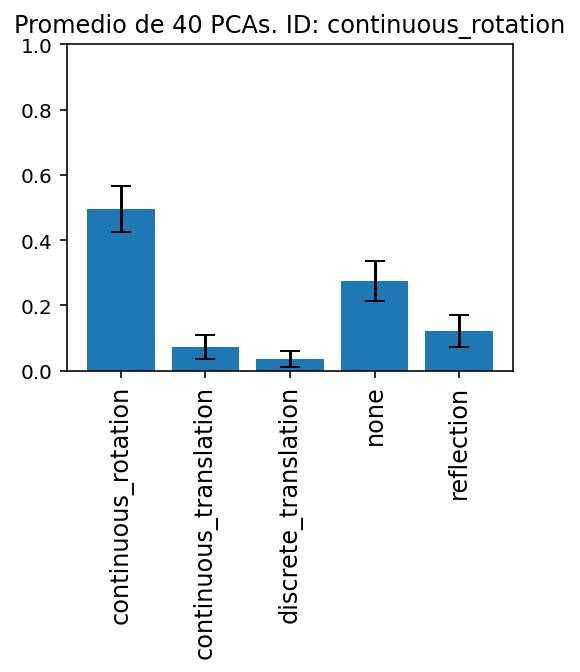

[0.00312928 0.60124488 0.00112435 0.24207234 0.15242916]


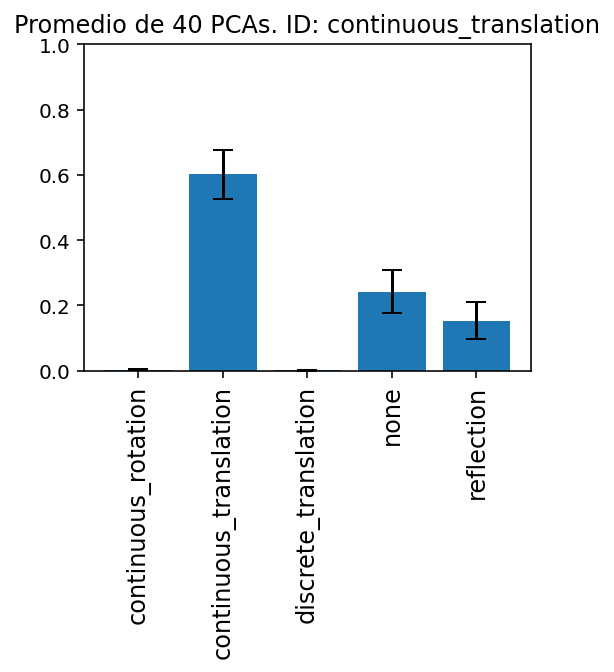

[0.02412363 0.15878713 0.68810776 0.06020098 0.0687805 ]


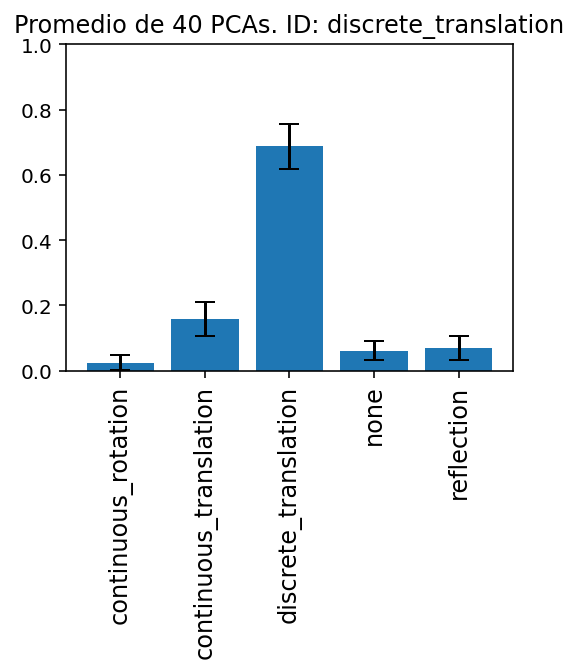

[0.02241982 0.16619421 0.0251053  0.59280704 0.19347363]


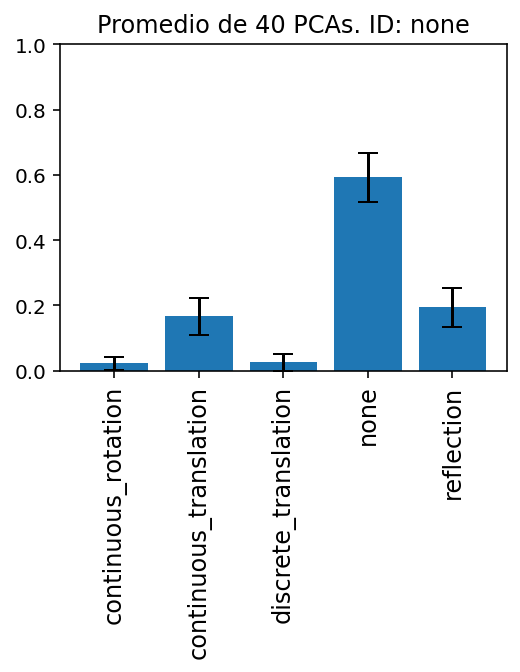

[0.06266573 0.08343393 0.00862786 0.28820541 0.55706706]


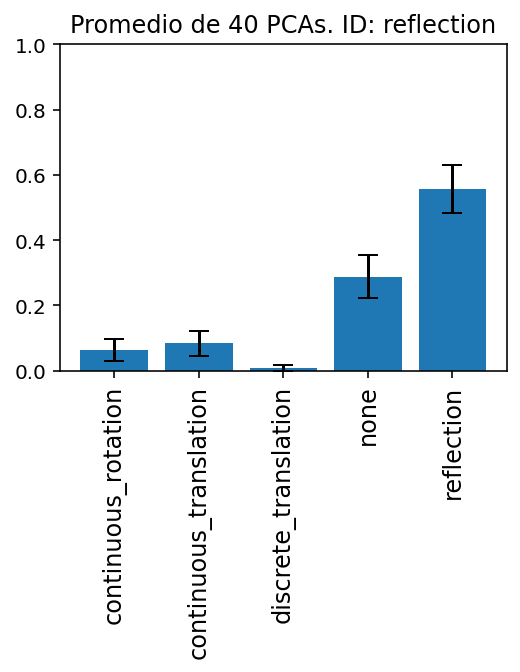

In [21]:
nom_carp = 'PCAs_detector_sin_xy'

#import libraries
%config InlineBackend.figure_format = 'retina'
import seaborn as sns
from IPython.core.display import display, HTML, clear_output
display(HTML("<style>.container { width:100% !important; } div.cell.selected {border-left-width: 0px !important;}</style>"))

from time import time
import os
import glob
from fastai.vision.all import *
import numpy as np
from IPython.display import clear_output
import itertools as it
import more_itertools
#import torchvision.models
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default ="none"
import base64
from PIL import Image
from io import BytesIO
import torch
import gc
#import libraries

if not 'notebook_dir' in globals():
    notebook_dir = os.getcwd()
print('Notebook directory: ' + notebook_dir)
os.chdir(notebook_dir)  # If you changed the current working dir, this will take you back to the workbook dir.
top_dir = notebook_dir



modelo = 'G' 

if modelo == 'G':
    learn = load_learner('/home/gabriel/Desktop/models/model_90_accu_resnet18_one_cycle_10+5_no_mixup'+'.pkl', cpu=False)
     


        
#Reset Registro

registro = pd.DataFrame({
    'Col_Quit':[0], 'Run':[0],
    'continuous_rotation':[0], 'continuous_translation':[0], 'discrete_translation':[0], 'none':[0], 'reflection':[0]
})
registro = registro.drop(0)
#registro

sims = pd.DataFrame(columns = learn.dls.vocab)
errs = sims.copy()

num_img_cat = [] #guardo el numero de imagenes de cada categoria
i = 0
plote = False

from IPython.utils import io



for dires in np.sort(Path('/home/gabriel/Desktop/' + nom_carp).ls()):
    #path = Path('/home/gabriel/Desktop/PCA_INE_sexo/INE/'+quitadas)
    quitadas = str(dires).split('/')[-1]
    with io.capture_output() as captured:
        for ima in dires.ls():

            test_im_dir = ima

            im = PILImage.create(test_im_dir)

            # Orden: ['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']

            cate, num_cat, probs = learn.predict(im)


            '''
            if plote == True:
                plt.figure
                plt.figure(figsize=(4, 3))
                plt.title(ima)
                plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],probs)
                plt.xticks(rotation='vertical',fontsize = 12)
                plt.show()
            '''

            new_row = np.array([quitadas, i] + list(np.array(probs).astype(float))).reshape([1,-1])
            aden = pd.DataFrame(new_row,columns=registro.columns)

            registro = registro.append(aden, ignore_index=True)

            i+=1

    registro = registro.astype({
        'Col_Quit':str, 'Run':int,
        'continuous_rotation':float, 'continuous_translation':float, 'discrete_translation':float, 'none':float, 'reflection':float
    })  

    print('Numero Imagenes:',i)
    num_img_cat.append(i)



#registro.to_csv(r'/home/gabriel/Desktop/PCA_INE_salarios/registro_'+modelo+'.csv', index = False)
print(registro['Col_Quit'].unique())

#registro = pd.read_csv('/home/gabriel/Desktop/PCA_INE_sexo/registro.csv')

nombres_carps = registro['Col_Quit'].unique() #Nombres de las carpetas donde estan guyardadas las pcas de un tipo
num_carps = len(nombres_carps)
i = 0

for nom in nombres_carps:
    if i == 0:
        m_probs = np.array(registro.iloc[:num_img_cat[0],2:].mean())
        err_probs = np.array(registro.iloc[:num_img_cat[0],2:].std())
        nume = str(len(registro.iloc[:num_img_cat[0],2:]))
        print(learn.dls.vocab)
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)
    else:
        m_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].mean())
        err_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].std())
        nume = str(len(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:]))
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)

    if nom == '-ninguna-':
        tit = 'Promedio de '+nume+' PCAs sin quitar ninguna columna'
    else:
        tit = 'Promedio de '+nume+' PCAs. ID: '+ nom        

    
    plt.figure(figsize=(4, 3))
    plt.title(tit)
    #plt.title('Promedio de '+str(40)+' PCAs sin quitar ninguna columna')
    plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],
            m_probs,yerr = err_probs/np.sqrt(float(nume)), capsize = 5)
    plt.xticks(rotation='vertical',fontsize = 12)
    plt.ylim([0, 1])
    plt.show()
    
    i+=1

Text(0, 0.5, 'Predicted Symmetries')

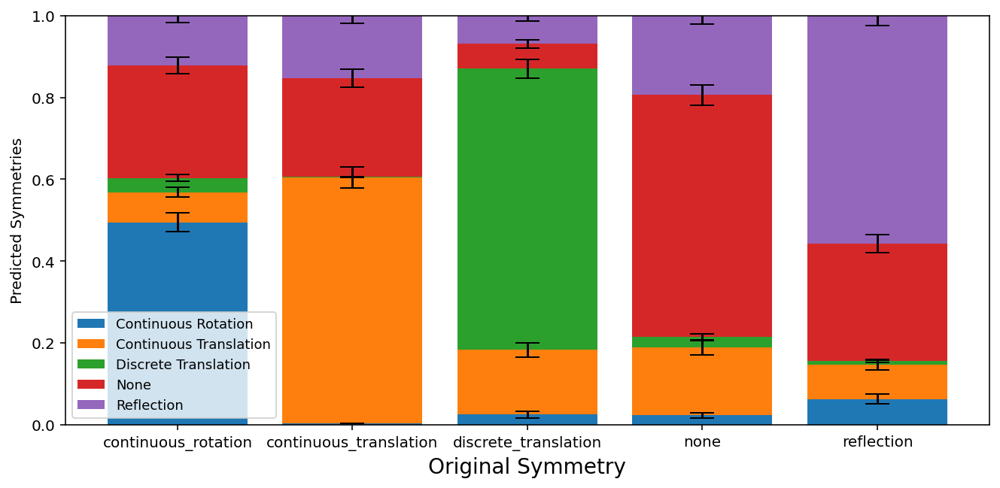

In [22]:
alfas = ['continuous_rotation','continuous_translation', 'discrete_translation', 'none', 'reflection' ]
plt.figure(figsize =[11,5])

plt.bar(range(len(sims.continuous_rotation)),sims.continuous_rotation, yerr = errs.continuous_rotation,capsize = 8,label = 'Continuous Rotation')
plt.bar(range(len(sims.none)),sims.continuous_translation, yerr = errs.continuous_translation,capsize = 8,label = 'Continuous Translation',bottom = sims.continuous_rotation)
plt.bar(range(len(sims.discrete_translation)),sims.discrete_translation, 
             yerr = errs.discrete_translation,capsize = 8,label = 'Discrete Translation', bottom = sims.continuous_rotation + sims.continuous_translation)
plt.bar(range(len(sims.discrete_translation)),sims.none, 
             yerr = errs.none,capsize = 8,label = 'None', 
             bottom = sims.continuous_rotation + sims.continuous_translation + sims.discrete_translation)
plt.bar(range(len(sims.discrete_translation)),sims.reflection, 
             yerr = errs.reflection,capsize = 8,label = 'Reflection', 
             bottom = sims.continuous_rotation + sims.continuous_translation + sims.discrete_translation + sims.none)


#plt.errorbar(range(len(sims.none)),sims.none, yerr = errs.none,capsize = 8,label = 'None')
#plt.errorbar(range(len(sims.none)),sims.none+sims.reflection, 
#             yerr = np.sqrt(errs.none**2 + errs.reflection**2),capsize = 8,label = 'Reflection + None')
#plt.errorbar(range(len(sims.continuous_translation)),sims.continuous_translation, 
#             yerr = errs.continuous_translation,capsize = 8,label = 'Continuous Translation')
tik = plt.xticks(range(len(sims.reflection)),alfas)
plt.legend(loc = 'lower left',fontsize = 9)
plt.xlabel('Original Symmetry',fontsize = 14)
plt.ylim([0,1.0])
plt.ylabel('Predicted Symmetries')
#plt.title('Efecto de quitar una categoría de CNACE en la simetría')

# Less noise variables

In [8]:
rep_todo = 200

# Tiempo en el que empezamos a procesar
from time import time
start_time = time()

for rtd in range(rep_todo):
    from fastai.vision.all import *
    from time import time
    from IPython.utils import io

    model_fi = 'RF' # RF or FW (random forests or featurewiz)
    #Tipos de simetría que quiero generar
    #syms = ['continuous_rotation', 'discrete_translation', 'reflection', 'none', 'continuous_translation']
    symmetries = ['continuous_rotation', 'discrete_translation', 'reflection', 'none', 'continuous_translation']

    num_pot_cada = 4 # Numero de potenciales de cada tipo

    int_1 = True #Interactions in Feature Importance 1 (RF)
    int_2 = False
    select_10k = True #Keep only 10000 elements of the original potential DF

    # ------------------- Folder PCA ------------------- #

    folder = 'PCAs_detector_less_noise'

    dd = top_dir + '/' + folder
    if not os.path.isdir(dd):
        print('Creating directory:\n',dd)
        os.mkdir(dd)

    dir = os.path.join(top_dir,folder)

    #------------------------------ Generar Potenciales ---------------------------#


    potenciales = []
    potenciales_tags = []

    for symmetry in symmetries:
        print('Generating Potentials for',symmetry,'symmetry')
        funs_temp = [mock_data(sym = symmetry, verbose = False, num_bas = 2 ) for i in range(num_pot_cada)]
        funs_tags_temp = [symmetry for i in range(num_pot_cada)]
        potenciales = potenciales + funs_temp 
        potenciales_tags = potenciales_tags + funs_tags_temp

    # Vamos a ordenar los potenciales de forma aleatoria, aunque en realidad
    # este paso no es relevante, puesto que para cada potencial entrenaremos una 
    # red. Si fuéramos a entrenar una red con todos los potenciales, entonces sí
    # que sería relevante.

    num_pot = len(potenciales) # Numero de Potenciales que quiero (por si no quiero todos)

    c = list(zip(potenciales,potenciales_tags))

    # Barajamos los potenciales, para pasarseslos en orden aleatorio
    #random.shuffle(c)

    potenciales_aux, tags = zip(*c)

    potenciales = [potenciales_aux[i] for i in range(num_pot)]


    class SaveModelCallback(TrackerCallback):
        "A `TrackerCallback` that saves the model's best during training and loads it at the end."
        _only_train_loop = True
        def __init__(self, monitor='valid_loss', comp=None, min_delta=0., fname='model', every_epoch=False, at_end=False,
                     with_opt=False, reset_on_fit=True):
            super().__init__(monitor=monitor, comp=comp, min_delta=min_delta, reset_on_fit=reset_on_fit)
            assert not (every_epoch and at_end), "every_epoch and at_end cannot both be set to True"
            # keep track of file path for loggers
            self.last_saved_path = None
            store_attr('fname,every_epoch,at_end,with_opt')

        def _save(self, name): self.last_saved_path = self.learn.save(name, with_opt=self.with_opt)

        def after_epoch(self):
            "Compare the value monitored to its best score and save if best."
            if self.every_epoch: self._save(f'{self.fname}_{self.epoch}')
            else: #every improvement
                super().after_epoch()
                if self.new_best:
                    #print(f'Better model found at epoch {self.epoch} with {self.monitor} value: {self.best}.')
                    self._save(f'{self.fname}')

        def after_fit(self, **kwargs):
            "Load the best model."
            if self.at_end: self._save(f'{self.fname}')
            elif not self.every_epoch: self.learn.load(f'{self.fname}', with_opt=self.with_opt)

    # ---------------- Definiciones previas e hiperparámetros ----------------- #

    #Guardo los modelos para analizarlos luego
    models = [] 
    to_s = []

    #Guardaremos los resultados de la PCA en un array 
    PCA_s = []
    PCA_s_tag = []

    # Hyperparameters: De momento los pondré aquí, pero luego serán un input entero
    bs_choices = [50000]       # Batch Size
    shape='pipe'               # Shape of the neural network
    layers_choices = [5]       # Number of layers of the net. Default:10 or 5
    neurons_choices = [50]    # Number of neurons per layer. Default:200
    epoch_choices = [150]      # Number of training epochs. Default:200
    lr_choices = [0.01]       # Max learning rate 
    valid_pct=0.2              # Part of the data that goes into validation (0.2 = 20%)
    monitor= 'valid_loss'        # Te model with the least 'monitor' will be saved



    # ---------------------- Entrenar Red Y PCA -----------------------------------#

    j = 1 # Usaremos esto para saber cuantos potenciales hemos procesado, y como indice en general

    for df in potenciales:


        #------------------------------ Feature Importance inicial ---------------------------#

        if select_10k == True:
            if len(df.bin) <= 100*100:
                print('Too little data to keep 10k points')
            else:
                print('Keeping 10k points of the original DF')
                remove_n = len(df.bin) - 10000
                drop_indices = np.random.choice(df.index, remove_n, replace=False)
                df_temp = df.drop(drop_indices)
                df = df_temp.copy()


        print('First Feature importance')

        if model_fi == 'FW':

            #Select 10k random elements without repetition
            inds = random.sample(range(len(df)), len(df))
            inds = np.sort(inds)
            small_df = df.iloc[inds,:]

            with io.capture_output() as captured1: output = featurewiz(small_df, 'bin', corr_limit=0.1,
                                                                        verbose=0, sep=',', header=0, test_data='',
                                                                        feature_engg='', category_encoders='')

            two_best = output[0][:2]

        elif model_fi == 'RF':

            small_df = df.copy()

            if int_1 == True:

                n_f = len(small_df)

                small_df.drop('bin', axis = 1)
                small_df = my_interactions_small(small_df.astype(np.float32), numo_int = int(len(small_df.columns)/2 + 1), verbose = True)

                small_df['bin'] = df.bin

            else:
                n_f = len(small_df)

            best_feat, imp = fast_feat_imp_rf(small_df.astype(np.float32),target = 'bin', graph = False)
            cm_rf = small_df[best_feat[:n_f]].corr()

            corr_imp = np.exp(np.array(imp[:n_f]))*(1-np.abs(cm_rf.iloc[:,0]))

            two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]

        else:
            print('Valid model for feature importance not specified. Using Random Forests by default')

            small_df = df.copy()

            if int_1 == True:

                n_f = len(small_df)

                small_df.drop('bin', axis = 1)
                small_df = my_interactions_small(small_df.astype(np.float32), numo_int = int(len(small_df.columns)/2 + 1), verbose = True)

                small_df['bin'] = df.bin

            else:
                n_f = 10

            best_feat, imp = fast_feat_imp_rf(df.astype(np.float32),target = 'bin', graph = False)
            cm_rf = df[best_feat[:n_f]].corr()

            corr_imp = np.exp(np.array(imp[:n_f]))*(1-np.abs(cm_rf.iloc[:,0]))

            two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]


        small_df = small_df[two_best]




        print('Second Feature importance')

        if model_fi == 'FW':

            small_df['bin'] = df.bin

            with io.capture_output() as captured2: output = featurewiz(small_df, 'bin', corr_limit=0.10,
                                                        verbose=0, sep=',', header=0, test_data='',
                                                        category_encoders='',feature_engg='interactions')   

            small_df = output[1].copy()
            two_best_2 = output[0][:2]

        elif model_fi == 'RF':

            n_f = 10

            if int_2 == True:
                small_df = my_interactions(small_df.astype(np.float32), numo_int = len(small_df.columns), verbose = False)

            small_df['bin'] = df.bin

            best_feat, imp = fast_feat_imp_rf(small_df.astype(np.float32),target = 'bin', graph = False)
            cm_rf = small_df[best_feat[:n_f]].corr()

            corr_imp = np.exp(np.array(imp[:n_f]))*(1-np.abs(cm_rf.iloc[:,0]))

            two_best_2 = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]


        else:
            print('Valid model for feature importance not specified. Using Random Forests by default')

            n_f = 10

            small_df = my_interactions(small_df, numo_int = len(small_df), verbose = False)
            small_df['bin'] = df.bin

            best_feat, imp = fast_feat_imp_rf(small_df,target = 'bin', graph = False)
            cm_rf = small_df[best_feat[:n_f]].corr()

            corr_imp = np.exp(np.array(imp[:n_f]))*(1-np.abs(cm_rf.iloc[:,0]))

            two_best_2 = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]




        # Debemos marcar cada potencial para tener claro a qué tipo de simetria corresponde cada PCA
        PCA_s_tag.append(tags[j-1])

        df2 = small_df.copy() 

        splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

        to = TabularPandas(df2,
                        procs=[Categorify,FillMissing, Normalize],
                        cont_names = two_best_2,
                        y_names = 'bin',
                        splits=splits)

        train_size = len(splits[0])
        valid_size = len(splits[1])

        # ----------------- Hyperparameters ------------------- #

        # Batch Size (a large one)
        bs=min(random.choice(bs_choices),train_size)  
        print('{} batch size for training.\n'.format(bs))

        # Neurons per layer
        neurons_per_layer = random.choice(neurons_choices)

        # Number of layers
        n_layers = random.choice(layers_choices)

        #Shape of the net: Pipe or funnel
        if shape == 'pipe':
            layers=[neurons_per_layer for i in range(n_layers)]

        if shape == 'funnel':
            n_eff = n_layers
            layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

        print('Training FCNN with layers: ',layers)

        #Number of epochs
        n_epoch=random.choice(epoch_choices)
        print('Training for {} epochs.'.format(n_epoch))

        # Maximum Learning Rate: (a good value can be found using learn.lr_find())
        lr_max=float(random.choice(lr_choices))
        print('Using lr_max = ',format(lr_max))

        # ----------------------------------------------------- #

        # --------------- Training the FCNN --------------------#

        # Load the data into a DataLoader
        dls = to.dataloaders(bs=bs)

        # Define a Tabular Learner
        learn = tabular_learner(dls, layers=layers
                            #,config=config
                            #,metrics=[mse],
                            #y_range = [min(df.bin),max(df.bin)],
                            #,cbs=ShowGraphCallback()
                            #,train_bn=False)
                            )

        # Train the net 
        with learn.no_logging():
            learn.fit_one_cycle(n_epoch=n_epoch
                                ,lr_max=lr_max
                                ,cbs=[SaveModelCallback(monitor=monitor)]
                                )

        # Guardamos modelos y tabular objects para el posterior analisis
        models.append(learn)
        to_s.append(to)

        # ------------------------------------------------------#


        # ------------------------- PCA ------------------------#

        test_df = df2.copy()
        dl = learn.dls.test_dl(test_df,bs=int(test_df.shape[0])) 

        # Tenemos que hacer un Hook, una especie de gancho que enganchamos en la última capa interna,
        # para guardar, de cada modelo, los valores de los parámetro de dicha capa. 
        with Hooks(learn.model.layers, lambda m,i,o: o) as h:
            preds = learn.get_preds(dl=dl,with_input=True,with_decoded=True,with_loss=True)

        targets=preds[2].numpy().flatten()

        # Cogemos la información de la penúltima capa
        # OJO: Si añadimos y_range, se añade automaticamente una sigmoid
        # al final, por lo que tendríamos que coger la capa -3 en vez de la -2
        act = h.stored[-2] 
        multi_dim=Tensor.cpu(act).numpy()
        standardized=StandardScaler().fit_transform(multi_dim)

        viz = PCA(2).fit_transform(np.nan_to_num(standardized))
        #plt.figure()
        #plt.scatter(viz[:, 0], viz[:, 1],c=targets[:multi_dim.shape[0]],alpha=.1, marker = 'o')

        PCA_s.append(viz)

        # ------------------------------------------------------ #

        # ------------------ Saving the PCA's ------------------ #

        # ---- Dar formato a PCA para guardar como imagen con color

        viz = pd.DataFrame(viz) #Transformamos la PCA en un dataframe
        viz.columns = ['x','y'] #Nombres de las columnas

        # Insertamos una columna con los colores de los puntos. El valor del potencial
        # objetivo (targets) es el color, y hay un color por cada punto 
        viz.insert(2,'class',targets[:multi_dim.shape[0]]) 

        # ---- Personalizar mapa de color 

        n_classes=1000

        colors = 'rainbow'

        if colors == 'rainbow':
            my_cmap = plt.cm.get_cmap('rainbow', n_classes)
            classes_in_rgb = my_cmap(range(n_classes))
        if colors == 'purple':
            my_cmap = plt.cm.get_cmap('rainbow', n_classes)
            classes_in_rgb = np.vstack((np.array([0,0,0,0]),my_cmap([0 for i in range(n_classes)])))

        # ---- Hacer que la intensidad del pixel represente la cantidad de puntos 
        #      acumuldos en un pixel

        n_pixels = 224

        binning_3d=np.histogramdd([viz['x'],viz['y'],viz['class']],range=(None,None,(0,1)), bins=(n_pixels,n_pixels,n_classes))

        #if we want the pixel intensity to reprensent the number of points at that location
        array = np.dot(binning_3d[0],classes_in_rgb)
        array = array/np.amax(array)

        # ---- Guardar la PCA

        #Directorio donde guardaremos las imagenes
        dir_sym = os.path.join(dir,tags[j-1])
        if not os.path.isdir(dir_sym):
            print('Creating directory:\n',dir_sym)
            os.mkdir(dir_sym)


        # Nombre de la imagen. Pongo el tiempo para que todas se llamen distinto cada vez.
        img_file = str(tags[j-1])+'_'+str(j)+str(round(time()))+'-'+str(n_classes)+'_'+'color_classes--'+'_PCA.png' 
        output_dir = os.path.join(dir_sym,img_file) # Directorio donde guardamos la imagen
        plt.imsave(output_dir,array) # Guardar
        print('\nPCA saved to:\n{}\n'.format(dir_sym+'/'+img_file))

        # ------------------------ Time -------------------------#

        minutes_until_now = (time() - start_time)/60
        images_done = j+num_pot*rtd
        minutes_per_image = minutes_until_now/(images_done)
        hours_left = minutes_per_image * (num_pot*rep_todo-images_done)/60
        print("\n{} PCA's made out of {}.\n".format(images_done,num_pot*rep_todo))
        print("{:.1f} minutes elapsed for {} images.".format(minutes_until_now,images_done))
        print("{:.1f} minutes average per image.".format(minutes_until_now/images_done))
        print("{:.1f} minutes estimated left for {} images.\n\n\n".format(hours_left*60,num_pot*rep_todo-images_done))
        print("{:.1f} hours estimated left for {} images.\n\n\n".format(hours_left,num_pot*rep_todo-images_done))
        j+=1

      # ------------------------------------------------------#

Generating Potentials for continuous_rotation symmetry
Generating Potentials for discrete_translation symmetry
Generating Potentials for reflection symmetry
Generating Potentials for none symmetry
Generating Potentials for continuous_translation symmetry
Too little data to keep 10k points
First Feature importance
All 43 columns were squared
Total number of columns created by linear combination: 231
Total number of columns created by linear combination of squared variables: 231
   Regularising...

 Total number of features: 544
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_less_noise/continuous_rotation/continuous_rotation_11636712956-1000_color_classes--_PCA.png


1 PCA's made out of 4000.

0.1 minutes elapsed for 1 images.
0.1 minutes average per image.
590.1 minutes estimated left for 3999 images.



9.8 hours estimated left for 3999 images.



Too little data to keep 10k points
First Feature importance
All 43 columns were squared
Total number of columns created by linear combination: 231
Total number of columns created by linear combination of squared variables: 231
   Regularising...

 Total number of features: 544
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01


KeyboardInterrupt: 

Notebook directory: /home/gabriel/Desktop
Numero Imagenes: 801
Numero Imagenes: 1601
Numero Imagenes: 2401
Numero Imagenes: 3201
Numero Imagenes: 4041
['continuous_rotation' 'continuous_translation' 'discrete_translation'
 'none' 'reflection']
['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']
[0.47262121 0.07807444 0.03532536 0.27717886 0.13680014]


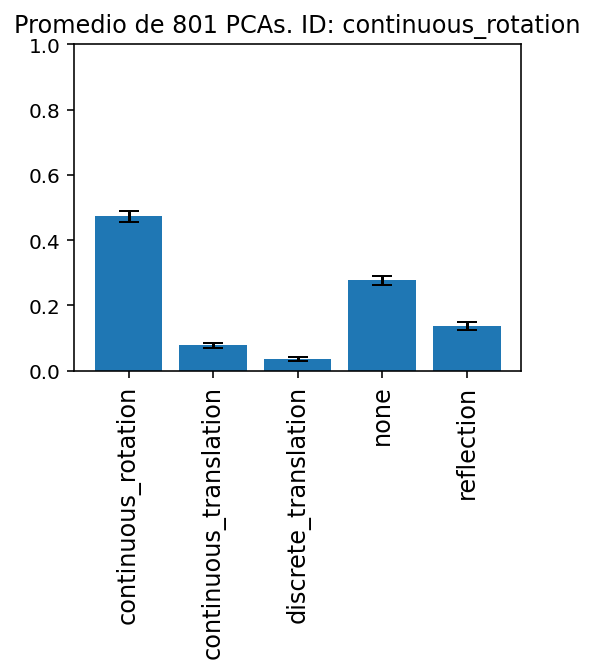

[0.03640764 0.5525679  0.01098996 0.37932455 0.02070996]


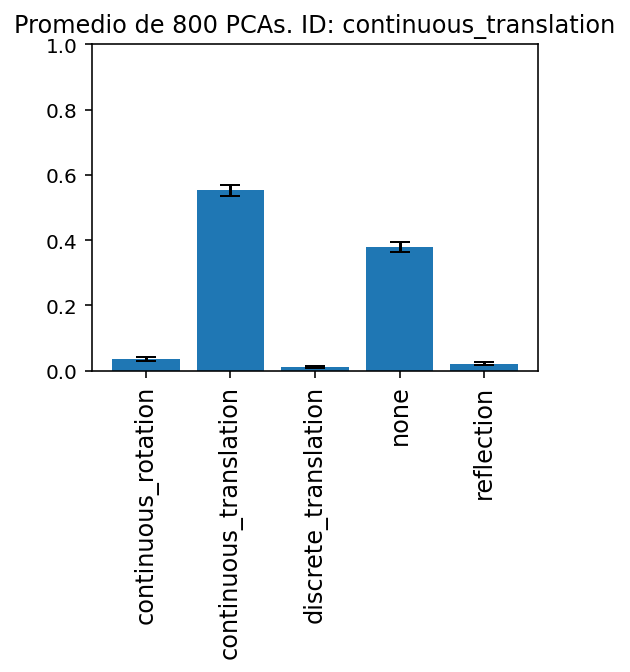

[0.00877707 0.13054435 0.65734255 0.10625587 0.09708016]


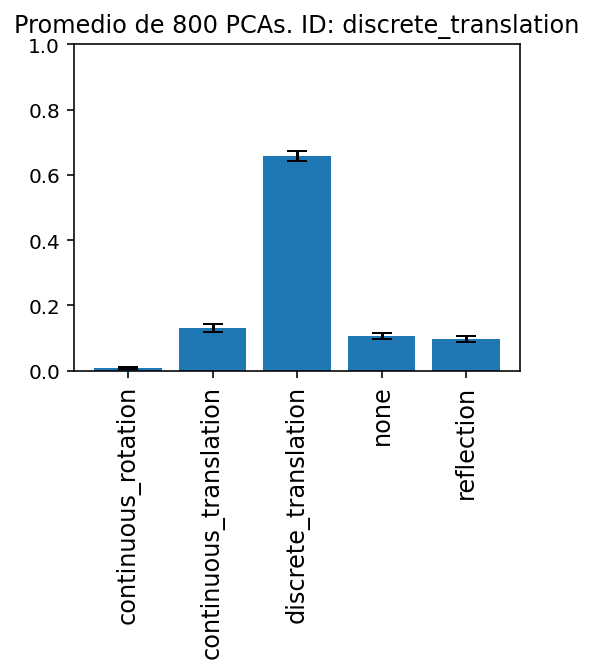

[0.03036768 0.14107198 0.0261153  0.7010606  0.10138445]


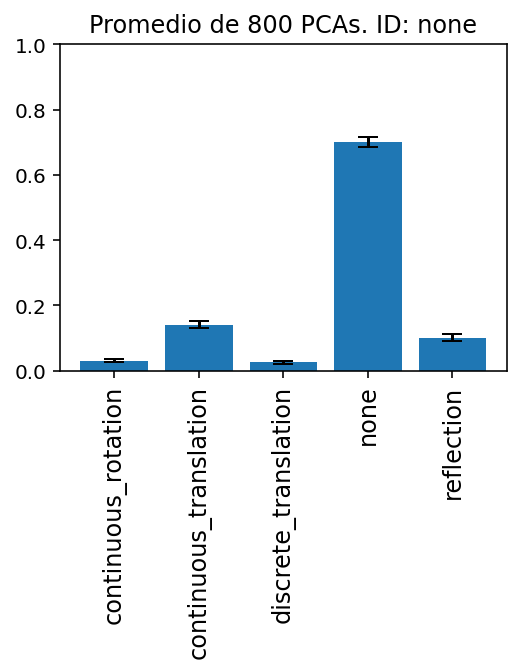

[0.06962864 0.06576534 0.01592148 0.3272453  0.52143924]


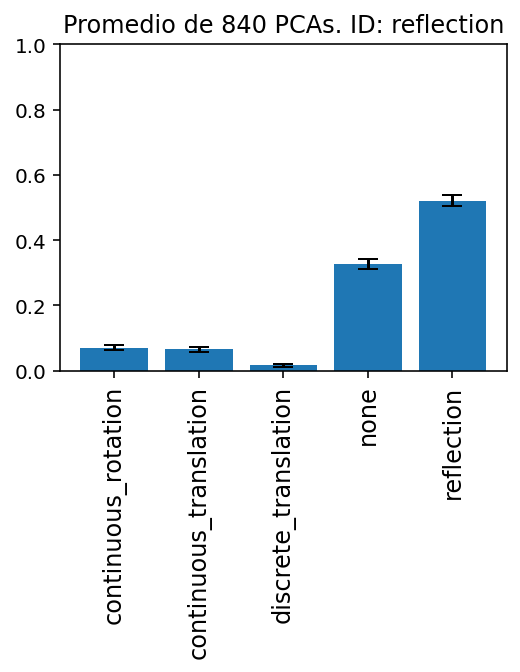

In [16]:
nom_carp = 'PCAs_detector_less_noise'

#import libraries
%config InlineBackend.figure_format = 'retina'
import seaborn as sns
from IPython.core.display import display, HTML, clear_output
display(HTML("<style>.container { width:100% !important; } div.cell.selected {border-left-width: 0px !important;}</style>"))

from time import time
import os
import glob
from fastai.vision.all import *
import numpy as np
from IPython.display import clear_output
import itertools as it
import more_itertools
#import torchvision.models
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default ="none"
import base64
from PIL import Image
from io import BytesIO
import torch
import gc
#import libraries

if not 'notebook_dir' in globals():
    notebook_dir = os.getcwd()
print('Notebook directory: ' + notebook_dir)
os.chdir(notebook_dir)  # If you changed the current working dir, this will take you back to the workbook dir.
top_dir = notebook_dir



modelo = 'G' 

if modelo == 'G':
    learn = load_learner('/home/gabriel/Desktop/models/model_90_accu_resnet18_one_cycle_10+5_no_mixup'+'.pkl', cpu=False)
     


        
#Reset Registro

registro = pd.DataFrame({
    'Col_Quit':[0], 'Run':[0],
    'continuous_rotation':[0], 'continuous_translation':[0], 'discrete_translation':[0], 'none':[0], 'reflection':[0]
})
registro = registro.drop(0)
#registro

sims = pd.DataFrame(columns = learn.dls.vocab)
errs = sims.copy()

num_img_cat = [] #guardo el numero de imagenes de cada categoria
i = 0
plote = False

from IPython.utils import io



for dires in np.sort(Path('/home/gabriel/Desktop/' + nom_carp).ls()):
    #path = Path('/home/gabriel/Desktop/PCA_INE_sexo/INE/'+quitadas)
    quitadas = str(dires).split('/')[-1]
    with io.capture_output() as captured:
        for ima in dires.ls():

            test_im_dir = ima

            im = PILImage.create(test_im_dir)

            # Orden: ['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']

            cate, num_cat, probs = learn.predict(im)


            '''
            if plote == True:
                plt.figure
                plt.figure(figsize=(4, 3))
                plt.title(ima)
                plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],probs)
                plt.xticks(rotation='vertical',fontsize = 12)
                plt.show()
            '''

            new_row = np.array([quitadas, i] + list(np.array(probs).astype(float))).reshape([1,-1])
            aden = pd.DataFrame(new_row,columns=registro.columns)

            registro = registro.append(aden, ignore_index=True)

            i+=1

    registro = registro.astype({
        'Col_Quit':str, 'Run':int,
        'continuous_rotation':float, 'continuous_translation':float, 'discrete_translation':float, 'none':float, 'reflection':float
    })  

    print('Numero Imagenes:',i)
    num_img_cat.append(i)



#registro.to_csv(r'/home/gabriel/Desktop/PCA_INE_salarios/registro_'+modelo+'.csv', index = False)
print(registro['Col_Quit'].unique())

#registro = pd.read_csv('/home/gabriel/Desktop/PCA_INE_sexo/registro.csv')

nombres_carps = registro['Col_Quit'].unique() #Nombres de las carpetas donde estan guyardadas las pcas de un tipo
num_carps = len(nombres_carps)
i = 0

for nom in nombres_carps:
    if i == 0:
        m_probs = np.array(registro.iloc[:num_img_cat[0],2:].mean())
        err_probs = np.array(registro.iloc[:num_img_cat[0],2:].std())
        nume = str(len(registro.iloc[:num_img_cat[0],2:]))
        print(learn.dls.vocab)
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)
    else:
        m_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].mean())
        err_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].std())
        nume = str(len(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:]))
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)

    if nom == '-ninguna-':
        tit = 'Promedio de '+nume+' PCAs sin quitar ninguna columna'
    else:
        tit = 'Promedio de '+nume+' PCAs. ID: '+ nom        

    
    plt.figure(figsize=(4, 3))
    plt.title(tit)
    #plt.title('Promedio de '+str(40)+' PCAs sin quitar ninguna columna')
    plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],
            m_probs,yerr = err_probs/np.sqrt(float(nume)), capsize = 5)
    plt.xticks(rotation='vertical',fontsize = 12)
    plt.ylim([0, 1])
    plt.show()
    
    i+=1

In [59]:
two_best_2

['0.19002219739454307y**2+0.1795768418356225x**2', '-0.9872283292969846x*y']

# Test: The same potential, several times

In [58]:
rep_todo = 10

# Tiempo en el que empezamos a procesar
from time import time
start_time = time()

for rtd in range(rep_todo):
    from fastai.vision.all import *
    from time import time
    from IPython.utils import io

    model_fi = 'FW' # RF or FW (random forests or featurewiz)
    #Tipos de simetría que quiero generar
    #syms = ['continuous_rotation', 'discrete_translation', 'reflection', 'none', 'continuous_translation']
    symmetries = ['reflection']

    num_pot_cada = 1 # Numero de potenciales de cada tipo

    int_1 = False #Interactions in Feature Importance 1 (RF)
    int_2 = False
    select_10k = True #Keep only 10000 elements of the original potential DF

    # ------------------- Folder PCA ------------------- #

    folder = 'PCAs_detector_test_1'

    dd = top_dir + '/' + folder
    if not os.path.isdir(dd):
        print('Creating directory:\n',dd)
        os.mkdir(dd)

    dir = os.path.join(top_dir,folder)

    #------------------------------ Generar Potenciales ---------------------------#


    potenciales = []
    potenciales_tags = []

    for symmetry in symmetries:
        '''
        print('Generating Potentials for',symmetry,'symmetry')
        funs_temp = [mock_data(sym = symmetry, verbose = False) for i in range(num_pot_cada)]
        funs_tags_temp = [symmetry for i in range(num_pot_cada)]
        potenciales = potenciales + funs_temp 
        
        '''
        potenciales_tags = potenciales_tags + funs_tags_temp
        potenciales = [df_fail]
        
    # Vamos a ordenar los potenciales de forma aleatoria, aunque en realidad
    # este paso no es relevante, puesto que para cada potencial entrenaremos una 
    # red. Si fuéramos a entrenar una red con todos los potenciales, entonces sí
    # que sería relevante.

    num_pot = len(potenciales) # Numero de Potenciales que quiero (por si no quiero todos)

    c = list(zip(potenciales,potenciales_tags))

    # Barajamos los potenciales, para pasarseslos en orden aleatorio
    #random.shuffle(c)

    potenciales_aux, tags = zip(*c)

    potenciales = [potenciales_aux[i] for i in range(num_pot)]




    class SaveModelCallback(TrackerCallback):
        "A `TrackerCallback` that saves the model's best during training and loads it at the end."
        _only_train_loop = True
        def __init__(self, monitor='valid_loss', comp=None, min_delta=0., fname='model', every_epoch=False, at_end=False,
                     with_opt=False, reset_on_fit=True):
            super().__init__(monitor=monitor, comp=comp, min_delta=min_delta, reset_on_fit=reset_on_fit)
            assert not (every_epoch and at_end), "every_epoch and at_end cannot both be set to True"
            # keep track of file path for loggers
            self.last_saved_path = None
            store_attr('fname,every_epoch,at_end,with_opt')

        def _save(self, name): self.last_saved_path = self.learn.save(name, with_opt=self.with_opt)

        def after_epoch(self):
            "Compare the value monitored to its best score and save if best."
            if self.every_epoch: self._save(f'{self.fname}_{self.epoch}')
            else: #every improvement
                super().after_epoch()
                if self.new_best:
                    #print(f'Better model found at epoch {self.epoch} with {self.monitor} value: {self.best}.')
                    self._save(f'{self.fname}')

        def after_fit(self, **kwargs):
            "Load the best model."
            if self.at_end: self._save(f'{self.fname}')
            elif not self.every_epoch: self.learn.load(f'{self.fname}', with_opt=self.with_opt)

    # ---------------- Definiciones previas e hiperparámetros ----------------- #

    #Guardo los modelos para analizarlos luego
    models = [] 
    to_s = []

    #Guardaremos los resultados de la PCA en un array 
    PCA_s = []
    PCA_s_tag = []

    # Hyperparameters: De momento los pondré aquí, pero luego serán un input entero
    bs_choices = [50000]       # Batch Size
    shape='pipe'               # Shape of the neural network
    layers_choices = [5]       # Number of layers of the net. Default:10 or 5 results with 5
    neurons_choices = [200]    # Number of neurons per layer. Default:200 results with 200
    epoch_choices = [60]      # Number of training epochs. Default:200 results with 60
    lr_choices = [0.01]       # Max learning rate 
    valid_pct=0.2              # Part of the data that goes into validation (0.2 = 20%)
    monitor= 'valid_loss'        # Te model with the least 'monitor' will be saved



    # ---------------------- Entrenar Red Y PCA -----------------------------------#

    j = 1 # Usaremos esto para saber cuantos potenciales hemos procesado, y como indice en general

    for df in potenciales:
        
        #------------------------------ Feature Importance inicial ---------------------------#

        if select_10k == True:
            if len(df.bin) <= 100*100:
                print('Too little data to keep 10k points')
            else:
                print('Keeping 10k points of the original DF')
                remove_n = len(df.bin) - 10000
                drop_indices = np.random.choice(df.index, remove_n, replace=False)
                df_temp = df.drop(drop_indices)
                df = df_temp.copy()


        print('First Feature importance')

        if model_fi == 'FW':

            #Select 10k random elements without repetition
            inds = random.sample(range(len(df)), len(df))
            inds = np.sort(inds)
            small_df = df.iloc[inds,:]
            

            with io.capture_output() as captured1: output = featurewiz(small_df, 'bin', corr_limit=0.1,
                                                                        verbose=0, sep=',', header=0, test_data='',
                                                                        feature_engg='', category_encoders='')
                
            
            #six_best = output[0][:10]

            two_best = output[0][:2]

        elif model_fi == 'RF':

            small_df = df.copy()

            if int_1 == True:

                n_f = len(small_df)

                small_df.drop('bin', axis = 1)
                small_df = my_interactions_small(small_df.astype(np.float32), numo_int = int(len(small_df.columns)/2 + 1), verbose = False)

                small_df['bin'] = df.bin

            else:
                n_f = len(small_df)

            
            best_feat, imp = fast_feat_imp_rf(df.astype(np.float32),target = 'bin', graph = False)
            cm_rf = df[best_feat[:n_f]].corr()

            
            corr_imp = np.exp(np.array(imp[:n_f])**2)*((1-np.abs(cm_rf.iloc[:,0]))**2)
            
            #print(corr_imp.sort_values())

            #two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]
            two_best = [(corr_imp.iloc[:].sort_values()).index[-1],(corr_imp.iloc[:].sort_values()).index[-2]]
            
            small_df = small_df[two_best]
            
       

        else:
            print('Valid model for feature importance not specified. Using Random Forests by default')

            small_df = df.copy()

            if int_1 == True:

                n_f = len(small_df)

                small_df.drop('bin', axis = 1)
                small_df = my_interactions_small(small_df.astype(np.float32), numo_int = int(len(small_df.columns)/2 + 1), verbose = True)

                small_df['bin'] = df.bin

            else:
                n_f = 10

            best_feat, imp = fast_feat_imp_rf(small_df.astype(np.float32),target = 'bin', graph = False)
            cm_rf = small_df[best_feat[:n_f]].corr()

            corr_imp = np.exp(np.array(imp[:n_f]))*(1-np.abs(cm_rf.iloc[:,0]))

            two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]


            small_df = small_df[two_best]


        print([two_best])

        print('Second Feature importance')

        if model_fi == 'FW':
            
            small_df = small_df[two_best]

            small_df['bin'] = df.bin

            with io.capture_output() as captured2: output = featurewiz(small_df, 'bin', corr_limit=0.10,
                                                        verbose=0, sep=',', header=0, test_data='',
                                                        category_encoders='',feature_engg='interactions')   

            small_df = output[1].copy()
            two_best_2 = output[0][:2]

        elif model_fi == 'RF':

            n_f = 10

            if int_2 == True:
                small_df = my_interactions(small_df.astype(np.float32), numo_int = len(small_df.columns), verbose = False)

            small_df['bin'] = df.bin

            best_feat, imp = fast_feat_imp_rf(small_df.astype(np.float32),target = 'bin', graph = False)
            cm_rf = small_df[best_feat[:n_f]].corr()

            corr_imp = np.exp(np.array(imp[:n_f]))*(1-np.abs(cm_rf.iloc[:,0]))

            two_best_2 = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]


        else:
            print('Valid model for feature importance not specified. Using Random Forests by default')

            n_f = 10

            small_df = my_interactions(small_df, numo_int = len(small_df), verbose = False)
            small_df['bin'] = df.bin

            best_feat, imp = fast_feat_imp_rf(small_df,target = 'bin', graph = False)
            cm_rf = small_df[best_feat[:n_f]].corr()

            corr_imp = np.exp(np.array(imp[:n_f]))*(1-np.abs(cm_rf.iloc[:,0]))

            two_best_2 = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]




        # Debemos marcar cada potencial para tener claro a qué tipo de simetria corresponde cada PCA
        PCA_s_tag.append(tags[j-1])

        df2 = small_df.copy() 

        splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

        to = TabularPandas(df2,
                        procs=[Categorify,FillMissing, Normalize],
                        cont_names = two_best_2,
                        y_names = 'bin',
                        splits=splits)

        train_size = len(splits[0])
        valid_size = len(splits[1])

        # ----------------- Hyperparameters ------------------- #

        # Batch Size (a large one)
        bs=min(random.choice(bs_choices),train_size)  
        print('{} batch size for training.\n'.format(bs))

        # Neurons per layer
        neurons_per_layer = random.choice(neurons_choices)

        # Number of layers
        n_layers = random.choice(layers_choices)

        #Shape of the net: Pipe or funnel
        if shape == 'pipe':
            layers=[neurons_per_layer for i in range(n_layers)]

        if shape == 'funnel':
            n_eff = n_layers
            layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

        print('Training FCNN with layers: ',layers)

        #Number of epochs
        n_epoch=random.choice(epoch_choices)
        print('Training for {} epochs.'.format(n_epoch))

        # Maximum Learning Rate: (a good value can be found using learn.lr_find())
        lr_max=float(random.choice(lr_choices))
        print('Using lr_max = ',format(lr_max))

        # ----------------------------------------------------- #

        # --------------- Training the FCNN --------------------#

        # Load the data into a DataLoader
        dls = to.dataloaders(bs=bs)

        # Define a Tabular Learner
        learn = tabular_learner(dls, layers=layers
                            #,config=config
                            #,metrics=[mse],
                            #y_range = [min(df.bin),max(df.bin)],
                            #,cbs=ShowGraphCallback()
                            #,train_bn=False)
                            )

        # Train the net 
        with learn.no_logging():
            learn.fit_one_cycle(n_epoch=n_epoch
                                ,lr_max=lr_max
                                ,cbs=[SaveModelCallback(monitor=monitor)]
                                )

        # Guardamos modelos y tabular objects para el posterior analisis
        models.append(learn)
        to_s.append(to)

        # ------------------------------------------------------#


        # ------------------------- PCA ------------------------#

        test_df = df2.copy()
        dl = learn.dls.test_dl(test_df,bs=int(test_df.shape[0])) 

        # Tenemos que hacer un Hook, una especie de gancho que enganchamos en la última capa interna,
        # para guardar, de cada modelo, los valores de los parámetro de dicha capa. 
        with Hooks(learn.model.layers, lambda m,i,o: o) as h:
            preds = learn.get_preds(dl=dl,with_input=True,with_decoded=True,with_loss=True)

        targets=preds[2].numpy().flatten()

        # Cogemos la información de la penúltima capa
        # OJO: Si añadimos y_range, se añade automaticamente una sigmoid
        # al final, por lo que tendríamos que coger la capa -3 en vez de la -2
        act = h.stored[-2] 
        multi_dim=Tensor.cpu(act).numpy()
        standardized=StandardScaler().fit_transform(multi_dim)

        viz = PCA(2).fit_transform(np.nan_to_num(standardized))
        #plt.figure()
        #plt.scatter(viz[:, 0], viz[:, 1],c=targets[:multi_dim.shape[0]],alpha=.1, marker = 'o')

        PCA_s.append(viz)

        # ------------------------------------------------------ #

        # ------------------ Saving the PCA's ------------------ #

        # ---- Dar formato a PCA para guardar como imagen con color

        viz = pd.DataFrame(viz) #Transformamos la PCA en un dataframe
        viz.columns = ['x','y'] #Nombres de las columnas

        # Insertamos una columna con los colores de los puntos. El valor del potencial
        # objetivo (targets) es el color, y hay un color por cada punto 
        viz.insert(2,'class',targets[:multi_dim.shape[0]]) 

        # ---- Personalizar mapa de color 

        n_classes=1000

        colors = 'rainbow'

        if colors == 'rainbow':
            my_cmap = plt.cm.get_cmap('rainbow', n_classes)
            classes_in_rgb = my_cmap(range(n_classes))
        if colors == 'purple':
            my_cmap = plt.cm.get_cmap('rainbow', n_classes)
            classes_in_rgb = np.vstack((np.array([0,0,0,0]),my_cmap([0 for i in range(n_classes)])))

        # ---- Hacer que la intensidad del pixel represente la cantidad de puntos 
        #      acumuldos en un pixel

        n_pixels = 224

        binning_3d=np.histogramdd([viz['x'],viz['y'],viz['class']],range=(None,None,(0,1)), bins=(n_pixels,n_pixels,n_classes))

        #if we want the pixel intensity to reprensent the number of points at that location
        array = np.dot(binning_3d[0],classes_in_rgb)
        array = array/np.amax(array)

        # ---- Guardar la PCA

        #Directorio donde guardaremos las imagenes
        dir_sym = os.path.join(dir,tags[j-1])
        if not os.path.isdir(dir_sym):
            print('Creating directory:\n',dir_sym)
            os.mkdir(dir_sym)


        # Nombre de la imagen. Pongo el tiempo para que todas se llamen distinto cada vez.
        img_file = str(tags[j-1])+'_'+str(j)+str(round(time()))+'-'+str(n_classes)+'_'+'color_classes--'+'_PCA.png' 
        output_dir = os.path.join(dir_sym,img_file) # Directorio donde guardamos la imagen
        plt.imsave(output_dir,array) # Guardar
        print('\nPCA saved to:\n{}\n'.format(dir_sym+'/'+img_file))

        # ------------------------ Time -------------------------#

        minutes_until_now = (time() - start_time)/60
        images_done = j+num_pot*rtd
        minutes_per_image = minutes_until_now/(images_done)
        hours_left = minutes_per_image * (num_pot*rep_todo-images_done)/60
        print("\n{} PCA's made out of {}.\n".format(images_done,num_pot*rep_todo))
        print("{:.1f} minutes elapsed for {} images.".format(minutes_until_now,images_done))
        print("{:.1f} minutes average per image.".format(minutes_until_now/images_done))
        print("{:.1f} minutes estimated left for {} images.\n\n\n".format(hours_left*60,num_pot*rep_todo-images_done))
        print("{:.1f} hours estimated left for {} images.\n\n\n".format(hours_left,num_pot*rep_todo-images_done))
        j+=1


      # ------------------------------------------------------#



Too little data to keep 10k points
First Feature importance
[['-0.7220221123216519y+0.03616050896731138x', '-0.025001665736590795r1/y']]
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [200, 200, 200, 200, 200]
Training for 60 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_test_1/reflection/reflection_11636978524-1000_color_classes--_PCA.png


1 PCA's made out of 10.

0.2 minutes elapsed for 1 images.
0.2 minutes average per image.
1.6 minutes estimated left for 9 images.



0.0 hours estimated left for 9 images.



Too little data to keep 10k points
First Feature importance
[['-0.7220221123216519y+0.03616050896731138x', '-0.025001665736590795r1/y']]
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [200, 200, 200, 200, 200]
Training for 60 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_test_1/reflection/reflection_11636978534-1000_color_classes--_PCA.png


2 PCA's made out of 10.

0.3 minutes elapsed for 2 images.
0.2 minutes average per image.
1.4 minutes estimated left for 8 images.



0.0 hours estimated left for 8 images.



Too little data to keep 10k points
First Feature importance
[['-0.7220221123216519y+0.03616050896731138x', '-0.025001665736590795r1/y']]
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [200, 200, 200, 200, 200]
Training for 60 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_test_1/reflection/reflection_11636978544-1000_color_classes--_PCA.png


3 PCA's made out of 10.

0.5 minutes elapsed for 3 images.
0.2 minutes average per image.
1.2 minutes estimated left for 7 images.



0.0 hours estimated left for 7 images.



Too little data to keep 10k points
First Feature importance
[['-0.7220221123216519y+0.03616050896731138x', '-0.025001665736590795r1/y']]
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [200, 200, 200, 200, 200]
Training for 60 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_test_1/reflection/reflection_11636978555-1000_color_classes--_PCA.png


4 PCA's made out of 10.

0.7 minutes elapsed for 4 images.
0.2 minutes average per image.
1.0 minutes estimated left for 6 images.



0.0 hours estimated left for 6 images.



Too little data to keep 10k points
First Feature importance
[['-0.7220221123216519y+0.03616050896731138x', '-0.025001665736590795r1/y']]
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [200, 200, 200, 200, 200]
Training for 60 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_test_1/reflection/reflection_11636978566-1000_color_classes--_PCA.png


5 PCA's made out of 10.

0.9 minutes elapsed for 5 images.
0.2 minutes average per image.
0.9 minutes estimated left for 5 images.



0.0 hours estimated left for 5 images.



Too little data to keep 10k points
First Feature importance
[['-0.7220221123216519y+0.03616050896731138x', '-0.025001665736590795r1/y']]
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [200, 200, 200, 200, 200]
Training for 60 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_test_1/reflection/reflection_11636978576-1000_color_classes--_PCA.png


6 PCA's made out of 10.

1.0 minutes elapsed for 6 images.
0.2 minutes average per image.
0.7 minutes estimated left for 4 images.



0.0 hours estimated left for 4 images.



Too little data to keep 10k points
First Feature importance
[['-0.7220221123216519y+0.03616050896731138x', '-0.025001665736590795r1/y']]
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [200, 200, 200, 200, 200]
Training for 60 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_test_1/reflection/reflection_11636978587-1000_color_classes--_PCA.png


7 PCA's made out of 10.

1.2 minutes elapsed for 7 images.
0.2 minutes average per image.
0.5 minutes estimated left for 3 images.



0.0 hours estimated left for 3 images.



Too little data to keep 10k points
First Feature importance
[['-0.7220221123216519y+0.03616050896731138x', '-0.025001665736590795r1/y']]
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [200, 200, 200, 200, 200]
Training for 60 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_test_1/reflection/reflection_11636978597-1000_color_classes--_PCA.png


8 PCA's made out of 10.

1.4 minutes elapsed for 8 images.
0.2 minutes average per image.
0.3 minutes estimated left for 2 images.



0.0 hours estimated left for 2 images.



Too little data to keep 10k points
First Feature importance
[['-0.7220221123216519y+0.03616050896731138x', '0.4508637083251237x**2+0.30453938977039363y**2']]
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [200, 200, 200, 200, 200]
Training for 60 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_test_1/reflection/reflection_11636978608-1000_color_classes--_PCA.png


9 PCA's made out of 10.

1.6 minutes elapsed for 9 images.
0.2 minutes average per image.
0.2 minutes estimated left for 1 images.



0.0 hours estimated left for 1 images.



Too little data to keep 10k points
First Feature importance
[['-0.7220221123216519y+0.03616050896731138x', '0.4508637083251237x**2+0.30453938977039363y**2']]
Second Feature importance
8000 batch size for training.

Training FCNN with layers:  [200, 200, 200, 200, 200]
Training for 60 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_test_1/reflection/reflection_11636978619-1000_color_classes--_PCA.png


10 PCA's made out of 10.

1.8 minutes elapsed for 10 images.
0.2 minutes average per image.
0.0 minutes estimated left for 0 images.



0.0 hours estimated left for 0 images.





Notebook directory: /home/gabriel/Desktop
Numero Imagenes: 10
['reflection']
['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']
[0.27991531 0.39517987 0.00219861 0.22154181 0.10116441]


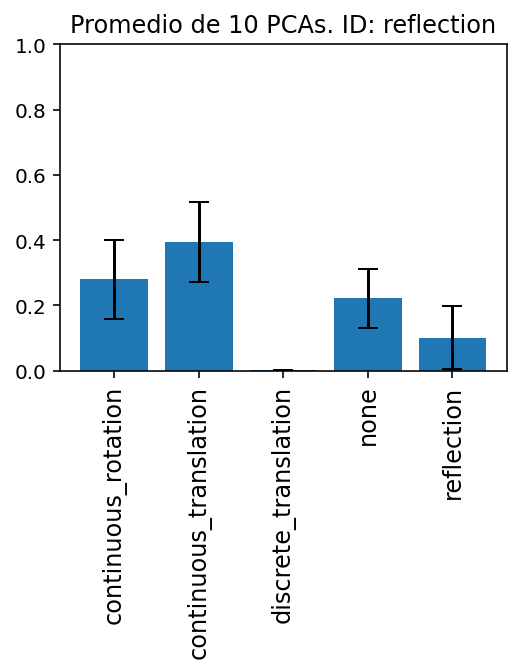

In [15]:
nom_carp = 'PCAs_detector_test_1'

#import libraries
%config InlineBackend.figure_format = 'retina'
import seaborn as sns
from IPython.core.display import display, HTML, clear_output
display(HTML("<style>.container { width:100% !important; } div.cell.selected {border-left-width: 0px !important;}</style>"))

from time import time
import os
import glob
from fastai.vision.all import *
import numpy as np
from IPython.display import clear_output
import itertools as it
import more_itertools
#import torchvision.models
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default ="none"
import base64
from PIL import Image
from io import BytesIO
import torch
import gc
#import libraries

if not 'notebook_dir' in globals():
    notebook_dir = os.getcwd()
print('Notebook directory: ' + notebook_dir)
os.chdir(notebook_dir)  # If you changed the current working dir, this will take you back to the workbook dir.
top_dir = notebook_dir



modelo = 'G' 

if modelo == 'G':
    learn = load_learner('/home/gabriel/Desktop/models/model_90_accu_resnet18_one_cycle_10+5_no_mixup'+'.pkl', cpu=False)
     


        
#Reset Registro

registro = pd.DataFrame({
    'Col_Quit':[0], 'Run':[0],
    'continuous_rotation':[0], 'continuous_translation':[0], 'discrete_translation':[0], 'none':[0], 'reflection':[0]
})
registro = registro.drop(0)
#registro

sims = pd.DataFrame(columns = learn.dls.vocab)
errs = sims.copy()

num_img_cat = [] #guardo el numero de imagenes de cada categoria
i = 0
plote = False

from IPython.utils import io



for dires in np.sort(Path('/home/gabriel/Desktop/' + nom_carp).ls()):
    #path = Path('/home/gabriel/Desktop/PCA_INE_sexo/INE/'+quitadas)
    quitadas = str(dires).split('/')[-1]
    with io.capture_output() as captured:
        for ima in dires.ls():

            test_im_dir = ima

            im = PILImage.create(test_im_dir)

            # Orden: ['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']

            cate, num_cat, probs = learn.predict(im)


            '''
            if plote == True:
                plt.figure
                plt.figure(figsize=(4, 3))
                plt.title(ima)
                plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],probs)
                plt.xticks(rotation='vertical',fontsize = 12)
                plt.show()
            '''

            new_row = np.array([quitadas, i] + list(np.array(probs).astype(float))).reshape([1,-1])
            aden = pd.DataFrame(new_row,columns=registro.columns)

            registro = registro.append(aden, ignore_index=True)

            i+=1

    registro = registro.astype({
        'Col_Quit':str, 'Run':int,
        'continuous_rotation':float, 'continuous_translation':float, 'discrete_translation':float, 'none':float, 'reflection':float
    })  

    print('Numero Imagenes:',i)
    num_img_cat.append(i)



#registro.to_csv(r'/home/gabriel/Desktop/PCA_INE_salarios/registro_'+modelo+'.csv', index = False)
print(registro['Col_Quit'].unique())

#registro = pd.read_csv('/home/gabriel/Desktop/PCA_INE_sexo/registro.csv')

nombres_carps = registro['Col_Quit'].unique() #Nombres de las carpetas donde estan guyardadas las pcas de un tipo
num_carps = len(nombres_carps)
i = 0

for nom in nombres_carps:
    if i == 0:
        m_probs = np.array(registro.iloc[:num_img_cat[0],2:].mean())
        err_probs = np.array(registro.iloc[:num_img_cat[0],2:].std())
        nume = str(len(registro.iloc[:num_img_cat[0],2:]))
        print(learn.dls.vocab)
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)
    else:
        m_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].mean())
        err_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].std())
        nume = str(len(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:]))
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)

    if nom == '-ninguna-':
        tit = 'Promedio de '+nume+' PCAs sin quitar ninguna columna'
    else:
        tit = 'Promedio de '+nume+' PCAs. ID: '+ nom        

    
    plt.figure(figsize=(4, 3))
    plt.title(tit)
    #plt.title('Promedio de '+str(40)+' PCAs sin quitar ninguna columna')
    plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],
            m_probs,yerr = err_probs/np.sqrt(float(nume)), capsize = 5)
    plt.xticks(rotation='vertical',fontsize = 12)
    plt.ylim([0, 1])
    plt.show()
    
    i+=1

In [15]:
df_fail = potenciales[0]

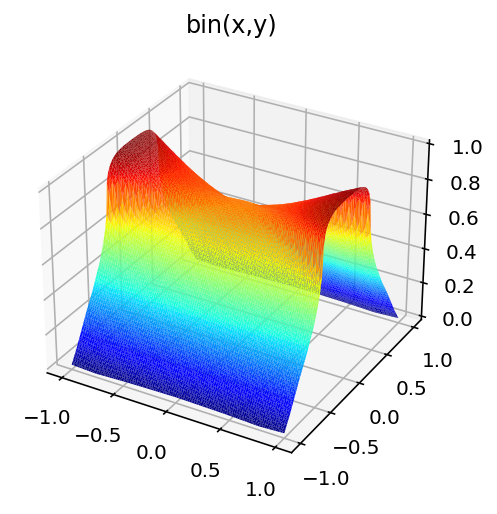

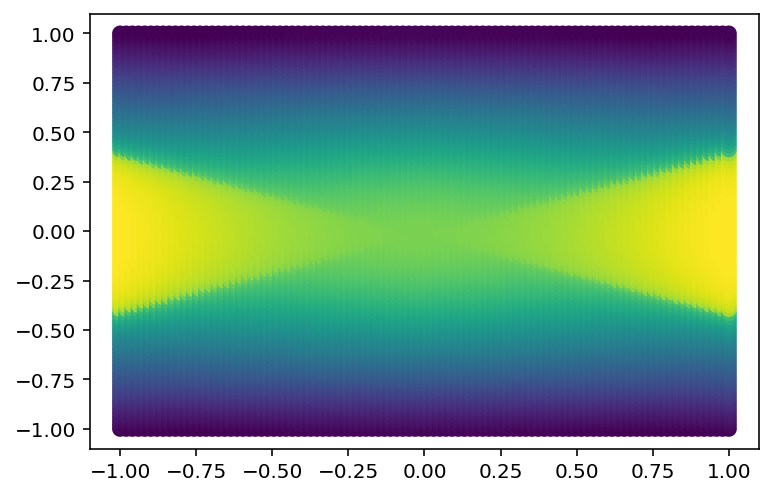

In [22]:
ax2 = plt.axes(projection='3d')
ax2.plot_trisurf(df.x, df.y, df.bin, linewidth=0.2, cmap = 'jet')
plt.title('bin(x,y)')
plt.show()
plt.figure()
plt.scatter(df.x,df.y,c = df.bin,marker = '.', lw = 5)

In [10]:
df_fail = mock_data(sym = 'reflection', verbose = False)

In [82]:
two_best

['y', '-0.016330227380567663r3+0.9542594652167422y']

<AxesSubplot:>

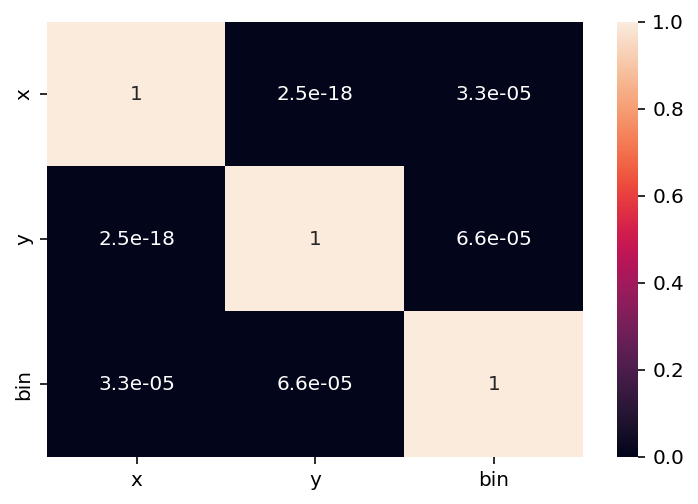

In [158]:
sns.heatmap(np.abs(df_fail[['x','y','bin']].corr()), annot = True)

In [150]:
best_feat[:25]

['sqrt(abs(y))',
 'y**2',
 '0.8189589536892301y**2+-0.35549520986886773x**2',
 '-0.21422194459552268r0**2+0.5942633863236257y**2',
 '-0.016330227380567663r3+0.9542594652167422y',
 'y',
 '0.994039446836078y**2+-0.6069785751588277r3**2',
 '-0.5442872322101435x/y',
 'sqrt(abs(x))',
 '-0.7618980794437549x**2+0.3603828717758726r3**2',
 'x**2',
 '-0.9078243003299127x**2+-0.7468100467196652r4**2',
 '0.9125787738202087x+-0.8409145170382679r1',
 '0.212106578264861r2*y',
 '0.3020509137854266r2+-0.5883145905339526r1',
 '0.8507244753432885r1*y',
 '-0.2898424772964212y**2+0.6464294112144899r2**2',
 'r1^-0.09894661914328196*x^-0.24308465915286437',
 '-0.6273798501658039y**2+-0.8618855884574694r4**2',
 '-0.13770761967627743y/r4',
 '-0.9535295021137407r1*x',
 'x',
 '0.900826533501611r0**2+-0.5633283475018911x**2',
 '0.021165239716750106r0/r4',
 '0.9241562048336682r0*x']

In [80]:
(corr_imp.iloc[1:].sort_values()).index[-2]

'sqrt(abs(x))'

# Best metric to select 2nd variable

The best model will be the one that gets the best value of the most difficult symmetry to find: Z2 (Reflection)

In [31]:
rep_todo = 55

# Tiempo en el que empezamos a procesar
from time import time
start_time = time()
num_mod = 10

img_made = 0
for rtd in range(rep_todo):
    for modeli in range(num_mod):
        from fastai.vision.all import *
        from time import time
        from IPython.utils import io

        model_fi = 'RF' # RF or FW (random forests or featurewiz)
        #Tipos de simetría que quiero generar
        #syms = ['continuous_rotation', 'discrete_translation', 'reflection', 'none', 'continuous_translation']
        symmetries = ['reflection']

        num_pot_cada = 2 # Numero de potenciales de cada tipo

        int_1 = False #Interactions in Feature Importance 1 (RF)
        int_2 = False
        select_10k = True #Keep only 10000 elements of the original potential DF

        # ------------------- Folder PCA ------------------- #

        folder = 'PCAs_detector_benchmark'

        dd = top_dir + '/' + folder
        if not os.path.isdir(dd):
            print('Creating directory:\n',dd)
            os.mkdir(dd)

        dir = os.path.join(top_dir,folder)

        #------------------------------ Generar Potenciales ---------------------------#


        potenciales = []
        potenciales_tags = []

        for symmetry in symmetries:
            print('Generating Potentials for',symmetry,'symmetry')
            funs_temp = [mock_data(sym = symmetry, verbose = False) for i in range(num_pot_cada)]
            funs_tags_temp = [symmetry for i in range(num_pot_cada)]
            potenciales = potenciales + funs_temp 
            potenciales_tags = potenciales_tags + funs_tags_temp

        # Vamos a ordenar los potenciales de forma aleatoria, aunque en realidad
        # este paso no es relevante, puesto que para cada potencial entrenaremos una 
        # red. Si fuéramos a entrenar una red con todos los potenciales, entonces sí
        # que sería relevante.

        num_pot = len(potenciales) # Numero de Potenciales que quiero (por si no quiero todos)

        c = list(zip(potenciales,potenciales_tags))

        # Barajamos los potenciales, para pasarseslos en orden aleatorio
        #random.shuffle(c)

        potenciales_aux, tags = zip(*c)

        potenciales = [potenciales_aux[i] for i in range(num_pot)]




        class SaveModelCallback(TrackerCallback):
            "A `TrackerCallback` that saves the model's best during training and loads it at the end."
            _only_train_loop = True
            def __init__(self, monitor='valid_loss', comp=None, min_delta=0., fname='model', every_epoch=False, at_end=False,
                         with_opt=False, reset_on_fit=True):
                super().__init__(monitor=monitor, comp=comp, min_delta=min_delta, reset_on_fit=reset_on_fit)
                assert not (every_epoch and at_end), "every_epoch and at_end cannot both be set to True"
                # keep track of file path for loggers
                self.last_saved_path = None
                store_attr('fname,every_epoch,at_end,with_opt')

            def _save(self, name): self.last_saved_path = self.learn.save(name, with_opt=self.with_opt)

            def after_epoch(self):
                "Compare the value monitored to its best score and save if best."
                if self.every_epoch: self._save(f'{self.fname}_{self.epoch}')
                else: #every improvement
                    super().after_epoch()
                    if self.new_best:
                        #print(f'Better model found at epoch {self.epoch} with {self.monitor} value: {self.best}.')
                        self._save(f'{self.fname}')

            def after_fit(self, **kwargs):
                "Load the best model."
                if self.at_end: self._save(f'{self.fname}')
                elif not self.every_epoch: self.learn.load(f'{self.fname}', with_opt=self.with_opt)

        # ---------------- Definiciones previas e hiperparámetros ----------------- #

        #Guardo los modelos para analizarlos luego
        models = [] 
        to_s = []

        #Guardaremos los resultados de la PCA en un array 
        PCA_s = []
        PCA_s_tag = []

        # Hyperparameters: De momento los pondré aquí, pero luego serán un input entero
        bs_choices = [50000]       # Batch Size
        shape='pipe'               # Shape of the neural network
        layers_choices = [5]       # Number of layers of the net. Default:10 or 5 results with 5
        neurons_choices = [50]    # Number of neurons per layer. Default:200 results with 200
        epoch_choices = [150]      # Number of training epochs. Default:200 results with 60
        lr_choices = [0.01]       # Max learning rate 
        valid_pct=0.2              # Part of the data that goes into validation (0.2 = 20%)
        monitor= 'valid_loss'        # Te model with the least 'monitor' will be saved



        # ---------------------- Entrenar Red Y PCA -----------------------------------#

        j = 1 # Usaremos esto para saber cuantos potenciales hemos procesado, y como indice en general

        for df in potenciales:

            #------------------------------ Feature Importance inicial ---------------------------#

            if select_10k == True:
                if len(df.bin) <= 100*100:
                    print('Too little data to keep 10k points')
                else:
                    print('Keeping 10k points of the original DF')
                    remove_n = len(df.bin) - 10000
                    drop_indices = np.random.choice(df.index, remove_n, replace=False)
                    df_temp = df.drop(drop_indices)
                    df = df_temp.copy()


            print('First Feature importance')

            if model_fi == 'FW':

                #Select 10k random elements without repetition
                inds = random.sample(range(len(df)), len(df))
                inds = np.sort(inds)
                small_df = df.iloc[inds,:]

                with io.capture_output() as captured1: output = featurewiz(small_df, 'bin', corr_limit=0.1,
                                                                            verbose=0, sep=',', header=0, test_data='',
                                                                            feature_engg='', category_encoders='')

                two_best = output[0][:2]

            elif model_fi == 'RF':

                small_df = df.copy()

                if int_1 == True:

                    n_f = len(small_df)

                    small_df.drop('bin', axis = 1)
                    small_df = my_interactions_small(small_df.astype(np.float32), numo_int = int(len(small_df.columns)/2 + 1), verbose = True)

                    small_df['bin'] = df.bin

                else:
                    n_f = len(small_df)

                best_feat, imp = fast_feat_imp_rf(small_df.astype(np.float32),target = 'bin', graph = False)
                cm_rf = small_df[best_feat[:n_f]].corr()

                if modeli == 0: corr_imp = np.exp(np.array(imp[:n_f]))*((1-np.abs(cm_rf.iloc[:,0])))
                elif modeli == 1: corr_imp = pd.Series(np.array(imp[:n_f]), index = best_feat[:n_f]) 
                elif modeli == 2: corr_imp = pd.Series((1-np.abs(cm_rf.iloc[:,0])), index = best_feat[:n_f])
                elif modeli == 3: corr_imp = (np.array(imp[:n_f]))*((1-np.abs(cm_rf.iloc[:,0])))
                elif modeli == 4: corr_imp = (np.array(imp[:n_f]))**2*((1-np.abs(cm_rf.iloc[:,0])))
                elif modeli == 5: corr_imp = (np.array(imp[:n_f]))*((1-np.abs(cm_rf.iloc[:,0])))**2
                elif modeli == 6: corr_imp = np.exp(np.array(imp[:n_f]))*((1-np.abs(cm_rf.iloc[:,0])))**2
                elif modeli == 7: corr_imp = np.exp(np.array(imp[:n_f]))*(np.sqrt(1-np.abs(cm_rf.iloc[:,0])))
                elif modeli == 8: corr_imp = np.sqrt(np.array(imp[:n_f]))*((1-np.abs(cm_rf.iloc[:,0])))
                elif modeli == 9: corr_imp = (np.array(imp[:n_f]))/((0.000000000000000000000001 + np.abs(cm_rf.iloc[:,0])))

                two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]

                #two_best = [(corr_imp.iloc[:].sort_values()).index[-1],(corr_imp.iloc[:].sort_values()).index[-2]]

           
            small_df = small_df[two_best]




            print('Second Feature importance')

            if model_fi == 'FW':

                small_df['bin'] = df.bin

                with io.capture_output() as captured2: output = featurewiz(small_df, 'bin', corr_limit=0.10,
                                                            verbose=0, sep=',', header=0, test_data='',
                                                            category_encoders='',feature_engg='interactions')   

                small_df = output[1].copy()
                two_best_2 = output[0][:2]

            elif model_fi == 'RF':

                n_f = 10

                if int_2 == True:
                    small_df = my_interactions(small_df.astype(np.float32), numo_int = len(small_df.columns), verbose = False)

                small_df['bin'] = df.bin

                best_feat, imp = fast_feat_imp_rf(small_df.astype(np.float32),target = 'bin', graph = False)
                cm_rf = small_df[best_feat[:n_f]].corr()

                corr_imp = np.exp(np.array(imp[:n_f]))*((1-np.abs(cm_rf.iloc[:,0])))

                two_best_2 = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]
                #two_best_2 = [(corr_imp.iloc[:].sort_values()).index[-1],(corr_imp.iloc[:].sort_values()).index[-2]]


            else:
                print('Valid model for feature importance not specified. Using Random Forests by default')

                n_f = 10

                small_df = my_interactions(small_df, numo_int = len(small_df), verbose = False)
                small_df['bin'] = df.bin

                best_feat, imp = fast_feat_imp_rf(small_df,target = 'bin', graph = False)
                cm_rf = small_df[best_feat[:n_f]].corr()

                corr_imp = np.exp(np.array(imp[:n_f]))*(1-np.abs(cm_rf.iloc[:,0]))

                two_best_2 = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]


            print('\n ----> Training with features {} and {} \n'.format(two_best_2[0],two_best_2[1]))

            # Debemos marcar cada potencial para tener claro a qué tipo de simetria corresponde cada PCA
            PCA_s_tag.append(tags[j-1])

            df2 = small_df.copy() 

            splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

            to = TabularPandas(df2,
                            procs=[Categorify,FillMissing, Normalize],
                            cont_names = two_best_2,
                            y_names = 'bin',
                            splits=splits)

            train_size = len(splits[0])
            valid_size = len(splits[1])

            # ----------------- Hyperparameters ------------------- #

            # Batch Size (a large one)
            bs=min(random.choice(bs_choices),train_size)  
            print('{} batch size for training.\n'.format(bs))

            # Neurons per layer
            neurons_per_layer = random.choice(neurons_choices)

            # Number of layers
            n_layers = random.choice(layers_choices)

            #Shape of the net: Pipe or funnel
            if shape == 'pipe':
                layers=[neurons_per_layer for i in range(n_layers)]

            if shape == 'funnel':
                n_eff = n_layers
                layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

            print('Training FCNN with layers: ',layers)

            #Number of epochs
            n_epoch=random.choice(epoch_choices)
            print('Training for {} epochs.'.format(n_epoch))

            # Maximum Learning Rate: (a good value can be found using learn.lr_find())
            lr_max=float(random.choice(lr_choices))
            print('Using lr_max = ',format(lr_max))

            # ----------------------------------------------------- #

            # --------------- Training the FCNN --------------------#

            # Load the data into a DataLoader
            dls = to.dataloaders(bs=bs)

            # Define a Tabular Learner
            learn = tabular_learner(dls, layers=layers
                                #,config=config
                                #,metrics=[mse],
                                #y_range = [min(df.bin),max(df.bin)],
                                #,cbs=ShowGraphCallback()
                                #,train_bn=False)
                                )

            # Train the net 
            with learn.no_logging():
                learn.fit_one_cycle(n_epoch=n_epoch
                                    ,lr_max=lr_max
                                    ,cbs=[SaveModelCallback(monitor=monitor)]
                                    )

            # Guardamos modelos y tabular objects para el posterior analisis
            models.append(learn)
            to_s.append(to)

            # ------------------------------------------------------#


            # ------------------------- PCA ------------------------#

            test_df = df2.copy()
            dl = learn.dls.test_dl(test_df,bs=int(test_df.shape[0])) 

            # Tenemos que hacer un Hook, una especie de gancho que enganchamos en la última capa interna,
            # para guardar, de cada modelo, los valores de los parámetro de dicha capa. 
            with Hooks(learn.model.layers, lambda m,i,o: o) as h:
                preds = learn.get_preds(dl=dl,with_input=True,with_decoded=True,with_loss=True)

            targets=preds[2].numpy().flatten()

            # Cogemos la información de la penúltima capa
            # OJO: Si añadimos y_range, se añade automaticamente una sigmoid
            # al final, por lo que tendríamos que coger la capa -3 en vez de la -2
            act = h.stored[-2] 
            multi_dim=Tensor.cpu(act).numpy()
            standardized=StandardScaler().fit_transform(multi_dim)

            viz = PCA(2).fit_transform(np.nan_to_num(standardized))
            #plt.figure()
            #plt.scatter(viz[:, 0], viz[:, 1],c=targets[:multi_dim.shape[0]],alpha=.1, marker = 'o')

            PCA_s.append(viz)

            # ------------------------------------------------------ #

            # ------------------ Saving the PCA's ------------------ #

            # ---- Dar formato a PCA para guardar como imagen con color

            viz = pd.DataFrame(viz) #Transformamos la PCA en un dataframe
            viz.columns = ['x','y'] #Nombres de las columnas

            # Insertamos una columna con los colores de los puntos. El valor del potencial
            # objetivo (targets) es el color, y hay un color por cada punto 
            viz.insert(2,'class',targets[:multi_dim.shape[0]]) 

            # ---- Personalizar mapa de color 

            n_classes=1000

            colors = 'rainbow'

            if colors == 'rainbow':
                my_cmap = plt.cm.get_cmap('rainbow', n_classes)
                classes_in_rgb = my_cmap(range(n_classes))
            if colors == 'purple':
                my_cmap = plt.cm.get_cmap('rainbow', n_classes)
                classes_in_rgb = np.vstack((np.array([0,0,0,0]),my_cmap([0 for i in range(n_classes)])))

            # ---- Hacer que la intensidad del pixel represente la cantidad de puntos 
            #      acumuldos en un pixel

            n_pixels = 224

            binning_3d=np.histogramdd([viz['x'],viz['y'],viz['class']],range=(None,None,(0,1)), bins=(n_pixels,n_pixels,n_classes))

            #if we want the pixel intensity to reprensent the number of points at that location
            array = np.dot(binning_3d[0],classes_in_rgb)
            array = array/np.amax(array)

            # ---- Guardar la PCA

            #Directorio donde guardaremos las imagenes
            #dir_sym = os.path.join(dir,tags[j-1])
            dir_sym = os.path.join(dir,'model_'+str(modeli))
            if not os.path.isdir(dir_sym):
                print('Creating directory:\n',dir_sym)
                os.mkdir(dir_sym)


            # Nombre de la imagen. Pongo el tiempo para que todas se llamen distinto cada vez.
            img_file = str(tags[j-1])+'_'+str(j)+str(round(time()))+'-'+str(n_classes)+'_'+'color_classes--'+'_PCA.png' 
            output_dir = os.path.join(dir_sym,img_file) # Directorio donde guardamos la imagen
            plt.imsave(output_dir,array) # Guardar
            print('\nPCA saved to:\n{}\n'.format(dir_sym+'/'+img_file))

            # ------------------------ Time -------------------------#
            img_made+=1

            minutes_until_now = (time() - start_time)/60
            images_done = img_made
            minutes_per_image = minutes_until_now/(images_done)
            hours_left = minutes_per_image * (num_pot*rep_todo*num_mod-images_done)/60
            print("\n{} PCA's made out of {}.\n".format(images_done,num_pot*rep_todo*num_mod))
            print("{:.1f} minutes elapsed for {} images.".format(minutes_until_now,images_done))
            print("{:.1f} minutes average per image.".format(minutes_until_now/images_done))
            print("{:.1f} minutes estimated left for {} images.\n\n\n".format(hours_left*60,num_pot*rep_todo*num_mod-images_done))
            print("{:.1f} hours estimated left for {} images.\n\n\n".format(hours_left,num_pot*rep_todo*num_mod-images_done))
            
            j+=1


          # ------------------------------------------------------#
        
        


Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and -0.792241079817374x**2+-0.1101257344824309y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_0/reflection_11637164211-1000_color_classes--_PCA.png


1 PCA's made out of 1100.

0.1 minutes elapsed for 1 images.
0.1 minutes average per image.
118.0 minutes estimated left for 1099 images.



2.0 hours estimated left for 1099 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and 0.3983226033329079x**2+-0.08631290303137429r2**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_0/reflection_21637164217-1000_color_classes--_PCA.png


2 PCA's made out of 1100.

0.2 minutes elapsed for 2 images.
0.1 minutes average per image.
112.0 minutes estimated left for 1098 images.



1.9 hours estimated left for 1098 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.5667063415733529x**2+0.398154466080916y**2 and y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_1/reflection_11637164223-1000_color_classes--_PCA.png


3 PCA's made out of 1100.

0.3 minutes elapsed for 3 images.
0.1 minutes average per image.
114.3 minutes estimated left for 1097 images.



1.9 hours estimated left for 1097 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.637236209144493x**2+0.8255123588308799y**2 and 0.6331193005103835x**2+0.01690832321485436r3**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_1/reflection_21637164229-1000_color_classes--_PCA.png


4 PCA's made out of 1100.

0.4 minutes elapsed for 4 images.
0.1 minutes average per image.
112.1 minutes estimated left for 1096 images.



1.9 hours estimated left for 1096 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_2/reflection_11637164235-1000_color_classes--_PCA.png


5 PCA's made out of 1100.

0.5 minutes elapsed for 5 images.
0.1 minutes average per image.
112.8 minutes estimated left for 1095 images.



1.9 hours estimated left for 1095 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_2/reflection_21637164241-1000_color_classes--_PCA.png


6 PCA's made out of 1100.

0.6 minutes elapsed for 6 images.
0.1 minutes average per image.
111.4 minutes estimated left for 1094 images.



1.9 hours estimated left for 1094 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and 0.5016562817698682y**2+-0.8937194366318566x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_3/reflection_11637164248-1000_color_classes--_PCA.png


7 PCA's made out of 1100.

0.7 minutes elapsed for 7 images.
0.1 minutes average per image.
112.0 minutes estimated left for 1093 images.



1.9 hours estimated left for 1093 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_3/reflection_21637164253-1000_color_classes--_PCA.png


8 PCA's made out of 1100.

0.8 minutes elapsed for 8 images.
0.1 minutes average per image.
111.4 minutes estimated left for 1092 images.



1.9 hours estimated left for 1092 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_4/reflection_11637164260-1000_color_classes--_PCA.png


9 PCA's made out of 1100.

0.9 minutes elapsed for 9 images.
0.1 minutes average per image.
112.0 minutes estimated left for 1091 images.



1.9 hours estimated left for 1091 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.32569597997386057y**2+0.2764611417959304x**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_4/reflection_21637164266-1000_color_classes--_PCA.png


10 PCA's made out of 1100.

1.0 minutes elapsed for 10 images.
0.1 minutes average per image.
111.1 minutes estimated left for 1090 images.



1.9 hours estimated left for 1090 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.043393422080651334y**2+-0.5777175365287641x**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_5/reflection_11637164272-1000_color_classes--_PCA.png


11 PCA's made out of 1100.

1.1 minutes elapsed for 11 images.
0.1 minutes average per image.
111.7 minutes estimated left for 1089 images.



1.9 hours estimated left for 1089 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.6201926219708216y**2+-0.947634167722115x**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_5/reflection_21637164278-1000_color_classes--_PCA.png


12 PCA's made out of 1100.

1.2 minutes elapsed for 12 images.
0.1 minutes average per image.
111.2 minutes estimated left for 1088 images.



1.9 hours estimated left for 1088 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.004023885978178043r0**2+-0.878487695525711y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_6/reflection_11637164284-1000_color_classes--_PCA.png


13 PCA's made out of 1100.

1.3 minutes elapsed for 13 images.
0.1 minutes average per image.
111.4 minutes estimated left for 1087 images.



1.9 hours estimated left for 1087 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.4408173729003151y**2+0.48855437316828865x**2 and 0.09340832781576425y*x 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_6/reflection_21637164290-1000_color_classes--_PCA.png


14 PCA's made out of 1100.

1.4 minutes elapsed for 14 images.
0.1 minutes average per image.
110.7 minutes estimated left for 1086 images.



1.8 hours estimated left for 1086 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.030133231633510116r2**2+0.8640912143945709x**2 and -0.06856996458563125x/y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_7/reflection_11637164297-1000_color_classes--_PCA.png


15 PCA's made out of 1100.

1.5 minutes elapsed for 15 images.
0.1 minutes average per image.
111.0 minutes estimated left for 1085 images.



1.8 hours estimated left for 1085 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and 0.7360652101620397x**2+-0.036767955921733764r1**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_7/reflection_21637164302-1000_color_classes--_PCA.png


16 PCA's made out of 1100.

1.6 minutes elapsed for 16 images.
0.1 minutes average per image.
110.5 minutes estimated left for 1084 images.



1.8 hours estimated left for 1084 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and 0.4112529534209681x**2+0.1532984435813598y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_8/reflection_11637164309-1000_color_classes--_PCA.png


17 PCA's made out of 1100.

1.7 minutes elapsed for 17 images.
0.1 minutes average per image.
110.9 minutes estimated left for 1083 images.



1.8 hours estimated left for 1083 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features x**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_8/reflection_21637164315-1000_color_classes--_PCA.png


18 PCA's made out of 1100.

1.8 minutes elapsed for 18 images.
0.1 minutes average per image.
110.6 minutes estimated left for 1082 images.



1.8 hours estimated left for 1082 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.010714135033419003y/x and -0.753454896409004x**2+-0.024796310420742707y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_9/reflection_11637164321-1000_color_classes--_PCA.png


19 PCA's made out of 1100.

1.9 minutes elapsed for 19 images.
0.1 minutes average per image.
110.8 minutes estimated left for 1081 images.



1.8 hours estimated left for 1081 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.3611014095461087y/x and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_9/reflection_21637164327-1000_color_classes--_PCA.png


20 PCA's made out of 1100.

2.0 minutes elapsed for 20 images.
0.1 minutes average per image.
110.5 minutes estimated left for 1080 images.



1.8 hours estimated left for 1080 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.9425267224289191y**2+0.0905206978833133x**2 and -0.8994577744415304x/y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_0/reflection_11637164334-1000_color_classes--_PCA.png


21 PCA's made out of 1100.

2.2 minutes elapsed for 21 images.
0.1 minutes average per image.
110.6 minutes estimated left for 1079 images.



1.8 hours estimated left for 1079 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_0/reflection_21637164340-1000_color_classes--_PCA.png


22 PCA's made out of 1100.

2.3 minutes elapsed for 22 images.
0.1 minutes average per image.
110.3 minutes estimated left for 1078 images.



1.8 hours estimated left for 1078 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_1/reflection_11637164346-1000_color_classes--_PCA.png


23 PCA's made out of 1100.

2.4 minutes elapsed for 23 images.
0.1 minutes average per image.
110.5 minutes estimated left for 1077 images.



1.8 hours estimated left for 1077 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_1/reflection_21637164352-1000_color_classes--_PCA.png


24 PCA's made out of 1100.

2.5 minutes elapsed for 24 images.
0.1 minutes average per image.
110.3 minutes estimated left for 1076 images.



1.8 hours estimated left for 1076 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.05499520958833104r4**2+-0.7433576794292369y**2 and y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_2/reflection_11637164358-1000_color_classes--_PCA.png


25 PCA's made out of 1100.

2.6 minutes elapsed for 25 images.
0.1 minutes average per image.
110.4 minutes estimated left for 1075 images.



1.8 hours estimated left for 1075 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.4137617651931642y**2+0.5619697183661354x**2 and 0.20405228856576363x/y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_2/reflection_21637164364-1000_color_classes--_PCA.png


26 PCA's made out of 1100.

2.7 minutes elapsed for 26 images.
0.1 minutes average per image.
110.1 minutes estimated left for 1074 images.



1.8 hours estimated left for 1074 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and 0.9594275826299019y*x 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_3/reflection_11637164371-1000_color_classes--_PCA.png


27 PCA's made out of 1100.

2.8 minutes elapsed for 27 images.
0.1 minutes average per image.
110.2 minutes estimated left for 1073 images.



1.8 hours estimated left for 1073 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and -0.5204773505495155y**2+0.029141837764796508r4**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_3/reflection_21637164377-1000_color_classes--_PCA.png


28 PCA's made out of 1100.

2.9 minutes elapsed for 28 images.
0.1 minutes average per image.
109.8 minutes estimated left for 1072 images.



1.8 hours estimated left for 1072 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.9410442791959193x**2+0.26580990221873857y**2 and 0.890702522394516y**2+0.061821497801333614r1**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_4/reflection_11637164383-1000_color_classes--_PCA.png


29 PCA's made out of 1100.

3.0 minutes elapsed for 29 images.
0.1 minutes average per image.
110.1 minutes estimated left for 1071 images.



1.8 hours estimated left for 1071 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and -0.828908645318357y**2+0.030515748681608112r4**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_4/reflection_21637164389-1000_color_classes--_PCA.png


30 PCA's made out of 1100.

3.1 minutes elapsed for 30 images.
0.1 minutes average per image.
109.9 minutes estimated left for 1070 images.



1.8 hours estimated left for 1070 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_5/reflection_11637164396-1000_color_classes--_PCA.png


31 PCA's made out of 1100.

3.2 minutes elapsed for 31 images.
0.1 minutes average per image.
109.9 minutes estimated left for 1069 images.



1.8 hours estimated left for 1069 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_5/reflection_21637164402-1000_color_classes--_PCA.png


32 PCA's made out of 1100.

3.3 minutes elapsed for 32 images.
0.1 minutes average per image.
109.6 minutes estimated left for 1068 images.



1.8 hours estimated left for 1068 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_6/reflection_11637164408-1000_color_classes--_PCA.png


33 PCA's made out of 1100.

3.4 minutes elapsed for 33 images.
0.1 minutes average per image.
109.8 minutes estimated left for 1067 images.



1.8 hours estimated left for 1067 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features x**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_6/reflection_21637164414-1000_color_classes--_PCA.png


34 PCA's made out of 1100.

3.5 minutes elapsed for 34 images.
0.1 minutes average per image.
109.7 minutes estimated left for 1066 images.



1.8 hours estimated left for 1066 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.06593034099270634r4**2+0.5007554495826352x**2 and 0.027763372979311862r1**2+-0.7231913587741556y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_7/reflection_11637164421-1000_color_classes--_PCA.png


35 PCA's made out of 1100.

3.6 minutes elapsed for 35 images.
0.1 minutes average per image.
109.8 minutes estimated left for 1065 images.



1.8 hours estimated left for 1065 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.08720820914219352y**2+0.3937882287090295x**2 and 0.17003829585468622y*x 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_7/reflection_21637164427-1000_color_classes--_PCA.png


36 PCA's made out of 1100.

3.7 minutes elapsed for 36 images.
0.1 minutes average per image.
109.5 minutes estimated left for 1064 images.



1.8 hours estimated left for 1064 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.960888672033088x**2+-0.15058929663149567y**2 and 0.026113802381616757r3**2+-0.5807903952540081y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_8/reflection_11637164433-1000_color_classes--_PCA.png


37 PCA's made out of 1100.

3.8 minutes elapsed for 37 images.
0.1 minutes average per image.
109.6 minutes estimated left for 1063 images.



1.8 hours estimated left for 1063 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and -0.024034669784882556x**2+-0.2643390212639749y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_8/reflection_21637164439-1000_color_classes--_PCA.png


38 PCA's made out of 1100.

3.9 minutes elapsed for 38 images.
0.1 minutes average per image.
109.4 minutes estimated left for 1062 images.



1.8 hours estimated left for 1062 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.01026381933517273r2**2+0.638279796668751x**2 and y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_9/reflection_11637164446-1000_color_classes--_PCA.png


39 PCA's made out of 1100.

4.0 minutes elapsed for 39 images.
0.1 minutes average per image.
109.5 minutes estimated left for 1061 images.



1.8 hours estimated left for 1061 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_9/reflection_21637164452-1000_color_classes--_PCA.png


40 PCA's made out of 1100.

4.1 minutes elapsed for 40 images.
0.1 minutes average per image.
109.3 minutes estimated left for 1060 images.



1.8 hours estimated left for 1060 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.29687165512486513y**2+-0.7319964558362764x**2 and x 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_0/reflection_11637164459-1000_color_classes--_PCA.png


41 PCA's made out of 1100.

4.2 minutes elapsed for 41 images.
0.1 minutes average per image.
109.4 minutes estimated left for 1059 images.



1.8 hours estimated left for 1059 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.041450681332922734x/y and -0.8899782160025014y**2+-0.3018115891751578x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_0/reflection_21637164465-1000_color_classes--_PCA.png


42 PCA's made out of 1100.

4.3 minutes elapsed for 42 images.
0.1 minutes average per image.
109.2 minutes estimated left for 1058 images.



1.8 hours estimated left for 1058 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.6609187344424905x*y and -0.5021968537444663y**2+-0.5387284221238022x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_1/reflection_11637164471-1000_color_classes--_PCA.png


43 PCA's made out of 1100.

4.4 minutes elapsed for 43 images.
0.1 minutes average per image.
109.3 minutes estimated left for 1057 images.



1.8 hours estimated left for 1057 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.9594858657434164x**2+0.6286440714902859y**2 and y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_1/reflection_21637164477-1000_color_classes--_PCA.png


44 PCA's made out of 1100.

4.5 minutes elapsed for 44 images.
0.1 minutes average per image.
109.1 minutes estimated left for 1056 images.



1.8 hours estimated left for 1056 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.14775846120457747y/x and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_2/reflection_11637164484-1000_color_classes--_PCA.png


45 PCA's made out of 1100.

4.7 minutes elapsed for 45 images.
0.1 minutes average per image.
109.1 minutes estimated left for 1055 images.



1.8 hours estimated left for 1055 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.19128248484541532x/y and y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_2/reflection_21637164490-1000_color_classes--_PCA.png


46 PCA's made out of 1100.

4.8 minutes elapsed for 46 images.
0.1 minutes average per image.
108.9 minutes estimated left for 1054 images.



1.8 hours estimated left for 1054 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.8811351121976807y**2+0.10820511706915337r2**2 and x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_3/reflection_11637164496-1000_color_classes--_PCA.png


47 PCA's made out of 1100.

4.9 minutes elapsed for 47 images.
0.1 minutes average per image.
109.0 minutes estimated left for 1053 images.



1.8 hours estimated left for 1053 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and -0.3574380001028763x/y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_3/reflection_21637164502-1000_color_classes--_PCA.png


48 PCA's made out of 1100.

5.0 minutes elapsed for 48 images.
0.1 minutes average per image.
108.8 minutes estimated left for 1052 images.



1.8 hours estimated left for 1052 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_4/reflection_11637164509-1000_color_classes--_PCA.png


49 PCA's made out of 1100.

5.1 minutes elapsed for 49 images.
0.1 minutes average per image.
108.9 minutes estimated left for 1051 images.



1.8 hours estimated left for 1051 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_4/reflection_21637164515-1000_color_classes--_PCA.png


50 PCA's made out of 1100.

5.2 minutes elapsed for 50 images.
0.1 minutes average per image.
108.6 minutes estimated left for 1050 images.



1.8 hours estimated left for 1050 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and -0.355653256947865x**2+-0.5365890284355703y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_5/reflection_11637164521-1000_color_classes--_PCA.png


51 PCA's made out of 1100.

5.3 minutes elapsed for 51 images.
0.1 minutes average per image.
108.6 minutes estimated left for 1049 images.



1.8 hours estimated left for 1049 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and 0.003615953934641425r3**2+-0.7576143207594024x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_5/reflection_21637164527-1000_color_classes--_PCA.png


52 PCA's made out of 1100.

5.4 minutes elapsed for 52 images.
0.1 minutes average per image.
108.5 minutes estimated left for 1048 images.



1.8 hours estimated left for 1048 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.7621783758418801x**2+0.05028983843859769r2**2 and y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_6/reflection_11637164534-1000_color_classes--_PCA.png


53 PCA's made out of 1100.

5.5 minutes elapsed for 53 images.
0.1 minutes average per image.
108.5 minutes estimated left for 1047 images.



1.8 hours estimated left for 1047 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and 0.14151401110375206r3**2+0.8591581769207088x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_6/reflection_21637164540-1000_color_classes--_PCA.png


54 PCA's made out of 1100.

5.6 minutes elapsed for 54 images.
0.1 minutes average per image.
108.4 minutes estimated left for 1046 images.



1.8 hours estimated left for 1046 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.5572004986457864y**2+0.2149384719073395x**2 and 0.32449313557299386y*x 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_7/reflection_11637164547-1000_color_classes--_PCA.png


55 PCA's made out of 1100.

5.7 minutes elapsed for 55 images.
0.1 minutes average per image.
108.4 minutes estimated left for 1045 images.



1.8 hours estimated left for 1045 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.9465837762787881x**2+-0.8229579590823513y**2 and 0.8730012284891706y/x 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_7/reflection_21637164553-1000_color_classes--_PCA.png


56 PCA's made out of 1100.

5.8 minutes elapsed for 56 images.
0.1 minutes average per image.
108.2 minutes estimated left for 1044 images.



1.8 hours estimated left for 1044 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.9015066002984005y**2+-0.03986457929983156r0**2 and 0.09025864024729202x*y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_8/reflection_11637164559-1000_color_classes--_PCA.png


57 PCA's made out of 1100.

5.9 minutes elapsed for 57 images.
0.1 minutes average per image.
108.2 minutes estimated left for 1043 images.



1.8 hours estimated left for 1043 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.9389739015570053x**2+0.5820209299108592y**2 and -0.40285778075587153y*x 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_8/reflection_21637164565-1000_color_classes--_PCA.png


58 PCA's made out of 1100.

6.0 minutes elapsed for 58 images.
0.1 minutes average per image.
108.1 minutes estimated left for 1042 images.



1.8 hours estimated left for 1042 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.9266113341689746y**2+0.48106759558659884x**2 and -0.3282896611144208y*x 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_9/reflection_11637164572-1000_color_classes--_PCA.png


59 PCA's made out of 1100.

6.1 minutes elapsed for 59 images.
0.1 minutes average per image.
108.2 minutes estimated left for 1041 images.



1.8 hours estimated left for 1041 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and 0.8301066809109352x/y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_9/reflection_21637164578-1000_color_classes--_PCA.png


60 PCA's made out of 1100.

6.2 minutes elapsed for 60 images.
0.1 minutes average per image.
108.0 minutes estimated left for 1040 images.



1.8 hours estimated left for 1040 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_0/reflection_11637164585-1000_color_classes--_PCA.png


61 PCA's made out of 1100.

6.3 minutes elapsed for 61 images.
0.1 minutes average per image.
108.0 minutes estimated left for 1039 images.



1.8 hours estimated left for 1039 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.08723960354069837x**2+0.9206588756111322y**2 and -0.6203135128800503y/x 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_0/reflection_21637164591-1000_color_classes--_PCA.png


62 PCA's made out of 1100.

6.4 minutes elapsed for 62 images.
0.1 minutes average per image.
107.9 minutes estimated left for 1038 images.



1.8 hours estimated left for 1038 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.72446897379316y**2+-0.01437052388022697r2**2 and -0.3838828238310721y**2+0.48284386202871166x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_1/reflection_11637164598-1000_color_classes--_PCA.png


63 PCA's made out of 1100.

6.6 minutes elapsed for 63 images.
0.1 minutes average per image.
107.9 minutes estimated left for 1037 images.



1.8 hours estimated left for 1037 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.9057641415655588y**2+0.29282069332429583x**2 and y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_1/reflection_21637164604-1000_color_classes--_PCA.png


64 PCA's made out of 1100.

6.7 minutes elapsed for 64 images.
0.1 minutes average per image.
107.8 minutes estimated left for 1036 images.



1.8 hours estimated left for 1036 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.27673345624224344y**2+-0.0924550623620779x**2 and 0.8542610674624622x*y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_2/reflection_11637164611-1000_color_classes--_PCA.png


65 PCA's made out of 1100.

6.8 minutes elapsed for 65 images.
0.1 minutes average per image.
107.8 minutes estimated left for 1035 images.



1.8 hours estimated left for 1035 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.9326188243815419y**2+-0.052135389184772674r4**2 and r2**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_2/reflection_21637164617-1000_color_classes--_PCA.png


66 PCA's made out of 1100.

6.9 minutes elapsed for 66 images.
0.1 minutes average per image.
107.6 minutes estimated left for 1034 images.



1.8 hours estimated left for 1034 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.9515452564777733y**2+-0.7050008184014762x**2 and y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_3/reflection_11637164623-1000_color_classes--_PCA.png


67 PCA's made out of 1100.

7.0 minutes elapsed for 67 images.
0.1 minutes average per image.
107.6 minutes estimated left for 1033 images.



1.8 hours estimated left for 1033 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.748099229289769y**2+0.7544540212459632x**2 and -0.9955068759928831y**2+-0.0693105051718288r1**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_3/reflection_21637164629-1000_color_classes--_PCA.png


68 PCA's made out of 1100.

7.1 minutes elapsed for 68 images.
0.1 minutes average per image.
107.4 minutes estimated left for 1032 images.



1.8 hours estimated left for 1032 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_4/reflection_11637164636-1000_color_classes--_PCA.png


69 PCA's made out of 1100.

7.2 minutes elapsed for 69 images.
0.1 minutes average per image.
107.4 minutes estimated left for 1031 images.



1.8 hours estimated left for 1031 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.27684420997550463x**2+-0.9945362166120102y**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_4/reflection_21637164642-1000_color_classes--_PCA.png


70 PCA's made out of 1100.

7.3 minutes elapsed for 70 images.
0.1 minutes average per image.
107.2 minutes estimated left for 1030 images.



1.8 hours estimated left for 1030 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.7739102377741813x**2+-0.060696173021388855r2**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_5/reflection_11637164648-1000_color_classes--_PCA.png


71 PCA's made out of 1100.

7.4 minutes elapsed for 71 images.
0.1 minutes average per image.
107.1 minutes estimated left for 1029 images.



1.8 hours estimated left for 1029 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features x**2 and 0.6932250223464649x/y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_5/reflection_21637164654-1000_color_classes--_PCA.png


72 PCA's made out of 1100.

7.5 minutes elapsed for 72 images.
0.1 minutes average per image.
106.9 minutes estimated left for 1028 images.



1.8 hours estimated left for 1028 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and 0.7989915359531015x*y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_6/reflection_11637164660-1000_color_classes--_PCA.png


73 PCA's made out of 1100.

7.6 minutes elapsed for 73 images.
0.1 minutes average per image.
106.9 minutes estimated left for 1027 images.



1.8 hours estimated left for 1027 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_6/reflection_21637164667-1000_color_classes--_PCA.png


74 PCA's made out of 1100.

7.7 minutes elapsed for 74 images.
0.1 minutes average per image.
106.8 minutes estimated left for 1026 images.



1.8 hours estimated left for 1026 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.7314253653917933y**2+0.4308571443693754x**2 and 0.1277139500565183x*y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_7/reflection_11637164673-1000_color_classes--_PCA.png


75 PCA's made out of 1100.

7.8 minutes elapsed for 75 images.
0.1 minutes average per image.
106.8 minutes estimated left for 1025 images.



1.8 hours estimated left for 1025 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and -0.021480254636558227r1**2+0.7012657795327095x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_7/reflection_21637164679-1000_color_classes--_PCA.png


76 PCA's made out of 1100.

7.9 minutes elapsed for 76 images.
0.1 minutes average per image.
106.6 minutes estimated left for 1024 images.



1.8 hours estimated left for 1024 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.2028944397738286x**2+0.4317292812748972y**2 and x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_8/reflection_11637164686-1000_color_classes--_PCA.png


77 PCA's made out of 1100.

8.0 minutes elapsed for 77 images.
0.1 minutes average per image.
106.6 minutes estimated left for 1023 images.



1.8 hours estimated left for 1023 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.004613802632378539r0**2+-0.719466764370156x**2 and -0.8054854988105022y**2+0.0632331636061374r4**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_8/reflection_21637164692-1000_color_classes--_PCA.png


78 PCA's made out of 1100.

8.1 minutes elapsed for 78 images.
0.1 minutes average per image.
106.4 minutes estimated left for 1022 images.



1.8 hours estimated left for 1022 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.5815204794491071x**2+-0.5118196712578118y**2 and -0.9348716705333009y/x 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_9/reflection_11637164698-1000_color_classes--_PCA.png


79 PCA's made out of 1100.

8.2 minutes elapsed for 79 images.
0.1 minutes average per image.
106.4 minutes estimated left for 1021 images.



1.8 hours estimated left for 1021 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.28774282954764985y**2+-0.6223363377436768x**2 and 0.9698871204553945x*y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_9/reflection_21637164705-1000_color_classes--_PCA.png


80 PCA's made out of 1100.

8.3 minutes elapsed for 80 images.
0.1 minutes average per image.
106.3 minutes estimated left for 1020 images.



1.8 hours estimated left for 1020 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.5497020372245185x**2+-0.004960351203573632r4**2 and 0.015637917158639825r0**2+0.7792605286285046y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_0/reflection_11637164711-1000_color_classes--_PCA.png


81 PCA's made out of 1100.

8.4 minutes elapsed for 81 images.
0.1 minutes average per image.
106.2 minutes estimated left for 1019 images.



1.8 hours estimated left for 1019 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and -0.1255866193876367r3**2+0.6269281062192213x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_0/reflection_21637164717-1000_color_classes--_PCA.png


82 PCA's made out of 1100.

8.5 minutes elapsed for 82 images.
0.1 minutes average per image.
106.1 minutes estimated left for 1018 images.



1.8 hours estimated left for 1018 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.2214445594944512y*x and 0.9556009919882855x**2+0.8818450922512813y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_1/reflection_11637164724-1000_color_classes--_PCA.png


83 PCA's made out of 1100.

8.7 minutes elapsed for 83 images.
0.1 minutes average per image.
106.0 minutes estimated left for 1017 images.



1.8 hours estimated left for 1017 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.03994012164771288r2**2+-0.2827822719710329y**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_1/reflection_21637164730-1000_color_classes--_PCA.png


84 PCA's made out of 1100.

8.8 minutes elapsed for 84 images.
0.1 minutes average per image.
105.9 minutes estimated left for 1016 images.



1.8 hours estimated left for 1016 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.13072388689650993x**2+-0.7137165903173541y**2 and 0.5952895003053325y*x 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_2/reflection_11637164736-1000_color_classes--_PCA.png


85 PCA's made out of 1100.

8.9 minutes elapsed for 85 images.
0.1 minutes average per image.
105.8 minutes estimated left for 1015 images.



1.8 hours estimated left for 1015 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and -0.8774332569723573x*y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_2/reflection_21637164742-1000_color_classes--_PCA.png


86 PCA's made out of 1100.

9.0 minutes elapsed for 86 images.
0.1 minutes average per image.
105.7 minutes estimated left for 1014 images.



1.8 hours estimated left for 1014 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_3/reflection_11637164749-1000_color_classes--_PCA.png


87 PCA's made out of 1100.

9.1 minutes elapsed for 87 images.
0.1 minutes average per image.
105.6 minutes estimated left for 1013 images.



1.8 hours estimated left for 1013 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.07175083230491874r0**2+-0.5745671516227102y**2 and -0.11568947259846696r3**2+-0.9009219359480667x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_3/reflection_21637164755-1000_color_classes--_PCA.png


88 PCA's made out of 1100.

9.2 minutes elapsed for 88 images.
0.1 minutes average per image.
105.5 minutes estimated left for 1012 images.



1.8 hours estimated left for 1012 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_4/reflection_11637164761-1000_color_classes--_PCA.png


89 PCA's made out of 1100.

9.3 minutes elapsed for 89 images.
0.1 minutes average per image.
105.5 minutes estimated left for 1011 images.



1.8 hours estimated left for 1011 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and -0.6387761187468712x**2+0.6402301133290034y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_4/reflection_21637164768-1000_color_classes--_PCA.png


90 PCA's made out of 1100.

9.4 minutes elapsed for 90 images.
0.1 minutes average per image.
105.3 minutes estimated left for 1010 images.



1.8 hours estimated left for 1010 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.28891106997730076y**2+-0.44885165781207825x**2 and 0.9007048071229575x*y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_5/reflection_11637164774-1000_color_classes--_PCA.png


91 PCA's made out of 1100.

9.5 minutes elapsed for 91 images.
0.1 minutes average per image.
105.3 minutes estimated left for 1009 images.



1.8 hours estimated left for 1009 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and 0.6894321892706101x**2+-0.047621237148878004r0**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_5/reflection_21637164780-1000_color_classes--_PCA.png


92 PCA's made out of 1100.

9.6 minutes elapsed for 92 images.
0.1 minutes average per image.
105.1 minutes estimated left for 1008 images.



1.8 hours estimated left for 1008 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_6/reflection_11637164787-1000_color_classes--_PCA.png


93 PCA's made out of 1100.

9.7 minutes elapsed for 93 images.
0.1 minutes average per image.
105.1 minutes estimated left for 1007 images.



1.8 hours estimated left for 1007 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.0006198649292876723r2**2+0.3789482844252685y**2 and x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_6/reflection_21637164793-1000_color_classes--_PCA.png


94 PCA's made out of 1100.

9.8 minutes elapsed for 94 images.
0.1 minutes average per image.
104.9 minutes estimated left for 1006 images.



1.7 hours estimated left for 1006 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_7/reflection_11637164799-1000_color_classes--_PCA.png


95 PCA's made out of 1100.

9.9 minutes elapsed for 95 images.
0.1 minutes average per image.
104.9 minutes estimated left for 1005 images.



1.7 hours estimated left for 1005 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and -0.00757756527958664r3**2+-0.12934992677250667x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_7/reflection_21637164805-1000_color_classes--_PCA.png


96 PCA's made out of 1100.

10.0 minutes elapsed for 96 images.
0.1 minutes average per image.
104.7 minutes estimated left for 1004 images.



1.7 hours estimated left for 1004 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.028818363268169334r0**2+0.7890105610015758y**2 and 0.2960546395081547x/y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_8/reflection_11637164812-1000_color_classes--_PCA.png


97 PCA's made out of 1100.

10.1 minutes elapsed for 97 images.
0.1 minutes average per image.
104.7 minutes estimated left for 1003 images.



1.7 hours estimated left for 1003 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features x**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_8/reflection_21637164818-1000_color_classes--_PCA.png


98 PCA's made out of 1100.

10.2 minutes elapsed for 98 images.
0.1 minutes average per image.
104.5 minutes estimated left for 1002 images.



1.7 hours estimated left for 1002 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features x**2 and -0.08172294856556683x*y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_9/reflection_11637164824-1000_color_classes--_PCA.png


99 PCA's made out of 1100.

10.3 minutes elapsed for 99 images.
0.1 minutes average per image.
104.5 minutes estimated left for 1001 images.



1.7 hours estimated left for 1001 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_9/reflection_21637164830-1000_color_classes--_PCA.png


100 PCA's made out of 1100.

10.4 minutes elapsed for 100 images.
0.1 minutes average per image.
104.3 minutes estimated left for 1000 images.



1.7 hours estimated left for 1000 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.05106130071613535x*y and -0.07436770309881169r3**2+-0.9859929255551132x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_0/reflection_11637164837-1000_color_classes--_PCA.png


101 PCA's made out of 1100.

10.5 minutes elapsed for 101 images.
0.1 minutes average per image.
104.2 minutes estimated left for 999 images.



1.7 hours estimated left for 999 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.46888626790876464y**2+0.23100416600921658x**2 and -0.5768402577181388y/x 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_0/reflection_21637164843-1000_color_classes--_PCA.png


102 PCA's made out of 1100.

10.6 minutes elapsed for 102 images.
0.1 minutes average per image.
104.1 minutes estimated left for 998 images.



1.7 hours estimated left for 998 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.7987958613940078y**2+-0.6817209780519364x**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_1/reflection_11637164849-1000_color_classes--_PCA.png


103 PCA's made out of 1100.

10.7 minutes elapsed for 103 images.
0.1 minutes average per image.
104.0 minutes estimated left for 997 images.



1.7 hours estimated left for 997 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_1/reflection_21637164855-1000_color_classes--_PCA.png


104 PCA's made out of 1100.

10.8 minutes elapsed for 104 images.
0.1 minutes average per image.
103.9 minutes estimated left for 996 images.



1.7 hours estimated left for 996 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_2/reflection_11637164862-1000_color_classes--_PCA.png


105 PCA's made out of 1100.

11.0 minutes elapsed for 105 images.
0.1 minutes average per image.
103.8 minutes estimated left for 995 images.



1.7 hours estimated left for 995 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features x**2 and y 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_2/reflection_21637164868-1000_color_classes--_PCA.png


106 PCA's made out of 1100.

11.1 minutes elapsed for 106 images.
0.1 minutes average per image.
103.7 minutes estimated left for 994 images.



1.7 hours estimated left for 994 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and -0.12693492953626073r4**2+-0.7829685459001636y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_3/reflection_11637164875-1000_color_classes--_PCA.png


107 PCA's made out of 1100.

11.2 minutes elapsed for 107 images.
0.1 minutes average per image.
103.7 minutes estimated left for 993 images.



1.7 hours estimated left for 993 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.3182946663799642x**2+-0.38000541998948467y**2 and -0.17952270376940427y*x 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_3/reflection_21637164881-1000_color_classes--_PCA.png


108 PCA's made out of 1100.

11.3 minutes elapsed for 108 images.
0.1 minutes average per image.
103.5 minutes estimated left for 992 images.



1.7 hours estimated left for 992 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features -0.09475706425235164r0**2+-0.9321687659133324x**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_4/reflection_11637164887-1000_color_classes--_PCA.png


109 PCA's made out of 1100.

11.4 minutes elapsed for 109 images.
0.1 minutes average per image.
103.4 minutes estimated left for 991 images.



1.7 hours estimated left for 991 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and x**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_4/reflection_21637164893-1000_color_classes--_PCA.png


110 PCA's made out of 1100.

11.5 minutes elapsed for 110 images.
0.1 minutes average per image.
103.3 minutes estimated left for 990 images.



1.7 hours estimated left for 990 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features 0.21291684002162836x**2+0.011701959420275632r2**2 and y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_5/reflection_11637164900-1000_color_classes--_PCA.png


111 PCA's made out of 1100.

11.6 minutes elapsed for 111 images.
0.1 minutes average per image.
103.3 minutes estimated left for 989 images.



1.7 hours estimated left for 989 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(x)) and 0.3231539356678921x**2+-0.5887611525177701y**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_5/reflection_21637164906-1000_color_classes--_PCA.png


112 PCA's made out of 1100.

11.7 minutes elapsed for 112 images.
0.1 minutes average per image.
103.2 minutes estimated left for 988 images.



1.7 hours estimated left for 988 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features sqrt(abs(y)) and -0.6978243847138901x**2+-0.05440628998082575r3**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_6/reflection_11637164913-1000_color_classes--_PCA.png


113 PCA's made out of 1100.

11.8 minutes elapsed for 113 images.
0.1 minutes average per image.
103.1 minutes estimated left for 987 images.



1.7 hours estimated left for 987 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_6/reflection_21637164919-1000_color_classes--_PCA.png


114 PCA's made out of 1100.

11.9 minutes elapsed for 114 images.
0.1 minutes average per image.
103.0 minutes estimated left for 986 images.



1.7 hours estimated left for 986 images.



Generating Potentials for reflection symmetry
Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_benchmark/model_7/reflection_11637164925-1000_color_classes--_PCA.png


115 PCA's made out of 1100.

12.0 minutes elapsed for 115 images.
0.1 minutes average per image.
102.9 minutes estimated left for 985 images.



1.7 hours estimated left for 985 images.



Too little data to keep 10k points
First Feature importance
Second Feature importance

 ----> Training with features y**2 and 0.5241937228109241x**2+0.002468196127404454r2**2 

8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 150 epochs.
Using lr_max =  0.01


KeyboardInterrupt: 

Notebook directory: /home/gabriel/Desktop
Numero Imagenes: 162
Numero Imagenes: 324
Numero Imagenes: 483
Numero Imagenes: 641
Numero Imagenes: 799
Numero Imagenes: 957
Numero Imagenes: 1115
Numero Imagenes: 1271
Numero Imagenes: 1425
Numero Imagenes: 1579
['model_0' 'model_1' 'model_2' 'model_3' 'model_4' 'model_5' 'model_6'
 'model_7' 'model_8' 'model_9']
['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']
[0.0846062  0.04743661 0.00639989 0.27873575 0.58282154]


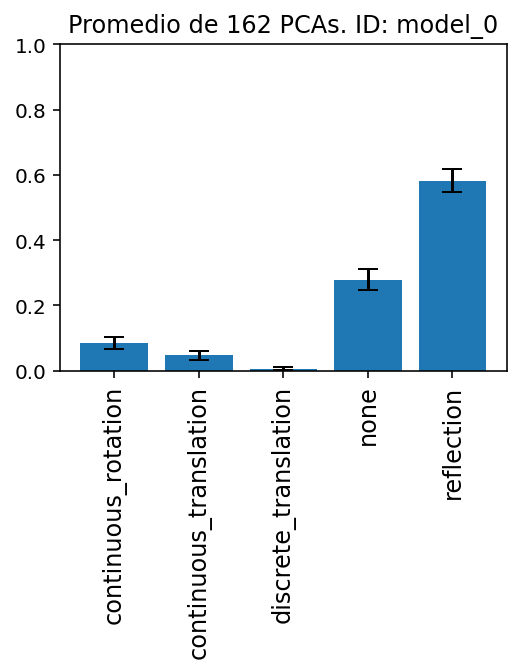

[1.85287369e-02 2.18093094e-01 1.28294352e-04 4.79766941e-01
 2.83482935e-01]


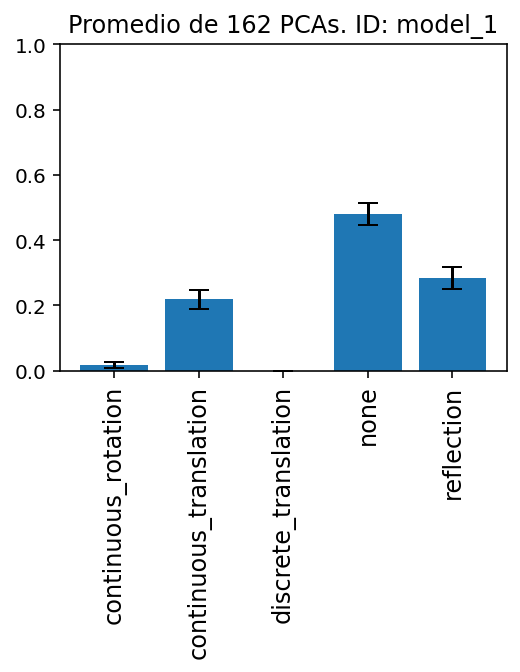

[0.04446309 0.08336093 0.02421713 0.29762575 0.5503331 ]


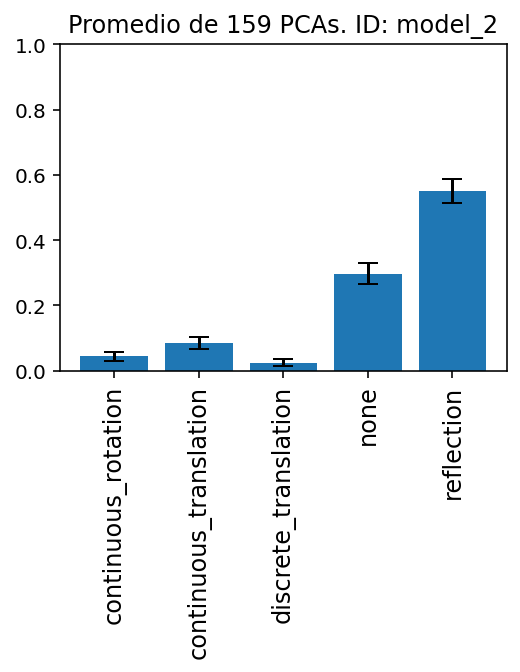

[3.57963707e-02 9.44251843e-02 3.14621061e-04 4.01311472e-01
 4.68152352e-01]


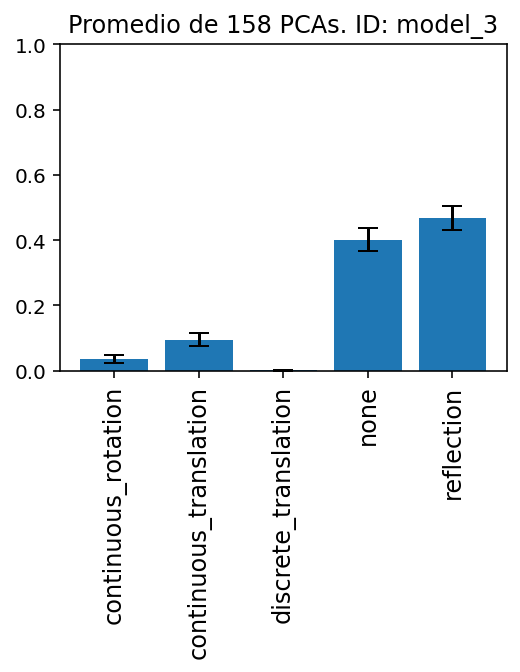

[4.95522852e-02 1.66081476e-01 3.59621791e-04 4.60042459e-01
 3.23964163e-01]


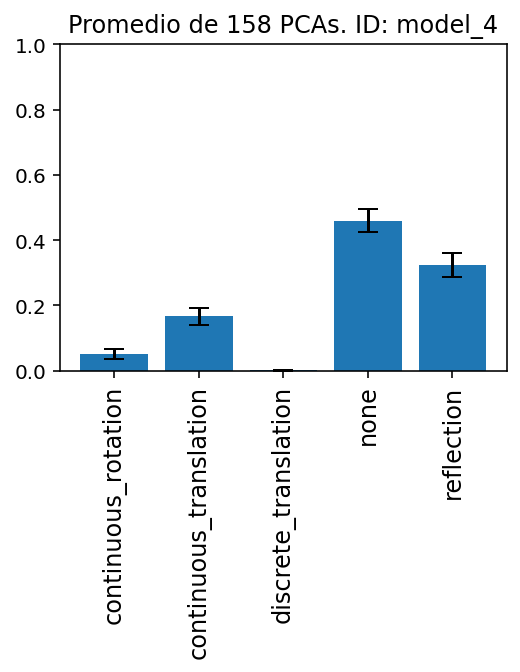

[0.03252567 0.08863666 0.00337732 0.28403314 0.5914272 ]


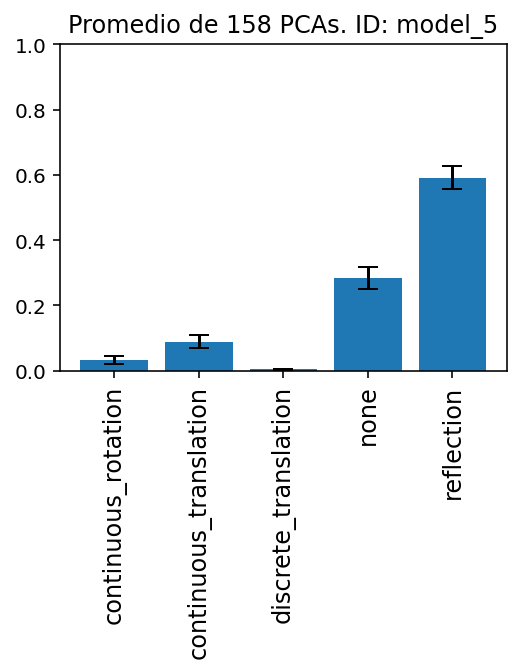

[0.04279483 0.06218292 0.02609884 0.26775389 0.60116951]


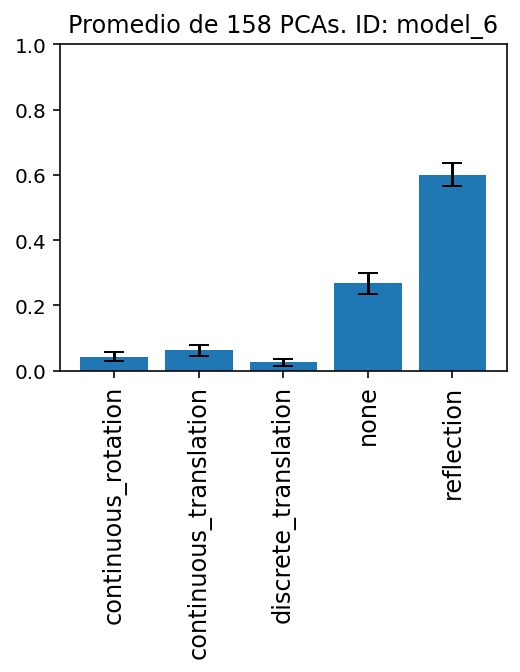

[0.05004118 0.09213126 0.01744383 0.33496594 0.5054178 ]


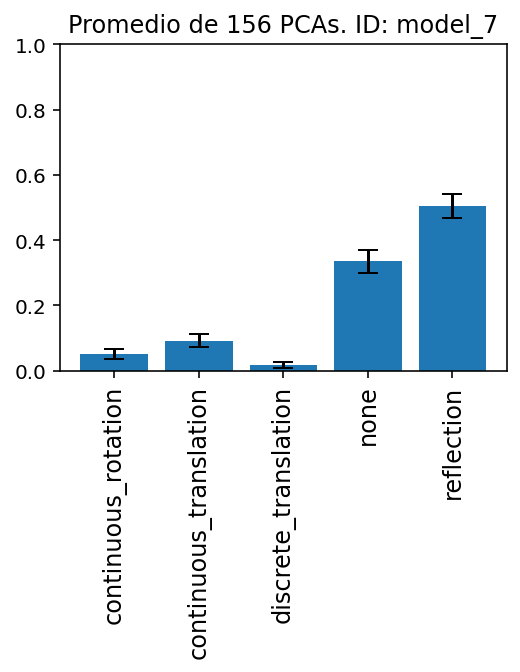

[0.05848138 0.08427489 0.00460296 0.31312062 0.53952014]


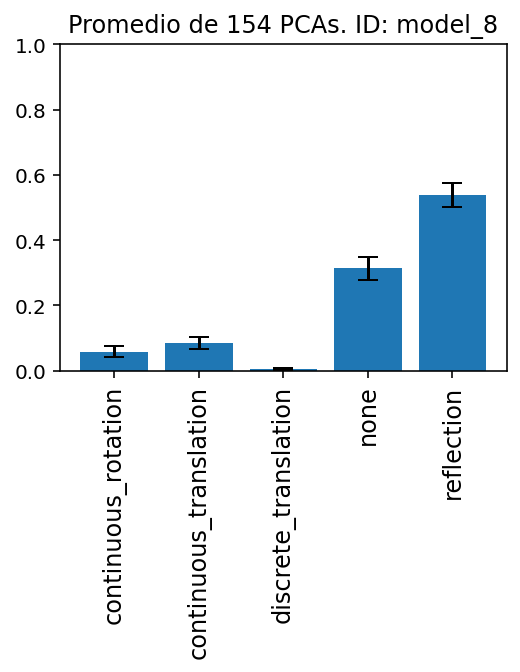

[0.05776436 0.06829975 0.02697692 0.2732807  0.57367826]


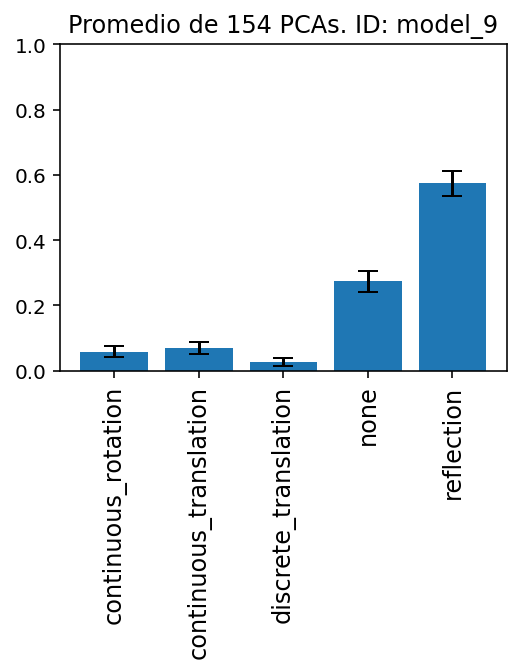

In [32]:
nom_carp = 'PCAs_detector_benchmark'

#import libraries
%config InlineBackend.figure_format = 'retina'
import seaborn as sns
from IPython.core.display import display, HTML, clear_output
display(HTML("<style>.container { width:100% !important; } div.cell.selected {border-left-width: 0px !important;}</style>"))

from time import time
import os
import glob
from fastai.vision.all import *
import numpy as np
from IPython.display import clear_output
import itertools as it
import more_itertools
#import torchvision.models
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default ="none"
import base64
from PIL import Image
from io import BytesIO
import torch
import gc
#import libraries

if not 'notebook_dir' in globals():
    notebook_dir = os.getcwd()
print('Notebook directory: ' + notebook_dir)
os.chdir(notebook_dir)  # If you changed the current working dir, this will take you back to the workbook dir.
top_dir = notebook_dir



modelo = 'G' 

if modelo == 'G':
    learn = load_learner('/home/gabriel/Desktop/models/model_90_accu_resnet18_one_cycle_10+5_no_mixup'+'.pkl', cpu=False)
     


        
#Reset Registro

registro = pd.DataFrame({
    'Col_Quit':[0], 'Run':[0],
    'continuous_rotation':[0], 'continuous_translation':[0], 'discrete_translation':[0], 'none':[0], 'reflection':[0]
})
registro = registro.drop(0)
#registro

sims = pd.DataFrame(columns = learn.dls.vocab)
errs = sims.copy()

num_img_cat = [] #guardo el numero de imagenes de cada categoria
i = 0
plote = False

from IPython.utils import io



for dires in np.sort(Path('/home/gabriel/Desktop/' + nom_carp).ls()):
    #path = Path('/home/gabriel/Desktop/PCA_INE_sexo/INE/'+quitadas)
    quitadas = str(dires).split('/')[-1]
    with io.capture_output() as captured:
        for ima in dires.ls():

            test_im_dir = ima

            im = PILImage.create(test_im_dir)

            # Orden: ['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']

            cate, num_cat, probs = learn.predict(im)


            '''
            if plote == True:
                plt.figure
                plt.figure(figsize=(4, 3))
                plt.title(ima)
                plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],probs)
                plt.xticks(rotation='vertical',fontsize = 12)
                plt.show()
            '''

            new_row = np.array([quitadas, i] + list(np.array(probs).astype(float))).reshape([1,-1])
            aden = pd.DataFrame(new_row,columns=registro.columns)

            registro = registro.append(aden, ignore_index=True)

            i+=1

    registro = registro.astype({
        'Col_Quit':str, 'Run':int,
        'continuous_rotation':float, 'continuous_translation':float, 'discrete_translation':float, 'none':float, 'reflection':float
    })  

    print('Numero Imagenes:',i)
    num_img_cat.append(i)



#registro.to_csv(r'/home/gabriel/Desktop/PCA_INE_salarios/registro_'+modelo+'.csv', index = False)
print(registro['Col_Quit'].unique())

#registro = pd.read_csv('/home/gabriel/Desktop/PCA_INE_sexo/registro.csv')

nombres_carps = registro['Col_Quit'].unique() #Nombres de las carpetas donde estan guyardadas las pcas de un tipo
num_carps = len(nombres_carps)
i = 0

for nom in nombres_carps:
    if i == 0:
        m_probs = np.array(registro.iloc[:num_img_cat[0],2:].mean())
        err_probs = np.array(registro.iloc[:num_img_cat[0],2:].std())
        nume = str(len(registro.iloc[:num_img_cat[0],2:]))
        print(learn.dls.vocab)
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)
    else:
        m_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].mean())
        err_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].std())
        nume = str(len(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:]))
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)

    if nom == '-ninguna-':
        tit = 'Promedio de '+nume+' PCAs sin quitar ninguna columna'
    else:
        tit = 'Promedio de '+nume+' PCAs. ID: '+ nom        

    
    plt.figure(figsize=(4, 3))
    plt.title(tit)
    #plt.title('Promedio de '+str(40)+' PCAs sin quitar ninguna columna')
    plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],
            m_probs,yerr = err_probs/np.sqrt(float(nume)), capsize = 5)
    plt.xticks(rotation='vertical',fontsize = 12)
    plt.ylim([0, 1])
    plt.show()
    
    i+=1

Text(0.5, 1.0, 'Study of different models for the choice of the second variable')

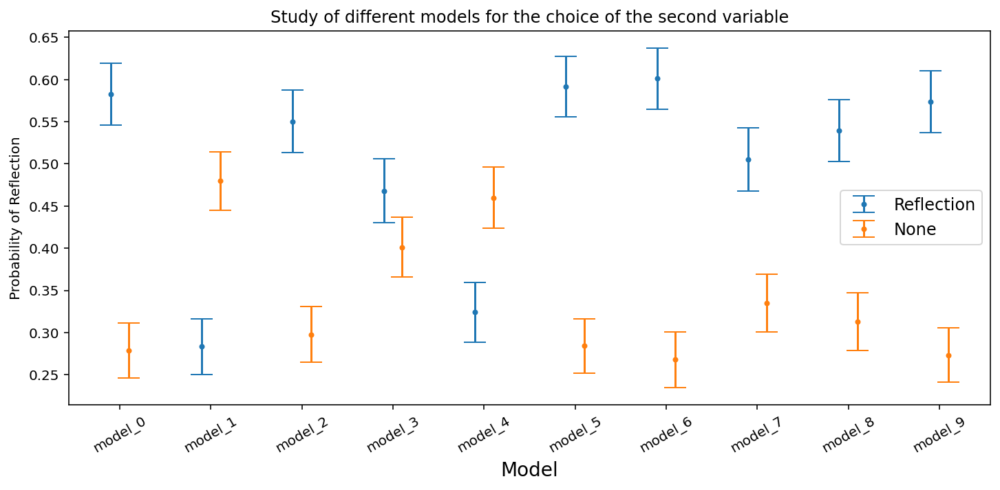

In [33]:
alfas = ['model_0', 'model_1', 'model_2', 'model_3', 'model_4', 'model_5', 'model_6', 'model_7', 'model_8', 'model_9']
plt.figure(figsize =[12,5])

#plt.errorbar(range(len(sims_0.reflection)),sims_0.reflection, yerr = errs_0.reflection,capsize = 8,label = 'Umbral: 0+')
#plt.errorbar(range(len(sims_4.reflection)),sims_4.reflection, yerr = errs_4.reflection,capsize = 8,label = 'Umbral: 4+')
#plt.errorbar(range(len(sims_10.reflection)),sims_10.reflection, yerr = errs_10.reflection,capsize = 8,label = 'Umbral: 10+')

plt.errorbar(np.array(range(len(sims.reflection))) - 0.1,sims.reflection, yerr = errs.reflection,capsize = 8,label = 'Reflection', ls = ' ', marker = '.')
plt.errorbar(np.array(range(len(sims.reflection))) + 0.1,sims.none, yerr = errs.none,capsize = 8,label = 'None', ls = ' ', marker = '.')
#plt.errorbar(range(len(sims_0.none)),1-sims_0.none, yerr = errs_0.none,capsize = 8,label = 'Umbral: 0+')
#plt.errorbar(range(len(sims.none)),1-sims.none, yerr = errs.none,capsize = 8,label = 'Umbral: 4+, 1 $-$ none')
#plt.errorbar(range(len(sims.reflection)),sims.reflection, yerr = errs.reflection,capsize = 8,label = 'Umbral: 4+, reflection')
#plt.errorbar(range(len(sims_10.none)),1-sims_10.none, yerr = errs_10.none,capsize = 8,label = 'Umbral: 10+')

#plt.errorbar(range(len(sims.none)),sims.none, yerr = errs.none,capsize = 8,label = 'None')
#plt.errorbar(range(len(sims.none)),sims.none+sims.reflection, 
#             yerr = np.sqrt(errs.none**2 + errs.reflection**2),capsize = 8,label = 'Reflection + None')
#plt.errorbar(range(len(sims.continuous_translation)),sims.continuous_translation, 
#             yerr = errs.continuous_translation,capsize = 8,label = 'Continuous Translation')
tik = plt.xticks(range(len(sims.reflection)),alfas, rotation = 30)
plt.legend(fontsize = 12)
plt.xlabel('Model',fontsize = 14)
#plt.ylim([0.5,1.01])
plt.ylabel('Probability of Reflection')
plt.title('Study of different models for the choice of the second variable')

# Two-Loop feature Importance

In [31]:
symmetries = ['reflection']

potenciales = []
potenciales_tags = []
num_pot_cada = 1

for symmetry in symmetries:
    print('Generating Potentials for',symmetry,'symmetry')
    funs_temp = [mock_data(sym = symmetry, verbose = False) for i in range(num_pot_cada)]
    funs_tags_temp = [symmetry for i in range(num_pot_cada)]
    potenciales = potenciales + funs_temp 
    potenciales_tags = potenciales_tags + funs_tags_temp
    
df = potenciales[0]

two_best = two_best_nn(df = df,target = 'bin', verbose = 2)
two_best

Generating Potentials for reflection symmetry
Keeping 2k points of the original DF
------- Selecting First Feature ------------
1600 batch size for training.

Training FCNN with layers:  [40, 40, 40]
Training for 50 epochs.
Using lr_max =  0.01
Better feature found: x
Better feature found: y
Total time estimated for finding both features: 2.79 minutes

20 features studied out of 126.

0.2 minutes elapsed for 20 features.
0.0 minutes average per feature.
1.3 minutes estimated left for 106 features.




40 features studied out of 126.

0.5 minutes elapsed for 40 features.
0.0 minutes average per feature.
1.0 minutes estimated left for 86 features.




60 features studied out of 126.

0.7 minutes elapsed for 60 features.
0.0 minutes average per feature.
0.8 minutes estimated left for 66 features.



Better feature found: -0.39242650523722356y*x

80 features studied out of 126.

1.0 minutes elapsed for 80 features.
0.0 minutes average per feature.
0.6 minutes estimated left for 46 features

['-0.39242650523722356y*x', 'sqrt(abs(x))']

In [30]:
n_f = len(df)

best_feat, imp = fast_feat_imp_rf(df.astype(np.float32),target = 'bin', graph = False)
cm_rf = df[best_feat[:n_f]].corr()

corr_imp = np.exp(np.array(imp[:n_f]))*((1-np.abs(cm_rf.iloc[:,0]))**2)

two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]

two_best

['sqrt(abs(y))', '-0.75243705622191x**2+0.06602129412040036y**2']

# Phi_K

In [137]:
symmetries = ['none']

potenciales = []
potenciales_tags = []
num_pot_cada = 1

for symmetry in symmetries:
    print('Generating Potentials for',symmetry,'symmetry')
    funs_temp = [mock_data(sym = symmetry, verbose = False) for i in range(num_pot_cada)]
    funs_tags_temp = [symmetry for i in range(num_pot_cada)]
    potenciales = potenciales + funs_temp 
    potenciales_tags = potenciales_tags + funs_tags_temp
    
df = potenciales[0]

#phik_m = df.phik_matrix()

#phik_m['bin'].sort_values()[-1:-10]

Generating Potentials for none symmetry


In [46]:
from IPython.utils import io

with io.capture_output() as captured: phik_m = df.phik_matrix()
corrs_tar = phik_m['bin'].iloc[:-1]
best = corrs_tar.sort_values().iloc[-20:-1].index[-1]
corrs_f1 = phik_m[best].iloc[:-1]
# Corr. target - corr. feature 1 (maximize the correlation with the target while minimizing the correlation with the first feature)
met = corrs_tar - corrs_f1
sec_best = met.sort_values().iloc[-20:-1].index[-1]
[best, sec_best]

['y**2', 'sqrt(abs(x))']

In [ ]:
def two_best_phi_k(df, target):
    with io.capture_output() as captured: phik_m = df.phik_matrix()
    corrs_tar = phik_m[target].iloc[:-1]
    best = corrs_tar.sort_values().iloc[-20:-1].index[-1]
    corrs_f1 = phik_m[best].iloc[:-1]
    # Corr. target - corr. feature 1 (maximize the correlation with the target while minimizing the correlation with the first feature)
    met = corrs_tar - corrs_f1
    sec_best = met.sort_values().iloc[-20:-1].index[-1]
    return [best, sec_best]
    

In [45]:
n_f = len(df)

best_feat, imp = fast_feat_imp_rf(df.astype(np.float32),target = 'bin', graph = False)
cm_rf = df[best_feat[:n_f]].corr()

corr_imp = np.exp(np.array(imp[:n_f]))*((1-np.abs(cm_rf.iloc[:,0]))**2)

two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]

two_best

['0.01499768612700092r4**2+-0.13339474219175385y**2', 'x**2']

In [43]:
two_best_n = two_best_nn(df = df,target = 'bin', verbose = 1)
two_best_n

Keeping 2k points of the original DF
------- Selecting First Feature ------------
1600 batch size for training.

Training FCNN with layers:  [40, 40, 40]
Training for 50 epochs.
Using lr_max =  0.01
Better feature found: x


KeyboardInterrupt: 

In [96]:
for i in range(10):
    symmetries = ['reflection']

    potenciales = []
    potenciales_tags = []
    num_pot_cada = 1

    for symmetry in symmetries:
        print('Generating Potentials for',symmetry,'symmetry')
        funs_temp = [mock_data(sym = symmetry, verbose = False) for i in range(num_pot_cada)]
        funs_tags_temp = [symmetry for i in range(num_pot_cada)]
        potenciales = potenciales + funs_temp 
        potenciales_tags = potenciales_tags + funs_tags_temp

    df = potenciales[0]
    
    df = df.reindex(columns = random.sample(list(df.columns),len(list(df.columns)))) #shuffle the columns
    
    from IPython.utils import io
    target = 'bin'
    n = 60


    '''# Drop some variables that are highly correlated between them
    tares = df[target]
    df.drop(target, axis = 1)
    cor_matrix = df.corr().abs()
    upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.01)]
    df = df.drop(to_drop, axis=1)
    df[target] = tares'''
    
    tares = df[target]
    df.drop(target, axis = 1)
    df[target] = tares

    if len(df) > n:
        n_f = n
    else:
        n_f = len(df)

    best_feat, imp = fast_feat_imp_rf(df.astype(np.float32),target = target, graph = False)
    with io.capture_output() as captured: cm_rf = df[best_feat[:n_f] + [target]].phik_matrix()

    corrs_tar = cm_rf[target].iloc[:-1]
    corrs_f1 = cm_rf[best_feat[0]].iloc[:-1]

    corr_imp = (((np.abs(corrs_tar)**2)*(1-np.abs(corrs_f1))))*(np.exp(np.array(imp[:n_f])))

    two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]

    print(two_best)
    #plt.figure(figsize = [15,10])
    #sns.heatmap(cm_rf, annot = True)


Generating Potentials for reflection symmetry
['-0.5091568808812679y**2+-0.3985768567326775x**2', '-0.41794006389502103x/r2']
Generating Potentials for reflection symmetry
['-0.06191299986687726y**2+0.10900351687198162x**2', '-0.8551391989715671y*x']
Generating Potentials for reflection symmetry
['sqrt(abs(x))', '0.9134090623185585y**2+-0.0811251968347193r4**2']
Generating Potentials for reflection symmetry
['-0.7952576792080877x**2+0.3992222036924211y**2', 'sqrt(abs(y))']
Generating Potentials for reflection symmetry
['sqrt(abs(x))', 'y**2']
Generating Potentials for reflection symmetry
['0.01654621011833579r2**2+0.7980462454438126y**2', 'x**2']
Generating Potentials for reflection symmetry
['y**2', 'x**2']
Generating Potentials for reflection symmetry
['0.2669825501663816y**2+0.4031404736856177x**2', 'y**2']
Generating Potentials for reflection symmetry
['-0.0900098017443356r1**2+-0.9464499815728349x**2', 'y**2']
Generating Potentials for reflection symmetry
['0.568018199695129x**2+-

In [138]:
for i in range(10):
    symmetries = ['reflection']

    potenciales = []
    potenciales_tags = []
    num_pot_cada = 1

    for symmetry in symmetries:
        print('Generating Potentials for',symmetry,'symmetry')
        funs_temp = [mock_data(sym = symmetry, verbose = False) for i in range(num_pot_cada)]
        funs_tags_temp = [symmetry for i in range(num_pot_cada)]
        potenciales = potenciales + funs_temp 
        potenciales_tags = potenciales_tags + funs_tags_temp

    df = potenciales[0]
    print(two_best_rf_phi_k(df,'bin',n = 30,lim_corr = 0.000001))


Generating Potentials for reflection symmetry
['sqrt(abs(x))', 'y**2']
Generating Potentials for reflection symmetry
['x**2', 'sqrt(abs(y))']
Generating Potentials for reflection symmetry
['x**2', '0.012400435342188265x/r0']
Generating Potentials for reflection symmetry
['sqrt(abs(y))', '-0.7565745672239308x**2+-0.06872295948269391r0**2']
Generating Potentials for reflection symmetry
['sqrt(abs(x))', 'sqrt(abs(y))']
Generating Potentials for reflection symmetry
['-0.24167483487189845x**2+0.3521609771828955y**2', '0.5790515039275159r3**2+0.7434713828129047y**2']
Generating Potentials for reflection symmetry
['sqrt(abs(x))', 'sqrt(abs(y))']
Generating Potentials for reflection symmetry
['x**2', 'sqrt(abs(y))']
Generating Potentials for reflection symmetry
['sqrt(abs(y))', '-0.024473800407063484r1**2+-0.3523185223601675x**2']
Generating Potentials for reflection symmetry
['0.9661858659618117y**2+0.39509417607405717x**2', '-0.11777264444884983r3+0.9729878683566842x']


In [115]:
def two_best_rf_phi_k(df, target):
    
    n_f = len(df)
    best_feat, imp = fast_feat_imp_rf(df.astype(np.float32),target = target, graph = False)
    with io.capture_output() as captured: cm_rf = df[best_feat[:n_f]].phik_matrix()

    corr_imp = np.exp(np.array(imp[:n_f]))*((1-np.abs(cm_rf.iloc[:,0]))**2)

    two_best = [best_feat[0],(corr_imp.iloc[1:].sort_values()).index[-1]]
    
    return two_best

In [139]:
from time import time
st = time()
for i in range( 10):
    print(two_best_rf_phi_k(df, target = 'bin', n = 30, lim_corr = 0.85))
(time()-st)/60

['x', 'y**2']
['x', 'y**2']
['x', 'y**2']
['x', 'y**2']
['x', 'y**2']
['x', 'y**2']
['x', 'y**2']
['x', 'y**2']
['x', 'y**2']
['x', 'y**2']


0.21507613658905028

In [49]:
for i in range(10):
    symmetries = ['reflection']

    potenciales = []
    potenciales_tags = []
    num_pot_cada = 1

    for symmetry in symmetries:
        print('Generating Potentials for',symmetry,'symmetry')
        funs_temp = [mock_data(sym = symmetry, verbose = False) for i in range(num_pot_cada)]
        funs_tags_temp = [symmetry for i in range(num_pot_cada)]
        potenciales = potenciales + funs_temp 
        potenciales_tags = potenciales_tags + funs_tags_temp

    df = potenciales[0]
    
    for i in range(2):
        print(two_best_rf_phi_k(df, target = 'bin', n = 30, lim_corr = 0.85))


Generating Potentials for reflection symmetry
['0.12360260087372099x**2+-0.06472703203291541y**2', '-0.029946800419417885x*y']
['0.12360260087372099x**2+-0.06472703203291541y**2', '-0.029946800419417885x*y']
Generating Potentials for reflection symmetry
['x**2', 'y**2']
['x**2', 'y**2']
Generating Potentials for reflection symmetry
['-0.6167285426326179y**2+0.7235518481905141x**2', '-0.7738151651645806y/r4']
['-0.6167285426326179y**2+0.7235518481905141x**2', '0.48244602364218014y*x']
Generating Potentials for reflection symmetry
['y**2', 'x**2']
['y**2', 'x**2']
Generating Potentials for reflection symmetry
['y**2', 'x**2']
['y**2', 'x**2']
Generating Potentials for reflection symmetry
['y**2', 'x**2']
['y**2', 'x**2']
Generating Potentials for reflection symmetry
['x**2', 'y**2']
['x**2', 'y**2']
Generating Potentials for reflection symmetry
['y**2', 'x**2']
['y**2', 'x**2']
Generating Potentials for reflection symmetry
['x**2', '-0.13632867743880817r3/r1']
['x**2', 'y**2']
Generating

In [98]:
cor_matrix = df.corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.8)]
df1 = df.drop(to_drop, axis=1)
df1['x**2']


0       1.0
1       1.0
2       1.0
3       1.0
4       1.0
       ... 
9995    1.0
9996    1.0
9997    1.0
9998    1.0
9999    1.0
Name: x**2, Length: 10000, dtype: float64

In [6]:
symmetries = ['reflection']

potenciales = []
potenciales_tags = []
num_pot_cada = 1

for symmetry in symmetries:
    print('Generating Potentials for',symmetry,'symmetry')
    funs_temp = [mock_data(sym = symmetry, verbose = False) for i in range(num_pot_cada)]
    funs_tags_temp = [symmetry for i in range(num_pot_cada)]
    potenciales = potenciales + funs_temp 
    potenciales_tags = potenciales_tags + funs_tags_temp

df = potenciales[0]

two_best_nn(df[['x','y','x**2','y**2','bin']],target = 'bin', verbose = 1, select_2k = False)


Generating Potentials for reflection symmetry
------- Selecting First Feature ------------
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 60 epochs.
Using lr_max =  0.01
Better feature found: x, with RMSE 0.2869729697704315
Better feature found: y, with RMSE 0.274048775434494
Better feature found: y**2, with RMSE 0.27150049805641174
------- Selecting Second Feature ------------
8000 batch size for training.

Training FCNN with layers:  [50, 50, 50, 50, 50]
Training for 60 epochs.
Using lr_max =  0.01
Better feature found: x
Better feature found: x**2


['y**2', 'x**2']


 x y 

------- Selecting First Feature ------------
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01
Better feature found: ['x', 'y'], with RMSE 0.05072115734219551


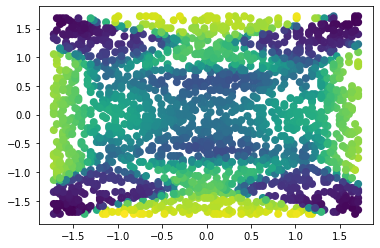


 x x**2 

------- Selecting First Feature ------------
Better feature found: ['x', 'x**2'], with RMSE 0.28328147530555725


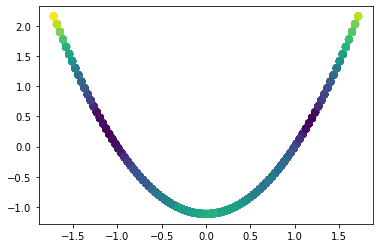


 x y**2 

------- Selecting First Feature ------------
Better feature found: ['x', 'y**2'], with RMSE 0.03721616417169571


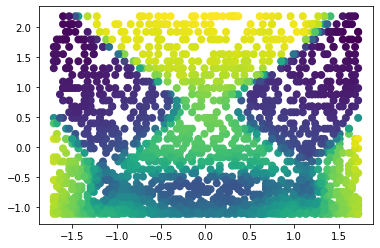


 y x**2 

------- Selecting First Feature ------------
Better feature found: ['y', 'x**2'], with RMSE 0.04047684371471405


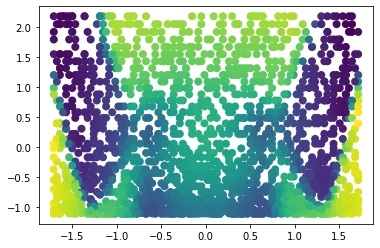


 y y**2 

------- Selecting First Feature ------------
Better feature found: ['y', 'y**2'], with RMSE 0.25445812940597534


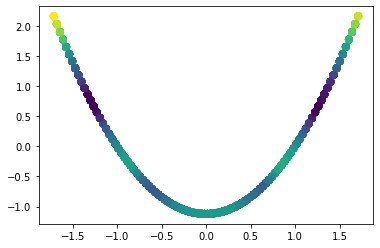


 x**2 y**2 

------- Selecting First Feature ------------
Better feature found: ['x**2', 'y**2'], with RMSE 0.02162427082657814


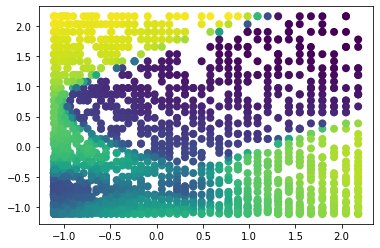

In [62]:
cols = ['x','y','x**2','y**2']

select_2k = False

target= 'bin'
verbose = 1

i=0

a = cols

df_org = df.copy()

for r in range(len(a)):
    for rr in range(len(a)-r-1):
        print('\n',a[r],a[rr+r+1],'\n')
        
        
        df = df[cols + ['bin']]

        from IPython.utils import io

        # Hyperparameters: 
        bs_choices = [50000]       # Batch Size
        shape='pipe'               # Shape of the neural network
        layers_choices = [5]       # Number of layers of the net. Default:10 or 5 results with 5
        neurons_choices = [100]    # Number of neurons per layer. Default:200 results with 200
        epoch_choices = [150]      # Number of training epochs. Default:200 results with 60
        lr_choices = [0.01]       # Max learning rate 
        valid_pct=0.2              # Part of the data that goes into validation (0.2 = 20%)
        monitor= 'valid_loss'        # Te model with the least 'monitor' will be saved

        df2 = df.copy()

        if select_2k == True:
            if len(df[target]) <= 2000:
                print('Too little data to keep 2k points and discard the rest')
            else:
                print('Keeping 2k points of the original DF')
                remove_n = len(df[target]) - 2000
                drop_indices = np.random.choice(df.index, remove_n, replace=False)
                df_temp = df.drop(drop_indices)
                df = df_temp.copy()


        # ------------------- First Feature ----------------------- #

        nrmse = np.inf

        feats = np.array(df.drop(target, axis = 1).columns)
        feat = [a[r],a[rr+r+1]]

        num_pot = len(feats)

        from time import time
        start_time = time()

        if verbose == 1 or verbose == 2: print('------- Selecting First Feature ------------')


        i+=1
        df2 = df.copy() 

        splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

        to = TabularPandas(df2,
                        procs=[Categorify,FillMissing, Normalize],
                        cont_names = feat,
                        y_names = target,
                        splits=splits)

        train_size = len(splits[0])
        valid_size = len(splits[1])

        # ----------------- Hyperparameters ------------------- #

        # Batch Size (a large one)
        bs=min(random.choice(bs_choices),train_size)  
        if i == 1: 
            if verbose == 1 or verbose == 2: print('{} batch size for training.\n'.format(bs))

        # Neurons per layer
        neurons_per_layer = random.choice(neurons_choices)

        # Number of layers
        n_layers = random.choice(layers_choices)

        #Shape of the net: Pipe or funnel
        if shape == 'pipe':
            layers=[neurons_per_layer for i in range(n_layers)]

        if shape == 'funnel':
            n_eff = n_layers
            layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

        if i == 1: 
            if verbose == 1 or verbose == 2: print('Training FCNN with layers: ',layers)

        #Number of epochs
        n_epoch=random.choice(epoch_choices)
        if i == 1: 
            if verbose == 1 or verbose == 2: print('Training for {} epochs.'.format(n_epoch))

        # Maximum Learning Rate: (a good value can be found using learn.lr_find())
        lr_max=float(random.choice(lr_choices))
        if i == 1: 
            if verbose == 1 or verbose == 2: print('Using lr_max = ',format(lr_max))

        # ----------------------------------------------------- #

        # --------------- Training the FCNN --------------------#

        # Load the data into a DataLoader
        dls = to.dataloaders(bs=bs)

        # Define a Tabular Learner
        learn = tabular_learner(dls, layers=layers
                            #,config=config
                            #,metrics=[mse],
                            #y_range = [min(df[target]),max(df[target])],
                            ,cbs=ShowGraphCallback()
                            #,train_bn=False)
                            )

        # Train the net 
        with io.capture_output() as captured:
            with learn.no_logging():
                learn.fit_one_cycle(n_epoch=n_epoch
                                    ,lr_max=lr_max
                                    ,cbs=[SaveModelCallback(monitor=monitor)]
                                    )


            preds, targs = learn.get_preds()

        #RMSE 
        ff = (preds-targs)**2/len(targs)
        #ff = np.sqrt(np.sqrt(np.abs(preds-targs)))/len(targs)
        ff = sum(ff)
        RMSE = np.sqrt(ff)
        #print('RMSE:',float(RMSE))
        nrmsei = float(RMSE)#/(max(np.array(targs).flatten()-min(np.array(targs).flatten())))
        #print('Normalized RMSE:',float(RMSE)/(max(np.array(targs).flatten()-min(np.array(targs).flatten())))*100,'%')

        if nrmsei < nrmse:
            nrmse = nrmsei
            best_f0 = feat
            if verbose == 1 or verbose == 2: print('Better feature found: {}, with RMSE {}'.format(best_f0,nrmsei))

        minutes_until_now = (time() - start_time)/60
        images_done = i
        minutes_per_image = minutes_until_now/(images_done)
        hours_left = minutes_per_image * (num_pot-images_done)/60

        if i%20 == 0:
            if verbose == 2: 
                print("\n{} features studied out of {}.\n".format(images_done,num_pot))
                print("{:.1f} minutes elapsed for {} features.".format(minutes_until_now,images_done))
                print("{:.1f} minutes average per feature.".format(minutes_until_now/images_done))
                print("{:.1f} minutes estimated left for {} features.\n\n\n".format(hours_left*60,num_pot-images_done))
                #print("{:.1f} hours estimated left for {} features.\n\n\n".format(hours_left,num_pot-images_done))

        if i == 10:
            if verbose == 1 or verbose == 2: print('Total time estimated for finding both features: {} minutes'.format(np.round(2*hours_left*60,2)))
                
        df = df_org.copy()
        

        #plt.figure()
        #plt.scatter(dls.valid.xs.iloc[:,0], dls.valid.xs.iloc[:,1], c = preds.flatten(), marker = '.', lw = 5)
        #plt.show()
        
        
        # ------------------------- PCA ------------------------#

        test_df = df2.copy()
        dl = learn.dls.test_dl(test_df,bs=int(test_df.shape[0])) 

        # Tenemos que hacer un Hook, una especie de gancho que enganchamos en la última capa interna,
        # para guardar, de cada modelo, los valores de los parámetro de dicha capa. 
        with Hooks(learn.model.layers, lambda m,i,o: o) as h:
            preds = learn.get_preds(dl=dl,with_input=True,with_decoded=True,with_loss=True)

        targets=preds[2].numpy().flatten()

        # Cogemos la información de la penúltima capa
        # OJO: Si añadimos y_range, se añade automaticamente una sigmoid
        # al final, por lo que tendríamos que coger la capa -3 en vez de la -2
        act = h.stored[-2] 
        multi_dim=Tensor.cpu(act).numpy()
        standardized=StandardScaler().fit_transform(multi_dim)

        viz = PCA(2).fit_transform(np.nan_to_num(standardized))
        #plt.figure()
        #plt.scatter(viz[:, 0], viz[:, 1],c=targets[:multi_dim.shape[0]],alpha=.1, marker = 'o')

        PCA_s.append(viz)

        # ------------------------------------------------------ #

        # ------------------ Saving the PCA's ------------------ #

        # ---- Dar formato a PCA para guardar como imagen con color

        viz = pd.DataFrame(viz) #Transformamos la PCA en un dataframe
        viz.columns = ['x','y'] #Nombres de las columnas

        # Insertamos una columna con los colores de los puntos. El valor del potencial
        # objetivo (targets) es el color, y hay un color por cada punto 
        viz.insert(2,'class',targets[:multi_dim.shape[0]]) 

        # ---- Personalizar mapa de color 

        n_classes=1000

        colors = 'rainbow'

        if colors == 'rainbow':
            my_cmap = plt.cm.get_cmap('rainbow', n_classes)
            classes_in_rgb = my_cmap(range(n_classes))
        if colors == 'purple':
            my_cmap = plt.cm.get_cmap('rainbow', n_classes)
            classes_in_rgb = np.vstack((np.array([0,0,0,0]),my_cmap([0 for i in range(n_classes)])))

        # ---- Hacer que la intensidad del pixel represente la cantidad de puntos 
        #      acumuldos en un pixel

        n_pixels = 224

        binning_3d=np.histogramdd([viz['x'],viz['y'],viz['class']],range=(None,None,(0,1)), bins=(n_pixels,n_pixels,n_classes))

        #if we want the pixel intensity to reprensent the number of points at that location
        array = np.dot(binning_3d[0],classes_in_rgb)
        array = array/np.amax(array)

        # ---- Guardar la PCA

        #Directorio donde guardaremos las imagenes
        dir_sym = os.path.join(dir,tags[j-1])
        if not os.path.isdir(dir_sym):
            print('Creating directory:\n',dir_sym)
            os.mkdir(dir_sym)


        # Nombre de la imagen. Pongo el tiempo para que todas se llamen distinto cada vez.
        img_file = str(tags[j-1])+'_'+str(j)+str(round(time()))+'-'+str(n_classes)+'_'+'color_classes--'+'_PCA.png' 
        output_dir = os.path.join(dir_sym,img_file) # Directorio donde guardamos la imagen
        plt.imsave(output_dir,array) # Guardar
        print('\nPCA saved to:\n{}\n'.format(dir_sym+'/'+img_file))

        # ------------------------ Time -------------------------#

        minutes_until_now = (time() - start_time)/60
        images_done = j+num_pot*rtd
        minutes_per_image = minutes_until_now/(images_done)
        hours_left = minutes_per_image * (num_pot*rep_todo-images_done)/60
        print("\n{} PCA's made out of {}.\n".format(images_done,num_pot*rep_todo))
        print("{:.1f} minutes elapsed for {} images.".format(minutes_until_now,images_done))
        print("{:.1f} minutes average per image.".format(minutes_until_now/images_done))
        print("{:.1f} minutes estimated left for {} images.\n\n\n".format(hours_left*60,num_pot*rep_todo-images_done))
        print("{:.1f} hours estimated left for {} images.\n\n\n".format(hours_left,num_pot*rep_todo-images_done))
        j+=1

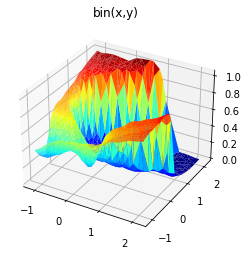

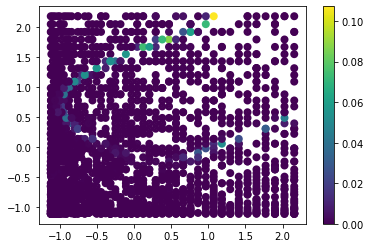

In [58]:

ax2 = plt.axes(projection='3d')
ax2.plot_trisurf(dls.valid.xs.iloc[:,0], dls.valid.xs.iloc[:,1], preds.flatten(), linewidth=0.2, cmap = 'jet')
plt.title('bin(x,y)')
plt.show()
plt.figure()
plt.scatter(dls.valid.xs.iloc[:,0], dls.valid.xs.iloc[:,1], c = np.abs(targs.flatten() - preds.flatten())**2, marker = '.', lw = 5)
plt.colorbar()




In [50]:
preds

tensor([[0.0916],
        [0.5125],
        [0.6309],
        ...,
        [0.4485],
        [0.0053],
        [0.7913]])

# New Feature Importance

In [143]:
rep_todo = 10

# Tiempo en el que empezamos a procesar
from time import time
start_time = time()

for rtd in range(rep_todo):
    from fastai.vision.all import *
    from time import time
    from IPython.utils import io

    model_fi = 'RF_phi_k' # RF, FW, RF_phi_k, phi_k
    #Tipos de simetría que quiero generar
    #syms = ['continuous_rotation', 'discrete_translation', 'reflection', 'none', 'continuous_translation']
    symmetries = ['continuous_rotation', 'discrete_translation', 'reflection', 'none', 'continuous_translation']

    num_pot_cada = 4 # Numero de potenciales de cada tipo

    int_1 = False #Interactions in Feature Importance 1 (RF)
    int_2 = False
    select_10k = True #Keep only 10000 elements of the original potential DF

    # ------------------- Folder PCA ------------------- #

    folder = 'PCAs_detector_rfpk'

    dd = top_dir + '/' + folder
    if not os.path.isdir(dd):
        print('Creating directory:\n',dd)
        os.mkdir(dd)

    dir = os.path.join(top_dir,folder)

    #------------------------------ Generar Potenciales ---------------------------#


    potenciales = []
    potenciales_tags = []

    for symmetry in symmetries:
        print('Generating Potentials for',symmetry,'symmetry')
        funs_temp = [mock_data(sym = symmetry, verbose = False) for i in range(num_pot_cada)]
        funs_tags_temp = [symmetry for i in range(num_pot_cada)]
        potenciales = potenciales + funs_temp 
        potenciales_tags = potenciales_tags + funs_tags_temp

    # Vamos a ordenar los potenciales de forma aleatoria, aunque en realidad
    # este paso no es relevante, puesto que para cada potencial entrenaremos una 
    # red. Si fuéramos a entrenar una red con todos los potenciales, entonces sí
    # que sería relevante.

    num_pot = len(potenciales) # Numero de Potenciales que quiero (por si no quiero todos)

    c = list(zip(potenciales,potenciales_tags))

    # Barajamos los potenciales, para pasarseslos en orden aleatorio
    #random.shuffle(c)

    potenciales_aux, tags = zip(*c)

    potenciales = [potenciales_aux[i] for i in range(num_pot)]




    class SaveModelCallback(TrackerCallback):
        "A `TrackerCallback` that saves the model's best during training and loads it at the end."
        _only_train_loop = True
        def __init__(self, monitor='valid_loss', comp=None, min_delta=0., fname='model', every_epoch=False, at_end=False,
                     with_opt=False, reset_on_fit=True):
            super().__init__(monitor=monitor, comp=comp, min_delta=min_delta, reset_on_fit=reset_on_fit)
            assert not (every_epoch and at_end), "every_epoch and at_end cannot both be set to True"
            # keep track of file path for loggers
            self.last_saved_path = None
            store_attr('fname,every_epoch,at_end,with_opt')

        def _save(self, name): self.last_saved_path = self.learn.save(name, with_opt=self.with_opt)

        def after_epoch(self):
            "Compare the value monitored to its best score and save if best."
            if self.every_epoch: self._save(f'{self.fname}_{self.epoch}')
            else: #every improvement
                super().after_epoch()
                if self.new_best:
                    #print(f'Better model found at epoch {self.epoch} with {self.monitor} value: {self.best}.')
                    self._save(f'{self.fname}')

        def after_fit(self, **kwargs):
            "Load the best model."
            if self.at_end: self._save(f'{self.fname}')
            elif not self.every_epoch: self.learn.load(f'{self.fname}', with_opt=self.with_opt)

    # ---------------- Definiciones previas e hiperparámetros ----------------- #

    #Guardo los modelos para analizarlos luego
    models = [] 
    to_s = []

    #Guardaremos los resultados de la PCA en un array 
    PCA_s = []
    PCA_s_tag = []

    # Hyperparameters: De momento los pondré aquí, pero luego serán un input entero
    bs_choices = [50000]       # Batch Size
    shape='pipe'               # Shape of the neural network
    layers_choices = [5]       # Number of layers of the net. Default:10 or 5 results with 5
    neurons_choices = [50]    # Number of neurons per layer. Default:200 results with 200
    epoch_choices = [150]      # Number of training epochs. Default:200 results with 60
    lr_choices = [0.01]       # Max learning rate 
    valid_pct=0.2              # Part of the data that goes into validation (0.2 = 20%)
    monitor= 'valid_loss'        # Te model with the least 'monitor' will be saved



    # ---------------------- Entrenar Red Y PCA -----------------------------------#

    j = 1 # Usaremos esto para saber cuantos potenciales hemos procesado, y como indice en general

    for df in potenciales:
        
        #------------------------------ Feature Importance inicial ---------------------------#

        if select_10k == True:
            if len(df.bin) <= 100*100:
                print('Too little data to keep 10k points')
            else:
                print('Keeping 10k points of the original DF')
                remove_n = len(df.bin) - 10000
                drop_indices = np.random.choice(df.index, remove_n, replace=False)
                df_temp = df.drop(drop_indices)
                df = df_temp.copy()


        print('First Feature importance')
        
        small_df = df.copy()

        if model_fi == 'FW':

            #Select 10k random elements without repetition
            inds = random.sample(range(len(df)), len(df))
            inds = np.sort(inds)
            small_df = df.iloc[inds,:]

            with io.capture_output() as captured1: output = featurewiz(small_df, 'bin', corr_limit=0.1,
                                                                        verbose=0, sep=',', header=0, test_data='',
                                                                        feature_engg='', category_encoders='')

            two_best = output[0][:2]

        elif model_fi == 'RF':


            if int_1 == True:

                n_f = len(small_df)

                small_df.drop('bin', axis = 1)
                small_df = my_interactions_small(small_df.astype(np.float32), numo_int = int(len(small_df.columns)/2 + 1), verbose = True)

                small_df['bin'] = df.bin

            else:
                n_f = 10

            two_best = two_best_rf(df, target = 'bin')
            
            
        elif model_fi == 'phi_k':
            two_best = two_best_rf(df, target = 'bin')
            
        elif model_fi == 'RF_phi_k':
            two_best = two_best_rf_phi_k(df,'bin',n = 30,lim_corr = 0.000001) #two_best_rf_phi_k(df, target = 'bin', n = 30, lim_corr = 0.7)
            
        small_df = small_df[two_best]
        small_df['bin'] = df['bin']
     


        # Debemos marcar cada potencial para tener claro a qué tipo de simetria corresponde cada PCA
        PCA_s_tag.append(tags[j-1])

        df2 = small_df.copy() 
        two_best_2 = two_best
        print('\n ----> Training with features {} and {} \n'.format(two_best_2[0],two_best_2[1]))

        splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

        to = TabularPandas(df2,
                        procs=[Categorify,FillMissing, Normalize],
                        cont_names = two_best_2,
                        y_names = 'bin',
                        splits=splits)

        train_size = len(splits[0])
        valid_size = len(splits[1])

        # ----------------- Hyperparameters ------------------- #

        # Batch Size (a large one)
        bs=min(random.choice(bs_choices),train_size)  
        print('{} batch size for training.\n'.format(bs))

        # Neurons per layer
        neurons_per_layer = random.choice(neurons_choices)

        # Number of layers
        n_layers = random.choice(layers_choices)

        #Shape of the net: Pipe or funnel
        if shape == 'pipe':
            layers=[neurons_per_layer for i in range(n_layers)]

        if shape == 'funnel':
            n_eff = n_layers
            layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

        print('Training FCNN with layers: ',layers)

        #Number of epochs
        n_epoch=random.choice(epoch_choices)
        print('Training for {} epochs.'.format(n_epoch))

        # Maximum Learning Rate: (a good value can be found using learn.lr_find())
        lr_max=float(random.choice(lr_choices))
        print('Using lr_max = ',format(lr_max))

        # ----------------------------------------------------- #

        # --------------- Training the FCNN --------------------#

        # Load the data into a DataLoader
        dls = to.dataloaders(bs=bs)

        # Define a Tabular Learner
        learn = tabular_learner(dls, layers=layers
                            #,config=config
                            #,metrics=[mse],
                            #y_range = [min(df.bin),max(df.bin)],
                            #,cbs=ShowGraphCallback()
                            #,train_bn=False)
                            )

        # Train the net 
        with learn.no_logging():
            learn.fit_one_cycle(n_epoch=n_epoch
                                ,lr_max=lr_max
                                ,cbs=[SaveModelCallback(monitor=monitor)]
                                )

        # Guardamos modelos y tabular objects para el posterior analisis
        models.append(learn)
        to_s.append(to)

        # ------------------------------------------------------#


        # ------------------------- PCA ------------------------#

        test_df = df2.copy()
        dl = learn.dls.test_dl(test_df,bs=int(test_df.shape[0])) 

        # Tenemos que hacer un Hook, una especie de gancho que enganchamos en la última capa interna,
        # para guardar, de cada modelo, los valores de los parámetro de dicha capa. 
        with Hooks(learn.model.layers, lambda m,i,o: o) as h:
            preds = learn.get_preds(dl=dl,with_input=True,with_decoded=True,with_loss=True)

        targets=preds[2].numpy().flatten()

        # Cogemos la información de la penúltima capa
        # OJO: Si añadimos y_range, se añade automaticamente una sigmoid
        # al final, por lo que tendríamos que coger la capa -3 en vez de la -2
        act = h.stored[-2] 
        multi_dim=Tensor.cpu(act).numpy()
        standardized=StandardScaler().fit_transform(multi_dim)

        viz = PCA(2).fit_transform(np.nan_to_num(standardized))
        #plt.figure()
        #plt.scatter(viz[:, 0], viz[:, 1],c=targets[:multi_dim.shape[0]],alpha=.1, marker = 'o')

        PCA_s.append(viz)

        # ------------------------------------------------------ #

        # ------------------ Saving the PCA's ------------------ #

        # ---- Dar formato a PCA para guardar como imagen con color

        viz = pd.DataFrame(viz) #Transformamos la PCA en un dataframe
        viz.columns = ['x','y'] #Nombres de las columnas

        # Insertamos una columna con los colores de los puntos. El valor del potencial
        # objetivo (targets) es el color, y hay un color por cada punto 
        viz.insert(2,'class',targets[:multi_dim.shape[0]]) 

        # ---- Personalizar mapa de color 

        n_classes=1000

        colors = 'rainbow'

        if colors == 'rainbow':
            my_cmap = plt.cm.get_cmap('rainbow', n_classes)
            classes_in_rgb = my_cmap(range(n_classes))
        if colors == 'purple':
            my_cmap = plt.cm.get_cmap('rainbow', n_classes)
            classes_in_rgb = np.vstack((np.array([0,0,0,0]),my_cmap([0 for i in range(n_classes)])))

        # ---- Hacer que la intensidad del pixel represente la cantidad de puntos 
        #      acumuldos en un pixel

        n_pixels = 224

        binning_3d=np.histogramdd([viz['x'],viz['y'],viz['class']],range=(None,None,(0,1)), bins=(n_pixels,n_pixels,n_classes))

        #if we want the pixel intensity to reprensent the number of points at that location
        array = np.dot(binning_3d[0],classes_in_rgb)
        array = array/np.amax(array)

        # ---- Guardar la PCA

        #Directorio donde guardaremos las imagenes
        dir_sym = os.path.join(dir,tags[j-1])
        if not os.path.isdir(dir_sym):
            print('Creating directory:\n',dir_sym)
            os.mkdir(dir_sym)


        # Nombre de la imagen. Pongo el tiempo para que todas se llamen distinto cada vez.
        img_file = str(tags[j-1])+'_'+str(j)+str(round(time()))+'-'+str(n_classes)+'_'+'color_classes--'+'_PCA.png' 
        output_dir = os.path.join(dir_sym,img_file) # Directorio donde guardamos la imagen
        plt.imsave(output_dir,array) # Guardar
        print('\nPCA saved to:\n{}\n'.format(dir_sym+'/'+img_file))

        # ------------------------ Time -------------------------#

        minutes_until_now = (time() - start_time)/60
        images_done = j+num_pot*rtd
        minutes_per_image = minutes_until_now/(images_done)
        hours_left = minutes_per_image * (num_pot*rep_todo-images_done)/60
        print("\n{} PCA's made out of {}.\n".format(images_done,num_pot*rep_todo))
        print("{:.1f} minutes elapsed for {} images.".format(minutes_until_now,images_done))
        print("{:.1f} minutes average per image.".format(minutes_until_now/images_done))
        print("{:.1f} minutes estimated left for {} images.\n\n\n".format(hours_left*60,num_pot*rep_todo-images_done))
        print("{:.1f} hours estimated left for {} images.\n\n\n".format(hours_left,num_pot*rep_todo-images_done))
        j+=1


      # ------------------------------------------------------#

Generating Potentials for continuous_rotation symmetry
Generating Potentials for discrete_translation symmetry
Generating Potentials for reflection symmetry
Generating Potentials for none symmetry
Generating Potentials for continuous_translation symmetry
Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.4303731746978119x**2+-0.8503946264825624y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_11637337199-1000_color_classes--_PCA.png


1 PCA's made out of 200.

0.2 minutes elapsed for 1 images.
0.2 minutes average per image.
35.6 minutes estimated left for 199 images.



0.6 hours estimated left for 199 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.6827310644857558y*x and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_21637337206-1000_color_classes--_PCA.png


2 PCA's made out of 200.

0.3 minutes elapsed for 2 images.
0.1 minutes average per image.
28.7 minutes estimated left for 198 images.



0.5 hours estimated left for 198 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(x)) and y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_31637337213-1000_color_classes--_PCA.png


3 PCA's made out of 200.

0.4 minutes elapsed for 3 images.
0.1 minutes average per image.
26.2 minutes estimated left for 197 images.



0.4 hours estimated left for 197 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_41637337219-1000_color_classes--_PCA.png


4 PCA's made out of 200.

0.5 minutes elapsed for 4 images.
0.1 minutes average per image.
25.0 minutes estimated left for 196 images.



0.4 hours estimated left for 196 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.29511164898701225y*x and -0.7859955417397879x**2+0.7305601921415099y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_51637337226-1000_color_classes--_PCA.png


5 PCA's made out of 200.

0.6 minutes elapsed for 5 images.
0.1 minutes average per image.
24.1 minutes estimated left for 195 images.



0.4 hours estimated left for 195 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y and -0.2217680017246717y*x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_61637337232-1000_color_classes--_PCA.png


6 PCA's made out of 200.

0.7 minutes elapsed for 6 images.
0.1 minutes average per image.
23.6 minutes estimated left for 194 images.



0.4 hours estimated left for 194 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.18510274986692932x*y and x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_71637337239-1000_color_classes--_PCA.png


7 PCA's made out of 200.

0.8 minutes elapsed for 7 images.
0.1 minutes average per image.
23.2 minutes estimated left for 193 images.



0.4 hours estimated left for 193 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_81637337246-1000_color_classes--_PCA.png


8 PCA's made out of 200.

1.0 minutes elapsed for 8 images.
0.1 minutes average per image.
22.9 minutes estimated left for 192 images.



0.4 hours estimated left for 192 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(x)) and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_rfpk/reflection

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_91637337252-1000_color_classes--_PCA.png


9 PCA's made out of 200.

1.1 minutes elapsed for 9 images.
0.1 minutes average per image.
22.6 minutes estimated left for 191 images.



0.4 hours estimated left for 191 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(x)) and 0.06345642833243081r4**2+-0.4083078814094059y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_101637337259-1000_color_classes--_PCA.png


10 PCA's made out of 200.

1.2 minutes elapsed for 10 images.
0.1 minutes average per image.
22.3 minutes estimated left for 190 images.



0.4 hours estimated left for 190 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_111637337266-1000_color_classes--_PCA.png


11 PCA's made out of 200.

1.3 minutes elapsed for 11 images.
0.1 minutes average per image.
22.1 minutes estimated left for 189 images.



0.4 hours estimated left for 189 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.6357477490413215y**2+-0.8705519526599941x**2 and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_121637337273-1000_color_classes--_PCA.png


12 PCA's made out of 200.

1.4 minutes elapsed for 12 images.
0.1 minutes average per image.
21.9 minutes estimated left for 188 images.



0.4 hours estimated left for 188 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_rfpk/none

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_131637337279-1000_color_classes--_PCA.png


13 PCA's made out of 200.

1.5 minutes elapsed for 13 images.
0.1 minutes average per image.
21.8 minutes estimated left for 187 images.



0.4 hours estimated left for 187 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.6459716439140251y+0.3743689199512039x and -0.06605715640967369r0+-0.7181340283102822x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_141637337286-1000_color_classes--_PCA.png


14 PCA's made out of 200.

1.6 minutes elapsed for 14 images.
0.1 minutes average per image.
21.6 minutes estimated left for 186 images.



0.4 hours estimated left for 186 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y and 0.009022967252586778r3**2+0.24482021089420947x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_151637337293-1000_color_classes--_PCA.png


15 PCA's made out of 200.

1.7 minutes elapsed for 15 images.
0.1 minutes average per image.
21.4 minutes estimated left for 185 images.



0.4 hours estimated left for 185 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.686067426652865x+0.8480508701393574y and x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_161637337299-1000_color_classes--_PCA.png


16 PCA's made out of 200.

1.8 minutes elapsed for 16 images.
0.1 minutes average per image.
21.2 minutes estimated left for 184 images.



0.4 hours estimated left for 184 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y and 0.7302372104725743y/x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_171637337306-1000_color_classes--_PCA.png


17 PCA's made out of 200.

2.0 minutes elapsed for 17 images.
0.1 minutes average per image.
21.0 minutes estimated left for 183 images.



0.3 hours estimated left for 183 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x^0.14523874267499748*y^0.25023589877549623 and 0.42725674094468635x**2+-0.7979760481418938y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_181637337312-1000_color_classes--_PCA.png


18 PCA's made out of 200.

2.1 minutes elapsed for 18 images.
0.1 minutes average per image.
20.8 minutes estimated left for 182 images.



0.3 hours estimated left for 182 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.3297000004544832x*y and 0.5990628992802303x/y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_191637337319-1000_color_classes--_PCA.png


19 PCA's made out of 200.

2.2 minutes elapsed for 19 images.
0.1 minutes average per image.
20.7 minutes estimated left for 181 images.



0.3 hours estimated left for 181 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_201637337326-1000_color_classes--_PCA.png


20 PCA's made out of 200.

2.3 minutes elapsed for 20 images.
0.1 minutes average per image.
20.6 minutes estimated left for 180 images.



0.3 hours estimated left for 180 images.



Generating Potentials for continuous_rotation symmetry
Generating Potentials for discrete_translation symmetry
Generating Potentials for reflection symmetry
Generating Potentials for none symmetry
Generating Potentials for continuous_translation symmetry
Too little data to keep 10k points
First Feature importance

 ----> Training with features x**2 and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_11637337337-1000_color_classes--_PCA.png


21 PCA's made out of 200.

2.5 minutes elapsed for 21 images.
0.1 minutes average per image.
21.0 minutes estimated left for 179 images.



0.4 hours estimated left for 179 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.27660234072865864x**2+-0.41602746407908087y**2 and -0.12514263744229215r2+-0.8055404135452153x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_21637337343-1000_color_classes--_PCA.png


22 PCA's made out of 200.

2.6 minutes elapsed for 22 images.
0.1 minutes average per image.
20.9 minutes estimated left for 178 images.



0.3 hours estimated left for 178 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.8295174051175305y**2+-0.1423003030685941r1**2 and 0.2947446057694123x+0.03153199522751127r3 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_31637337350-1000_color_classes--_PCA.png


23 PCA's made out of 200.

2.7 minutes elapsed for 23 images.
0.1 minutes average per image.
20.7 minutes estimated left for 177 images.



0.3 hours estimated left for 177 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.9542534891740366y**2+-0.7736129524713435x**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_41637337357-1000_color_classes--_PCA.png


24 PCA's made out of 200.

2.8 minutes elapsed for 24 images.
0.1 minutes average per image.
20.5 minutes estimated left for 176 images.



0.3 hours estimated left for 176 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.327755175974316x**2+0.9580939131570372y**2 and 0.05082588236319041x+0.33744580910576305y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_51637337363-1000_color_classes--_PCA.png


25 PCA's made out of 200.

2.9 minutes elapsed for 25 images.
0.1 minutes average per image.
20.4 minutes estimated left for 175 images.



0.3 hours estimated left for 175 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.9730190771613738x*y and y^-0.7691424417713786*x^0.806932053430627 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_61637337370-1000_color_classes--_PCA.png


26 PCA's made out of 200.

3.0 minutes elapsed for 26 images.
0.1 minutes average per image.
20.2 minutes estimated left for 174 images.



0.3 hours estimated left for 174 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.8157107948706657y*x and -0.2674307648306342y+-0.0027531490123602342x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_71637337377-1000_color_classes--_PCA.png


27 PCA's made out of 200.

3.1 minutes elapsed for 27 images.
0.1 minutes average per image.
20.1 minutes estimated left for 173 images.



0.3 hours estimated left for 173 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.13874676159670352y/x and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_81637337384-1000_color_classes--_PCA.png


28 PCA's made out of 200.

3.3 minutes elapsed for 28 images.
0.1 minutes average per image.
20.0 minutes estimated left for 172 images.



0.3 hours estimated left for 172 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.525178402561874y**2+-0.12703782764220994r4**2 and 0.4376648605293654y*x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_91637337390-1000_color_classes--_PCA.png


29 PCA's made out of 200.

3.4 minutes elapsed for 29 images.
0.1 minutes average per image.
19.8 minutes estimated left for 171 images.



0.3 hours estimated left for 171 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.5489659576683381x**2+0.14491325614364725r2**2 and 0.9386902408514255y*x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_101637337397-1000_color_classes--_PCA.png


30 PCA's made out of 200.

3.5 minutes elapsed for 30 images.
0.1 minutes average per image.
19.7 minutes estimated left for 170 images.



0.3 hours estimated left for 170 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y**2 and 0.21449565894256062y**2+-0.6309699726286757x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_111637337404-1000_color_classes--_PCA.png


31 PCA's made out of 200.

3.6 minutes elapsed for 31 images.
0.1 minutes average per image.
19.5 minutes estimated left for 169 images.



0.3 hours estimated left for 169 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.5481829346962341y**2+-0.0971757794939827r4**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_121637337411-1000_color_classes--_PCA.png


32 PCA's made out of 200.

3.7 minutes elapsed for 32 images.
0.1 minutes average per image.
19.4 minutes estimated left for 168 images.



0.3 hours estimated left for 168 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.34417877025201205y*x and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_131637337417-1000_color_classes--_PCA.png


33 PCA's made out of 200.

3.8 minutes elapsed for 33 images.
0.1 minutes average per image.
19.3 minutes estimated left for 167 images.



0.3 hours estimated left for 167 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.9330767403470135x*y and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_141637337424-1000_color_classes--_PCA.png


34 PCA's made out of 200.

3.9 minutes elapsed for 34 images.
0.1 minutes average per image.
19.1 minutes estimated left for 166 images.



0.3 hours estimated left for 166 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.22492170495449781y*x and -0.24940839860590902r4+0.7826956503984126y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_151637337430-1000_color_classes--_PCA.png


35 PCA's made out of 200.

4.0 minutes elapsed for 35 images.
0.1 minutes average per image.
19.0 minutes estimated left for 165 images.



0.3 hours estimated left for 165 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.32768353130197747y*x and 0.5209318204407059y+0.044437625761994504r2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_161637337437-1000_color_classes--_PCA.png


36 PCA's made out of 200.

4.1 minutes elapsed for 36 images.
0.1 minutes average per image.
18.9 minutes estimated left for 164 images.



0.3 hours estimated left for 164 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.2896058753487061y+0.846111100857095x and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_171637337444-1000_color_classes--_PCA.png


37 PCA's made out of 200.

4.3 minutes elapsed for 37 images.
0.1 minutes average per image.
18.7 minutes estimated left for 163 images.



0.3 hours estimated left for 163 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.7634278387070572y*x and 0.6663754414829997r2+-0.9992082960668904y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_181637337450-1000_color_classes--_PCA.png


38 PCA's made out of 200.

4.4 minutes elapsed for 38 images.
0.1 minutes average per image.
18.6 minutes estimated left for 162 images.



0.3 hours estimated left for 162 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.38826670041186073x+-0.09954520406909939r1 and -0.11392584044995324y*x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_191637337457-1000_color_classes--_PCA.png


39 PCA's made out of 200.

4.5 minutes elapsed for 39 images.
0.1 minutes average per image.
18.5 minutes estimated left for 161 images.



0.3 hours estimated left for 161 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y and 0.4035906878811184y+-0.369501128412542x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_201637337464-1000_color_classes--_PCA.png


40 PCA's made out of 200.

4.6 minutes elapsed for 40 images.
0.1 minutes average per image.
18.3 minutes estimated left for 160 images.



0.3 hours estimated left for 160 images.



Generating Potentials for continuous_rotation symmetry
Generating Potentials for discrete_translation symmetry
Generating Potentials for reflection symmetry
Generating Potentials for none symmetry
Generating Potentials for continuous_translation symmetry
Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.8780336211851703x**2+-0.6414711435915392y**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_11637337475-1000_color_classes--_PCA.png


41 PCA's made out of 200.

4.8 minutes elapsed for 41 images.
0.1 minutes average per image.
18.5 minutes estimated left for 159 images.



0.3 hours estimated left for 159 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_21637337481-1000_color_classes--_PCA.png


42 PCA's made out of 200.

4.9 minutes elapsed for 42 images.
0.1 minutes average per image.
18.3 minutes estimated left for 158 images.



0.3 hours estimated left for 158 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and -0.24037968384787733r0**2+0.5273546228224224x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_31637337488-1000_color_classes--_PCA.png


43 PCA's made out of 200.

5.0 minutes elapsed for 43 images.
0.1 minutes average per image.
18.2 minutes estimated left for 157 images.



0.3 hours estimated left for 157 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_41637337495-1000_color_classes--_PCA.png


44 PCA's made out of 200.

5.1 minutes elapsed for 44 images.
0.1 minutes average per image.
18.1 minutes estimated left for 156 images.



0.3 hours estimated left for 156 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.6764795243981911x+0.7289428795374702y and -0.784671181884014x+0.023019514027317056r1 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_51637337501-1000_color_classes--_PCA.png


45 PCA's made out of 200.

5.2 minutes elapsed for 45 images.
0.1 minutes average per image.
18.0 minutes estimated left for 155 images.



0.3 hours estimated left for 155 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.4084126596692996y*x and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_61637337508-1000_color_classes--_PCA.png


46 PCA's made out of 200.

5.3 minutes elapsed for 46 images.
0.1 minutes average per image.
17.8 minutes estimated left for 154 images.



0.3 hours estimated left for 154 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.7692441979852951y**2+-0.2418094918963749r0**2 and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_71637337515-1000_color_classes--_PCA.png


47 PCA's made out of 200.

5.4 minutes elapsed for 47 images.
0.1 minutes average per image.
17.7 minutes estimated left for 153 images.



0.3 hours estimated left for 153 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.9347103643011139y**2+-0.025108071748121796x**2 and x^0.17627382947707582*y^0.6111021485983976 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_81637337521-1000_color_classes--_PCA.png


48 PCA's made out of 200.

5.5 minutes elapsed for 48 images.
0.1 minutes average per image.
17.6 minutes estimated left for 152 images.



0.3 hours estimated left for 152 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x**2 and -0.02417957256528891r4**2+-0.6666391078206715y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_91637337528-1000_color_classes--_PCA.png


49 PCA's made out of 200.

5.7 minutes elapsed for 49 images.
0.1 minutes average per image.
17.4 minutes estimated left for 151 images.



0.3 hours estimated left for 151 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(x)) and y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_101637337535-1000_color_classes--_PCA.png


50 PCA's made out of 200.

5.8 minutes elapsed for 50 images.
0.1 minutes average per image.
17.3 minutes estimated left for 150 images.



0.3 hours estimated left for 150 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.6563784733770104y**2+0.6524734345555263x**2 and -0.6376639591504913y*x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_111637337542-1000_color_classes--_PCA.png


51 PCA's made out of 200.

5.9 minutes elapsed for 51 images.
0.1 minutes average per image.
17.2 minutes estimated left for 149 images.



0.3 hours estimated left for 149 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.9575695150645585x**2+0.44716272624178877r1**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_121637337548-1000_color_classes--_PCA.png


52 PCA's made out of 200.

6.0 minutes elapsed for 52 images.
0.1 minutes average per image.
17.1 minutes estimated left for 148 images.



0.3 hours estimated left for 148 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.44620654063373766x*y and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_131637337555-1000_color_classes--_PCA.png


53 PCA's made out of 200.

6.1 minutes elapsed for 53 images.
0.1 minutes average per image.
16.9 minutes estimated left for 147 images.



0.3 hours estimated left for 147 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_141637337562-1000_color_classes--_PCA.png


54 PCA's made out of 200.

6.2 minutes elapsed for 54 images.
0.1 minutes average per image.
16.8 minutes estimated left for 146 images.



0.3 hours estimated left for 146 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x^0.09734197453865279*y^-0.8063761556496711 and 0.6669133193348142y/r0 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_151637337568-1000_color_classes--_PCA.png


55 PCA's made out of 200.

6.3 minutes elapsed for 55 images.
0.1 minutes average per image.
16.7 minutes estimated left for 145 images.



0.3 hours estimated left for 145 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.6149041787123655y*x and 0.17514621932511276r0+0.5954062680865884x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_161637337575-1000_color_classes--_PCA.png


56 PCA's made out of 200.

6.4 minutes elapsed for 56 images.
0.1 minutes average per image.
16.6 minutes estimated left for 144 images.



0.3 hours estimated left for 144 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.182448253799808y*x and -0.13500652635413535r2+0.9652413889723221y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_171637337582-1000_color_classes--_PCA.png


57 PCA's made out of 200.

6.6 minutes elapsed for 57 images.
0.1 minutes average per image.
16.4 minutes estimated left for 143 images.



0.3 hours estimated left for 143 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.7414021642239124x+0.6497320197862362y and 0.38960852369907384x+-0.23566470243113202r3 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_181637337588-1000_color_classes--_PCA.png


58 PCA's made out of 200.

6.7 minutes elapsed for 58 images.
0.1 minutes average per image.
16.3 minutes estimated left for 142 images.



0.3 hours estimated left for 142 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.4795890844213362x+0.20852976212432028r3 and 0.5369956701463316x/y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_191637337595-1000_color_classes--_PCA.png


59 PCA's made out of 200.

6.8 minutes elapsed for 59 images.
0.1 minutes average per image.
16.2 minutes estimated left for 141 images.



0.3 hours estimated left for 141 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x and 0.41050121148132357x+-0.7129422638301406y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_201637337602-1000_color_classes--_PCA.png


60 PCA's made out of 200.

6.9 minutes elapsed for 60 images.
0.1 minutes average per image.
16.1 minutes estimated left for 140 images.



0.3 hours estimated left for 140 images.



Generating Potentials for continuous_rotation symmetry
Generating Potentials for discrete_translation symmetry
Generating Potentials for reflection symmetry
Generating Potentials for none symmetry
Generating Potentials for continuous_translation symmetry
Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_11637337613-1000_color_classes--_PCA.png


61 PCA's made out of 200.

7.1 minutes elapsed for 61 images.
0.1 minutes average per image.
16.1 minutes estimated left for 139 images.



0.3 hours estimated left for 139 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.29269667424578594r1**2+0.7113810928362092y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_21637337619-1000_color_classes--_PCA.png


62 PCA's made out of 200.

7.2 minutes elapsed for 62 images.
0.1 minutes average per image.
16.0 minutes estimated left for 138 images.



0.3 hours estimated left for 138 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_31637337626-1000_color_classes--_PCA.png


63 PCA's made out of 200.

7.3 minutes elapsed for 63 images.
0.1 minutes average per image.
15.9 minutes estimated left for 137 images.



0.3 hours estimated left for 137 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and -0.5706025604391605x**2+-0.15509627700026352r1**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_41637337633-1000_color_classes--_PCA.png


64 PCA's made out of 200.

7.4 minutes elapsed for 64 images.
0.1 minutes average per image.
15.7 minutes estimated left for 136 images.



0.3 hours estimated left for 136 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.6207113063940473x/y and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_51637337640-1000_color_classes--_PCA.png


65 PCA's made out of 200.

7.5 minutes elapsed for 65 images.
0.1 minutes average per image.
15.6 minutes estimated left for 135 images.



0.3 hours estimated left for 135 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and 0.03798297015452734r3+-0.8112610194401604x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_61637337646-1000_color_classes--_PCA.png


66 PCA's made out of 200.

7.6 minutes elapsed for 66 images.
0.1 minutes average per image.
15.5 minutes estimated left for 134 images.



0.3 hours estimated left for 134 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.3111859467733735y**2+-0.3619659251460514x**2 and 0.5264714044221881x*y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_71637337653-1000_color_classes--_PCA.png


67 PCA's made out of 200.

7.7 minutes elapsed for 67 images.
0.1 minutes average per image.
15.4 minutes estimated left for 133 images.



0.3 hours estimated left for 133 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.8915267257874739x*y and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_81637337659-1000_color_classes--_PCA.png


68 PCA's made out of 200.

7.8 minutes elapsed for 68 images.
0.1 minutes average per image.
15.2 minutes estimated left for 132 images.



0.3 hours estimated left for 132 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x**2 and y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_91637337666-1000_color_classes--_PCA.png


69 PCA's made out of 200.

8.0 minutes elapsed for 69 images.
0.1 minutes average per image.
15.1 minutes estimated left for 131 images.



0.3 hours estimated left for 131 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_101637337673-1000_color_classes--_PCA.png


70 PCA's made out of 200.

8.1 minutes elapsed for 70 images.
0.1 minutes average per image.
15.0 minutes estimated left for 130 images.



0.2 hours estimated left for 130 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.35970284826619126x**2+-0.4965342423993231y**2 and 0.2218844072431747y*x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_111637337680-1000_color_classes--_PCA.png


71 PCA's made out of 200.

8.2 minutes elapsed for 71 images.
0.1 minutes average per image.
14.9 minutes estimated left for 129 images.



0.2 hours estimated left for 129 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x**2 and -0.2688026780123822y**2+0.12055489883891268r1**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_121637337686-1000_color_classes--_PCA.png


72 PCA's made out of 200.

8.3 minutes elapsed for 72 images.
0.1 minutes average per image.
14.7 minutes estimated left for 128 images.



0.2 hours estimated left for 128 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x^-0.05259347604735809*y^-0.7549837733640499 and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_131637337693-1000_color_classes--_PCA.png


73 PCA's made out of 200.

8.4 minutes elapsed for 73 images.
0.1 minutes average per image.
14.6 minutes estimated left for 127 images.



0.2 hours estimated left for 127 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.7229951074554406y*x and 0.6480193707409045x+0.18204391319961943r4 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_141637337699-1000_color_classes--_PCA.png


74 PCA's made out of 200.

8.5 minutes elapsed for 74 images.
0.1 minutes average per image.
14.5 minutes estimated left for 126 images.



0.2 hours estimated left for 126 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.6711316606303874x*y and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_151637337706-1000_color_classes--_PCA.png


75 PCA's made out of 200.

8.6 minutes elapsed for 75 images.
0.1 minutes average per image.
14.4 minutes estimated left for 125 images.



0.2 hours estimated left for 125 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.7829341641966607x*y and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_161637337713-1000_color_classes--_PCA.png


76 PCA's made out of 200.

8.7 minutes elapsed for 76 images.
0.1 minutes average per image.
14.3 minutes estimated left for 124 images.



0.2 hours estimated left for 124 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.7539601513814163y*x and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_171637337720-1000_color_classes--_PCA.png


77 PCA's made out of 200.

8.9 minutes elapsed for 77 images.
0.1 minutes average per image.
14.1 minutes estimated left for 123 images.



0.2 hours estimated left for 123 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.6318739735403367x+0.12127701929758161r0 and 0.9612570349280394x+-0.8378366855796855y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_181637337726-1000_color_classes--_PCA.png


78 PCA's made out of 200.

9.0 minutes elapsed for 78 images.
0.1 minutes average per image.
14.0 minutes estimated left for 122 images.



0.2 hours estimated left for 122 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y and -0.10959095250730777y*x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_191637337733-1000_color_classes--_PCA.png


79 PCA's made out of 200.

9.1 minutes elapsed for 79 images.
0.1 minutes average per image.
13.9 minutes estimated left for 121 images.



0.2 hours estimated left for 121 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.0930872298291312r0+-0.5687012009708785x and -0.1657796298808243x/y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_201637337740-1000_color_classes--_PCA.png


80 PCA's made out of 200.

9.2 minutes elapsed for 80 images.
0.1 minutes average per image.
13.8 minutes estimated left for 120 images.



0.2 hours estimated left for 120 images.



Generating Potentials for continuous_rotation symmetry
Generating Potentials for discrete_translation symmetry
Generating Potentials for reflection symmetry
Generating Potentials for none symmetry
Generating Potentials for continuous_translation symmetry
Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(x)) and -0.7567851697834387r4/r1 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_11637337750-1000_color_classes--_PCA.png


81 PCA's made out of 200.

9.4 minutes elapsed for 81 images.
0.1 minutes average per image.
13.8 minutes estimated left for 119 images.



0.2 hours estimated left for 119 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x**2 and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_21637337757-1000_color_classes--_PCA.png


82 PCA's made out of 200.

9.5 minutes elapsed for 82 images.
0.1 minutes average per image.
13.6 minutes estimated left for 118 images.



0.2 hours estimated left for 118 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_31637337764-1000_color_classes--_PCA.png


83 PCA's made out of 200.

9.6 minutes elapsed for 83 images.
0.1 minutes average per image.
13.5 minutes estimated left for 117 images.



0.2 hours estimated left for 117 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(x)) and y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_41637337771-1000_color_classes--_PCA.png


84 PCA's made out of 200.

9.7 minutes elapsed for 84 images.
0.1 minutes average per image.
13.4 minutes estimated left for 116 images.



0.2 hours estimated left for 116 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.16214829566247624x*y and y^0.38651749254157974*x^0.9540033694547332 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_51637337777-1000_color_classes--_PCA.png


85 PCA's made out of 200.

9.8 minutes elapsed for 85 images.
0.1 minutes average per image.
13.3 minutes estimated left for 115 images.



0.2 hours estimated left for 115 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.23440884147181773x*y and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_61637337784-1000_color_classes--_PCA.png


86 PCA's made out of 200.

9.9 minutes elapsed for 86 images.
0.1 minutes average per image.
13.2 minutes estimated left for 114 images.



0.2 hours estimated left for 114 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.635614409753029y/x and 0.21203065881729866x**2+0.46030267165365535y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_71637337791-1000_color_classes--_PCA.png


87 PCA's made out of 200.

10.0 minutes elapsed for 87 images.
0.1 minutes average per image.
13.0 minutes estimated left for 113 images.



0.2 hours estimated left for 113 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_81637337798-1000_color_classes--_PCA.png


88 PCA's made out of 200.

10.2 minutes elapsed for 88 images.
0.1 minutes average per image.
12.9 minutes estimated left for 112 images.



0.2 hours estimated left for 112 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.8733947835677973x**2+0.8791597417326966y**2 and 0.9774178725347666y+0.20624052398901038r1 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_91637337804-1000_color_classes--_PCA.png


89 PCA's made out of 200.

10.3 minutes elapsed for 89 images.
0.1 minutes average per image.
12.8 minutes estimated left for 111 images.



0.2 hours estimated left for 111 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and 0.0162163678765479y+0.5772577922354198x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_101637337811-1000_color_classes--_PCA.png


90 PCA's made out of 200.

10.4 minutes elapsed for 90 images.
0.1 minutes average per image.
12.7 minutes estimated left for 110 images.



0.2 hours estimated left for 110 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_111637337818-1000_color_classes--_PCA.png


91 PCA's made out of 200.

10.5 minutes elapsed for 91 images.
0.1 minutes average per image.
12.6 minutes estimated left for 109 images.



0.2 hours estimated left for 109 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.016707791299435115y**2+0.6206701326272352x**2 and y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_121637337825-1000_color_classes--_PCA.png


92 PCA's made out of 200.

10.6 minutes elapsed for 92 images.
0.1 minutes average per image.
12.4 minutes estimated left for 108 images.



0.2 hours estimated left for 108 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.547830512140498x*y and 0.11130540722139126r4**2+0.27554844481916896x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_131637337831-1000_color_classes--_PCA.png


93 PCA's made out of 200.

10.7 minutes elapsed for 93 images.
0.1 minutes average per image.
12.3 minutes estimated left for 107 images.



0.2 hours estimated left for 107 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.20672025485515322y*x and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_141637337838-1000_color_classes--_PCA.png


94 PCA's made out of 200.

10.8 minutes elapsed for 94 images.
0.1 minutes average per image.
12.2 minutes estimated left for 106 images.



0.2 hours estimated left for 106 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.5208695026606147x*y and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_151637337844-1000_color_classes--_PCA.png


95 PCA's made out of 200.

10.9 minutes elapsed for 95 images.
0.1 minutes average per image.
12.1 minutes estimated left for 105 images.



0.2 hours estimated left for 105 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y and 0.31716973555768013x+-0.08052439797073885y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_161637337851-1000_color_classes--_PCA.png


96 PCA's made out of 200.

11.0 minutes elapsed for 96 images.
0.1 minutes average per image.
12.0 minutes estimated left for 104 images.



0.2 hours estimated left for 104 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.5931818003935554y+0.2034290934228773x and -0.04273104167327135r4+0.27370094202526274x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_171637337858-1000_color_classes--_PCA.png


97 PCA's made out of 200.

11.2 minutes elapsed for 97 images.
0.1 minutes average per image.
11.8 minutes estimated left for 103 images.



0.2 hours estimated left for 103 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x and 0.9081476365677603y*x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_181637337865-1000_color_classes--_PCA.png


98 PCA's made out of 200.

11.3 minutes elapsed for 98 images.
0.1 minutes average per image.
11.7 minutes estimated left for 102 images.



0.2 hours estimated left for 102 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.8071885373967194y+0.18147513193984843r3 and -0.50911486363558x*y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_191637337871-1000_color_classes--_PCA.png


99 PCA's made out of 200.

11.4 minutes elapsed for 99 images.
0.1 minutes average per image.
11.6 minutes estimated left for 101 images.



0.2 hours estimated left for 101 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.6915827751817709y*x and 0.48439927994485577r3+-0.7025332793931276x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_201637337878-1000_color_classes--_PCA.png


100 PCA's made out of 200.

11.5 minutes elapsed for 100 images.
0.1 minutes average per image.
11.5 minutes estimated left for 100 images.



0.2 hours estimated left for 100 images.



Generating Potentials for continuous_rotation symmetry
Generating Potentials for discrete_translation symmetry
Generating Potentials for reflection symmetry
Generating Potentials for none symmetry
Generating Potentials for continuous_translation symmetry
Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(x)) and -0.017942531892566338r4**2+0.8530700571168675y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_11637337889-1000_color_classes--_PCA.png


101 PCA's made out of 200.

11.7 minutes elapsed for 101 images.
0.1 minutes average per image.
11.4 minutes estimated left for 99 images.



0.2 hours estimated left for 99 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_21637337896-1000_color_classes--_PCA.png


102 PCA's made out of 200.

11.8 minutes elapsed for 102 images.
0.1 minutes average per image.
11.3 minutes estimated left for 98 images.



0.2 hours estimated left for 98 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.8247235372239237x**2+0.922102288444548y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_31637337902-1000_color_classes--_PCA.png


103 PCA's made out of 200.

11.9 minutes elapsed for 103 images.
0.1 minutes average per image.
11.2 minutes estimated left for 97 images.



0.2 hours estimated left for 97 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y**2 and x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_41637337909-1000_color_classes--_PCA.png


104 PCA's made out of 200.

12.0 minutes elapsed for 104 images.
0.1 minutes average per image.
11.1 minutes estimated left for 96 images.



0.2 hours estimated left for 96 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x^0.017149055362897236*y^0.9320390508599992 and y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_51637337916-1000_color_classes--_PCA.png


105 PCA's made out of 200.

12.1 minutes elapsed for 105 images.
0.1 minutes average per image.
11.0 minutes estimated left for 95 images.



0.2 hours estimated left for 95 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x and 0.2758665802907778x*y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_61637337923-1000_color_classes--_PCA.png


106 PCA's made out of 200.

12.2 minutes elapsed for 106 images.
0.1 minutes average per image.
10.8 minutes estimated left for 94 images.



0.2 hours estimated left for 94 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.37313743757376305y*x and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_71637337929-1000_color_classes--_PCA.png


107 PCA's made out of 200.

12.3 minutes elapsed for 107 images.
0.1 minutes average per image.
10.7 minutes estimated left for 93 images.



0.2 hours estimated left for 93 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.5405700336776693x/y and -0.8697567659978789y+0.47994688528314566x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_81637337936-1000_color_classes--_PCA.png


108 PCA's made out of 200.

12.5 minutes elapsed for 108 images.
0.1 minutes average per image.
10.6 minutes estimated left for 92 images.



0.2 hours estimated left for 92 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_91637337943-1000_color_classes--_PCA.png


109 PCA's made out of 200.

12.6 minutes elapsed for 109 images.
0.1 minutes average per image.
10.5 minutes estimated left for 91 images.



0.2 hours estimated left for 91 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.8116402144657298x**2+-0.5343803616165574y**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_101637337950-1000_color_classes--_PCA.png


110 PCA's made out of 200.

12.7 minutes elapsed for 110 images.
0.1 minutes average per image.
10.4 minutes estimated left for 90 images.



0.2 hours estimated left for 90 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_111637337956-1000_color_classes--_PCA.png


111 PCA's made out of 200.

12.8 minutes elapsed for 111 images.
0.1 minutes average per image.
10.3 minutes estimated left for 89 images.



0.2 hours estimated left for 89 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and 0.7402678501999389x**2+-0.14824402675871506r2**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_121637337963-1000_color_classes--_PCA.png


112 PCA's made out of 200.

12.9 minutes elapsed for 112 images.
0.1 minutes average per image.
10.1 minutes estimated left for 88 images.



0.2 hours estimated left for 88 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.02480390581018521r3+-0.09799592183136441x and 0.6857068608258798x/r2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_131637337970-1000_color_classes--_PCA.png


113 PCA's made out of 200.

13.0 minutes elapsed for 113 images.
0.1 minutes average per image.
10.0 minutes estimated left for 87 images.



0.2 hours estimated left for 87 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.8674018740693412x+0.7297335043563329y and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_141637337976-1000_color_classes--_PCA.png


114 PCA's made out of 200.

13.1 minutes elapsed for 114 images.
0.1 minutes average per image.
9.9 minutes estimated left for 86 images.



0.2 hours estimated left for 86 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.04948185145426298x*y and 0.759290903607976y+-0.04147520058758358r3 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_151637337983-1000_color_classes--_PCA.png


115 PCA's made out of 200.

13.2 minutes elapsed for 115 images.
0.1 minutes average per image.
9.8 minutes estimated left for 85 images.



0.2 hours estimated left for 85 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.2677226767557952x*y and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_161637337990-1000_color_classes--_PCA.png


116 PCA's made out of 200.

13.4 minutes elapsed for 116 images.
0.1 minutes average per image.
9.7 minutes estimated left for 84 images.



0.2 hours estimated left for 84 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.03881089367008439r1+-0.586040841907628x and -0.35630961775974246x*y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_171637337996-1000_color_classes--_PCA.png


117 PCA's made out of 200.

13.5 minutes elapsed for 117 images.
0.1 minutes average per image.
9.5 minutes estimated left for 83 images.



0.2 hours estimated left for 83 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.8763969083122685x+0.5517717795793733y and 0.7451200086702754y/x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_181637338003-1000_color_classes--_PCA.png


118 PCA's made out of 200.

13.6 minutes elapsed for 118 images.
0.1 minutes average per image.
9.4 minutes estimated left for 82 images.



0.2 hours estimated left for 82 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y and 0.5624297410919781y+0.9550093271476259x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_191637338010-1000_color_classes--_PCA.png


119 PCA's made out of 200.

13.7 minutes elapsed for 119 images.
0.1 minutes average per image.
9.3 minutes estimated left for 81 images.



0.2 hours estimated left for 81 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y**2 and -0.035327516949646975y/r2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_201637338016-1000_color_classes--_PCA.png


120 PCA's made out of 200.

13.8 minutes elapsed for 120 images.
0.1 minutes average per image.
9.2 minutes estimated left for 80 images.



0.2 hours estimated left for 80 images.



Generating Potentials for continuous_rotation symmetry
Generating Potentials for discrete_translation symmetry
Generating Potentials for reflection symmetry
Generating Potentials for none symmetry
Generating Potentials for continuous_translation symmetry
Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(x)) and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_11637338028-1000_color_classes--_PCA.png


121 PCA's made out of 200.

14.0 minutes elapsed for 121 images.
0.1 minutes average per image.
9.1 minutes estimated left for 79 images.



0.2 hours estimated left for 79 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.06642044165020522x**2+0.16728539886483218y**2 and x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_21637338035-1000_color_classes--_PCA.png


122 PCA's made out of 200.

14.1 minutes elapsed for 122 images.
0.1 minutes average per image.
9.0 minutes estimated left for 78 images.



0.2 hours estimated left for 78 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.11279868720335728x**2+0.3793642264190884y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_31637338041-1000_color_classes--_PCA.png


123 PCA's made out of 200.

14.2 minutes elapsed for 123 images.
0.1 minutes average per image.
8.9 minutes estimated left for 77 images.



0.1 hours estimated left for 77 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_41637338048-1000_color_classes--_PCA.png


124 PCA's made out of 200.

14.3 minutes elapsed for 124 images.
0.1 minutes average per image.
8.8 minutes estimated left for 76 images.



0.1 hours estimated left for 76 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.4166382954876928x*y and -0.7079846463500299y**2+0.6660426706508102x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_51637338055-1000_color_classes--_PCA.png


125 PCA's made out of 200.

14.4 minutes elapsed for 125 images.
0.1 minutes average per image.
8.7 minutes estimated left for 75 images.



0.1 hours estimated left for 75 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.32442581732528053x+-0.3357812980090873y and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_61637338062-1000_color_classes--_PCA.png


126 PCA's made out of 200.

14.5 minutes elapsed for 126 images.
0.1 minutes average per image.
8.5 minutes estimated left for 74 images.



0.1 hours estimated left for 74 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.466850015157247x/y and -0.0775952000222413x+-0.805845692339608y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_71637338068-1000_color_classes--_PCA.png


127 PCA's made out of 200.

14.7 minutes elapsed for 127 images.
0.1 minutes average per image.
8.4 minutes estimated left for 73 images.



0.1 hours estimated left for 73 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.273301513726518y*x and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_81637338075-1000_color_classes--_PCA.png


128 PCA's made out of 200.

14.8 minutes elapsed for 128 images.
0.1 minutes average per image.
8.3 minutes estimated left for 72 images.



0.1 hours estimated left for 72 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and -0.6108993400887048x**2+-0.06133361961865447r4**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_91637338082-1000_color_classes--_PCA.png


129 PCA's made out of 200.

14.9 minutes elapsed for 129 images.
0.1 minutes average per image.
8.2 minutes estimated left for 71 images.



0.1 hours estimated left for 71 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y**2 and x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_101637338089-1000_color_classes--_PCA.png


130 PCA's made out of 200.

15.0 minutes elapsed for 130 images.
0.1 minutes average per image.
8.1 minutes estimated left for 70 images.



0.1 hours estimated left for 70 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.21320914451041784r2**2+0.974036246573355y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_111637338095-1000_color_classes--_PCA.png


131 PCA's made out of 200.

15.1 minutes elapsed for 131 images.
0.1 minutes average per image.
8.0 minutes estimated left for 69 images.



0.1 hours estimated left for 69 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.12390923574752044x**2+-0.820677401777639y**2 and 0.8775697882167439y*x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_121637338102-1000_color_classes--_PCA.png


132 PCA's made out of 200.

15.2 minutes elapsed for 132 images.
0.1 minutes average per image.
7.8 minutes estimated left for 68 images.



0.1 hours estimated left for 68 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.21110533073985827x*y and -0.8666348549317984y+-0.4559505037731233r0 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_131637338109-1000_color_classes--_PCA.png


133 PCA's made out of 200.

15.3 minutes elapsed for 133 images.
0.1 minutes average per image.
7.7 minutes estimated left for 67 images.



0.1 hours estimated left for 67 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.6003610583575978x*y and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_141637338115-1000_color_classes--_PCA.png


134 PCA's made out of 200.

15.4 minutes elapsed for 134 images.
0.1 minutes average per image.
7.6 minutes estimated left for 66 images.



0.1 hours estimated left for 66 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_151637338122-1000_color_classes--_PCA.png


135 PCA's made out of 200.

15.6 minutes elapsed for 135 images.
0.1 minutes average per image.
7.5 minutes estimated left for 65 images.



0.1 hours estimated left for 65 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.19725202326387858x+0.10140746102671572y and -0.012773596871364257r1**2+0.822386088550054y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_161637338129-1000_color_classes--_PCA.png


136 PCA's made out of 200.

15.7 minutes elapsed for 136 images.
0.1 minutes average per image.
7.4 minutes estimated left for 64 images.



0.1 hours estimated left for 64 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.38152084050142987y+-0.8758737735196698x and x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_171637338135-1000_color_classes--_PCA.png


137 PCA's made out of 200.

15.8 minutes elapsed for 137 images.
0.1 minutes average per image.
7.3 minutes estimated left for 63 images.



0.1 hours estimated left for 63 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.24789811663213146r0+-0.7564341236462562y and 0.5116155876204229y*x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_181637338142-1000_color_classes--_PCA.png


138 PCA's made out of 200.

15.9 minutes elapsed for 138 images.
0.1 minutes average per image.
7.1 minutes estimated left for 62 images.



0.1 hours estimated left for 62 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.2620758374940029r1+-0.5589957971416311x and 0.9453028860681072y*x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_191637338149-1000_color_classes--_PCA.png


139 PCA's made out of 200.

16.0 minutes elapsed for 139 images.
0.1 minutes average per image.
7.0 minutes estimated left for 61 images.



0.1 hours estimated left for 61 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.8958933706575973y*x and 0.7037410057382676x+-0.619774967203262r0 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_201637338156-1000_color_classes--_PCA.png


140 PCA's made out of 200.

16.1 minutes elapsed for 140 images.
0.1 minutes average per image.
6.9 minutes estimated left for 60 images.



0.1 hours estimated left for 60 images.



Generating Potentials for continuous_rotation symmetry
Generating Potentials for discrete_translation symmetry
Generating Potentials for reflection symmetry
Generating Potentials for none symmetry
Generating Potentials for continuous_translation symmetry
Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.2849928542297515x**2+-0.9683891899386123y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_11637338166-1000_color_classes--_PCA.png


141 PCA's made out of 200.

16.3 minutes elapsed for 141 images.
0.1 minutes average per image.
6.8 minutes estimated left for 59 images.



0.1 hours estimated left for 59 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y**2 and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_21637338173-1000_color_classes--_PCA.png


142 PCA's made out of 200.

16.4 minutes elapsed for 142 images.
0.1 minutes average per image.
6.7 minutes estimated left for 58 images.



0.1 hours estimated left for 58 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_31637338180-1000_color_classes--_PCA.png


143 PCA's made out of 200.

16.5 minutes elapsed for 143 images.
0.1 minutes average per image.
6.6 minutes estimated left for 57 images.



0.1 hours estimated left for 57 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.6695834244268803x**2+-0.9312464847096822y**2 and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_41637338187-1000_color_classes--_PCA.png


144 PCA's made out of 200.

16.6 minutes elapsed for 144 images.
0.1 minutes average per image.
6.5 minutes estimated left for 56 images.



0.1 hours estimated left for 56 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.00036706550648801795r4**2+0.15624594148436177x**2 and 0.22331988669887792x/y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_51637338193-1000_color_classes--_PCA.png


145 PCA's made out of 200.

16.7 minutes elapsed for 145 images.
0.1 minutes average per image.
6.4 minutes estimated left for 55 images.



0.1 hours estimated left for 55 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.0774102720883445y*x and 0.9209508235307096x+0.031148255379477297r4 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_61637338200-1000_color_classes--_PCA.png


146 PCA's made out of 200.

16.9 minutes elapsed for 146 images.
0.1 minutes average per image.
6.2 minutes estimated left for 54 images.



0.1 hours estimated left for 54 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.8252765058200118x*y and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_71637338207-1000_color_classes--_PCA.png


147 PCA's made out of 200.

17.0 minutes elapsed for 147 images.
0.1 minutes average per image.
6.1 minutes estimated left for 53 images.



0.1 hours estimated left for 53 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.013967294330949898x**2+-0.7665597545771596y**2 and y^0.5115402412493351*x^0.7217616526051298 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_81637338213-1000_color_classes--_PCA.png


148 PCA's made out of 200.

17.1 minutes elapsed for 148 images.
0.1 minutes average per image.
6.0 minutes estimated left for 52 images.



0.1 hours estimated left for 52 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_91637338220-1000_color_classes--_PCA.png


149 PCA's made out of 200.

17.2 minutes elapsed for 149 images.
0.1 minutes average per image.
5.9 minutes estimated left for 51 images.



0.1 hours estimated left for 51 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(x)) and y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_101637338227-1000_color_classes--_PCA.png


150 PCA's made out of 200.

17.3 minutes elapsed for 150 images.
0.1 minutes average per image.
5.8 minutes estimated left for 50 images.



0.1 hours estimated left for 50 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.37705671755085324r3**2+0.8226514112270604y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_111637338233-1000_color_classes--_PCA.png


151 PCA's made out of 200.

17.4 minutes elapsed for 151 images.
0.1 minutes average per image.
5.7 minutes estimated left for 49 images.



0.1 hours estimated left for 49 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x**2 and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_121637338240-1000_color_classes--_PCA.png


152 PCA's made out of 200.

17.5 minutes elapsed for 152 images.
0.1 minutes average per image.
5.5 minutes estimated left for 48 images.



0.1 hours estimated left for 48 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.44127368626839836x/y and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_131637338247-1000_color_classes--_PCA.png


153 PCA's made out of 200.

17.6 minutes elapsed for 153 images.
0.1 minutes average per image.
5.4 minutes estimated left for 47 images.



0.1 hours estimated left for 47 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.04012294841505537x/y and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_141637338254-1000_color_classes--_PCA.png


154 PCA's made out of 200.

17.8 minutes elapsed for 154 images.
0.1 minutes average per image.
5.3 minutes estimated left for 46 images.



0.1 hours estimated left for 46 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.5292462538745522y/x and y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_151637338260-1000_color_classes--_PCA.png


155 PCA's made out of 200.

17.9 minutes elapsed for 155 images.
0.1 minutes average per image.
5.2 minutes estimated left for 45 images.



0.1 hours estimated left for 45 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.9488569573385826x**2+0.8346001951707751y**2 and y^0.4286990966739408*x^-0.009840606448340727 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_161637338267-1000_color_classes--_PCA.png


156 PCA's made out of 200.

18.0 minutes elapsed for 156 images.
0.1 minutes average per image.
5.1 minutes estimated left for 44 images.



0.1 hours estimated left for 44 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x and -0.07638041206051138y/r3 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_171637338274-1000_color_classes--_PCA.png


157 PCA's made out of 200.

18.1 minutes elapsed for 157 images.
0.1 minutes average per image.
5.0 minutes estimated left for 43 images.



0.1 hours estimated left for 43 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.28832572997371564y+-0.016269560756101642r1 and 0.5117353609786748x+0.15158124085297398r1 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_181637338280-1000_color_classes--_PCA.png


158 PCA's made out of 200.

18.2 minutes elapsed for 158 images.
0.1 minutes average per image.
4.8 minutes estimated left for 42 images.



0.1 hours estimated left for 42 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.9656697006301389x*y and -0.5046041439037845x+0.1013549672976175r0 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_191637338287-1000_color_classes--_PCA.png


159 PCA's made out of 200.

18.3 minutes elapsed for 159 images.
0.1 minutes average per image.
4.7 minutes estimated left for 41 images.



0.1 hours estimated left for 41 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.7646865729304213x**2+0.05777280596775314y**2 and r4^0.6634856041971464*x^0.7572383691564886 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_201637338294-1000_color_classes--_PCA.png


160 PCA's made out of 200.

18.4 minutes elapsed for 160 images.
0.1 minutes average per image.
4.6 minutes estimated left for 40 images.



0.1 hours estimated left for 40 images.



Generating Potentials for continuous_rotation symmetry
Generating Potentials for discrete_translation symmetry
Generating Potentials for reflection symmetry
Generating Potentials for none symmetry
Generating Potentials for continuous_translation symmetry
Too little data to keep 10k points
First Feature importance

 ----> Training with features y**2 and x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_11637338305-1000_color_classes--_PCA.png


161 PCA's made out of 200.

18.6 minutes elapsed for 161 images.
0.1 minutes average per image.
4.5 minutes estimated left for 39 images.



0.1 hours estimated left for 39 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.4041285511348214x**2+-0.8083579952755247y**2 and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_21637338312-1000_color_classes--_PCA.png


162 PCA's made out of 200.

18.7 minutes elapsed for 162 images.
0.1 minutes average per image.
4.4 minutes estimated left for 38 images.



0.1 hours estimated left for 38 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.4906448601228366y**2+0.9485714381623866x**2 and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_31637338318-1000_color_classes--_PCA.png


163 PCA's made out of 200.

18.8 minutes elapsed for 163 images.
0.1 minutes average per image.
4.3 minutes estimated left for 37 images.



0.1 hours estimated left for 37 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.9268873513974565x**2+-0.6473997328954664y**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_41637338325-1000_color_classes--_PCA.png


164 PCA's made out of 200.

18.9 minutes elapsed for 164 images.
0.1 minutes average per image.
4.2 minutes estimated left for 36 images.



0.1 hours estimated left for 36 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_51637338332-1000_color_classes--_PCA.png


165 PCA's made out of 200.

19.1 minutes elapsed for 165 images.
0.1 minutes average per image.
4.0 minutes estimated left for 35 images.



0.1 hours estimated left for 35 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x and -0.11965570713885354r1+0.694410512460605y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_61637338339-1000_color_classes--_PCA.png


166 PCA's made out of 200.

19.2 minutes elapsed for 166 images.
0.1 minutes average per image.
3.9 minutes estimated left for 34 images.



0.1 hours estimated left for 34 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.24863195683230566y*x and -0.5651784177299237y**2+0.6174167296287434x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_71637338345-1000_color_classes--_PCA.png


167 PCA's made out of 200.

19.3 minutes elapsed for 167 images.
0.1 minutes average per image.
3.8 minutes estimated left for 33 images.



0.1 hours estimated left for 33 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.6858621890839802x*y and -0.2870119626552232r0+-0.5145324277455567x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_81637338352-1000_color_classes--_PCA.png


168 PCA's made out of 200.

19.4 minutes elapsed for 168 images.
0.1 minutes average per image.
3.7 minutes estimated left for 32 images.



0.1 hours estimated left for 32 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_91637338359-1000_color_classes--_PCA.png


169 PCA's made out of 200.

19.5 minutes elapsed for 169 images.
0.1 minutes average per image.
3.6 minutes estimated left for 31 images.



0.1 hours estimated left for 31 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.9863212424055865x**2+-0.10726312875235333r1**2 and y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_101637338365-1000_color_classes--_PCA.png


170 PCA's made out of 200.

19.6 minutes elapsed for 170 images.
0.1 minutes average per image.
3.5 minutes estimated left for 30 images.



0.1 hours estimated left for 30 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_111637338372-1000_color_classes--_PCA.png


171 PCA's made out of 200.

19.7 minutes elapsed for 171 images.
0.1 minutes average per image.
3.3 minutes estimated left for 29 images.



0.1 hours estimated left for 29 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y**2 and x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_121637338379-1000_color_classes--_PCA.png


172 PCA's made out of 200.

19.8 minutes elapsed for 172 images.
0.1 minutes average per image.
3.2 minutes estimated left for 28 images.



0.1 hours estimated left for 28 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.6060292785394459y+0.006414613320385509r2 and 0.0010586281774698225y+-0.6463794340915536x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_131637338386-1000_color_classes--_PCA.png


173 PCA's made out of 200.

20.0 minutes elapsed for 173 images.
0.1 minutes average per image.
3.1 minutes estimated left for 27 images.



0.1 hours estimated left for 27 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.36525425551767965y+-0.4655136980684391x and -0.4266309287063179y**2+0.13801327379135975r4**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_141637338392-1000_color_classes--_PCA.png


174 PCA's made out of 200.

20.1 minutes elapsed for 174 images.
0.1 minutes average per image.
3.0 minutes estimated left for 26 images.



0.0 hours estimated left for 26 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x^-0.7366497559163379*y^0.29738144405012834 and -0.2823338223804197y**2+-0.4773003909959477x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_151637338399-1000_color_classes--_PCA.png


175 PCA's made out of 200.

20.2 minutes elapsed for 175 images.
0.1 minutes average per image.
2.9 minutes estimated left for 25 images.



0.0 hours estimated left for 25 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.2689633746167652x*y and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_161637338406-1000_color_classes--_PCA.png


176 PCA's made out of 200.

20.3 minutes elapsed for 176 images.
0.1 minutes average per image.
2.8 minutes estimated left for 24 images.



0.0 hours estimated left for 24 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y and x^0.14135285941823317*y^-0.5299441144143295 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_171637338413-1000_color_classes--_PCA.png


177 PCA's made out of 200.

20.4 minutes elapsed for 177 images.
0.1 minutes average per image.
2.7 minutes estimated left for 23 images.



0.0 hours estimated left for 23 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x and -0.7387707169397186y*x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_181637338420-1000_color_classes--_PCA.png


178 PCA's made out of 200.

20.5 minutes elapsed for 178 images.
0.1 minutes average per image.
2.5 minutes estimated left for 22 images.



0.0 hours estimated left for 22 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.45735292684151885y+-0.08840470808880063r2 and -0.6568069543598083x*y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_191637338426-1000_color_classes--_PCA.png


179 PCA's made out of 200.

20.6 minutes elapsed for 179 images.
0.1 minutes average per image.
2.4 minutes estimated left for 21 images.



0.0 hours estimated left for 21 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x and 0.9187594107219539x/r0 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_201637338433-1000_color_classes--_PCA.png


180 PCA's made out of 200.

20.7 minutes elapsed for 180 images.
0.1 minutes average per image.
2.3 minutes estimated left for 20 images.



0.0 hours estimated left for 20 images.



Generating Potentials for continuous_rotation symmetry
Generating Potentials for discrete_translation symmetry
Generating Potentials for reflection symmetry
Generating Potentials for none symmetry
Generating Potentials for continuous_translation symmetry
Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(y)) and sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_11637338444-1000_color_classes--_PCA.png


181 PCA's made out of 200.

20.9 minutes elapsed for 181 images.
0.1 minutes average per image.
2.2 minutes estimated left for 19 images.



0.0 hours estimated left for 19 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.08760860642135126x**2+0.45277388745699243y**2 and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_21637338450-1000_color_classes--_PCA.png


182 PCA's made out of 200.

21.0 minutes elapsed for 182 images.
0.1 minutes average per image.
2.1 minutes estimated left for 18 images.



0.0 hours estimated left for 18 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.24519795567737135y**2+-0.18337303464107424x**2 and x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_31637338457-1000_color_classes--_PCA.png


183 PCA's made out of 200.

21.1 minutes elapsed for 183 images.
0.1 minutes average per image.
2.0 minutes estimated left for 17 images.



0.0 hours estimated left for 17 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.6861340431385745x**2+-0.17448500408080947r2**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_rotation/continuous_rotation_41637338464-1000_color_classes--_PCA.png


184 PCA's made out of 200.

21.3 minutes elapsed for 184 images.
0.1 minutes average per image.
1.8 minutes estimated left for 16 images.



0.0 hours estimated left for 16 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x and 0.9849492019699309x*y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_51637338470-1000_color_classes--_PCA.png


185 PCA's made out of 200.

21.4 minutes elapsed for 185 images.
0.1 minutes average per image.
1.7 minutes estimated left for 15 images.



0.0 hours estimated left for 15 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.8544896046546953y*x and -0.05782829296774983y+0.2846449050798894x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_61637338477-1000_color_classes--_PCA.png


186 PCA's made out of 200.

21.5 minutes elapsed for 186 images.
0.1 minutes average per image.
1.6 minutes estimated left for 14 images.



0.0 hours estimated left for 14 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y**2 and x^0.327122318948591*y^-0.690007609088974 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_71637338484-1000_color_classes--_PCA.png


187 PCA's made out of 200.

21.6 minutes elapsed for 187 images.
0.1 minutes average per image.
1.5 minutes estimated left for 13 images.



0.0 hours estimated left for 13 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.7821054468068982x*y and 0.6384326136769469r1/r4 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/discrete_translation/discrete_translation_81637338491-1000_color_classes--_PCA.png


188 PCA's made out of 200.

21.7 minutes elapsed for 188 images.
0.1 minutes average per image.
1.4 minutes estimated left for 12 images.



0.0 hours estimated left for 12 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x**2 and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_91637338497-1000_color_classes--_PCA.png


189 PCA's made out of 200.

21.8 minutes elapsed for 189 images.
0.1 minutes average per image.
1.3 minutes estimated left for 11 images.



0.0 hours estimated left for 11 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features sqrt(abs(x)) and sqrt(abs(y)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_101637338504-1000_color_classes--_PCA.png


190 PCA's made out of 200.

21.9 minutes elapsed for 190 images.
0.1 minutes average per image.
1.2 minutes estimated left for 10 images.



0.0 hours estimated left for 10 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.4496341931419823x**2+0.1780285962688084r0**2 and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_111637338511-1000_color_classes--_PCA.png


191 PCA's made out of 200.

22.0 minutes elapsed for 191 images.
0.1 minutes average per image.
1.0 minutes estimated left for 9 images.



0.0 hours estimated left for 9 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.4235712575075623x**2+0.20826824943340516r2**2 and -0.059899835947690994x/r4 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/reflection/reflection_121637338517-1000_color_classes--_PCA.png


192 PCA's made out of 200.

22.1 minutes elapsed for 192 images.
0.1 minutes average per image.
0.9 minutes estimated left for 8 images.



0.0 hours estimated left for 8 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.7419843005738456x*y and 0.11591781254187983r1+-0.6127639336369115y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_131637338524-1000_color_classes--_PCA.png


193 PCA's made out of 200.

22.3 minutes elapsed for 193 images.
0.1 minutes average per image.
0.8 minutes estimated left for 7 images.



0.0 hours estimated left for 7 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.06007330965107838x*y and x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_141637338531-1000_color_classes--_PCA.png


194 PCA's made out of 200.

22.4 minutes elapsed for 194 images.
0.1 minutes average per image.
0.7 minutes estimated left for 6 images.



0.0 hours estimated left for 6 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.08901539027876071r2+-0.4041934828118978x and y 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_151637338537-1000_color_classes--_PCA.png


195 PCA's made out of 200.

22.5 minutes elapsed for 195 images.
0.1 minutes average per image.
0.6 minutes estimated left for 5 images.



0.0 hours estimated left for 5 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features -0.7427164537869599x*y and x^0.07025825671732*y^-0.3612262833702653 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/none/none_161637338544-1000_color_classes--_PCA.png


196 PCA's made out of 200.

22.6 minutes elapsed for 196 images.
0.1 minutes average per image.
0.5 minutes estimated left for 4 images.



0.0 hours estimated left for 4 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features 0.3643287135107198y*x and 0.1982210988401154r2+-0.67469367148808x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_171637338551-1000_color_classes--_PCA.png


197 PCA's made out of 200.

22.7 minutes elapsed for 197 images.
0.1 minutes average per image.
0.3 minutes estimated left for 3 images.



0.0 hours estimated left for 3 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y and y^-0.43319679713012293*x^0.46888426291854146 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_181637338557-1000_color_classes--_PCA.png


198 PCA's made out of 200.

22.8 minutes elapsed for 198 images.
0.1 minutes average per image.
0.2 minutes estimated left for 2 images.



0.0 hours estimated left for 2 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features y and -0.6681475419550493y*x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_191637338564-1000_color_classes--_PCA.png


199 PCA's made out of 200.

22.9 minutes elapsed for 199 images.
0.1 minutes average per image.
0.1 minutes estimated left for 1 images.



0.0 hours estimated left for 1 images.



Too little data to keep 10k points
First Feature importance

 ----> Training with features x and 0.5240290499847806r3**2+-0.3161766274248403x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01



PCA saved to:
/home/gabriel/Desktop/PCAs_detector_rfpk/continuous_translation/continuous_translation_201637338571-1000_color_classes--_PCA.png


200 PCA's made out of 200.

23.0 minutes elapsed for 200 images.
0.1 minutes average per image.
0.0 minutes estimated left for 0 images.



0.0 hours estimated left for 0 images.





Notebook directory: /home/gabriel/Desktop
Numero Imagenes: 40
Numero Imagenes: 80
Numero Imagenes: 120
Numero Imagenes: 160
Numero Imagenes: 200
['continuous_rotation' 'continuous_translation' 'discrete_translation'
 'none' 'reflection']
['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']
[0.67401547 0.12111969 0.03139672 0.12424353 0.0492246 ]


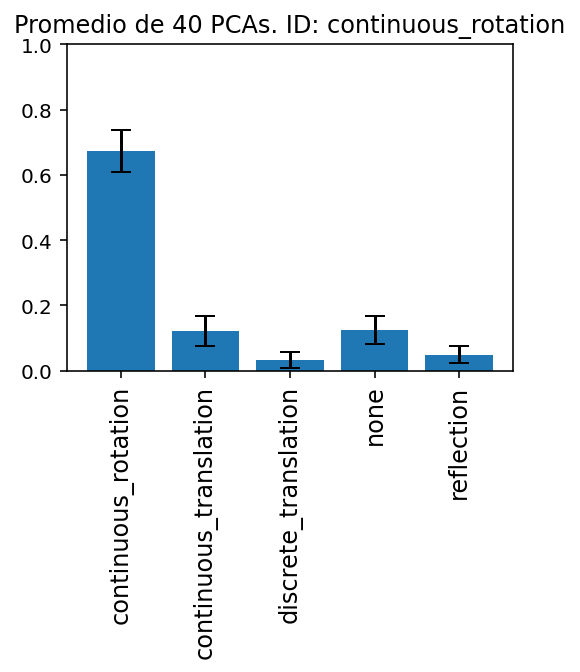

[8.24500260e-02 4.69114825e-01 2.13354077e-04 1.80062833e-01
 2.68158963e-01]


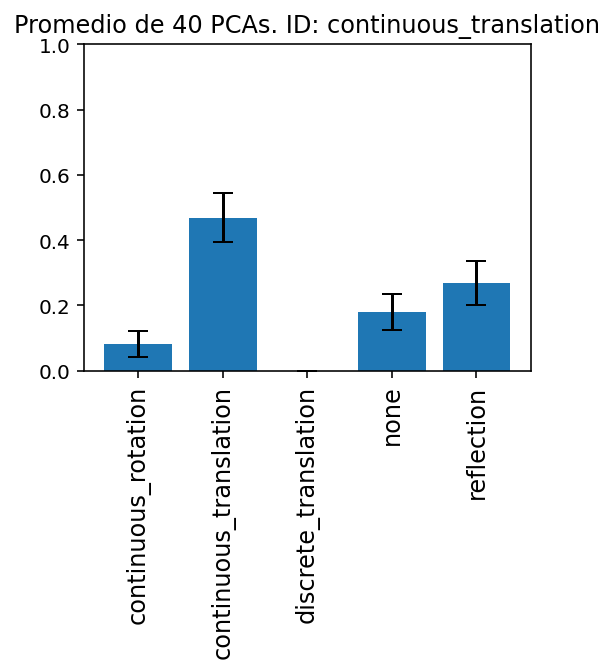

[0.02654987 0.12910045 0.71459916 0.10407558 0.02567494]


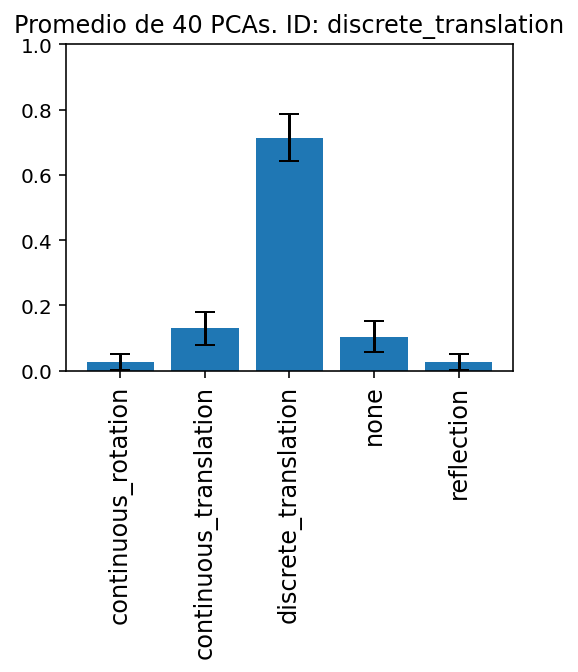

[0.01008634 0.12907433 0.00683766 0.59265884 0.26134283]


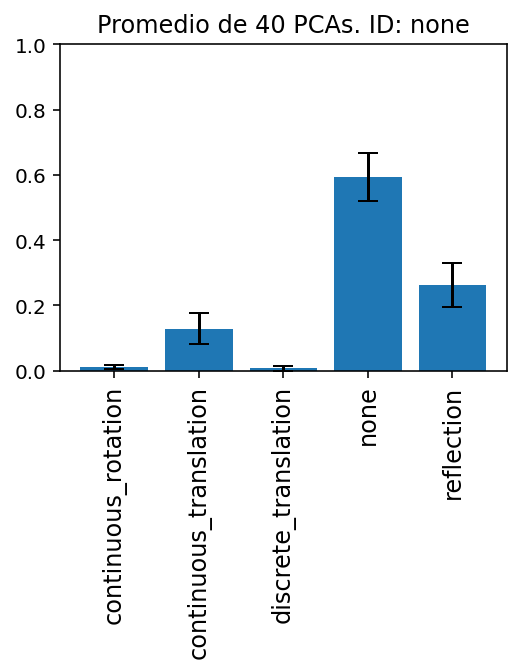

[0.12322425 0.10595327 0.0242857  0.28965975 0.45687703]


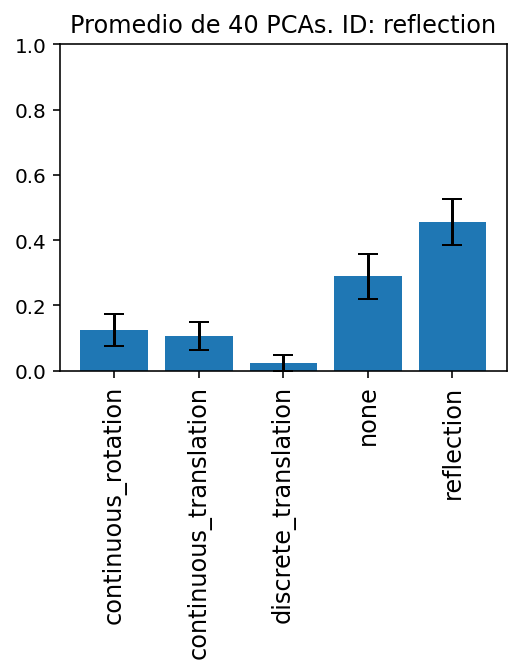

In [144]:
nom_carp = 'PCAs_detector_rfpk'

#import libraries
%config InlineBackend.figure_format = 'retina'
import seaborn as sns
from IPython.core.display import display, HTML, clear_output
display(HTML("<style>.container { width:100% !important; } div.cell.selected {border-left-width: 0px !important;}</style>"))

from time import time
import os
import glob
from fastai.vision.all import *
import numpy as np
from IPython.display import clear_output
import itertools as it
import more_itertools
#import torchvision.models
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default ="none"
import base64
from PIL import Image
from io import BytesIO
import torch
import gc
#import libraries

if not 'notebook_dir' in globals():
    notebook_dir = os.getcwd()
print('Notebook directory: ' + notebook_dir)
os.chdir(notebook_dir)  # If you changed the current working dir, this will take you back to the workbook dir.
top_dir = notebook_dir



modelo = 'G' 

if modelo == 'G':
    learn = load_learner('/home/gabriel/Desktop/models/model_90_accu_resnet18_one_cycle_10+5_no_mixup'+'.pkl', cpu=False)
     


        
#Reset Registro

registro = pd.DataFrame({
    'Col_Quit':[0], 'Run':[0],
    'continuous_rotation':[0], 'continuous_translation':[0], 'discrete_translation':[0], 'none':[0], 'reflection':[0]
})
registro = registro.drop(0)
#registro

sims = pd.DataFrame(columns = learn.dls.vocab)
errs = sims.copy()

num_img_cat = [] #guardo el numero de imagenes de cada categoria
i = 0
plote = False

from IPython.utils import io



for dires in np.sort(Path('/home/gabriel/Desktop/' + nom_carp).ls()):
    #path = Path('/home/gabriel/Desktop/PCA_INE_sexo/INE/'+quitadas)
    quitadas = str(dires).split('/')[-1]
    with io.capture_output() as captured:
        for ima in dires.ls():

            test_im_dir = ima

            im = PILImage.create(test_im_dir)

            # Orden: ['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']

            cate, num_cat, probs = learn.predict(im)


            '''
            if plote == True:
                plt.figure
                plt.figure(figsize=(4, 3))
                plt.title(ima)
                plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],probs)
                plt.xticks(rotation='vertical',fontsize = 12)
                plt.show()
            '''

            new_row = np.array([quitadas, i] + list(np.array(probs).astype(float))).reshape([1,-1])
            aden = pd.DataFrame(new_row,columns=registro.columns)

            registro = registro.append(aden, ignore_index=True)

            i+=1

    registro = registro.astype({
        'Col_Quit':str, 'Run':int,
        'continuous_rotation':float, 'continuous_translation':float, 'discrete_translation':float, 'none':float, 'reflection':float
    })  

    print('Numero Imagenes:',i)
    num_img_cat.append(i)



#registro.to_csv(r'/home/gabriel/Desktop/PCA_INE_salarios/registro_'+modelo+'.csv', index = False)
print(registro['Col_Quit'].unique())

#registro = pd.read_csv('/home/gabriel/Desktop/PCA_INE_sexo/registro.csv')

nombres_carps = registro['Col_Quit'].unique() #Nombres de las carpetas donde estan guyardadas las pcas de un tipo
num_carps = len(nombres_carps)
i = 0

for nom in nombres_carps:
    if i == 0:
        m_probs = np.array(registro.iloc[:num_img_cat[0],2:].mean())
        err_probs = np.array(registro.iloc[:num_img_cat[0],2:].std())
        nume = str(len(registro.iloc[:num_img_cat[0],2:]))
        print(learn.dls.vocab)
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)
    else:
        m_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].mean())
        err_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].std())
        nume = str(len(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:]))
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)

    if nom == '-ninguna-':
        tit = 'Promedio de '+nume+' PCAs sin quitar ninguna columna'
    else:
        tit = 'Promedio de '+nume+' PCAs. ID: '+ nom        

    
    plt.figure(figsize=(4, 3))
    plt.title(tit)
    #plt.title('Promedio de '+str(40)+' PCAs sin quitar ninguna columna')
    plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],
            m_probs,yerr = err_probs/np.sqrt(float(nume)), capsize = 5)
    plt.xticks(rotation='vertical',fontsize = 12)
    plt.ylim([0, 1])
    plt.show()
    
    i+=1

# Searching for symmetries directly

Generating Potentials for discrete_translation symmetry
Too little data to keep 10k points
---Selecting Best Features---
Best Features:  ['-0.9492229813221391y+-0.8789261130466031x', 'y', 'y**2', '-0.6560642586591929y*x', '0.4883624918871856y**2+0.7212673680780635x**2', '-0.5772320616983628y/x', '-0.5811099955965784r4**2+-0.654950918902466r1**2', '0.03717328547018384r3*y']
-0.9492229813221391y+-0.8789261130466031x y
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_-0.9492229813221391y+-0.8789261130466031x+y_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_-0.9492229813221391y+-0.8789261130466031x+y_/discrete_translation_11637660224__PCA.png



Found discrete_translation symmetry with features -0.9492229813221391y+-0.8789261130466031x and y, with prob. 1.0

1 PCA's made out of 14.

0.1 minutes elapsed for 1 images.
0.1 minutes average per image.
1.7 minutes estimated left for 13 images.



0.0 hours estimated left for 13 images.



-0.9492229813221391y+-0.8789261130466031x y**2
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_-0.9492229813221391y+-0.8789261130466031x+y**2_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_-0.9492229813221391y+-0.8789261130466031x+y**2_/discrete_translation_11637660229__PCA.png



Found discrete_translation symmetry with features -0.9492229813221391y+-0.8789261130466031x and y**2, with prob. 0.9979000091552734

2 PCA's made out of 14.

0.2 minutes elapsed for 2 images.
0.1 minutes average per image.
1.3 minutes estimated left for 12 images.



0.0 hours estimated left for 12 images.



y -0.6560642586591929y*x
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_y+-0.6560642586591929y*x_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_y+-0.6560642586591929y*x_/discrete_translation_11637660235__PCA.png



Found discrete_translation symmetry with features y and -0.6560642586591929y*x, with prob. 1.0

3 PCA's made out of 14.

0.3 minutes elapsed for 3 images.
0.1 minutes average per image.
1.1 minutes estimated left for 11 images.



0.0 hours estimated left for 11 images.



-0.9492229813221391y+-0.8789261130466031x 0.4883624918871856y**2+0.7212673680780635x**2
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_-0.9492229813221391y+-0.8789261130466031x+0.4883624918871856y**2+0.7212673680780635x**2_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_-0.9492229813221391y+-0.8789261130466031x+0.4883624918871856y**2+0.7212673680780635x**2_/discrete_translation_11637660240__PCA.png



Found discrete_translation symmetry with features -0.9492229813221391y+-0.8789261130466031x and 0.4883624918871856y**2+0.7212673680780635x**2, with prob. 1.0

4 PCA's made out of 14.

0.4 minutes elapsed for 4 images.
0.1 minutes average per image.
1.0 minutes estimated left for 10 images.



0.0 hours estimated left for 10 images.



y 0.4883624918871856y**2+0.7212673680780635x**2
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_y+0.4883624918871856y**2+0.7212673680780635x**2_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_y+0.4883624918871856y**2+0.7212673680780635x**2_/discrete_translation_11637660245__PCA.png



Found discrete_translation symmetry with features y and 0.4883624918871856y**2+0.7212673680780635x**2, with prob. 1.0

5 PCA's made out of 14.

0.5 minutes elapsed for 5 images.
0.1 minutes average per image.
0.9 minutes estimated left for 9 images.



0.0 hours estimated left for 9 images.



-0.9492229813221391y+-0.8789261130466031x -0.6560642586591929y*x
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_-0.9492229813221391y+-0.8789261130466031x+-0.6560642586591929y*x_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_-0.9492229813221391y+-0.8789261130466031x+-0.6560642586591929y*x_/discrete_translation_11637660251__PCA.png



Found discrete_translation symmetry with features -0.9492229813221391y+-0.8789261130466031x and -0.6560642586591929y*x, with prob. 1.0

6 PCA's made out of 14.

0.6 minutes elapsed for 6 images.
0.1 minutes average per image.
0.8 minutes estimated left for 8 images.



0.0 hours estimated left for 8 images.



y**2 -0.6560642586591929y*x
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_y**2+-0.6560642586591929y*x_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_y**2+-0.6560642586591929y*x_/discrete_translation_11637660256__PCA.png



Found discrete_translation symmetry with features y**2 and -0.6560642586591929y*x, with prob. 1.0

7 PCA's made out of 14.

0.7 minutes elapsed for 7 images.
0.1 minutes average per image.
0.7 minutes estimated left for 7 images.



0.0 hours estimated left for 7 images.



y**2 0.4883624918871856y**2+0.7212673680780635x**2
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_y**2+0.4883624918871856y**2+0.7212673680780635x**2_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_y**2+0.4883624918871856y**2+0.7212673680780635x**2_/discrete_translation_11637660261__PCA.png



Found none symmetry with features y**2 and 0.4883624918871856y**2+0.7212673680780635x**2, with prob. 0.9873999953269958

8 PCA's made out of 14.

0.7 minutes elapsed for 8 images.
0.1 minutes average per image.
0.6 minutes estimated left for 6 images.



0.0 hours estimated left for 6 images.



y y**2
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_y+y**2_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_y+y**2_/discrete_translation_11637660266__PCA.png



Found continuous_translation symmetry with features y and y**2, with prob. 1.0

9 PCA's made out of 14.

0.8 minutes elapsed for 9 images.
0.1 minutes average per image.
0.5 minutes estimated left for 5 images.



0.0 hours estimated left for 5 images.



y -0.5772320616983628y/x
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_y+-0.5772320616983628y/x_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_y+-0.5772320616983628y/x_/discrete_translation_11637660271__PCA.png



Found reflection symmetry with features y and -0.5772320616983628y/x, with prob. 0.9714000225067139

10 PCA's made out of 14.

0.9 minutes elapsed for 10 images.
0.1 minutes average per image.
0.4 minutes estimated left for 4 images.



0.0 hours estimated left for 4 images.



-0.9492229813221391y+-0.8789261130466031x -0.5811099955965784r4**2+-0.654950918902466r1**2
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_-0.9492229813221391y+-0.8789261130466031x+-0.5811099955965784r4**2+-0.654950918902466r1**2_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_-0.9492229813221391y+-0.8789261130466031x+-0.5811099955965784r4**2+-0.654950918902466r1**2_/discrete_translation_11637660277__PCA.png



Found reflection symmetry with features -0.9492229813221391y+-0.8789261130466031x and -0.5811099955965784r4**2+-0.654950918902466r1**2, with prob. 1.0

11 PCA's made out of 14.

1.0 minutes elapsed for 11 images.
0.1 minutes average per image.
0.3 minutes estimated left for 3 images.



0.0 hours estimated left for 3 images.



-0.9492229813221391y+-0.8789261130466031x -0.5772320616983628y/x
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_-0.9492229813221391y+-0.8789261130466031x+-0.5772320616983628y/x_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_-0.9492229813221391y+-0.8789261130466031x+-0.5772320616983628y/x_/discrete_translation_11637660282__PCA.png



Found reflection symmetry with features -0.9492229813221391y+-0.8789261130466031x and -0.5772320616983628y/x, with prob. 0.9987999796867371

12 PCA's made out of 14.

1.1 minutes elapsed for 12 images.
0.1 minutes average per image.
0.2 minutes estimated left for 2 images.



0.0 hours estimated left for 2 images.



-0.9492229813221391y+-0.8789261130466031x 0.03717328547018384r3*y
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_-0.9492229813221391y+-0.8789261130466031x+0.03717328547018384r3*y_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_-0.9492229813221391y+-0.8789261130466031x+0.03717328547018384r3*y_/discrete_translation_11637660287__PCA.png



Found reflection symmetry with features -0.9492229813221391y+-0.8789261130466031x and 0.03717328547018384r3*y, with prob. 1.0

13 PCA's made out of 14.

1.2 minutes elapsed for 13 images.
0.1 minutes average per image.
0.1 minutes estimated left for 1 images.



0.0 hours estimated left for 1 images.



y -0.5811099955965784r4**2+-0.654950918902466r1**2
8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_y+-0.5811099955965784r4**2+-0.654950918902466r1**2_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/discrete_translation/_y+-0.5811099955965784r4**2+-0.654950918902466r1**2_/discrete_translation_11637660293__PCA.png



Found reflection symmetry with features y and -0.5811099955965784r4**2+-0.654950918902466r1**2, with prob. 1.0

14 PCA's made out of 14.

1.3 minutes elapsed for 14 images.
0.1 minutes average per image.
0.0 minutes estimated left for 0 images.



0.0 hours estimated left for 0 images.





<BarContainer object of 5 artists>

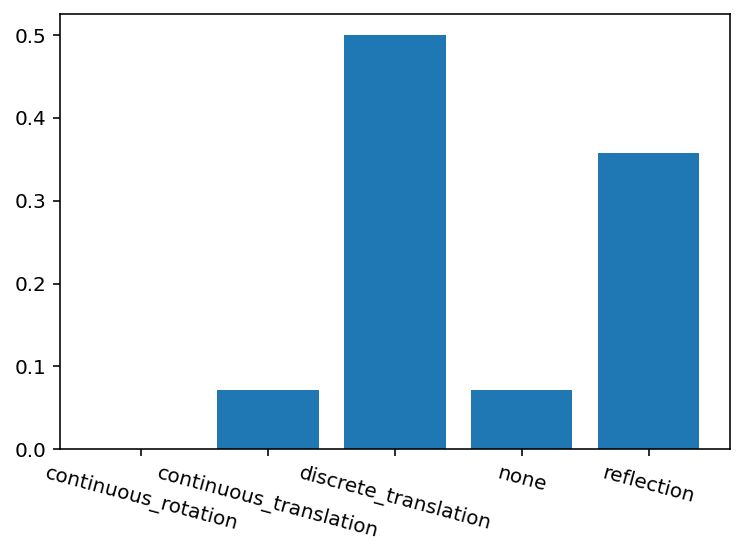

In [9]:
rep_todo = 1
n_fea = 8
target= 'bin'
lim_sym = 0.85

muchos = False # Si es false, para mucho potenciales, mete cada combinación de variables en una carpeta separada, para que sea fácil ver si hay simetría ahí
               # Si es true, van todos a la misma carpeta

i=0    
    
sym_feat_1 = []
sym_feat_2 = []
sym_feat_tags = []
sym_feat_probs = []
sym_feat_rmse = []
syms_tot = ['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']
registro = pd.DataFrame(columns = syms_tot)
# Tiempo en el que empezamos a procesar
from time import time
start_time = time()

for rtd in range(rep_todo):
    from fastai.vision.all import *
    from time import time
    from IPython.utils import io

    model_fi = 'RF' # RF or FW (random forests or featurewiz)
    #Tipos de simetría que quiero generar
    #syms = ['continuous_rotation', 'discrete_translation', 'reflection', 'none', 'continuous_translation']
    symmetries = ['discrete_translation']

    num_pot_cada = 1 # Numero de potenciales de cada tipo

    int_1 = False #Interactions in Feature Importance 1 (RF)
    int_2 = False
    select_10k = True #Keep only 10000 elements of the original potential DF

    # ------------------- Folder PCA ------------------- #

    folder = 'PCAs_detector_sym_new'

    dd = top_dir + '/' + folder
    if not os.path.isdir(dd):
        print('Creating directory:\n',dd)
        os.mkdir(dd)

    dir = os.path.join(top_dir,folder)

    #------------------------------ Generar Potenciales ---------------------------#


    potenciales = []
    potenciales_tags = []

    for symmetry in symmetries:
        print('Generating Potentials for',symmetry,'symmetry')
        funs_temp = [mock_data(sym = symmetry, verbose = False) for i in range(num_pot_cada)]
        funs_tags_temp = [symmetry for i in range(num_pot_cada)]
        potenciales = potenciales + funs_temp 
        potenciales_tags = potenciales_tags + funs_tags_temp

    # Vamos a ordenar los potenciales de forma aleatoria, aunque en realidad
    # este paso no es relevante, puesto que para cada potencial entrenaremos una 
    # red. Si fuéramos a entrenar una red con todos los potenciales, entonces sí
    # que sería relevante.

    num_pot = len(potenciales) # Numero de Potenciales que quiero (por si no quiero todos)

    c = list(zip(potenciales,potenciales_tags))

    # Barajamos los potenciales, para pasarseslos en orden aleatorio
    #random.shuffle(c)

    potenciales_aux, tags = zip(*c)

    potenciales = [potenciales_aux[i] for i in range(num_pot)]




    class SaveModelCallback(TrackerCallback):
        "A `TrackerCallback` that saves the model's best during training and loads it at the end."
        _only_train_loop = True
        def __init__(self, monitor='valid_loss', comp=None, min_delta=0., fname='model', every_epoch=False, at_end=False,
                     with_opt=False, reset_on_fit=True):
            super().__init__(monitor=monitor, comp=comp, min_delta=min_delta, reset_on_fit=reset_on_fit)
            assert not (every_epoch and at_end), "every_epoch and at_end cannot both be set to True"
            # keep track of file path for loggers
            self.last_saved_path = None
            store_attr('fname,every_epoch,at_end,with_opt')

        def _save(self, name): self.last_saved_path = self.learn.save(name, with_opt=self.with_opt)

        def after_epoch(self):
            "Compare the value monitored to its best score and save if best."
            if self.every_epoch: self._save(f'{self.fname}_{self.epoch}')
            else: #every improvement
                super().after_epoch()
                if self.new_best:
                    #print(f'Better model found at epoch {self.epoch} with {self.monitor} value: {self.best}.')
                    self._save(f'{self.fname}')

        def after_fit(self, **kwargs):
            "Load the best model."
            if self.at_end: self._save(f'{self.fname}')
            elif not self.every_epoch: self.learn.load(f'{self.fname}', with_opt=self.with_opt)

    # ---------------- Definiciones previas e hiperparámetros ----------------- #

    #Guardo los modelos para analizarlos luego
    models = [] 
    to_s = []

    #Guardaremos los resultados de la PCA en un array 
    PCA_s = []
    PCA_s_tag = []

    # Hyperparameters: De momento los pondré aquí, pero luego serán un input entero
    bs_choices = [50000]       # Batch Size
    shape='pipe'               # Shape of the neural network
    layers_choices = [5]       # Number of layers of the net. Default:10 or 5 results with 5
    neurons_choices = [100]    # Number of neurons per layer. Default:200 results with 200
    epoch_choices = [150]      # Number of training epochs. Default:200 results with 60
    lr_choices = [0.01]       # Max learning rate 
    valid_pct=0.2              # Part of the data that goes into validation (0.2 = 20%)
    monitor= 'valid_loss'        # Te model with the least 'monitor' will be saved



    # ---------------------- Entrenar Red Y PCA -----------------------------------#

    j = 1 # Usaremos esto para saber cuantos potenciales hemos procesado, y como indice en general

    for df in potenciales:
        
        #------------------------------ Feature Importance  ---------------------------#

        if select_10k == True:
            if len(df.bin) <= 100*100:
                print('Too little data to keep 10k points')
            else:
                print('Keeping 10k points of the original DF')
                remove_n = len(df.bin) - 10000
                drop_indices = np.random.choice(df.index, remove_n, replace=False)
                df_temp = df.drop(drop_indices)
                df = df_temp.copy()


        print('---Selecting Best Features---')
        best_pairs = n_best_rf_phi_k(df, target = 'bin', n = n_fea, nf = 30, lim_corr = 0.85)
        
        best_n = [best_pairs['f1'][0]] + list(best_pairs['f2'].unique())
        
        print('Best Features: ',best_n)

        #small_df = df[best_n]
        #small_df[target] = df[target]

        
        cols = best_n
        a = cols

        verbose = 1

        

        df_org = df.copy()
        
        
        medi = best_pairs.score.median()
        num_2 = len(best_pairs.score.iloc[np.where(best_pairs.score >= medi)])
                
        for f1,f2,lll in zip(best_pairs.f1,best_pairs.f2,range(len(best_pairs.f1))):
            if best_pairs.score[lll] >= medi:
                
                i+=1
                
                print(f1,f2)
                feas = [f1,f2]
                
                # Debemos marcar cada potencial para tener claro a qué tipo de simetria corresponde cada PCA
                PCA_s_tag.append(tags[j-1])

                df2 = df[feas + [target]].copy() 
                #df2 = df2[feas + [target]].copy()

                splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

                to = TabularPandas(df2,
                                procs=[Categorify,FillMissing, Normalize],
                                cont_names = feas,
                                y_names = target,
                                splits=splits)

                train_size = len(splits[0])
                valid_size = len(splits[1])

                # ----------------- Hyperparameters ------------------- #

                # Batch Size (a large one)
                bs=min(random.choice(bs_choices),train_size)  
                print('{} batch size for training.\n'.format(bs))

                # Neurons per layer
                neurons_per_layer = random.choice(neurons_choices)

                # Number of layers
                n_layers = random.choice(layers_choices)

                #Shape of the net: Pipe or funnel
                if shape == 'pipe':
                    layers=[neurons_per_layer for i in range(n_layers)]

                if shape == 'funnel':
                    n_eff = n_layers
                    layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

                print('Training FCNN with layers: ',layers)

                #Number of epochs
                n_epoch=random.choice(epoch_choices)
                print('Training for {} epochs.'.format(n_epoch))

                # Maximum Learning Rate: (a good value can be found using learn.lr_find())
                lr_max=float(random.choice(lr_choices))
                print('Using lr_max = ',format(lr_max))

                # ----------------------------------------------------- #

                # --------------- Training the FCNN --------------------#

                # Load the data into a DataLoader
                dls = to.dataloaders(bs=bs)

                # Define a Tabular Learner
                learn = tabular_learner(dls, layers=layers
                                    #,config=config
                                    #,metrics=[mse],
                                    #y_range = [min(df.bin),max(df.bin)],
                                    #,cbs=ShowGraphCallback()
                                    #,train_bn=False)
                                    )

                # Train the net 
                with learn.no_logging():
                    learn.fit_one_cycle(n_epoch=n_epoch
                                        ,lr_max=lr_max
                                        ,cbs=[SaveModelCallback(monitor=monitor)]
                                        )
                    
                    preds, targs = learn.get_preds()

                ff = (preds-targs)**2/len(targs)
                ff = sum(ff)
                RMSE = np.sqrt(ff)
                #print('RMSE:',float(RMSE))
                nrmsei = float(RMSE)
                
                # Guardamos modelos y tabular objects para el posterior analisis
                models.append(learn)
                to_s.append(to)

                # ------------------------------------------------------#


                # ------------------------- PCA ------------------------#

                test_df = df2.copy()
                dl = learn.dls.test_dl(test_df,bs=int(test_df.shape[0])) 

                # Tenemos que hacer un Hook, una especie de gancho que enganchamos en la última capa interna,
                # para guardar, de cada modelo, los valores de los parámetro de dicha capa. 
                with Hooks(learn.model.layers, lambda m,i,o: o) as h:
                    preds = learn.get_preds(dl=dl,with_input=True,with_decoded=True,with_loss=True)

                targets=preds[2].numpy().flatten()

                # Cogemos la información de la penúltima capa
                # OJO: Si añadimos y_range, se añade automaticamente una sigmoid
                # al final, por lo que tendríamos que coger la capa -3 en vez de la -2
                act = h.stored[-2] 
                multi_dim=Tensor.cpu(act).numpy()
                standardized=StandardScaler().fit_transform(multi_dim)

                viz = PCA(2).fit_transform(np.nan_to_num(standardized))
                #plt.figure()
                #plt.scatter(viz[:, 0], viz[:, 1],c=targets[:multi_dim.shape[0]],alpha=.1, marker = 'o')

                PCA_s.append(viz)

                # ------------------------------------------------------ #

                # ------------------ Saving the PCA's ------------------ #

                # ---- Dar formato a PCA para guardar como imagen con color

                viz = pd.DataFrame(viz) #Transformamos la PCA en un dataframe
                viz.columns = ['x','y'] #Nombres de las columnas

                # Insertamos una columna con los colores de los puntos. El valor del potencial
                # objetivo (targets) es el color, y hay un color por cada punto 
                viz.insert(2,'class',targets[:multi_dim.shape[0]]) 

                # ---- Personalizar mapa de color 

                n_classes=1000

                colors = 'rainbow'

                if colors == 'rainbow':
                    my_cmap = plt.cm.get_cmap('rainbow', n_classes)
                    classes_in_rgb = my_cmap(range(n_classes))
                if colors == 'purple':
                    my_cmap = plt.cm.get_cmap('rainbow', n_classes)
                    classes_in_rgb = np.vstack((np.array([0,0,0,0]),my_cmap([0 for i in range(n_classes)])))

                # ---- Hacer que la intensidad del pixel represente la cantidad de puntos 
                #      acumuldos en un pixel

                n_pixels = 224

                binning_3d=np.histogramdd([viz['x'],viz['y'],viz['class']],range=(None,None,(0,1)), bins=(n_pixels,n_pixels,n_classes))

                #if we want the pixel intensity to reprensent the number of points at that location
                array = np.dot(binning_3d[0],classes_in_rgb)
                array = array/np.amax(array)

                # ---- Guardar la PCA

                #Directorio donde guardaremos las imagenes
                nami = '_'+str(feas[0])+'+'+str(feas[1])+'_'
                if muchos == False: 
                    dir_sym = os.path.join(dir,tags[j-1],nami)
                    img_file = str(tags[j-1])+'_'+str(j)+str(round(time()))+'__PCA.png' 
                else:
                    dir_sym = os.path.join(dir,tags[j-1])
                    img_file = str(tags[j-1])+'_'+str(j)+str(round(time()))+nami+'__PCA.png' 
                    
                if not os.path.isdir(dir_sym):
                    print('Creating directory:\n',dir_sym)
                    os.makedirs(dir_sym)


                # Nombre de la imagen. Pongo el tiempo para que todas se llamen distinto cada vez.
                output_dir = os.path.join(dir_sym,img_file) # Directorio donde guardamos la imagen
                plt.imsave(output_dir,array) # Guardar
                print('\nPCA saved to:\n{}\n'.format(dir_sym+'/'+img_file))
                
                
                # ------------------------ Symmetry Analyzer --------------------- #
                drr = pca_sym_finder(output_dir)
                brr = list(drr.iloc[np.where(drr.value > lim_sym)].symmetry)
                if len(brr) > 0:
                    print('Found {} symmetry with features {} and {}, with prob. {}'.format(brr[0],f1,f2,float(np.round(drr.iloc[np.where(drr.value > lim_sym)].value,4))))                
                    sym_feat_1.append(f1)
                    sym_feat_2.append(f2)
                    sym_feat_tags.append(brr[0])
                    sym_feat_probs.append(float(np.round(drr.iloc[np.where(drr.value > lim_sym)].value,4)))
                    sym_feat_rmse.append(nrmsei)
                
                
                

                # ------------------------ Time -------------------------#

                minutes_until_now = (time() - start_time)/60
                images_done = i
                minutes_per_image = minutes_until_now/(images_done)
                hours_left = minutes_per_image * (num_pot*num_2*rep_todo-images_done)/60
                print("\n{} PCA's made out of {}.\n".format(images_done,num_pot*num_2*rep_todo))
                print("{:.1f} minutes elapsed for {} images.".format(minutes_until_now,images_done))
                print("{:.1f} minutes average per image.".format(minutes_until_now/images_done))
                print("{:.1f} minutes estimated left for {} images.\n\n\n".format(hours_left*60,num_pot*num_2*rep_todo-images_done))
                print("{:.1f} hours estimated left for {} images.\n\n\n".format(hours_left,num_pot*num_2*rep_todo-images_done))
                
                
                
                
        j+=1


              # ------------------------------------------------------#'''

    results = pd.DataFrame({'symmetry':sym_feat_tags, 'feature_1':sym_feat_1, 'feature_2':sym_feat_2, 'probability':sym_feat_probs, 'RMSE':sym_feat_rmse})
    
    vc = results.symmetry.value_counts()
    
    
    
    for sym_sum in syms_tot:
        if not hasattr(vc,sym_sum):
            vc[sym_sum] = 0
        
    
    nr = pd.DataFrame({'continuous_rotation':vc['continuous_rotation'], 
                       'continuous_translation':vc['continuous_translation'], 
                       'discrete_translation':vc['discrete_translation'], 
                       'none':vc['none'], 
                       'reflection':vc['reflection']}, index = [0])

    registro = registro.append(nr, ignore_index=True)


plt.xticks(rotation = -15)
plt.bar(registro.columns,registro.sum()/registro.sum().sum())


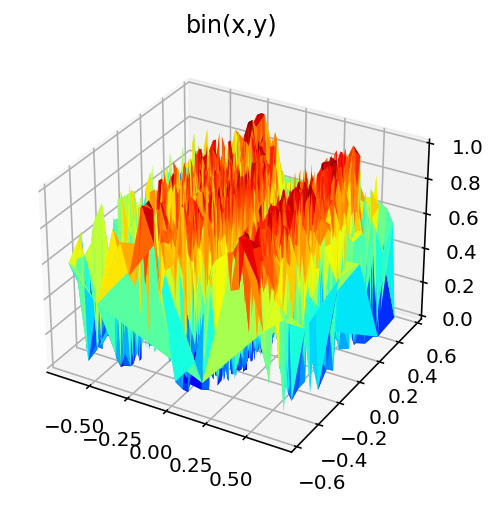

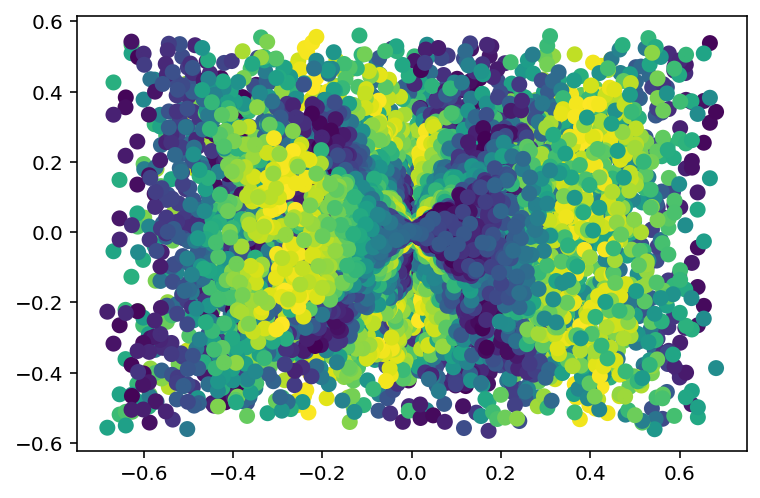

In [326]:
f1 = '-0.68176886036346x*y'
f2 = '-0.5678895908992319y*r1'

ax2 = plt.axes(projection='3d')
ax2.plot_trisurf(df[f1], df[f2], df.bin, linewidth=0.2, cmap = 'jet')
plt.title('bin(x,y)')
plt.show()
plt.figure()
plt.scatter(df[f1],df[f2],c = df.bin,marker = '.', lw = 5)

In [12]:
results

,symmetry,feature_1,feature_2,probability,RMSE
0,discrete_translation,-0.9492229813221391y+-0.8789261130466031x,y,1.0000,0.010912
1,discrete_translation,-0.9492229813221391y+-0.8789261130466031x,y**2,0.9979,0.138620
2,discrete_translation,y,-0.6560642586591929y*x,1.0000,0.048751
3,discrete_translation,-0.9492229813221391y+-0.8789261130466031x,0.4883624918871856y**2+0.7212673680780635x**2,1.0000,0.199482
4,discrete_translation,y,0.4883624918871856y**2+0.7212673680780635x**2,1.0000,0.204072
5,discrete_translation,-0.9492229813221391y+-0.8789261130466031x,-0.6560642586591929y*x,1.0000,0.210995
6,discrete_translation,y**2,-0.6560642586591929y*x,1.0000,0.114616
7,none,y**2,0.4883624918871856y**2+0.7212673680780635x**2,0.9874,0.211101
8,continuous_translation,y,y**2,1.0000,0.285456
9,reflection,y,-0.5772320616983628y/x,0.9714,0.075528


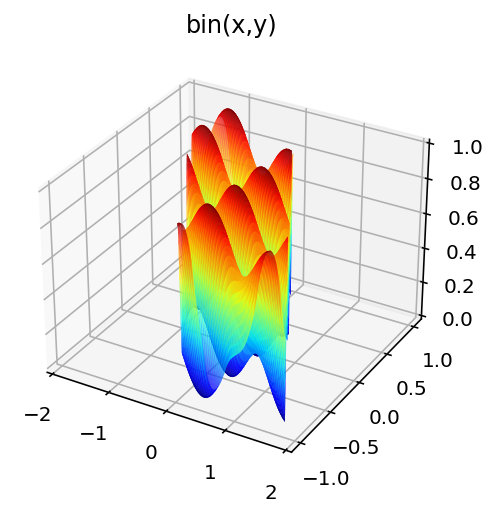

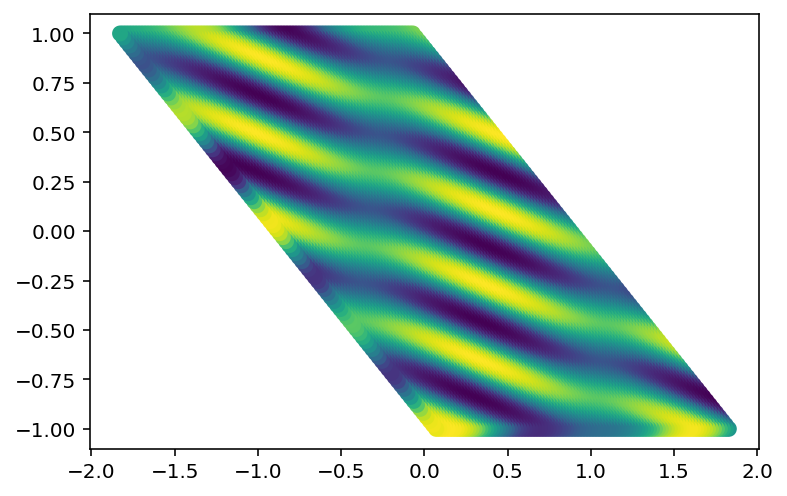

In [13]:
f1 = '-0.9492229813221391y+-0.8789261130466031x'
f2 = 'y'

ax2 = plt.axes(projection='3d')
ax2.plot_trisurf(df[f1], df[f2], df.bin, linewidth=0.2, cmap = 'jet')
plt.title('bin(x,y)')
plt.show()
plt.figure()
plt.scatter(df[f1],df[f2],c = df.bin,marker = '.', lw = 5)

Notebook directory: /home/gabriel/Desktop
Numero Imagenes: 1
Numero Imagenes: 2
Numero Imagenes: 3
Numero Imagenes: 4
Numero Imagenes: 5
Numero Imagenes: 6
Numero Imagenes: 7
Numero Imagenes: 8
Numero Imagenes: 9
Numero Imagenes: 10
Numero Imagenes: 11
Numero Imagenes: 12
Numero Imagenes: 13
Numero Imagenes: 14
Numero Imagenes: 15
Numero Imagenes: 16
Numero Imagenes: 17
Numero Imagenes: 18
Numero Imagenes: 19
Numero Imagenes: 20
Numero Imagenes: 21
Numero Imagenes: 22
Numero Imagenes: 23
['_-0.9370798396290303y+-0.8304583368711747r0+0.3814596154633896y+0.49358829257388415r2_'
 '_-0.9370798396290303y+-0.8304583368711747r0+y**2_'
 '_-0.9370798396290303y+-0.8304583368711747r0+y^0.44883811360242576*r4^0.49234329367644825_'
 '_-0.9370798396290303y+-0.8304583368711747r0+y^0.5345243519097778*x^-0.2232322666567852_'
 '_-0.9370798396290303y+-0.8304583368711747r0+y^0.8347372980486967*r2^-0.18398432989981273_'
 '_0.3814596154633896y+0.49358829257388415r2+y**2_'
 '_0.3814596154633896y+0.4935882925

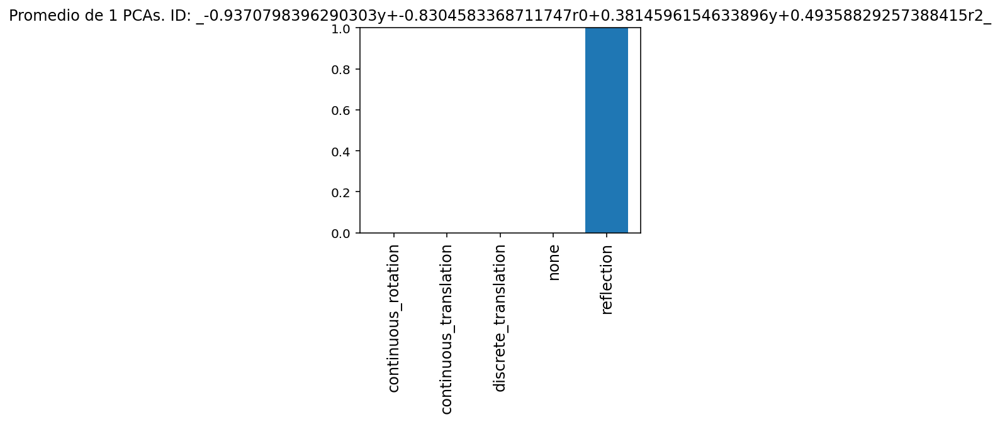

[7.04801232e-06 1.68420047e-06 2.41034759e-05 2.13407839e-06
 9.99965072e-01]


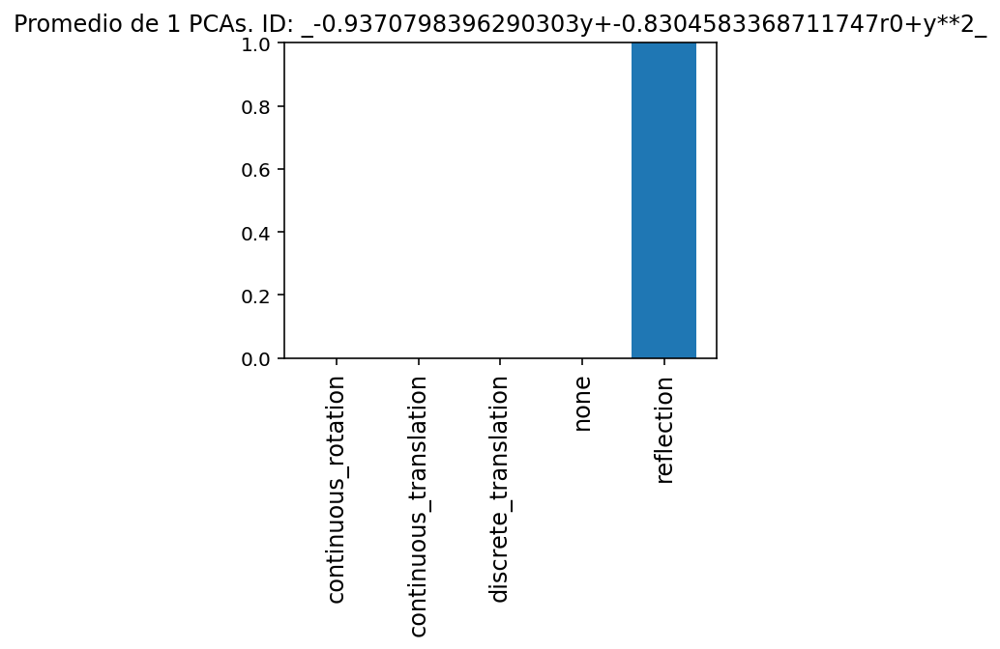

[8.60770251e-06 3.91119905e-02 3.59783080e-05 1.00528865e-04
 9.60742831e-01]


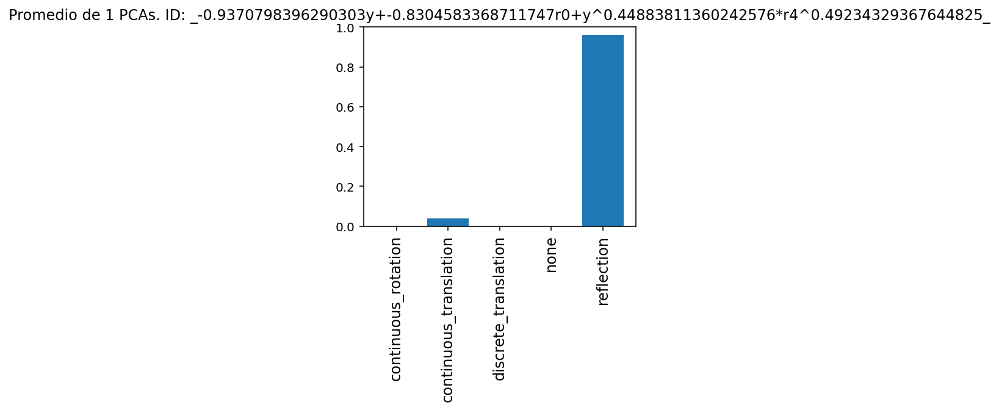

[1.87746155e-05 2.12717354e-01 2.38091470e-05 7.70610571e-01
 1.66294798e-02]


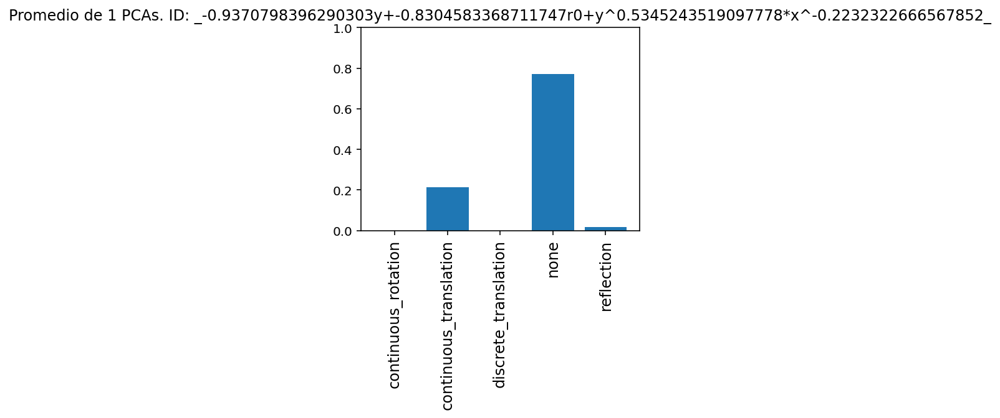

[4.85574617e-07 9.94339406e-01 3.87030695e-06 5.65602770e-03
 2.72691182e-07]


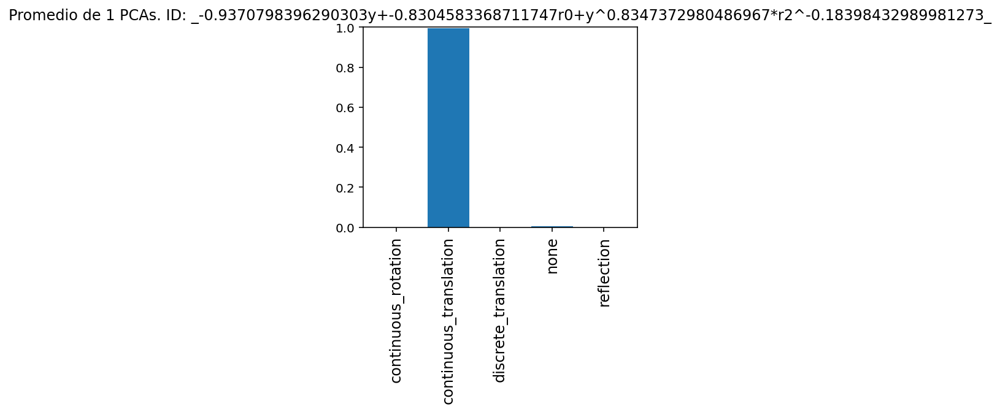

[1.04252301e-07 1.08911344e-07 2.21947445e-07 1.06746506e-06
 9.99998450e-01]


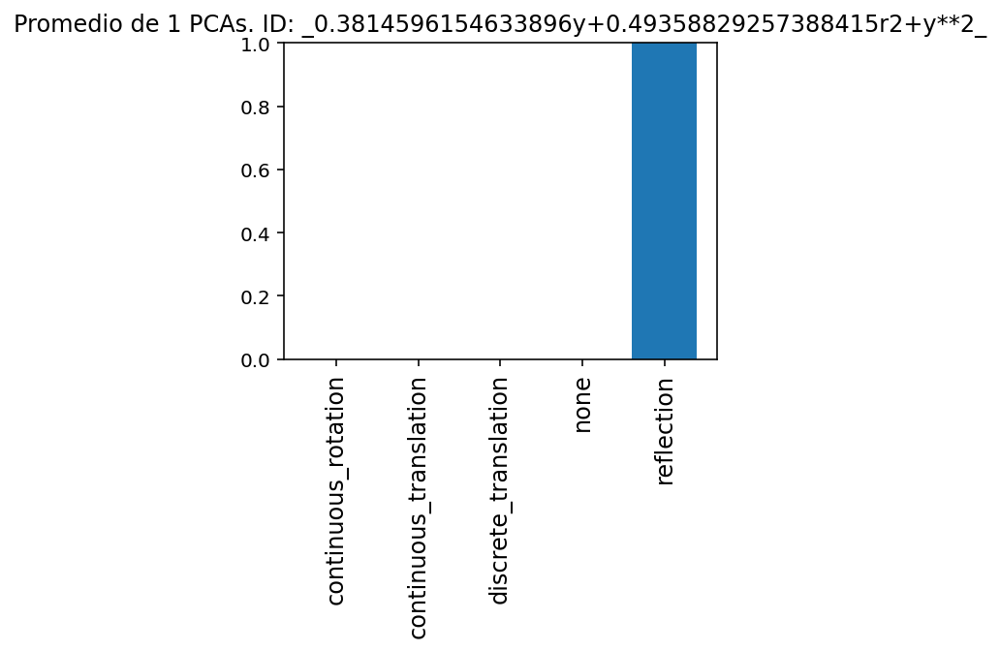

[1.37009227e-03 5.05194366e-01 6.07529000e-05 4.92222965e-01
 1.15187757e-03]


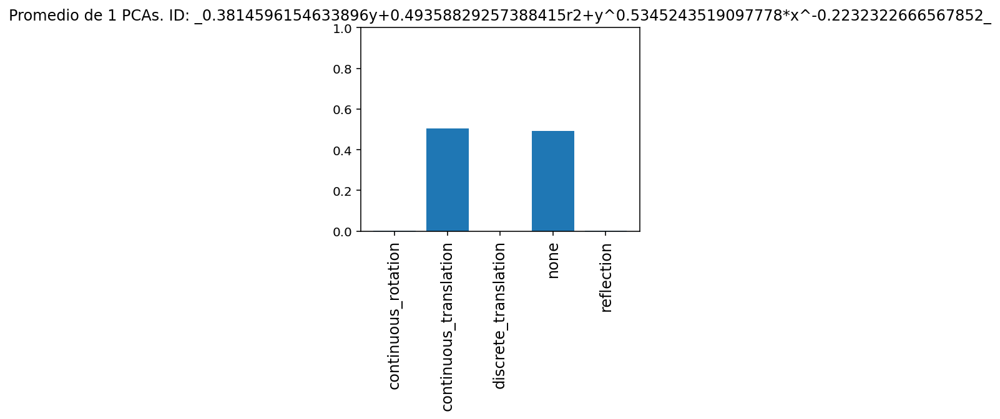

[4.87666819e-13 9.56153424e-14 5.19264276e-09 1.42371236e-11
 1.00000000e+00]


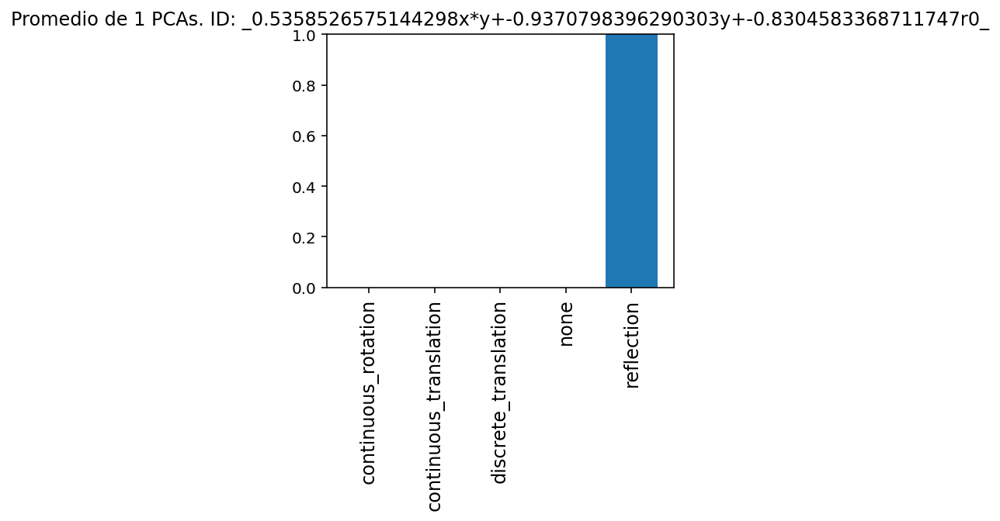

[1.95485356e-07 4.05289029e-06 1.06481843e-04 2.40740692e-03
 9.97481883e-01]


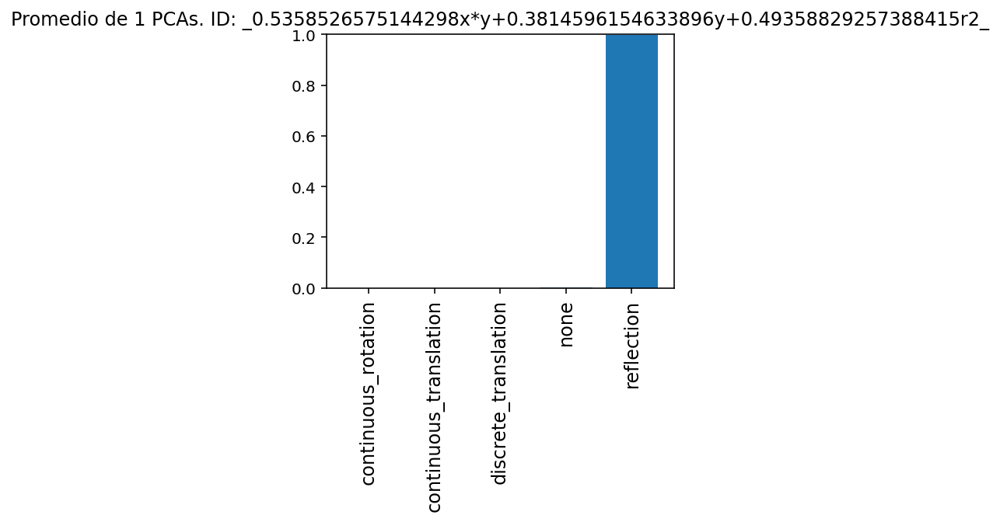

[2.67603468e-08 9.02479758e-10 1.18576325e-04 8.31282065e-08
 9.99881268e-01]


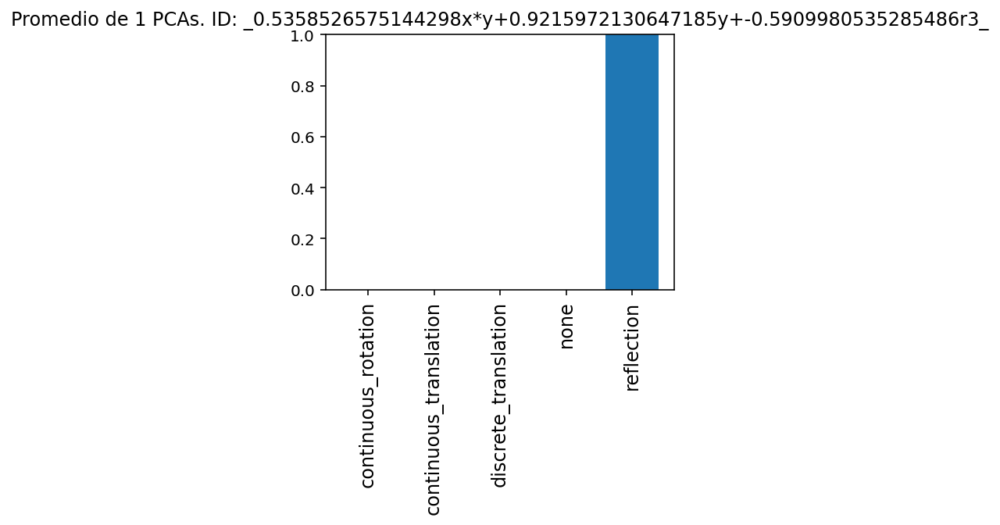

[1.11240442e-04 9.08702910e-01 2.96078739e-03 8.70421156e-02
 1.18307211e-03]


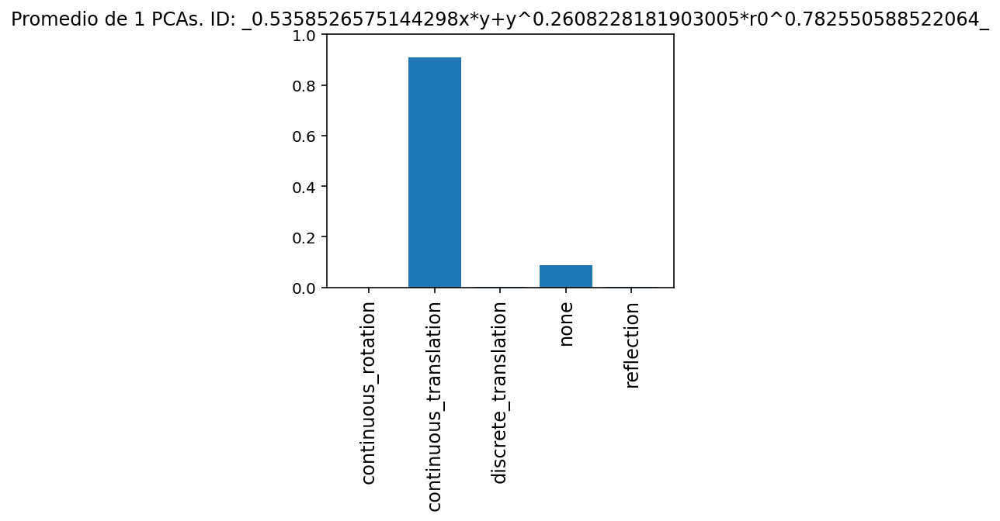

[4.34539397e-05 8.97281840e-02 1.19075784e-03 4.52106178e-04
 9.08585489e-01]


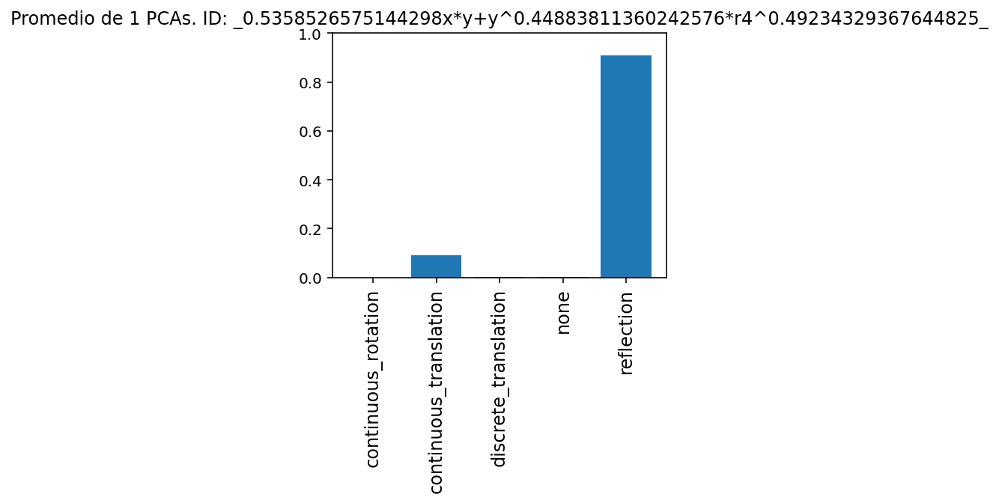

[1.43931012e-09 2.62384114e-09 5.30057014e-06 3.82830331e-06
 9.99990821e-01]


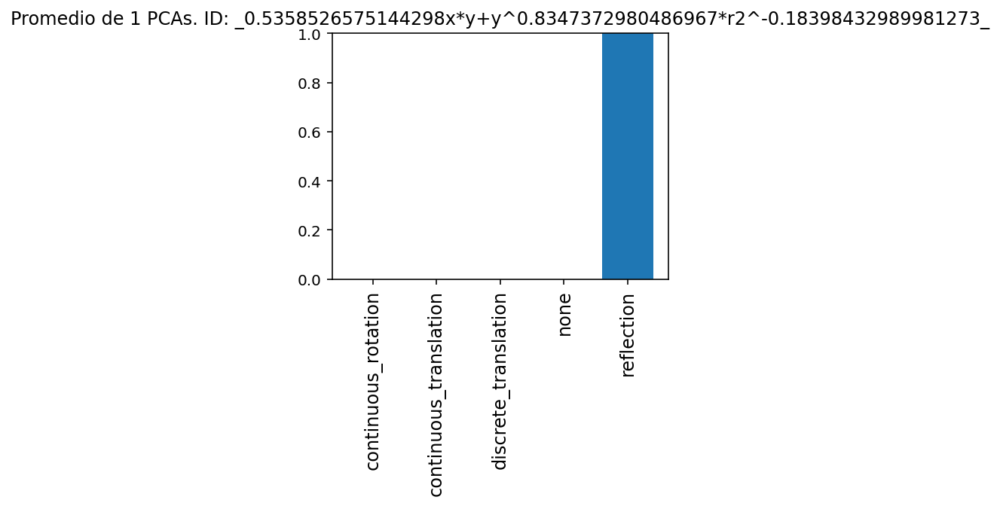

[1.51439483e-08 3.80673626e-09 6.91127600e-09 4.94652319e-10
 1.00000000e+00]


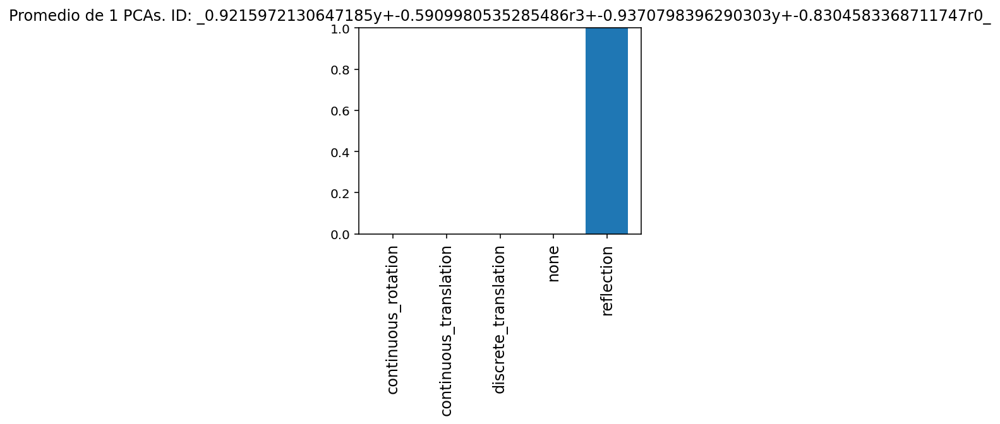

[1.70695439e-05 3.25772888e-03 1.31515786e-04 1.32271368e-03
 9.95271027e-01]


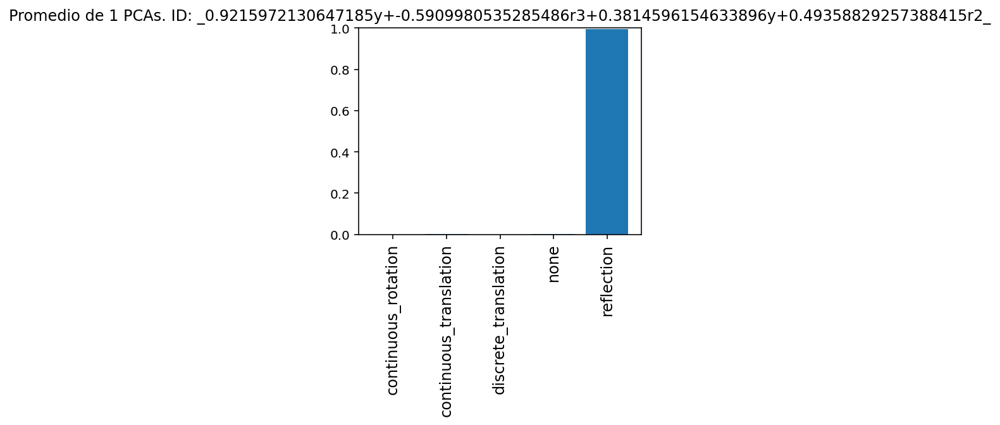

[5.61041134e-07 9.99994397e-01 1.06288397e-07 4.87089937e-06
 2.73325984e-08]


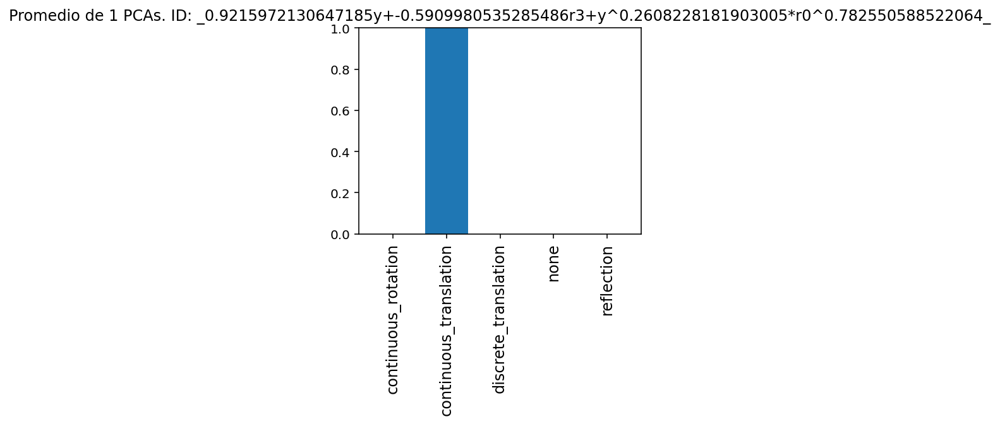

[5.32791205e-07 9.96109784e-01 4.89192814e-07 3.88332829e-03
 5.88500279e-06]


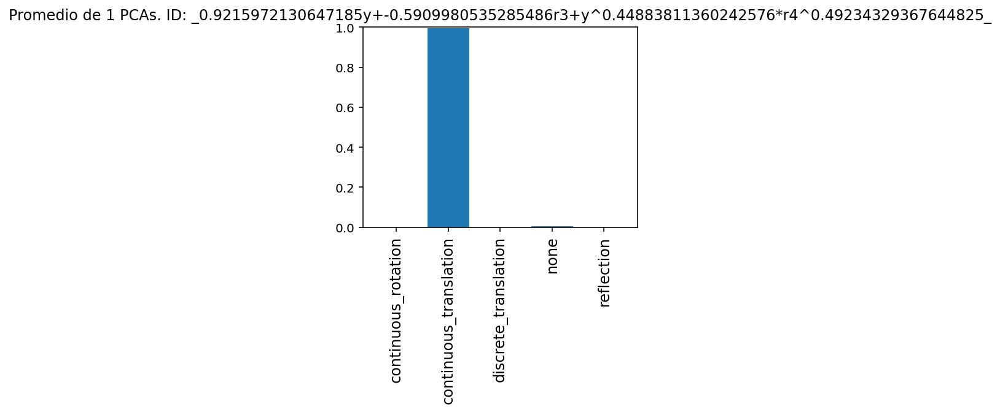

[3.13423554e-09 9.91893376e-06 1.75229253e-08 9.99983430e-01
 6.68996381e-06]


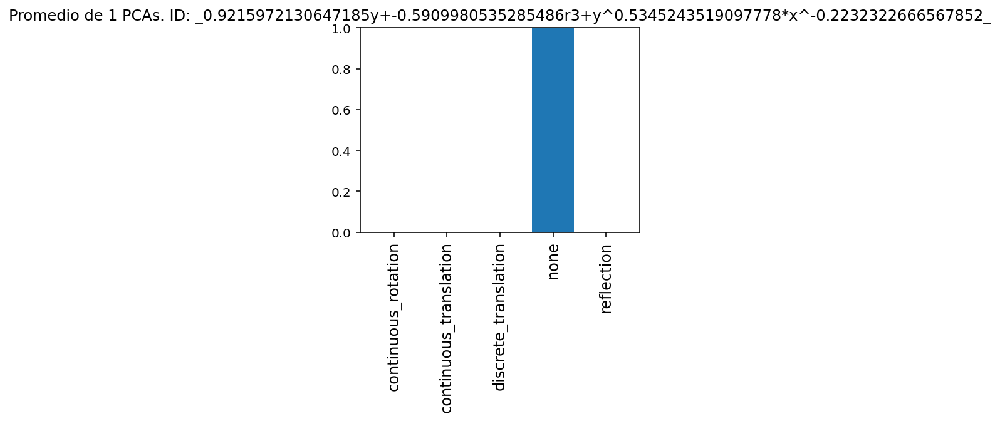

[1.04839864e-06 9.96979475e-01 1.08626307e-06 5.02843701e-04
 2.51554511e-03]


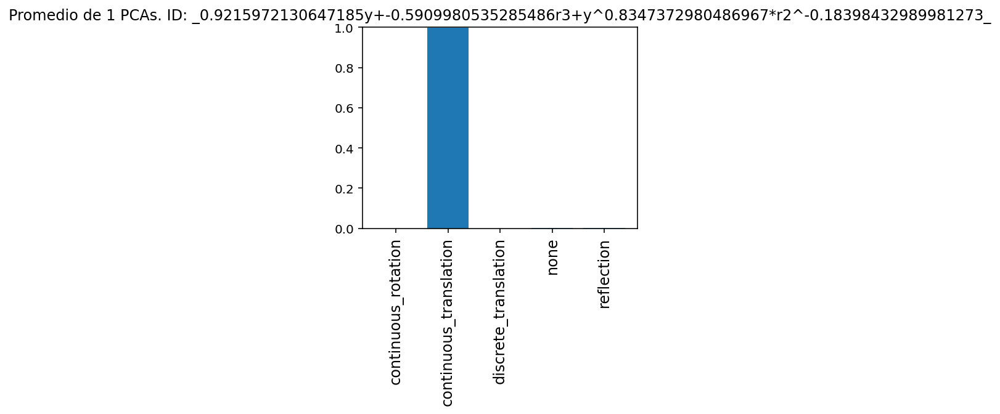

[3.70204248e-07 9.37898278e-01 7.80870209e-07 6.21003695e-02
 1.85075379e-07]


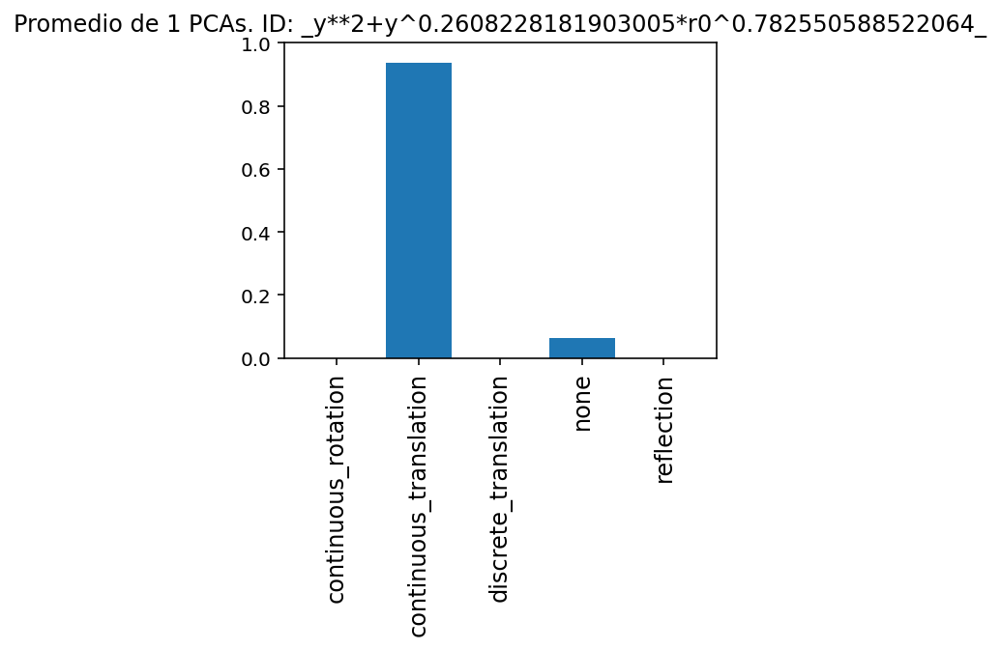

[1.03962990e-02 5.99552095e-02 7.25464779e-04 7.47027040e-01
 1.81895986e-01]


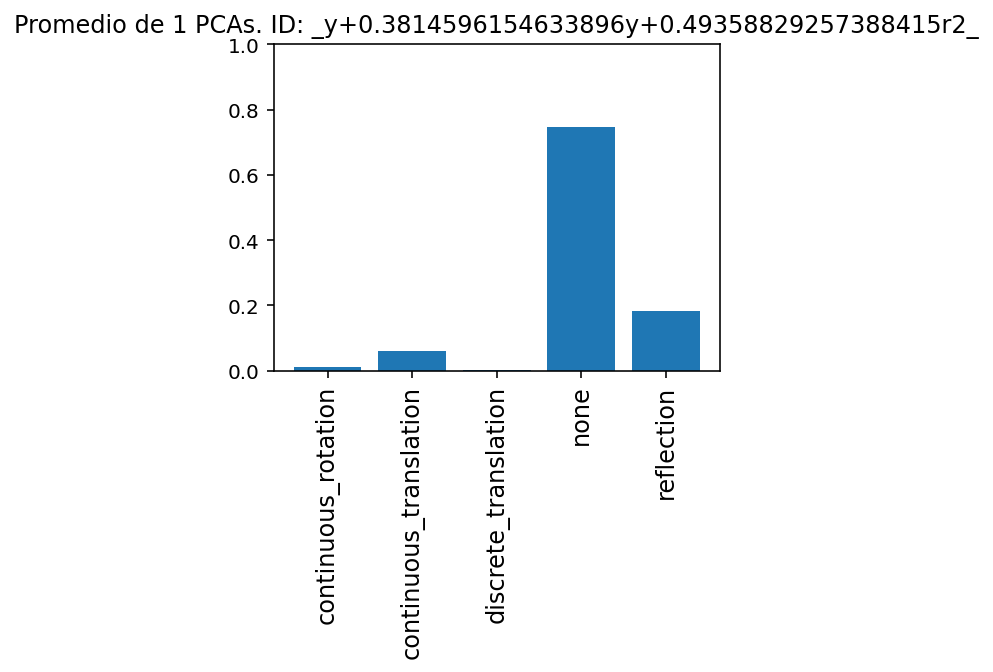

[6.87703263e-08 7.06335632e-05 8.30535173e-01 1.53133783e-06
 1.69392645e-01]


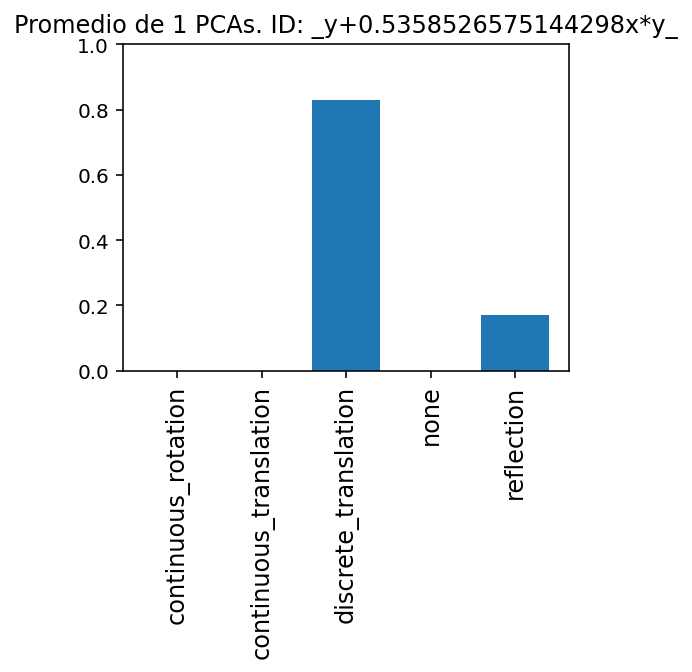

[1.90365017e-06 9.98557508e-01 7.21592141e-06 1.43329438e-03
 2.17659029e-08]


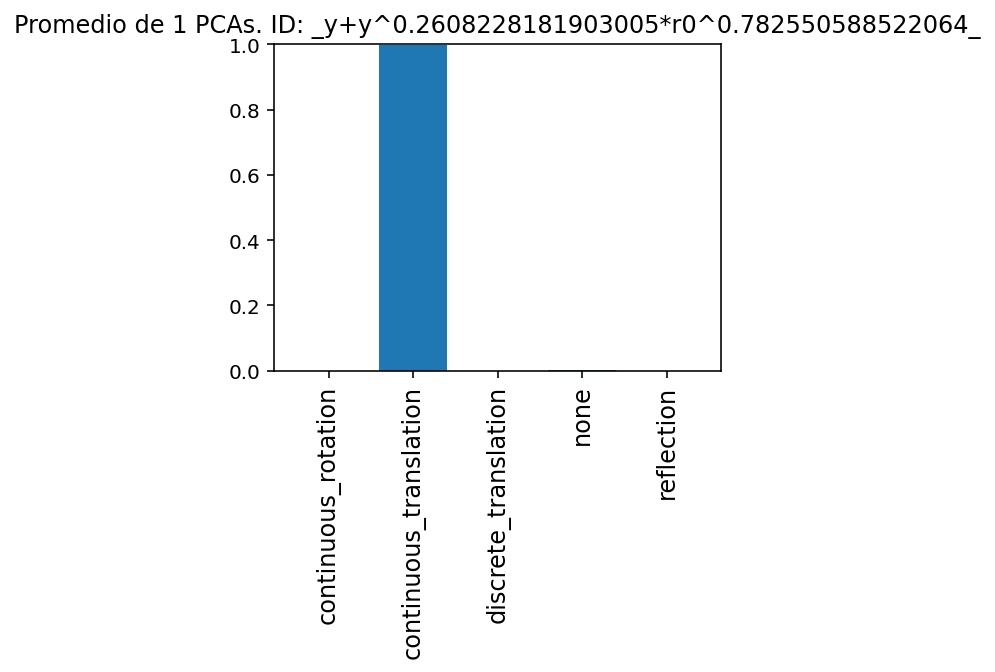

In [299]:
nom_carp = 'PCAs_detector_sym_new/discrete_translation'

#import libraries
%config InlineBackend.figure_format = 'retina'
import seaborn as sns
from IPython.core.display import display, HTML, clear_output
display(HTML("<style>.container { width:100% !important; } div.cell.selected {border-left-width: 0px !important;}</style>"))

from time import time
import os
import glob
from fastai.vision.all import *
import numpy as np
from IPython.display import clear_output
import itertools as it
import more_itertools
#import torchvision.models
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default ="none"
import base64
from PIL import Image
from io import BytesIO
import torch
import gc
#import libraries

if not 'notebook_dir' in globals():
    notebook_dir = os.getcwd()
print('Notebook directory: ' + notebook_dir)
os.chdir(notebook_dir)  # If you changed the current working dir, this will take you back to the workbook dir.
top_dir = notebook_dir



modelo = 'G' 

if modelo == 'G':
    learn = load_learner('/home/gabriel/Desktop/models/model_90_accu_resnet18_one_cycle_10+5_no_mixup'+'.pkl', cpu=False)
     


        
#Reset Registro

registro = pd.DataFrame({
    'Col_Quit':[0], 'Run':[0],
    'continuous_rotation':[0], 'continuous_translation':[0], 'discrete_translation':[0], 'none':[0], 'reflection':[0]
})
registro = registro.drop(0)
#registro

sims = pd.DataFrame(columns = learn.dls.vocab)
errs = sims.copy()

num_img_cat = [] #guardo el numero de imagenes de cada categoria
i = 0
plote = False

from IPython.utils import io



for dires in np.sort(Path('/home/gabriel/Desktop/' + nom_carp).ls()):
    #path = Path('/home/gabriel/Desktop/PCA_INE_sexo/INE/'+quitadas)
    quitadas = str(dires).split('/')[-1]
    with io.capture_output() as captured:
        for ima in dires.ls():

            test_im_dir = ima

            im = PILImage.create(test_im_dir)

            # Orden: ['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection']

            cate, num_cat, probs = learn.predict(im)


            '''
            if plote == True:
                plt.figure
                plt.figure(figsize=(4, 3))
                plt.title(ima)
                plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],probs)
                plt.xticks(rotation='vertical',fontsize = 12)
                plt.show()
            '''

            new_row = np.array([quitadas, i] + list(np.array(probs).astype(float))).reshape([1,-1])
            aden = pd.DataFrame(new_row,columns=registro.columns)

            registro = registro.append(aden, ignore_index=True)

            i+=1

    registro = registro.astype({
        'Col_Quit':str, 'Run':int,
        'continuous_rotation':float, 'continuous_translation':float, 'discrete_translation':float, 'none':float, 'reflection':float
    })  

    print('Numero Imagenes:',i)
    num_img_cat.append(i)



#registro.to_csv(r'/home/gabriel/Desktop/PCA_INE_salarios/registro_'+modelo+'.csv', index = False)
print(registro['Col_Quit'].unique())

#registro = pd.read_csv('/home/gabriel/Desktop/PCA_INE_sexo/registro.csv')

nombres_carps = registro['Col_Quit'].unique() #Nombres de las carpetas donde estan guyardadas las pcas de un tipo
num_carps = len(nombres_carps)
i = 0

for nom in nombres_carps:
    if i == 0:
        m_probs = np.array(registro.iloc[:num_img_cat[0],2:].mean())
        err_probs = np.array(registro.iloc[:num_img_cat[0],2:].std())
        nume = str(len(registro.iloc[:num_img_cat[0],2:]))
        print(learn.dls.vocab)
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)
    else:
        m_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].mean())
        err_probs = np.array(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:].std())
        nume = str(len(registro.iloc[num_img_cat[i-1]:num_img_cat[i],2:]))
        print(m_probs)
        sims = sims.append(pd.DataFrame([m_probs], columns = sims.columns),ignore_index = True)
        errs = errs.append(pd.DataFrame([err_probs/np.sqrt(float(nume))], columns = errs.columns),ignore_index = True)

    if nom == '-ninguna-':
        tit = 'Promedio de '+nume+' PCAs sin quitar ninguna columna'
    else:
        tit = 'Promedio de '+nume+' PCAs. ID: '+ nom        

    
    plt.figure(figsize=(4, 3))
    plt.title(tit)
    #plt.title('Promedio de '+str(40)+' PCAs sin quitar ninguna columna')
    plt.bar(['continuous_rotation', 'continuous_translation', 'discrete_translation', 'none', 'reflection'],
            m_probs,yerr = err_probs/np.sqrt(float(nume)), capsize = 5)
    plt.xticks(rotation='vertical',fontsize = 12)
    plt.ylim([0, 1])
    plt.show()
    
    i+=1

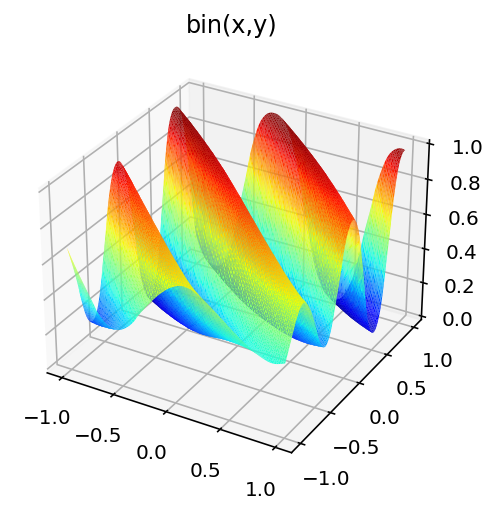

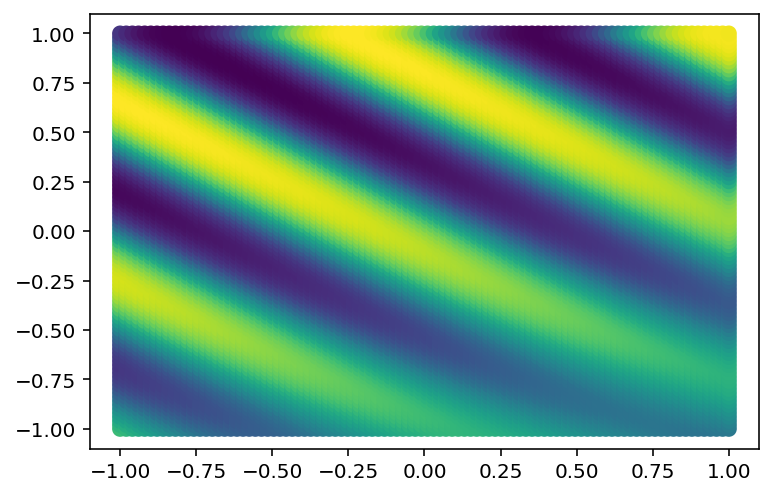

In [300]:
ax2 = plt.axes(projection='3d')
ax2.plot_trisurf(df.x, df.y, df.bin, linewidth=0.2, cmap = 'jet')
plt.title('bin(x,y)')
plt.show()
plt.figure()
plt.scatter(df.x,df.y,c = df.bin,marker = '.', lw = 5)

Text(0, 0.5, 'Predicted Symmetries')

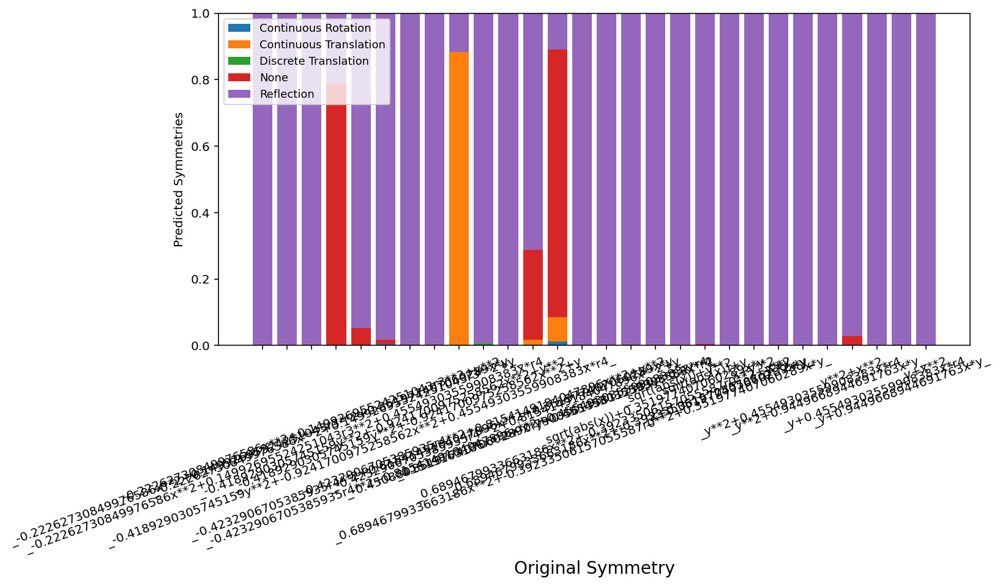

In [207]:
alfas = nombres_carps
plt.figure(figsize =[11,5])

plt.bar(range(len(sims.continuous_rotation)),sims.continuous_rotation, yerr = errs.continuous_rotation,capsize = 8,label = 'Continuous Rotation')
plt.bar(range(len(sims.none)),sims.continuous_translation, yerr = errs.continuous_translation,capsize = 8,label = 'Continuous Translation',bottom = sims.continuous_rotation)
plt.bar(range(len(sims.discrete_translation)),sims.discrete_translation, 
             yerr = errs.discrete_translation,capsize = 8,label = 'Discrete Translation', bottom = sims.continuous_rotation + sims.continuous_translation)
plt.bar(range(len(sims.discrete_translation)),sims.none, 
             yerr = errs.none,capsize = 8,label = 'None', 
             bottom = sims.continuous_rotation + sims.continuous_translation + sims.discrete_translation)
plt.bar(range(len(sims.discrete_translation)),sims.reflection, 
             yerr = errs.reflection,capsize = 8,label = 'Reflection', 
             bottom = sims.continuous_rotation + sims.continuous_translation + sims.discrete_translation + sims.none)


#plt.errorbar(range(len(sims.none)),sims.none, yerr = errs.none,capsize = 8,label = 'None')
#plt.errorbar(range(len(sims.none)),sims.none+sims.reflection, 
#             yerr = np.sqrt(errs.none**2 + errs.reflection**2),capsize = 8,label = 'Reflection + None')
#plt.errorbar(range(len(sims.continuous_translation)),sims.continuous_translation, 
#             yerr = errs.continuous_translation,capsize = 8,label = 'Continuous Translation')
tik = plt.xticks(range(len(sims.reflection)),alfas, rotation = 20)
plt.legend(loc = 'upper left',fontsize = 9)
plt.xlabel('Original Symmetry',fontsize = 14)
plt.ylim([0,1.0])
plt.ylabel('Predicted Symmetries')
#plt.title('Efecto de quitar una categoría de CNACE en la simetría')

# Simple Symmetries

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 100 epochs.
Using lr_max =  0.01


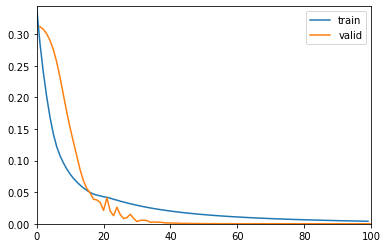

In [311]:
df = potential_df(symmetry = 'continuous_rotation', with_z = False)

splits = RandomSplitter(valid_pct=0.2)(range_of(df))

to = TabularPandas(df,
                procs=[Categorify,FillMissing, Normalize],
                cont_names = ['x','y'],
                y_names = 'bin',
                splits=splits)

train_size = len(splits[0])
valid_size = len(splits[1])

# ----------------- Hyperparameters ------------------- #

# Batch Size (a large one)
bs = train_size
neurons_per_layer = 100
n_layers = 5
layers=[neurons_per_layer for i in range(n_layers)]
n_epoch=100
lr_max=0.01

print('Training FCNN with layers: ',layers)
print('Training for {} epochs.'.format(n_epoch))
print('Using lr_max = ',format(lr_max))


# ----------------------------------------------------- #

# --------------- Training the FCNN --------------------#

# Load the data into a DataLoader
dls = to.dataloaders(bs=bs)

# Define a Tabular Learner
learn = tabular_learner(dls, layers=layers
                    #,config=config
                    #,metrics=[mse],
                    #y_range = [min(df.bin),max(df.bin)],
                    ,cbs=ShowGraphCallback()
                    #,train_bn=False)
                    )

# Train the net 
with learn.no_logging():
    learn.fit_one_cycle(n_epoch=n_epoch
                        ,lr_max=lr_max
                        ,cbs=[SaveModelCallback(monitor= 'valid_loss')]
                        )



In [115]:
x_t = -1
y_t = -0.939394

tes = pd.DataFrame({'x':x_t,'y':y_t}, index=[0])


preds = learn.predict(tes.iloc[0]) # get prediction
preds

(          x         y       bin
 0 -1.709235 -1.595472  0.317181,
 tensor([0.3172]),
 tensor([0.3172]))

In [113]:
preds[0]

          x         y       bin
0 -1.709235 -1.595472  0.317181

In [100]:
float(preds[1])

0.26924675703048706

In [302]:
def test_reflection(df,learn,test_f = 'x', other_f = 'y',num_p = 200):
    
    # Test reflection with test_f cte
    # test_f : feature to test reflection with
    # other_f: second feature, variable
    
    
    prds_x = []

    # ------ Test Reflection
    p1x = (np.max(df[test_f]) - np.min(df[test_f]))*np.random.random() + np.min(df[test_f])
    pointsx = np.array([np.array([p1x for i in range(num_p)]),np.linspace(np.min(df[other_f]),np.max(df[other_f]),num_p)])
    for i in range(num_p):
        ser = pd.Series({test_f:pointsx[0,i],other_f:pointsx[1,i]})
        ser_inv = pd.Series({test_f:-1*pointsx[0,i],other_f:pointsx[1,i]})
        with io.capture_output() as captured: preds = learn.predict(ser)
        with io.capture_output() as captured: preds_inv = learn.predict(ser_inv)

        prr = np.abs(float(preds[1]) - float(preds_inv[1]))/np.abs((float(preds[1]) + float(preds_inv[1])))

        prds_x.append(prr)

    # Desviación por punto con x cte
    dv_x = np.array(prds_x).sum()/num_p
    
    
    return dv_x


def test_reflection_xy(df,learn,num_p = 200):
    dv_x = test_reflection(df, learn, test_f = 'x', other_f = 'y',num_p = num_p)
    dv_y = test_reflection(df, learn, test_f = 'y', other_f = 'x',num_p = num_p)
    
    return (dv_x + dv_y)/2

In [243]:
test_reflection_xy(df, learn,num_p = 200)

0.035842743688227104

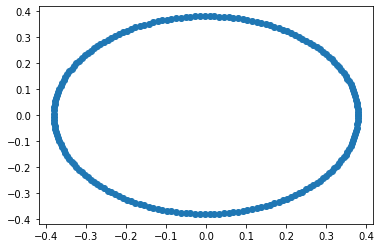

In [198]:
num_p = 200
r = np.random.random()
circ = np.linspace(0,2*np.pi,num_p)

xc = r*np.cos(circ)
yc = r*np.sin(circ)

plt.scatter(xc,yc)

In [269]:
def test_continuous_rotation(df,learn,feats = ['x','y'],num_p = 200):
    
    # Test continuous rotation with test_f cte
    # test_f : feature to test reflection with
    # other_f: second feature, variable
    
    test_f = feats[0]
    other_f = feats[1]
    
    prds_x = []
    
    if np.max(np.abs(df[test_f])) < np.max(np.abs(df[other_f])):
        mx = np.max(np.abs(df[test_f]))
    else:
        mx = np.max(np.abs(df[other_f]))
        
    if np.min(np.abs(df[test_f])) > np.min(np.abs(df[other_f])):
        mn = np.min(np.abs(df[test_f]))
    else:
        mn = np.min(np.abs(df[other_f]))

    # ------ Test Reflection
    r = (mx-mn)*np.random.random()+0.1+mn
    circ = np.linspace(0,2*np.pi,num_p)

    xc = r*np.cos(circ)
    yc = r*np.sin(circ)
   
    pointsx = np.array([xc,yc])
    for i in range(num_p):
        ser = pd.Series({test_f:pointsx[0,i],other_f:pointsx[1,i]})

        with io.capture_output() as captured: preds = learn.predict(ser)

        prr = float(preds[1])
        prds_x.append(np.abs(prr))

    # Desviación por punto con x cte
    dv_x = np.array(prds_x).std()/np.array(prds_x).mean()
    
    
    return dv_x

In [315]:
ff = []
hh = []
for i in range(50):
    ff.append(test_continuous_rotation(df,learn,feats = ['x','y'],num_p = 10))
    hh.append(test_reflection_xy(df, learn,num_p = 10))


In [316]:
np.array(ff).mean(), np.array(hh).mean()

(0.01412163298638002, 0.05812095124961912)

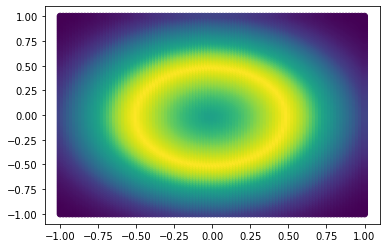

In [314]:
plt.scatter(df.x,df.y,c = df.bin)

# Cosas antiguas

In [8]:
def two_best_nn(df,target, verbose = 1, select_2k = True):
    
    from IPython.utils import io
    
    # Hyperparameters: 
    bs_choices = [50000]       # Batch Size
    shape='pipe'               # Shape of the neural network
    layers_choices = [3]       # Number of layers of the net. Default:10 or 5 results with 5
    neurons_choices = [40]    # Number of neurons per layer. Default:200 results with 200
    epoch_choices = [50]      # Number of training epochs. Default:200 results with 60
    lr_choices = [0.01]       # Max learning rate 
    valid_pct=0.2              # Part of the data that goes into validation (0.2 = 20%)
    monitor= 'valid_loss'        # Te model with the least 'monitor' will be saved
    
    df2 = df.copy()
    
    if select_2k == True:
        if len(df[target]) <= 2000:
            print('Too little data to keep 2k points and discard the rest')
        else:
            print('Keeping 2k points of the original DF')
            remove_n = len(df[target]) - 2000
            drop_indices = np.random.choice(df.index, remove_n, replace=False)
            df_temp = df.drop(drop_indices)
            df = df_temp.copy()


    # ------------------- First Feature ----------------------- #

    nrmse = np.inf
    i = 0

    feats = np.array(df.drop(target, axis = 1).columns)

    num_pot = len(feats)

    from time import time
    start_time = time()

    if verbose == 1 or verbose == 2: print('------- Selecting First Feature ------------')

    for feat in feats:
        i+=1
        df2 = df.copy() 

        splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

        to = TabularPandas(df2,
                        procs=[Categorify,FillMissing, Normalize],
                        cont_names = feat,
                        y_names = target,
                        splits=splits)

        train_size = len(splits[0])
        valid_size = len(splits[1])

        # ----------------- Hyperparameters ------------------- #

        # Batch Size (a large one)
        bs=min(random.choice(bs_choices),train_size)  
        if i == 1: 
            if verbose == 1 or verbose == 2: print('{} batch size for training.\n'.format(bs))

        # Neurons per layer
        neurons_per_layer = random.choice(neurons_choices)

        # Number of layers
        n_layers = random.choice(layers_choices)

        #Shape of the net: Pipe or funnel
        if shape == 'pipe':
            layers=[neurons_per_layer for i in range(n_layers)]

        if shape == 'funnel':
            n_eff = n_layers
            layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

        if i == 1: 
            if verbose == 1 or verbose == 2: print('Training FCNN with layers: ',layers)

        #Number of epochs
        n_epoch=random.choice(epoch_choices)
        if i == 1: 
            if verbose == 1 or verbose == 2: print('Training for {} epochs.'.format(n_epoch))

        # Maximum Learning Rate: (a good value can be found using learn.lr_find())
        lr_max=float(random.choice(lr_choices))
        if i == 1: 
            if verbose == 1 or verbose == 2: print('Using lr_max = ',format(lr_max))

        # ----------------------------------------------------- #

        # --------------- Training the FCNN --------------------#

        # Load the data into a DataLoader
        dls = to.dataloaders(bs=bs)

        # Define a Tabular Learner
        learn = tabular_learner(dls, layers=layers
                            #,config=config
                            #,metrics=[mse],
                            #y_range = [min(df[target]),max(df[target])],
                            #,cbs=ShowGraphCallback()
                            #,train_bn=False)
                            )

        # Train the net 
        with io.capture_output() as captured:
            with learn.no_logging():
                learn.fit_one_cycle(n_epoch=n_epoch
                                    ,lr_max=lr_max
                                    ,cbs=[SaveModelCallback(monitor=monitor)]
                                    )


            preds, targs = learn.get_preds()

        #RMSE
        ff = (preds-targs)**2/len(targs)
        ff = sum(ff)
        RMSE = np.sqrt(ff)
        #print('RMSE:',float(RMSE))
        nrmsei = float(RMSE)
        #print('Normalized RMSE:',float(RMSE)/(max(np.array(targs).flatten()-min(np.array(targs).flatten())))*100,'%')

        if nrmsei < nrmse:
            nrmse = nrmsei
            best_f0 = feat
            if verbose == 1 or verbose == 2: print('Better feature found: {}'.format(best_f0))

        minutes_until_now = (time() - start_time)/60
        images_done = i
        minutes_per_image = minutes_until_now/(images_done)
        hours_left = minutes_per_image * (num_pot-images_done)/60

        if i%20 == 0:
            if verbose == 2: 
                print("\n{} features studied out of {}.\n".format(images_done,num_pot))
                print("{:.1f} minutes elapsed for {} features.".format(minutes_until_now,images_done))
                print("{:.1f} minutes average per feature.".format(minutes_until_now/images_done))
                print("{:.1f} minutes estimated left for {} features.\n\n\n".format(hours_left*60,num_pot-images_done))
                #print("{:.1f} hours estimated left for {} features.\n\n\n".format(hours_left,num_pot-images_done))

        if i == 10:
            if verbose == 1 or verbose == 2: print('Total time estimated for finding both features: {} minutes'.format(np.round(2*hours_left*60,2)))






    # ------------------- Second Feature ----------------------- #

    nrmse = np.inf
    i = 0

    feats = np.array(df.drop(target, axis = 1).drop(best_f0, axis = 1).columns)

    num_pot = len(feats)

    from time import time
    start_time = time()

    if verbose == 1 or verbose == 2: print('------- Selecting Second Feature ------------')

    for feat in feats:
        i+=1
        df2 = df.copy() 

        splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

        to = TabularPandas(df2,
                        procs=[Categorify,FillMissing, Normalize],
                        cont_names = [feat,best_f0],
                        y_names = target,
                        splits=splits)

        train_size = len(splits[0])
        valid_size = len(splits[1])

        # ----------------- Hyperparameters ------------------- #

        # Batch Size (a large one)
        bs=min(random.choice(bs_choices),train_size)  
        if i == 1: 
            if verbose == 1 or verbose == 2: print('{} batch size for training.\n'.format(bs))

        # Neurons per layer
        neurons_per_layer = random.choice(neurons_choices)

        # Number of layers
        n_layers = random.choice(layers_choices)

        #Shape of the net: Pipe or funnel
        if shape == 'pipe':
            layers=[neurons_per_layer for i in range(n_layers)]

        if shape == 'funnel':
            n_eff = n_layers
            layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

        if i == 1: 
            if verbose == 1 or verbose == 2: print('Training FCNN with layers: ',layers)

        #Number of epochs
        n_epoch=random.choice(epoch_choices)
        if i == 1: 
            if verbose == 1 or verbose == 2: print('Training for {} epochs.'.format(n_epoch))

        # Maximum Learning Rate: (a good value can be found using learn.lr_find())
        lr_max=float(random.choice(lr_choices))
        if i == 1: 
            if verbose == 1 or verbose == 2: print('Using lr_max = ',format(lr_max))

        # ----------------------------------------------------- #

        # --------------- Training the FCNN --------------------#

        # Load the data into a DataLoader
        dls = to.dataloaders(bs=bs)

        # Define a Tabular Learner
        learn = tabular_learner(dls, layers=layers
                            #,config=config
                            #,metrics=[mse],
                            #y_range = [min(df[target]),max(df[target])],
                            #,cbs=ShowGraphCallback()
                            #,train_bn=False)
                            )

        # Train the net 
        with io.capture_output() as captured:
            with learn.no_logging():
                learn.fit_one_cycle(n_epoch=n_epoch
                                    ,lr_max=lr_max
                                    ,cbs=[SaveModelCallback(monitor=monitor)]
                                    )


            preds, targs = learn.get_preds()

        #RMSE
        ff = (preds-targs)**2/len(targs)
        ff = sum(ff)
        RMSE = np.sqrt(ff)
        #print('RMSE:',float(RMSE))
        nrmsei = float(RMSE)
        #print('Normalized RMSE:',float(RMSE)/(max(np.array(targs).flatten()-min(np.array(targs).flatten())))*100,'%')

        if nrmsei < nrmse:
            nrmse = nrmsei
            best_f1 = feat
            if verbose == 1 or verbose == 2: print('Better feature found: {}'.format(best_f1))

        minutes_until_now = (time() - start_time)/60
        images_done = i
        minutes_per_image = minutes_until_now/(images_done)
        hours_left = minutes_per_image * (num_pot-images_done)/60

        if i%20 == 0:
            if verbose == 2: 
                print("\n{} features studied out of {}.\n".format(images_done,num_pot))
                print("{:.1f} minutes elapsed for {} features.".format(minutes_until_now,images_done))
                print("{:.1f} minutes average per feature.".format(minutes_until_now/images_done))
                print("{:.1f} minutes estimated left for {} features.\n\n\n".format(hours_left*60,num_pot-images_done))
                #print("{:.1f} hours estimated left for {} features.\n\n\n".format(hours_left,num_pot-images_done))
            
    
    two_best = [best_f0,best_f1]
    if verbose == 2: print('Two Best features:', two_best)

    return two_best

In [192]:
df2

,0.3657808845125179r4**2+0.6314670475483073y**2,0.3657808845125179r4**2+0.6314670475483073y**2,-0.2687770389417701r0+0.6913402394919275y,bin
0,0.650255,0.650255,-0.535967,0.000000
1,0.610991,0.610991,-0.909195,0.002517
2,0.694645,0.694645,-0.555096,0.008496
3,0.805307,0.805307,-0.402619,0.017621
4,0.743222,0.743222,-0.775639,0.032725
...,...,...,...,...
9995,0.603654,0.603654,0.371734,0.032620
9996,0.602092,0.602092,0.394283,0.017621
9997,0.783686,0.783686,0.606855,0.008391
9998,0.768709,0.768709,0.768913,0.002412


In [161]:
def test_reflection_xy(df,learn, num_p = 200):
    from IPython.utils import io

    prds_x = []
    prds_y = []

    num_p = 200

    # ------ Test reflection in x
    p1x = (np.max(df['x']) - np.min(df['x']))*np.random.random() + np.min(df['x'])
    pointsx = np.array([np.array([p1x for i in range(num_p)]),np.linspace(np.min(df['y']),np.max(df['y']),num_p)])
    for i in range(num_p):
        ser = pd.Series({'x':pointsx[0,i],'y':pointsx[1,i]})
        ser_inv = pd.Series({'x':-1*pointsx[0,i],'y':pointsx[1,i]})
        with io.capture_output() as captured: preds = learn.predict(ser)
        with io.capture_output() as captured: preds_inv = learn.predict(ser_inv)

        prr = np.abs(float(preds[1]) - float(preds_inv[1]))/((float(preds[1]) + float(preds_inv[1]))/2)

        prds_x.append(prr)

    # Desviación por punto con x cte
    dv_x = np.array(prds_x).sum()/200

    # ------ Test reflection in y
    p1y = (np.max(df['y']) - np.min(df['y']))*np.random.random() + np.min(df['y'])
    pointsy = np.array([np.linspace(np.min(df['x']),np.max(df['x']),num_p),np.array([p1y for i in range(num_p)])])
    for i in range(num_p):
        ser = pd.Series({'x':pointsy[0,i],'y':pointsy[1,i]})
        ser_inv = pd.Series({'x':pointsy[0,i],'y':-1*pointsy[1,i]})
        with io.capture_output() as captured: preds = learn.predict(ser)
        with io.capture_output() as captured: preds_inv = learn.predict(ser_inv)

        prr = np.abs(float(preds[1]) - float(preds_inv[1]))/((float(preds[1]) + float(preds_inv[1]))/2)

        prds_y.append(prr)

    dv_y = np.array(prds_y).sum()/200

return (dv_x + dv_y)/2

In [63]:
symmetries = ['reflection']

potenciales = []
potenciales_tags = []
select_2k = True

# Hyperparameters: De momento los pondré aquí, pero luego serán un input entero
bs_choices = [50000]       # Batch Size
shape='pipe'               # Shape of the neural network
layers_choices = [3]       # Number of layers of the net. Default:10 or 5 results with 5
neurons_choices = [40]    # Number of neurons per layer. Default:200 results with 200
epoch_choices = [50]      # Number of training epochs. Default:200 results with 60
lr_choices = [0.01]       # Max learning rate 
valid_pct=0.2              # Part of the data that goes into validation (0.2 = 20%)
monitor= 'valid_loss'        # Te model with the least 'monitor' will be saved


for symmetry in symmetries:
    print('Generating Potentials for',symmetry,'symmetry')
    funs_temp = [mock_data(sym = symmetry, verbose = False) for i in range(num_pot_cada)]
    funs_tags_temp = [symmetry for i in range(num_pot_cada)]
    potenciales = potenciales + funs_temp 
    potenciales_tags = potenciales_tags + funs_tags_temp
    
df = potenciales[0]

if select_2k == True:
    if len(df.bin) <= 2000:
        print('Too little data to keep 2k points')
    else:
        print('Keeping 5k points of the original DF')
        remove_n = len(df.bin) - 2000
        drop_indices = np.random.choice(df.index, remove_n, replace=False)
        df_temp = df.drop(drop_indices)
        df = df_temp.copy()


# ------------------- First Feature ----------------------- #
        
nrmse = np.inf
i = 0

feats = np.array(df.drop('bin', axis = 1).columns)

num_pot = len(feats)

from time import time
start_time = time()

print('------- Selecting First Feature ------------')

for feat in feats:
    i+=1
    df2 = df.copy() 

    splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

    to = TabularPandas(df2,
                    procs=[Categorify,FillMissing, Normalize],
                    cont_names = feat,
                    y_names = 'bin',
                    splits=splits)

    train_size = len(splits[0])
    valid_size = len(splits[1])

    # ----------------- Hyperparameters ------------------- #

    # Batch Size (a large one)
    bs=min(random.choice(bs_choices),train_size)  
    if i == 1: print('{} batch size for training.\n'.format(bs))

    # Neurons per layer
    neurons_per_layer = random.choice(neurons_choices)

    # Number of layers
    n_layers = random.choice(layers_choices)

    #Shape of the net: Pipe or funnel
    if shape == 'pipe':
        layers=[neurons_per_layer for i in range(n_layers)]

    if shape == 'funnel':
        n_eff = n_layers
        layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

    if i == 1: print('Training FCNN with layers: ',layers)

    #Number of epochs
    n_epoch=random.choice(epoch_choices)
    if i == 1: print('Training for {} epochs.'.format(n_epoch))

    # Maximum Learning Rate: (a good value can be found using learn.lr_find())
    lr_max=float(random.choice(lr_choices))
    if i == 1: print('Using lr_max = ',format(lr_max))

    # ----------------------------------------------------- #

    # --------------- Training the FCNN --------------------#

    # Load the data into a DataLoader
    dls = to.dataloaders(bs=bs)

    # Define a Tabular Learner
    learn = tabular_learner(dls, layers=layers
                        #,config=config
                        #,metrics=[mse],
                        #y_range = [min(df.bin),max(df.bin)],
                        #,cbs=ShowGraphCallback()
                        #,train_bn=False)
                        )

    # Train the net 
    with io.capture_output() as captured:
        with learn.no_logging():
            learn.fit_one_cycle(n_epoch=n_epoch
                                ,lr_max=lr_max
                                ,cbs=[SaveModelCallback(monitor=monitor)]
                                )


        preds, targs = learn.get_preds()

    #RMSE
    ff = (preds-targs)**2/len(targs)
    ff = sum(ff)
    RMSE = np.sqrt(ff)
    #print('RMSE:',float(RMSE))
    nrmsei = float(RMSE)/(max(np.array(targs).flatten()-min(np.array(targs).flatten())))
    #print('Normalized RMSE:',float(RMSE)/(max(np.array(targs).flatten()-min(np.array(targs).flatten())))*100,'%')
    
    if nrmsei < nrmse:
        nrmse = nrmsei
        best_f0 = feat
        print('Better feature found: {}'.format(best_f0))
    
    minutes_until_now = (time() - start_time)/60
    images_done = i
    minutes_per_image = minutes_until_now/(images_done)
    hours_left = minutes_per_image * (num_pot-images_done)/60
    
    if i%20 == 0:
        print("\n{} features studied out of {}.\n".format(images_done,num_pot))
        print("{:.1f} minutes elapsed for {} features.".format(minutes_until_now,images_done))
        print("{:.1f} minutes average per feature.".format(minutes_until_now/images_done))
        print("{:.1f} minutes estimated left for {} features.\n\n\n".format(hours_left*60,num_pot-images_done))
        #print("{:.1f} hours estimated left for {} features.\n\n\n".format(hours_left,num_pot-images_done))
        
    if i == 10:
        print('Total time estimated for finding both features: {} minutes'.format(np.round(2*hours_left*60,2)))

        
        
        
        
        
# ------------------- Second Feature ----------------------- #
        
nrmse = np.inf
i = 0

feats = np.array(df.drop('bin', axis = 1).drop(best_f0, axis = 1).columns)

num_pot = len(feats)

from time import time
start_time = time()

print('------- Selecting Second Feature ------------')

for feat in feats:
    i+=1
    df2 = df.copy() 

    splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

    to = TabularPandas(df2,
                    procs=[Categorify,FillMissing, Normalize],
                    cont_names = [feat,best_f0],
                    y_names = 'bin',
                    splits=splits)

    train_size = len(splits[0])
    valid_size = len(splits[1])

    # ----------------- Hyperparameters ------------------- #

    # Batch Size (a large one)
    bs=min(random.choice(bs_choices),train_size)  
    if i == 1: print('{} batch size for training.\n'.format(bs))

    # Neurons per layer
    neurons_per_layer = random.choice(neurons_choices)

    # Number of layers
    n_layers = random.choice(layers_choices)

    #Shape of the net: Pipe or funnel
    if shape == 'pipe':
        layers=[neurons_per_layer for i in range(n_layers)]

    if shape == 'funnel':
        n_eff = n_layers
        layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

    if i == 1: print('Training FCNN with layers: ',layers)

    #Number of epochs
    n_epoch=random.choice(epoch_choices)
    if i == 1: print('Training for {} epochs.'.format(n_epoch))

    # Maximum Learning Rate: (a good value can be found using learn.lr_find())
    lr_max=float(random.choice(lr_choices))
    if i == 1: print('Using lr_max = ',format(lr_max))

    # ----------------------------------------------------- #

    # --------------- Training the FCNN --------------------#

    # Load the data into a DataLoader
    dls = to.dataloaders(bs=bs)

    # Define a Tabular Learner
    learn = tabular_learner(dls, layers=layers
                        #,config=config
                        #,metrics=[mse],
                        #y_range = [min(df.bin),max(df.bin)],
                        #,cbs=ShowGraphCallback()
                        #,train_bn=False)
                        )

    # Train the net 
    with io.capture_output() as captured:
        with learn.no_logging():
            learn.fit_one_cycle(n_epoch=n_epoch
                                ,lr_max=lr_max
                                ,cbs=[SaveModelCallback(monitor=monitor)]
                                )


        preds, targs = learn.get_preds()

    #RMSE
    ff = (preds-targs)**2/len(targs)
    ff = sum(ff)
    RMSE = np.sqrt(ff)
    #print('RMSE:',float(RMSE))
    nrmsei = float(RMSE)/(max(np.array(targs).flatten()-min(np.array(targs).flatten())))
    #print('Normalized RMSE:',float(RMSE)/(max(np.array(targs).flatten()-min(np.array(targs).flatten())))*100,'%')
    
    if nrmsei < nrmse:
        nrmse = nrmsei
        best_f1 = feat
        print('Better feature found: {}'.format(best_f1))
    
    minutes_until_now = (time() - start_time)/60
    images_done = i
    minutes_per_image = minutes_until_now/(images_done)
    hours_left = minutes_per_image * (num_pot-images_done)/60
    
    if i%20 == 0:
        print("\n{} features studied out of {}.\n".format(images_done,num_pot))
        print("{:.1f} minutes elapsed for {} features.".format(minutes_until_now,images_done))
        print("{:.1f} minutes average per feature.".format(minutes_until_now/images_done))
        print("{:.1f} minutes estimated left for {} features.\n\n\n".format(hours_left*60,num_pot-images_done))
        #print("{:.1f} hours estimated left for {} features.\n\n\n".format(hours_left,num_pot-images_done))


Generating Potentials for reflection symmetry
Keeping 5k points of the original DF
------- Selecting First Feature ------------
1600 batch size for training.

Training FCNN with layers:  [40, 40, 40]
Training for 50 epochs.
Using lr_max =  0.01
Better feature found: x
Total time estimated for finding both features: 2.88 minutes

20 features studied out of 126.

0.3 minutes elapsed for 20 features.
0.0 minutes average per feature.
1.4 minutes estimated left for 106 features.





KeyboardInterrupt: 

In [176]:
rep_todo = 1
n_fea = 5
target= 'bin'

# Tiempo en el que empezamos a procesar
from time import time
start_time = time()

for rtd in range(rep_todo):
    from fastai.vision.all import *
    from time import time
    from IPython.utils import io

    model_fi = 'RF' # RF or FW (random forests or featurewiz)
    #Tipos de simetría que quiero generar
    #syms = ['continuous_rotation', 'discrete_translation', 'reflection', 'none', 'continuous_translation']
    symmetries = ['reflection']

    num_pot_cada = 1 # Numero de potenciales de cada tipo

    int_1 = False #Interactions in Feature Importance 1 (RF)
    int_2 = False
    select_10k = True #Keep only 10000 elements of the original potential DF

    # ------------------- Folder PCA ------------------- #

    folder = 'PCAs_detector_sym_new'

    dd = top_dir + '/' + folder
    if not os.path.isdir(dd):
        print('Creating directory:\n',dd)
        os.mkdir(dd)

    dir = os.path.join(top_dir,folder)

    #------------------------------ Generar Potenciales ---------------------------#


    potenciales = []
    potenciales_tags = []

    for symmetry in symmetries:
        print('Generating Potentials for',symmetry,'symmetry')
        funs_temp = [mock_data(sym = symmetry, verbose = False) for i in range(num_pot_cada)]
        funs_tags_temp = [symmetry for i in range(num_pot_cada)]
        potenciales = potenciales + funs_temp 
        potenciales_tags = potenciales_tags + funs_tags_temp

    # Vamos a ordenar los potenciales de forma aleatoria, aunque en realidad
    # este paso no es relevante, puesto que para cada potencial entrenaremos una 
    # red. Si fuéramos a entrenar una red con todos los potenciales, entonces sí
    # que sería relevante.

    num_pot = len(potenciales) # Numero de Potenciales que quiero (por si no quiero todos)

    c = list(zip(potenciales,potenciales_tags))

    # Barajamos los potenciales, para pasarseslos en orden aleatorio
    #random.shuffle(c)

    potenciales_aux, tags = zip(*c)

    potenciales = [potenciales_aux[i] for i in range(num_pot)]




    class SaveModelCallback(TrackerCallback):
        "A `TrackerCallback` that saves the model's best during training and loads it at the end."
        _only_train_loop = True
        def __init__(self, monitor='valid_loss', comp=None, min_delta=0., fname='model', every_epoch=False, at_end=False,
                     with_opt=False, reset_on_fit=True):
            super().__init__(monitor=monitor, comp=comp, min_delta=min_delta, reset_on_fit=reset_on_fit)
            assert not (every_epoch and at_end), "every_epoch and at_end cannot both be set to True"
            # keep track of file path for loggers
            self.last_saved_path = None
            store_attr('fname,every_epoch,at_end,with_opt')

        def _save(self, name): self.last_saved_path = self.learn.save(name, with_opt=self.with_opt)

        def after_epoch(self):
            "Compare the value monitored to its best score and save if best."
            if self.every_epoch: self._save(f'{self.fname}_{self.epoch}')
            else: #every improvement
                super().after_epoch()
                if self.new_best:
                    #print(f'Better model found at epoch {self.epoch} with {self.monitor} value: {self.best}.')
                    self._save(f'{self.fname}')

        def after_fit(self, **kwargs):
            "Load the best model."
            if self.at_end: self._save(f'{self.fname}')
            elif not self.every_epoch: self.learn.load(f'{self.fname}', with_opt=self.with_opt)

    # ---------------- Definiciones previas e hiperparámetros ----------------- #

    #Guardo los modelos para analizarlos luego
    models = [] 
    to_s = []

    #Guardaremos los resultados de la PCA en un array 
    PCA_s = []
    PCA_s_tag = []

    # Hyperparameters: De momento los pondré aquí, pero luego serán un input entero
    bs_choices = [50000]       # Batch Size
    shape='pipe'               # Shape of the neural network
    layers_choices = [5]       # Number of layers of the net. Default:10 or 5 results with 5
    neurons_choices = [100]    # Number of neurons per layer. Default:200 results with 200
    epoch_choices = [150]      # Number of training epochs. Default:200 results with 60
    lr_choices = [0.01]       # Max learning rate 
    valid_pct=0.2              # Part of the data that goes into validation (0.2 = 20%)
    monitor= 'valid_loss'        # Te model with the least 'monitor' will be saved



    # ---------------------- Entrenar Red Y PCA -----------------------------------#

    j = 1 # Usaremos esto para saber cuantos potenciales hemos procesado, y como indice en general

    for df in potenciales:
        
        #------------------------------ Feature Importance  ---------------------------#

        if select_10k == True:
            if len(df.bin) <= 100*100:
                print('Too little data to keep 10k points')
            else:
                print('Keeping 10k points of the original DF')
                remove_n = len(df.bin) - 10000
                drop_indices = np.random.choice(df.index, remove_n, replace=False)
                df_temp = df.drop(drop_indices)
                df = df_temp.copy()


        print('---Selecting Best Features---')
        best_n = n_best_phi_k(df,'bin',n=n_fea)
        print('Best Features: ',best_n)

        small_df = df[best_n]
        small_df[target] = df[target]

        
        cols = best_n
        a = cols

        verbose = 1

        i=0

        df_org = df.copy()

        for r in range(len(a)):
            for rr in range(len(a)-r-1):
                print('\n',a[r],a[rr+r+1],'\n')
                
                feas = [a[r],a[rr+r+1]]                

                # Debemos marcar cada potencial para tener claro a qué tipo de simetria corresponde cada PCA
                PCA_s_tag.append(tags[j-1])

                df2 = small_df.copy() 
                df2 = df2[feas + [target]].copy()

                splits = RandomSplitter(valid_pct=valid_pct)(range_of(df2))

                to = TabularPandas(df2,
                                procs=[Categorify,FillMissing, Normalize],
                                cont_names = feas,
                                y_names = target,
                                splits=splits)

                train_size = len(splits[0])
                valid_size = len(splits[1])

                # ----------------- Hyperparameters ------------------- #

                # Batch Size (a large one)
                bs=min(random.choice(bs_choices),train_size)  
                print('{} batch size for training.\n'.format(bs))

                # Neurons per layer
                neurons_per_layer = random.choice(neurons_choices)

                # Number of layers
                n_layers = random.choice(layers_choices)

                #Shape of the net: Pipe or funnel
                if shape == 'pipe':
                    layers=[neurons_per_layer for i in range(n_layers)]

                if shape == 'funnel':
                    n_eff = n_layers
                    layers = np.clip(sum([[2**(n_layers-i+2)] for i in range(0,n_layers,1)],[]),2,neurons_per_layer).tolist()

                print('Training FCNN with layers: ',layers)

                #Number of epochs
                n_epoch=random.choice(epoch_choices)
                print('Training for {} epochs.'.format(n_epoch))

                # Maximum Learning Rate: (a good value can be found using learn.lr_find())
                lr_max=float(random.choice(lr_choices))
                print('Using lr_max = ',format(lr_max))

                # ----------------------------------------------------- #

                # --------------- Training the FCNN --------------------#

                # Load the data into a DataLoader
                dls = to.dataloaders(bs=bs)

                # Define a Tabular Learner
                learn = tabular_learner(dls, layers=layers
                                    #,config=config
                                    #,metrics=[mse],
                                    #y_range = [min(df.bin),max(df.bin)],
                                    #,cbs=ShowGraphCallback()
                                    #,train_bn=False)
                                    )

                # Train the net 
                with learn.no_logging():
                    learn.fit_one_cycle(n_epoch=n_epoch
                                        ,lr_max=lr_max
                                        ,cbs=[SaveModelCallback(monitor=monitor)]
                                        )

                # Guardamos modelos y tabular objects para el posterior analisis
                models.append(learn)
                to_s.append(to)

                # ------------------------------------------------------#


                # ------------------------- PCA ------------------------#

                test_df = df2.copy()
                dl = learn.dls.test_dl(test_df,bs=int(test_df.shape[0])) 

                # Tenemos que hacer un Hook, una especie de gancho que enganchamos en la última capa interna,
                # para guardar, de cada modelo, los valores de los parámetro de dicha capa. 
                with Hooks(learn.model.layers, lambda m,i,o: o) as h:
                    preds = learn.get_preds(dl=dl,with_input=True,with_decoded=True,with_loss=True)

                targets=preds[2].numpy().flatten()

                # Cogemos la información de la penúltima capa
                # OJO: Si añadimos y_range, se añade automaticamente una sigmoid
                # al final, por lo que tendríamos que coger la capa -3 en vez de la -2
                act = h.stored[-2] 
                multi_dim=Tensor.cpu(act).numpy()
                standardized=StandardScaler().fit_transform(multi_dim)

                viz = PCA(2).fit_transform(np.nan_to_num(standardized))
                #plt.figure()
                #plt.scatter(viz[:, 0], viz[:, 1],c=targets[:multi_dim.shape[0]],alpha=.1, marker = 'o')

                PCA_s.append(viz)

                # ------------------------------------------------------ #

                # ------------------ Saving the PCA's ------------------ #

                # ---- Dar formato a PCA para guardar como imagen con color

                viz = pd.DataFrame(viz) #Transformamos la PCA en un dataframe
                viz.columns = ['x','y'] #Nombres de las columnas

                # Insertamos una columna con los colores de los puntos. El valor del potencial
                # objetivo (targets) es el color, y hay un color por cada punto 
                viz.insert(2,'class',targets[:multi_dim.shape[0]]) 

                # ---- Personalizar mapa de color 

                n_classes=1000

                colors = 'rainbow'

                if colors == 'rainbow':
                    my_cmap = plt.cm.get_cmap('rainbow', n_classes)
                    classes_in_rgb = my_cmap(range(n_classes))
                if colors == 'purple':
                    my_cmap = plt.cm.get_cmap('rainbow', n_classes)
                    classes_in_rgb = np.vstack((np.array([0,0,0,0]),my_cmap([0 for i in range(n_classes)])))

                # ---- Hacer que la intensidad del pixel represente la cantidad de puntos 
                #      acumuldos en un pixel

                n_pixels = 224

                binning_3d=np.histogramdd([viz['x'],viz['y'],viz['class']],range=(None,None,(0,1)), bins=(n_pixels,n_pixels,n_classes))

                #if we want the pixel intensity to reprensent the number of points at that location
                array = np.dot(binning_3d[0],classes_in_rgb)
                array = array/np.amax(array)

                # ---- Guardar la PCA

                #Directorio donde guardaremos las imagenes
                nami = '_'+str(feas[0])+'+'+str(feas[1])+'_'
                dir_sym = os.path.join(dir,tags[j-1],nami)
                if not os.path.isdir(dir_sym):
                    print('Creating directory:\n',dir_sym)
                    os.mkdir(dir_sym)


                # Nombre de la imagen. Pongo el tiempo para que todas se llamen distinto cada vez.
                img_file = str(tags[j-1])+'_'+str(j)+str(round(time()))+'__PCA.png' 
                output_dir = os.path.join(dir_sym,img_file) # Directorio donde guardamos la imagen
                plt.imsave(output_dir,array) # Guardar
                print('\nPCA saved to:\n{}\n'.format(dir_sym+'/'+img_file))

        # ------------------------ Time -------------------------#

        minutes_until_now = (time() - start_time)/60
        images_done = j+num_pot*rtd
        minutes_per_image = minutes_until_now/(images_done)
        hours_left = minutes_per_image * (num_pot*rep_todo-images_done)/60
        print("\n{} PCA's made out of {}.\n".format(images_done,num_pot*rep_todo))
        print("{:.1f} minutes elapsed for {} images.".format(minutes_until_now,images_done))
        print("{:.1f} minutes average per image.".format(minutes_until_now/images_done))
        print("{:.1f} minutes estimated left for {} images.\n\n\n".format(hours_left*60,num_pot*rep_todo-images_done))
        print("{:.1f} hours estimated left for {} images.\n\n\n".format(hours_left,num_pot*rep_todo-images_done))
        j+=1


      # ------------------------------------------------------#

Generating Potentials for reflection symmetry
Too little data to keep 10k points
---Selecting Best Features---
Best Features:  Index(['-0.16116354705362146r1**2+-0.8105023897654826x**2',
       '0.29428245933914177x**2+0.4055566856435213y**2', 'x', 'sqrt(abs(x))',
       'x**2'],
      dtype='object')

 -0.16116354705362146r1**2+-0.8105023897654826x**2 0.29428245933914177x**2+0.4055566856435213y**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/reflection/_-0.16116354705362146r1**2+-0.8105023897654826x**2+0.29428245933914177x**2+0.4055566856435213y**2_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/reflection/_-0.16116354705362146r1**2+-0.8105023897654826x**2+0.29428245933914177x**2+0.4055566856435213y**2_/reflection_11637596904__PCA.png


 -0.16116354705362146r1**2+-0.8105023897654826x**2 x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/reflection/_-0.16116354705362146r1**2+-0.8105023897654826x**2+x_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/reflection/_-0.16116354705362146r1**2+-0.8105023897654826x**2+x_/reflection_11637596909__PCA.png


 -0.16116354705362146r1**2+-0.8105023897654826x**2 sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/reflection/_-0.16116354705362146r1**2+-0.8105023897654826x**2+sqrt(abs(x))_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/reflection/_-0.16116354705362146r1**2+-0.8105023897654826x**2+sqrt(abs(x))_/reflection_11637596914__PCA.png


 -0.16116354705362146r1**2+-0.8105023897654826x**2 x**2 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/reflection/_-0.16116354705362146r1**2+-0.8105023897654826x**2+x**2_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/reflection/_-0.16116354705362146r1**2+-0.8105023897654826x**2+x**2_/reflection_11637596919__PCA.png


 0.29428245933914177x**2+0.4055566856435213y**2 x 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


Creating directory:
 /home/gabriel/Desktop/PCAs_detector_sym_new/reflection/_0.29428245933914177x**2+0.4055566856435213y**2+x_

PCA saved to:
/home/gabriel/Desktop/PCAs_detector_sym_new/reflection/_0.29428245933914177x**2+0.4055566856435213y**2+x_/reflection_11637596924__PCA.png


 0.29428245933914177x**2+0.4055566856435213y**2 sqrt(abs(x)) 

8000 batch size for training.

Training FCNN with layers:  [100, 100, 100, 100, 100]
Training for 150 epochs.
Using lr_max =  0.01


KeyboardInterrupt: 